# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **2**, **4** and **6**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $50$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[102513.07919145  99311.49114414 103289.36311277 107907.47516136
  98836.78217111  98836.8632545  108210.8396583  103909.25524514
  97681.39567448 102748.19189447  97710.96299701  97699.67501518
 101216.39487923  90882.35636359  91741.80142467  97229.42162275
  95064.94010846 101582.64927056  95564.10889559  93186.14722757
 107598.51912228  98878.1631456  100338.00021993  93128.21875062
  97316.44990982 100555.8056843   94410.89003523 101895.05002056
  97043.27335419  98553.01252306  97038.09499273 109697.46842654
  99932.57873647  94851.98731243 104195.7937909   94081.93986744
 101049.13135016  90671.93084

Omni_P_RQi ================== 0.11003235831599574
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 90882.356363585, 'S': 10000, 'W': 10000, 'P': 0.11003235831599574, 'dP': 0}, 'j': {'R': 113098.08141478559, 'S': 10000, 'W': 10000, 'P': 0.08841882969990572}, 'k': {'R': 113098.08141478559, 'S': 10000, 'W': 10000, 'P': 0.08841882969990572}}}
config_param a value =============  1
Omni_P_RQi ================== 0.11003235831599574
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 90882.356363585, 'S': 10000, 'W': 10000, 'P': 0.11003235831599574, 'dP': 0}, 'j': {'R': 113098.08141478559, 'S': 10000, 'W': 10000, 'P': 0.08841882969990572}, 'k': {'R': 113098.08141478559, 'S': 10000, 'W': 10000, 'P': 0.08841882969990572}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10900156574984461
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>:

Omni_P_RQi ================== 0.10591998440294402
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 94410.89003523353, 'S': 10000, 'W': 10000, 'P': 0.10591998440294402, 'dP': 0}, 'j': {'R': 95170.90564780036, 'S': 10000, 'W': 10000, 'P': 0.10507412882049343}, 'k': {'R': 95170.90564780036, 'S': 10000, 'W': 10000, 'P': 0.10507412882049343}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10591998440294402
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 94410.89003523353, 'S': 10000, 'W': 10000, 'P': 0.10591998440294402, 'dP': 0}, 'j': {'R': 95170.90564780036, 'S': 10000, 'W': 10000, 'P': 0.10507412882049343}, 'k': {'R': 95170.90564780036, 'S': 10000, 'W': 10000, 'P': 0.10507412882049343}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09814019422908063
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>:

Omni_P_RQi ================== 0.09896176113921912
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101049.13135015886, 'S': 10000, 'W': 10000, 'P': 0.09896176113921912, 'dP': 0}, 'j': {'R': 96161.77841486629, 'S': 10000, 'W': 10000, 'P': 0.10399142117419528}, 'k': {'R': 96161.77841486629, 'S': 10000, 'W': 10000, 'P': 0.10399142117419528}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09896176113921912
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101049.13135015886, 'S': 10000, 'W': 10000, 'P': 0.09896176113921912, 'dP': 0}, 'j': {'R': 96161.77841486629, 'S': 10000, 'W': 10000, 'P': 0.10399142117419528}, 'k': {'R': 96161.77841486629, 'S': 10000, 'W': 10000, 'P': 0.10399142117419528}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09896176113921912
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'

Omni_P_RQi ================== 0.10151595456865903
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98506.68343207694, 'S': 10000, 'W': 10000, 'P': 0.10151595456865903, 'dP': 0}, 'j': {'R': 100926.86210036145, 'S': 10000, 'W': 10000, 'P': 0.0990816497401457}, 'k': {'R': 100926.86210036145, 'S': 10000, 'W': 10000, 'P': 0.0990816497401457}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10151595456865903
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98506.68343207694, 'S': 10000, 'W': 10000, 'P': 0.10151595456865903, 'dP': 0}, 'j': {'R': 100926.86210036145, 'S': 10000, 'W': 10000, 'P': 0.0990816497401457}, 'k': {'R': 100926.86210036145, 'S': 10000, 'W': 10000, 'P': 0.0990816497401457}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10766775513934877
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>:

Omni_P_RQi ================== 0.09839363346941248
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101632.5919411106, 'S': 10000, 'W': 10000, 'P': 0.09839363346941248, 'dP': 0}, 'j': {'R': 101259.5488517099, 'S': 10000, 'W': 10000, 'P': 0.09875611844414352}, 'k': {'R': 101259.5488517099, 'S': 10000, 'W': 10000, 'P': 0.09875611844414352}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09839363346941248
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101632.5919411106, 'S': 10000, 'W': 10000, 'P': 0.09839363346941248, 'dP': 0}, 'j': {'R': 101259.5488517099, 'S': 10000, 'W': 10000, 'P': 0.09875611844414352}, 'k': {'R': 101259.5488517099, 'S': 10000, 'W': 10000, 'P': 0.09875611844414352}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10194284187646557
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>:

Omni_P_RQi ================== 0.10155709523467027
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98466.77848448475, 'S': 10000, 'W': 10000, 'P': 0.10155709523467027, 'dP': 0}, 'j': {'R': 102395.93809449964, 'S': 10000, 'W': 10000, 'P': 0.09766012388861708}, 'k': {'R': 102395.93809449964, 'S': 10000, 'W': 10000, 'P': 0.09766012388861708}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10155709523467027
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98466.77848448475, 'S': 10000, 'W': 10000, 'P': 0.10155709523467027, 'dP': 0}, 'j': {'R': 102395.93809449964, 'S': 10000, 'W': 10000, 'P': 0.09766012388861708}, 'k': {'R': 102395.93809449964, 'S': 10000, 'W': 10000, 'P': 0.09766012388861708}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10155709523467027
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asse

Omni_P_RQi ================== 0.09510911953336719
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 105142.38854342137, 'S': 10000, 'W': 10000, 'P': 0.09510911953336719, 'dP': 0}, 'j': {'R': 109941.74564565136, 'S': 10000, 'W': 10000, 'P': 0.09095726051349576}, 'k': {'R': 109941.74564565136, 'S': 10000, 'W': 10000, 'P': 0.09095726051349576}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09510911953336719
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 105142.38854342137, 'S': 10000, 'W': 10000, 'P': 0.09510911953336719, 'dP': 0}, 'j': {'R': 109941.74564565136, 'S': 10000, 'W': 10000, 'P': 0.09095726051349576}, 'k': {'R': 109941.74564565136, 'S': 10000, 'W': 10000, 'P': 0.09095726051349576}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09820917773176191
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09597624476669092
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 104192.4491243541, 'S': 10000, 'W': 10000, 'P': 0.09597624476669092, 'dP': 0}, 'j': {'R': 104219.94626709985, 'S': 10000, 'W': 10000, 'P': 0.09595092262254216}, 'k': {'R': 104219.94626709985, 'S': 10000, 'W': 10000, 'P': 0.09595092262254216}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09597624476669092
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 104192.4491243541, 'S': 10000, 'W': 10000, 'P': 0.09597624476669092, 'dP': 0}, 'j': {'R': 104219.94626709985, 'S': 10000, 'W': 10000, 'P': 0.09595092262254216}, 'k': {'R': 104219.94626709985, 'S': 10000, 'W': 10000, 'P': 0.09595092262254216}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09956598091014957
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asse

Omni_P_RQi ================== 0.10262355865021014
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97443.5123038829, 'S': 10000, 'W': 10000, 'P': 0.10262355865021014, 'dP': 0}, 'j': {'R': 102440.15248602668, 'S': 10000, 'W': 10000, 'P': 0.0976179726144399}, 'k': {'R': 102440.15248602668, 'S': 10000, 'W': 10000, 'P': 0.0976179726144399}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10262355865021014
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97443.5123038829, 'S': 10000, 'W': 10000, 'P': 0.10262355865021014, 'dP': 0}, 'j': {'R': 102440.15248602668, 'S': 10000, 'W': 10000, 'P': 0.0976179726144399}, 'k': {'R': 102440.15248602668, 'S': 10000, 'W': 10000, 'P': 0.0976179726144399}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10412266079325881
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {

Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96552.74514085278, 'S': 10000, 'W': 10000, 'P': 0.10357033334900868, 'dP': 0}, 'j': {'R': 101075.54340926532, 'S': 10000, 'W': 10000, 'P': 0.0989359014327429}, 'k': {'R': 101075.54340926532, 'S': 10000, 'W': 10000, 'P': 0.0989359014327429}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.1016507651879094
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98376.04253656346, 'S': 10000, 'W': 10000, 'P': 0.1016507651879094, 'dP': 0}, 'j': {'R': 93964.97662644357, 'S': 10000, 'W': 10000, 'P': 0.10642263063348441}, 'k': {'R': 93964.97662644357, 'S': 10000, 'W': 10000, 'P': 0.10642263063348441}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.1016507651879094
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98376.04253656346, 'S': 10000

In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 3, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 5, 6, 6, 6, 7, 7, 7, 8, 8, 8, 9, 9, 9, 10, 10, 10, 11, 11, 11, 12, 12, 12, 13, 13, 13, 14, 14, 14, 15, 15, 15, 16, 16, 16, 17, 17, 17, 18, 18, 18, 19, 19, 19, 20, 20, 20, 21, 21, 21, 22, 22, 22, 23, 23, 23, 24, 24, 24, 25, 25, 25, 26, 26, 26, 27, 27, 27, 28, 28, 28, 29, 29, 29, 30, 30, 30, 31, 31, 31, 32, 32, 32, 33, 33, 33, 34, 34, 34, 35, 35, 35, 36, 36, 36, 37, 37, 37, 38, 38, 38, 39, 39, 39, 40, 40, 40, 41, 41, 41, 42, 42, 42, 43, 43, 43, 44, 44, 44, 45, 45, 45, 46, 46, 46, 47, 47, 47, 48, 48, 48, 49, 49, 49, 50, 50, 50, 51, 51, 51, 52, 52, 52, 53, 

H_chosen_agent**********q_sold =  1000 q_sold = H_chosen_agentq_sold =  1000
 1000
H_chosen_agent      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 90936.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4846.425905092831
H_agent r out =  90936.15567007888
**********
Q ADDED INTO POOL: 1000 to existing amount 23662.670230859116
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4846.425905092831 from reserve 71238.23260968404
**********
q_sold =  1000
H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET j in amount 9497.004720497587 from reserve 102039.51286584766
**********
q_sold =  1000
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 86089.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i      

1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109233.04 110000.00 135000.00 170000.00 150000.00 0.00 149374.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4845.116251046848
H_agent r out =  149374.31784061293
**********1000
q_sold = 
-7364.657473790992
H_agent r out =  101323.74234449866
**********
Q ADDED INTO POOL: 1000 to existing amount 22762.97793783968
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7364.657473790992 from reserve 93207.23177084494
**********
q_sold = q_sold = q_sold =  1000
q_sold =  1000
q_sold =  q_sold = H_chosen_agent  1000
 1000
H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 22538.714821814643
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7162.669008783562 from reserve 87187.2758969219
**********
q_sold =  1000 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109188.91 110000.00 137000.

0 130000.00 180000.00 160000.00  
delta_Ri =  -4264.183699560799q_sold = q_sold =  1000
 1000
 H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 71054.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109552.55 110000.00 133000.00 170000.00 150000.00 0.00 159349.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3994.87799441248
H_agent r out =  159349.8243308257
**********
Q ADDED INTO POOL: 1000 to existing amount 32249.790604330257
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3994.87799441248 from reserve 64278.86947192628
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109552.55 110000.00 132000.00 170000.00 150000.00 0.00 163344.70   

     r_j_i

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90055.53 110000.00 131000.00 170000.00 150000.00 0.00 66523.04 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3950.911879789916
H_agent r out =  66523.03929024453
**********
Q ADDED INTO POOL: 1000 to existing amount 32783.62619254006
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3950.911879789916 from reserve 67406.52871659081
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90055.53 110000.00 130000.00 170000.00 150000.00 0.00 62572.13 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3511.275837859148
H_agent r out =  62572.12741045462
******************************
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90812.26 110000.00 134000.00 170000.00 15

Q ADDED INTO POOL: 1000 to existing amount 34274.36240146801 1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109233.04 110000.00 130000.00 170000.00 150000.00 0.00 170179.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3302.1941080999104
H_agent r out =  170179.90087119193
**********
Q ADDED INTO POOL: 1000 to existing amount 33840.20606745289
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3302.1941080999104 from reserve 57740.12150169912
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90055.53 110000.00 127000.00 170000.00 150000.00 0.00 53092.36 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2423.937435287852 from reserve 49822.92070108982
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_o

1000
POOL RESERVE ONE REMOVING ASSET j in amount 2499.3091507618956 from reserve 51054.23288259096
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109188.91 110000.00 126000.00 170000.00 150000.00 0.00 185484.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2453.230569828584
H_agent r out =  185484.5891340186
**********
Q ADDED INTO POOL: 1000 to existing amount 36971.38238128797 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 58324.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2208.2888080035727
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 60343.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


q_sold = 
H_chosen_agent
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90055.53 110000.00 122000.00 170000.00 150000.00 0.00 40996.23 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2459.7332026878953
H_agent r out =  40996.228844899015
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2172.585039561189 from reserve 46523.01867952932
**********

Q ADDED INTO POOL: 1000 to existing amount 37176.958009824855
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 54112.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1606.1438408177792
H_agent r out =  49095.56120843509
**********
Q ADDED INTO POOL: 1000 to existing amount 38834.848302656595
**********
**********
q_sold =  1000
q_sold =  1000
q_sold =  delta_Ri =  -2098.327936511946
H_agent r out =  54112.77944941

delta_Ri =  -2032.956526674601H_chosen_agentq_sold =  1000
q_sold =  1000
H_chosen_agent 

H_agent r out =  45070.32890470757
**********
Q ADDED INTO POOL: 1000 to existing amount 38887.95350569905
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2032.956526674601 from reserve 45365.593919135485
**********
**********

delta_Ri =  -2125.9809604897955
H_agent r out =  36207.995288839986
**********
Q ADDED INTO POOL: 1000 to existing amount 38756.646409294706
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2125.9809604897955 from reserve 49091.48471518626
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 46110.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109188.91 110000.00 121000.00 170000.00 150000.00 0.00 196696.78   

     r_j_in       q_j    

q_sold = q_sold = 41894.46292460581q_sold =  1000

**********
Q ADDED INTO POOL: 1000 to existing amount 37162.633104109285
  1000
H_chosen_agentq_sold =  1000
1000
q_sold = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1876.973135917143 from reserve 43091.776573264535
**********
 H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109233.04 110000.00 121000.00 170000.00 150000.00 0.00 193141.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  1000
q_sold =  1000
H_chosen_agent delta_Ri = 
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109552.55 110000.00 111000.00 170000.00 150000.00 0.00 203527.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90812.26 110000.00 122000.00 170000.00 150000.00 0.00 43037.37 130000.00   

    

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90812.26 110000.00 119000.00 170000.00 150000.00 0.00 37206.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 38578.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  -1630.3674737920153
H_agent r out =  37206.114904188995
**********
Q ADDED INTO POOL: 1000 to existing amount 41408.389608851205
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1630.3674737920153 from reserve 40501.37991861691
**********

delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 36557.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
H_chosen_agent    m   r_i_out    r_i_in

Q ADDED INTO POOL: 1000 to existing amount 42416.41184781038
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1142.3755563399236 from reserve 32438.176695117967
**********
 **********
q_sold =  1000
 1000
 10001000q_sold = 
 1000
q_sold =  1000
H_chosen_agent q_sold = q_sold =  1000

q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109188.91 110000.00 115000.00 170000.00 150000.00 0.00 208949.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109233.04 110000.00 116000.00 170000.00 150000.00 0.00 201549.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1339.7050024322882
H_agent r out =  201549.3483590327
**********
Q ADDED INTO POOL: 1000 to existing amount 43448.93114438076
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1339.7050024322882 from re

q_sold =  1000
 q_sold =  1000

POOL RESERVE ONE REMOVING ASSET j in amount 1319.5009369973134 from reserve 35944.91406921234
**********
q_sold =  1000
H_chosen_agent 
H_chosen_agentq_sold =   q_sold =  1000
q_sold =  1000
q_sold =  
1000
POOL RESERVE ONE REMOVING ASSET j in amount 1396.0690511438395 from reserve 39636.62580544243
**********
q_sold =  1000
delta_Ri =  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90812.26 110000.00 115000.00 170000.00 150000.00 0.00 30564.08 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 33687.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1037.6879176272387
H_agent r out =  33687.15509754831
**********
Q ADDED INTO POOL: 1000 to existing amount 43756.76296715733
**********
**********
POOL RESERVE ONE REMOVING ASSE

    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 29791.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -981.4072263464155
H_agent r out =  29791.067944337836
**********

 1000
Q ADDED INTO POOL: 1000 to existing amount 44547.673978149054
**********
**********
H_chosen_agent POOL RESERVE ONE REMOVING ASSET j in amount 981.4072263464155 from reserve 29962.934900174543
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109552.55 110000.00 101000.00 170000.00 150000.00 0.00 217457.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1309.2142051190017
H_agent r out =  217457.9446868436
**********
Q ADDED INTO POOL: 1000 to existing amount 43720.768683897164
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1309.2142051190017 from reserve 36170.74911590845
**********H_chosen_agent***

 H_agent r out =  27857.6426894523
**********
Q ADDED INTO POOL: 1000 to existing amount 44106.118171615264
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1088.7572076253043 from reserve 33159.71962905746
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109233.04 110000.00 107000.00 170000.00 150000.00 0.00 215061.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
q_sold =  1000
q_sold = 
delta_Ri =  1168.0966936731306
H_agent r out =  215061.00506928394
**********
Q ADDED INTO POOL: 1000 to existing amount 45279.372606575074
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1168.0966936731306 from reserve 33859.017303607056
**********
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90812.26 110000.00 108000.00 170000.00 150000.00 0.00 19388.31 130000.00   

        q_j       s_j  
0 180000.00 160000.00

delta_Ri = delta_Ri = 1000 q_sold = 1000
 
 q_sold =  -872.6831067909175
H_agent r out =  26035.389132417167
**********
Q ADDED INTO POOL: 1000 to existing amount 46336.496769920734
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 872.6831067909175 from reserve 28207.256088253875
**********
-1205.165572505904
q_sold = H_agent r out = q_sold =   1000
q_sold = 1000
  15268.638342209295
**********
Q ADDED INTO POOL: 1000 to existing amount 45237.95722658174
**********
**********
1000POOL RESERVE ONE REMOVING ASSET j in amount 1205.165572505904 from reserve 34563.90335663721q_sold =  
1000
1000
H_chosen_agent********** 
 1000

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 25162.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent q_sold = 
H_chosen_agent  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0

 q_sold =  1000
delta_Ri =  -1318.6067248811335q_sold = 

    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00 20687.04 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
delta_Ri = 
H_agent r out = 
delta_Ri =  -917.1120413862068
H_agent r out =  20687.035372864582
**********
Q ADDED INTO POOL: 1000 to existing amount 45482.62102833415
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 917.1120413862068 from reserve 28858.902328701286
**********
 q_sold = H_chosen_agent896.2677925519763
H_agent r out =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109188.91 110000.00 99000.00 170000.00 150000.00 0.00 234924.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
 
 H_chosen_agent221329.467678227
**********
Q ADDED INTO POOL: 1000 to existing amount 49293.13473352228
**********
**********
POOL RESERVE ONE 

q_sold =  1000
q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00 16351.55 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = q_sold = H_chosen_agentq_sold = q_sold =  1000
 
 q_sold = delta_Ri =  -1250.7172177554862
H_agent r out =  16351.546757664311
**********
Q ADDED INTO POOL: 1000 to existing amount 33540.294593868166
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1250.7172177554862 from reserve 35653.623697269475
**********
  10001000   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109233.04 110000.00 97000.00 170000.00 150000.00 0.00 225361.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000


154578.0 q_sold =  1000
H_chosen_agent q_sold = 1000
H_chosen_agent 
 q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i      

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109233.04 110000.00 95000.00 170000.00 150000.00 0.00 227216.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
H_chosen_agent 
delta_Ri =  905.0340230863881
H_agent r out =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90812.26 110000.00 95000.00 170000.00 150000.00 0.00  2129.14 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  -1575.9983857078223
delta_Ri =  -1203.4844884512872
H_agent r out =  2129.1429458377506
**********
Q ADDED INTO POOL: 1000 to existing amount 36707.7162883524
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1203.4844884512872 from reserve 34424.40796026568
**********
227216.53356913966
**********
Q ADDED INTO POOL: 1000 to existing amount 49098.80353514544
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 905.0340230863881 from reserve 29703.488803751316
*******

 H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 21000
H_agent r out =  120000.0

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8671.676642169785 from reserve 93171.86695583671
**********
1000   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109233.04 110000.00 91000.00 170000.00 150000.00 0.00 230645.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  **********
Q ADDED INTO POOL: 1000 to existing amount 21000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9232.476023484645 from reserve 99197.31364865872
**********


delta_Ri = q_sold =  q_sold = H_chosen_agent-9219.961433245788  
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19804.44349471057
********** 819.6226645904782
H_agent r out =  230645.57111846947
**********
Q ADDED INTO POOL: 1000 to existing amount 40459.20321527749
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8

POOL RESERVE ONE REMOVING ASSET j in amount 5415.888661953564 from reserve 72946.37375874075Q ADDED INTO POOL: 1000 to existing amount 31430.183829308084
q_sold = H_chosen_agent  
**********q_sold = 1000
q_sold =  **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109081.49 110000.00 133000.00 170000.00 150000.00 0.00 160409.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90916.99 110000.00 131000.00 170000.00 150000.00 0.00 68920.65 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000



delta_Ri =  -3486.135951370034
H_agent r out =  68920.64744581154
**********
Q ADDED INTO POOL: 1000 to existing amount 33741.03822060298
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3486.135951370034 from reserve 60960.160311659216
**********
 delta_Ri =  4129.145520832152
H_

H_agent r out = q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90916.99 110000.00 129000.00 170000.00 150000.00 0.00 62220.26 130000.00   

        q_j       s_j  
0 180000.00 160000.00   143799.77817019247
**********
Q ADDED INTO POOL: 1000 to existing amount 29246.95511812081
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6347.0307306969635 from reserve 81397.53547846625
**********

171523.09624579665 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90873.37 110000.00 137000.00 170000.00 150000.00 0.00 103189.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 35132.69204606525
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2985.1019608212105 from reserve 55772.16876863126
**********
q_sold =  1000
1000
q_sold = 

delta_Ri =  -2980.9685140211286
H_agent r out =  62220.26476797617


H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90226.47 110000.00 135000.00 170000.00 150000.00 0.00 87490.85 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000

 1000

**********Q ADDED INTO POOL: 1000 to existing amount 31196.992530960208
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3241.9735933304764 from reserve 56340.348302705024
**********
H_chosen_agentdelta_Ri =  -6031.36954729683
H_agent r out =  87490.8487766076
**********
Q ADDED INTO POOL: 1000 to existing amount 29389.24266534425
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6031.36954729683 from reserve 79367.00903323053
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 70027.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agentq_sold =

1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90873.37 110000.00 130000.00 170000.00 150000.00 0.00 70717.16 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2922.3088393481185
H_agent r out =  70717.1621908549
**********
Q ADDED INTO POOL: 1000 to existing amount 34908.84083465551
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2922.3088393481185 from reserve 54637.184563745934
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109081.49 110000.00 123000.00 170000.00 150000.00 0.00 189506.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = q_sold = q_sold =  1000
 1000

 2865.868942877256
H_agent r out =  175177.28713062458
**********
Q ADDED INTO POOL: 1000 to existing amount 35224.43866472916
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2865.868942877256 from reserve 54020.02651803416
**********
H_chosen

delta_Ri =  -2476.483746426161
H_agent r out =  56881.46732901991
**********
Q ADDED INTO POOL: 1000 to existing amount 33577.65318713409
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2476.483746426161 from reserve 48951.87729675624
**********
q_sold =  H_agent r out = delta_Ri = 1000 -1810.684189598214
H_agent r out =  q_sold = 1000
 
 194733.78180806426
**********
Q ADDED INTO POOL: 1000 to existing amount 41112.89669619696
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1682.7723208813893 from reserve 41561.483206363686
**********
 1000
q_sold =  1000
q_sold = 55872.57791092963q_sold =  

q_sold = 1000
q_sold =  **********H_chosen_agent1000 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109530.69 110000.00 124000.00 170000.00 150000.00 0.00 186808.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 Q ADDED INTO POOL: 1000 to existing amount 39801.451222305266q_sold =  
d

q_sold =  1000
q_sold =  1000
**********H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90226.47 110000.00 127000.00 170000.00 150000.00 0.00 53708.84 130000.00   

        q_j       s_j  
0 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 35577.65318713409
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2031.8311328746004 from reserve 44237.728402604655
**********
 
delta_Ri =  -2825.7538880399543
H_agent r out =  53708.839027045324
**********
Q ADDED INTO POOL: 1000 to existing amount 35171.823786996014
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2825.7538880399543 from reserve 53584.99928366824
**********
q_sold = q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109188.91 110000.00 124000.00 170000.00 150000.00 0.00 188701.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
 q_sold = q_sold =  1000
 100


q_sold =  1000
1000
q_sold = H_chosen_agentH_chosen_agentdelta_Ri =      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 29917.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  -2016.71879594348
H_agent r out = 10001611.4966094472 29917.959420403604
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 44625.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1646.1158271529694
H_agent r out =  44625.05076178511
**********
Q ADDED INTO POOL: 1000 to existing amount 37914.0369746203
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1646.1158271529694 from reserve 39695.46072952144
**********
q_sold =  1000

H_chosen_agent 1000q_sold = 

q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 

0 130000.00 180000.00 160000.00  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 26056.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
q_sold = 1000 1000


delta_Ri =  -1574.765704037366
H_agent r out = H_chosen_agentdelta_Ri = q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109530.69 110000.00 119000.00 170000.00 150000.00 0.00 198319.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  2223.0298655030406
H_agent r out =  198319.1692863944
**********
Q ADDED INTO POOL: 1000 to existing amount 36768.404850051935
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2223.0298655030406 from reserve 45852.6976694423
**********
 100036833.84627519912
**********
Q ADDED INTO POOL: 1000 to existing amount 41408.28044607011
**********
**********
POOL RESERVE ONE REMOVIN


**********
POOL RESERVE ONE REMOVING ASSET j in amount 1175.4867703498196 from reserve 33430.116623727285
**********
q_sold = 1000**********q_sold =  1000


q_sold =  1000
H_chosen_agent  **********1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 36184.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold = 
delta_Ri =  -1095.5584258149827
H_agent r out =  36184.21988564114
**********
Q ADDED INTO POOL: 1000 to existing amount 43229.55681545907
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1095.5584258149827 from reserve 32254.629853377464
**********

  100010001000q_sold = H_chosen_agent  
POOL RESERVE ONE REMOVING ASSET j in amount 1368.899486919653 from reserve 37362.704944259145   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 22647.55   

     r_j_in       

0 130000.00 180000.00 160000.00  q_sold = 1000H_chosen_agentq_sold =  1000

delta_Ri =  -1152.2320135232778
H_agent r out =  32976.02911344979
**********
 
**********
Q ADDED INTO POOL: 1000 to existing amount 41611.95334260805
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1565.3862337235148 from reserve 39562.23646249234
**********
q_sold =  1000


 1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90916.99 110000.00 109000.00 170000.00 150000.00 0.00 25045.22 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 42470.08243359862q_sold = q_sold = 
delta_Ri =   1222.501418763119
 delta_Ri =  -1851.9352860524523H_agent r out = 1000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1152.2320135232778 from reserve 33046.43908118611
**********
H_chosen_agent 212030.9426034851
**********
Q ADDED INTO POOL: 1000 to existing amount 45242.081827511145
**********
*****

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90916.99 110000.00 107000.00 170000.00 150000.00 0.00 21410.86 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  
delta_Ri =  -1582.3800841864042
H_agent r out =  16623.202372686035
**********delta_Ri =  -1129.617332542119
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90873.37 110000.00 106000.00 170000.00 150000.00 0.00 33940.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_agent r out =  29611.00208029506
 1000
1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90226.47 110000.00 112000.00 170000.00 150000.00 0.00 25618.37 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 42720.63899963148
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1129.617332542119 from reserve 32681.41204803138
q

q_sold = -1169.1784309762807    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 12150.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000

1000H_chosen_agent
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109188.91 110000.00 111000.00 170000.00 150000.00 0.00 212935.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  delta_Ri = 
delta_Ri =  1545.2632899037687
H_agent r out =  212935.16304056346
**********
Q ADDED INTO POOL: 1000 to existing amount 41746.22652780231
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1545.2632899037687 from reserve 39262.15060809521
**********
 23169.47485024325
**********
Q ADDED INTO POOL: 1000 to existing amount 45302.79834789372
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1169.1784309762807 from reserve 34045.63510686615
*******

 **********1000
q_sold = 
 q_sold = 
  q_sold = **********1000q_sold =  1000
10001000
H_chosen_agent 

154901.0
H_chosen_agent POOL RESERVE ONE REMOVING ASSET j in amount 1236.5728143604165 from reserve 34962.38132860985
**********
q_sold =  1000
q_sold =  1000
POOL REMOVE LIQUIDITY Timestep ===  90   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 20548.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -998.2984854649526
H_agent r out =  20548.667743144088
**********POOL RESERVE ONE REMOVING ASSET j in amount 1265.5252439643598 from reserve 35932.653442696
**********
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109188.91 110000.00 106000.00 170000.00 150000.00 0.00 220501.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 44457.34891484306
**********
**********
POOL RES

**********1000

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00 18485.26 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -1174.2695343866703
  1000
**********
POOL RESERVE ONE REMOVING ASSET j in amount 944.5459607764435 from reserve 30490.966569146753
**********

H_agent r out =  6038.434395979586
**********
Q ADDED INTO POOL: 1000 to existing amount 34476.88636261805
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1174.2695343866703 from reserve 34667.12819873164
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109188.91 110000.00 104000.00 170000.00 150000.00 0.00 223328.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

delta_Ri =  1296.6976831665488
H_agent r out =  223328.40698076703
**********
Q ADDED INTO POOL: 1000 to existing amount 4

H_chosen_agent delta_Ri =  -1088.6407003349702
H_agent r out =  2739.4975653249385
**********
Q ADDED INTO POOL: 1000 to existing amount 35601.734565519444
**********
**********
H_chosen_agent delta_Ri =  -993.3025416800992
H_agent r out =  16427.04940981677
**********
Q ADDED INTO POOL: 1000 to existing amount 44489.12017276047
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1088.6407003349702 from reserve 33368.191368076994**********
POOL RESERVE ONE REMOVING ASSET j in amount 993.3025416800992 from reserve 30497.459377553096
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109188.91 110000.00 102000.00 170000.00 150000.00 0.00 225901.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90873.37 110000.00 92000.00 170000.00 150000.00 0.00 24472.66 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  
delta_Ri = 


q_sold = q_sold =  1000
  1000
q_sold = q_sold = delta_Ri =  -1279.533970333381

delta_Ri =  -8976.825696324318
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8976.825696324318 from reserve 97681.39567448404
**********
 1000
H_chosen_agent q_sold =  q_sold =  1000
H_agent r out =  3563.3992083725407
**********
Q ADDED INTO POOL: 1000 to existing amount 36046.34439185323
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1279.533970333381 from reserve 36602.91207422021
**********
 1000
1000q_sold = 
H_chosen_agent q_sold = q_sold =   10001000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 93000.00 170000.00 150000.00 0.00 13503.52 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90916.99 110000.00 9

H_chosen_agent 
delta_Ri =  -6495.965167858345
H_agent r out =  92301.67984620508
**********
Q ADDED INTO POOL: 1000 to existing amount 23628.73114990592
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6495.965167858345 from reserve 86185.16927255136
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 104059.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1000
 
H_chosen_agent**********
Q ADDED INTO POOL: 1000 to existing amount 28229.463433230045
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7738.172491844122 from reserve 91532.03658247109
**********
 
q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90873.37 110000.00 86000.00 170000.00 150000.00 0.00 21348.43 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -498.7504587115941
H_agent r out =  21348.4252546387

    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109188.91 110000.00 94000.00 170000.00 150000.00 0.00 234574.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  q_sold = 1000 1000

H_chosen_agentq_sold =     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 86000.00 170000.00 150000.00 0.00  7440.77 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -699.6834170660836
H_agent r out =  7440.766974314065
**********
Q ADDED INTO POOL: 1000 to existing amount 41486.064660024895
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 699.6834170660836 from reserve 25511.176942050388
**********
H_chosen_agent 888.7190650598568
H_agent r out =  234574.81488739446
**********
Q ADDED INTO POOL: 1000 to existing amount 40196.448565875304
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 888.7190650598568 from reserve 29622.49876126

 
delta_Ri =  5066.719471308781
H_agent r out =  149588.10995968463
**********
Q ADDED INTO POOL: 1000 to existing amount 23575.146490579693
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5066.719471308781 from reserve 73288.05029693828
**********
H_chosen_agentq_sold = -3529.6890975474835q_sold =    10001000
 
1000
q_sold = H_agent r out =  79570.73053560685
**********
Q ADDED INTO POOL: 1000 to existing amount 32684.280615504314
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3529.6890975474835 from reserve 58742.59749144357
**********

H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90873.37 110000.00 80000.00 170000.00 150000.00 0.00 17553.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 144329.56   

     r_j_in       q_j       s_j

1000
q_sold = H_chosen_agentq_sold = 1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91023.17 110000.00 127000.00 170000.00 150000.00 0.00 53944.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00    1000
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89821.87 110000.00 127000.00 170000.00 150000.00 0.00 54110.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2535.3730137939756
H_agent r out =  54110.488480026645
**********
Q ADDED INTO POOL: 1000 to existing amount 36871.67534525743
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2535.3730137939756 from reserve 52993.97790637292
**********
q_sold =  1000
H_chosen_agent 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 169654.67   

     r_j_in       q_j       s_j  
0 130000.00 1800

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3139.238408709669 from reserve 55248.04008185767
**********q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 94109.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6405.553793736792
q_sold =  1000
**********
q_sold =  1000
H_chosen_agent delta_Ri =  -2397.981233423809
H_agent r out =  48797.50407324266
**********
Q ADDED INTO POOL: 1000 to existing amount 37183.65292172097
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2397.981233423809 from reserve 50092.76908767056
**********
q_sold =  1000
q_sold =  1000

q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 177696.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in   


delta_Ri =  -4732.205120776716
H_agent r out =  76178.21474407426
**********
Q ADDED INTO POOL: 1000 to existing amount 28860.60991770709
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4732.205120776716 from reserve 70375.52839273297
**********
q_sold = 
delta_Ri =  -2259.714901032536
H_agent r out =  50520.08101918843
**********
Q ADDED INTO POOL: 1000 to existing amount 36663.53009347738
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2259.714901032536 from reserve 46691.94797502517
**********
q_sold =  1000
 1000
Q ADDED INTO POOL: 1000 to existing amount 29772.51708408675 
**********
2221.601937621862
H_agent r out = q_sold = 
q_sold =  1000
H_chosen_agent q_sold =   1000
 1000
H_chosen_agent q_sold =  1000
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 45004.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  183365.014419

1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 187788.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2002.6000453599386
H_agent r out =  187788.97861680097
**********
Q ADDED INTO POOL: 1000 to existing amount 35768.33866643396
**********
**********
1000POOL RESERVE ONE REMOVING ASSET j in amount 2002.6000453599386 from reserve 44281.43135093536
**********
q_sold = 

 1000
q_sold =  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89821.87 110000.00 119000.00 170000.00 150000.00 0.00 37574.44 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent 1000

1000q_sold =  1000delta_Ri =   

-1647.0491885153272
H_agent r out =  37574.44407899586
**********
q_sold =  1000
q_sold = H_chosen_agentH_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 41735.64533557435 q_sold =  

H_chosen_agentq_sold =  q_sold =  1000

delta_Ri =  -2217.7477421694266
H_agent r out =  49537.816667591316
**********
Q ADDED INTO POOL: 1000 to existing amount 35443.247981207205
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2217.7477421694266 from reserve 47735.13031625003
 1000
H_chosen_agent 
**********
q_sold =  1000H_chosen_agent 
H_chosen_agent 
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 47320.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2020.0678138758947
H_agent r out =  47320.06892542189
**********
Q ADDED INTO POOL: 1000 to existing amount 36443.247981207205
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2020.0678138758947 from reserve 45517.382574080606
**********
q_sold =  1000
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.

q_sold = q_sold = q_sold = q_sold =  1000
H_chosen_agent  1000
H_chosen_agentdelta_Ri =  1000 1000
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91023.17 110000.00 114000.00 170000.00 150000.00 0.00 24396.93 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000-1178.1044632488563

delta_Ri =  -2558.4464462025917
H_agent r out =  24396.92847594887
**********
Q ADDED INTO POOL: 1000 to existing amount 36504.92892156957
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2558.4464462025917 from reserve 51692.193490376776
**********

q_sold = H_agent r out = q_sold =  1000
 34347.391719880754
**********
Q ADDED INTO POOL: 1000 to existing amount 44393.507924682475
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1178.1044632488563 from reserve 33519.2586757175
**********

 H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 15

q_sold = q_sold = 
 q_sold =  1000
1000 q_sold =  H_chosen_agent1000
 1000
H_chosen_agent 1314.0572476030975 
H_agent r out =  205288.42408131537
**********
Q ADDED INTO POOL: 1000 to existing amount 41642.10908225309
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1314.0572476030975 from reserve 36587.73617530755
**********
q_sold = 
 1000
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91023.17 110000.00 111000.00 170000.00 150000.00 0.00 17415.59 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 23539.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1406.730748314158
H_agent r out =  23539.704908366177
**********
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89821.87

H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 43752.58096917513    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 20512.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1569.7365569136412
H_agent r out =  20512.81313228039
**********
Q ADDED INTO POOL: 1000 to existing amount 38064.13392733912
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1569.7365569136412 from reserve 37370.236872641755
**********
q_sold = 1000
delta_Ri =  1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 207270.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 32648.73   

     r_j_in       q_j      

**********q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90579.15 110000.00 109000.00 170000.00 150000.00 0.00 28614.29 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -1571.798776338796
H_agent r out =  28614.294445666987
**********
Q ADDED INTO POOL: 1000 to existing amount 40643.85382083897
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1571.798776338796 from reserve 38786.161401503734
**********

delta_Ri =  -1301.0222663074126
H_agent r out =  16090.885414315351
**********
Q ADDED INTO POOL: 1000 to existing amount 40345.76532021954
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1301.0222663074126 from reserve 33948.309154676725
**********
-1631.5735654018338  1597.2415606480986
H_agent r out =  210723.39021157823
**********
Q ADDED INTO POOL: 1000 to existing amount 38277.849103417684
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1597.2415606480986 

 1000 
delta_Ri =  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90284.78 110000.00 115000.00 170000.00 150000.00 0.00 32851.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 1000
1630.535227133176
H_agent r out =  212320.63177222633
**********
Q ADDED INTO POOL: 1000 to existing amount 38023.08523787801
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1630.535227133176 from reserve 39749.778195509985
**********
 H_chosen_agent1000
**********H_chosen_agent
  
-1550.002900712272
H_agent r out =  25556.14862142809
**********
Q ADDED INTO POOL: 1000 to existing amount 39534.526055004724
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1550.002900712272 from reserve 39753.462270086806
**********
q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 215023.64   

     r_j_in       q_j       s

 1000
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 11006.71 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1296.7185803151756
H_agent r out =  11006.706003567948
**********
Q ADDED INTO POOL: 1000 to existing amount 31614.50089512814
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1296.7185803151756 from reserve 33864.12974392933
**********
  q_sold = -1220.132033695974
H_agent r out =  26047.26464807919
**********
Q ADDED INTO POOL: 1000 to existing amount 44372.78289732839
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1220.132033695974 from reserve 34349.34158768434
**********
 1000
q_sold =  1000
q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 219551.08   

     r_j_in       q_j       s_j  
0 13

  
18016.811151761554
**********
Q ADDED INTO POOL: 1000 to existing amount 41638.80217791594
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1448.2383476628106 from reserve 37188.6781075983
**********
1000delta_Ri = -1115.5273437364785
H_agent r out =  8508.976580247356
**********

q_sold = q_sold = H_chosen_agent  Q ADDED INTO POOL: 1000 to existing amount 33614.50089512814 q_sold = -9560.373288418452
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20900.246442027707
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9560.373288418452 from reserve 100628.69380275205
**********
q_sold =  10001000

 
 H_chosen_agent**********1000 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1115.5273437364785 from reserve 31366.400320608733
**********
q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89821.87 110000.00 101000.00 170000.00 150000.00 0.00 10928.88 130000.00   

      

q_sold = q_sold = q_sold =  1000
1000 
  1000
 1000
1000H_chosen_agent
1000
q_sold =  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90335.68 110000.00 135000.00 170000.00 150000.00 0.00 88179.12 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_agent r out = H_chosen_agent H_chosen_agent 1000
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00 232459.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 142199.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent


delta_Ri =      m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89821.87 110000.00 98000.00 170000.00 150000.00 0.00  6879.78 130000.00   

        q_j       s

q_sold = H_agent r out = q_sold = 
  155008.0 H_chosen_agentq_sold = 1000

H_chosen_agent  1000 POOL REMOVE LIQUIDITY Timestep === 67197.83267928535 1000
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90284.78 110000.00 99000.00 170000.00 150000.00 0.00 14145.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000

delta_Ri =  -905.4348330598158
H_agent r out =  14145.338214714122
**********
Q ADDED INTO POOL: 1000 to existing amount 48735.45125420769
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 905.4348330598158 from reserve 29447.41515431927
**********

q_sold =  
**********
Q ADDED INTO POOL: 1000 to existing amount 34385.11048135373
**********1000
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3083.0868157012355 from reserve 55826.526482037414
**********
q_sold = 
q_sold = H_chosen_agent  H_chosen_agent 100090   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.

 1000
H_chosen_agent  102358.19806480988
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 139321.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 1000
H_chosen_agent 
delta_Ri = 
  1000q_sold = **********
Q ADDED INTO POOL: 1000 to existing amount 22536.48938657205
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7020.298611572128 from reserve 87234.35832143281
**********

 1000
H_chosen_agentq_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
H_chosen_agent  7347.512287695166 
1000
delta_Ri =  -9296.42577600321
H_agent r out = 
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 95284.73   



154864.0
 
**********delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90335.68 110000.00 123000.00 170000.00 150000.00 0.00 50120.10 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
 

delta_Ri =  -7947.364728559197
H_agent r out =  110397.09297180959
**********
Q ADDED INTO POOL: 1000 to existing amount 22000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7947.364728559197 from reserve 92436.60583765725
**********
delta_Ri = 3433.956324883683q_sold =  1000

H_agent r out =  170078.41856029548
**********
Q ADDED INTO POOL: 1000 to existing amount 30686.01578656393
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3433.956324883683 from reserve 56779.00518006586
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90450.84 110000.00 134000.00 170000.00 150000.00 0.00 83929.84 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = -

 q_sold =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 81943.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -4551.859228444087
H_agent r out =  81943.01529216327
**********
Q ADDED INTO POOL: 1000 to existing amount 28524.23379040315
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4551.859228444087 from reserve 68013.42525989961
**********
q_sold = q_sold =  1000
q_sold =  1000
 1000
1000
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90450.84 110000.00 132000.00 170000.00 150000.00 0.00 74974.92 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3736.0053523910324
H_agent r out =  74974.91779790849
**********
Q ADDED INTO POOL: 1000 to existing amount 32782.61950569728
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3736.0053523910324 fr

q_sold =   
1000delta_Ri =  1000
delta_Ri =  -4033.2990448841556
H_agent r out =  74831.98671481876
 -1400.7515630304633
H_agent r out = 1000 38567.54359129102
**********
Q ADDED INTO POOL: 1000 to existing amount 42809.55327328164
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1400.7515630304633 from reserve 37196.237394043084
**********


q_sold =  1000
q_sold =  1000
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 181954.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 59940.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90335.

0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 53077.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90335.68 110000.00 112000.00 170000.00 150000.00 0.00 33262.12 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2391.954272644218
H_agent r out =  56140.49836848492
**********
Q ADDED INTO POOL: 1000 to existing amount 36828.64509925512
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2391.954272644218 from reserve 50016.65862510783
**********
 
 delta_Ri =  
1000-1168.0060748599221
H_agent r out =  33262.115714456624
**********
Q ADDED INTO POOL: 1000 to existing amount 45265.9208904168
**********
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 1500

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 196337.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1696.287949437425
H_agent r out =  196337.95132421178
**********
Q ADDED INTO POOL: 1000 to existing amount 37406.89651680453
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1696.287949437425 from reserve 39519.47241614957
**********
H_chosen_agent 
q_sold =  1000
H_chosen_agent q_sold = q_sold = 1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90335.68 110000.00 109000.00 170000.00 150000.00 0.00 29720.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000

delta_Ri =   
-1133.7561679465305H_chosen_agent1000 q_sold = H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 49584.61   




delta_Ri =  1755.5963506445462
H_agent r out =  201681.59997593466
**********
Q ADDED INTO POOL: 1000 to existing amount 36995.85915347058
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1755.5963506445462 from reserve 40175.82376442668
**********
 H_chosen_agent 1000
     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90703.57 110000.00 124000.00 170000.00 150000.00 0.00 50864.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90335.68 110000.00 107000.00 170000.00 150000.00 0.00 27527.26 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1122.3992907939269
H_agent r out =  27527.261140231392
**********
Q ADDED INTO POOL: 1000 to existing amount 45789.19879829095
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1122.3992907939269 from reserve 33155.95494298346
**********
1000q_sold = H_chosen

42668.29521116762delta_Ri = 
q_sold = 

q_sold =  H_chosen_agent 1614.0036154176746
H_agent r out =  205486.13514148947
**********
Q ADDED INTO POOL: 1000 to existing amount 39892.07040633037
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1614.0036154176746 from reserve 42397.35428485676
**********
 delta_Ri =  q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90335.68 110000.00 104000.00 170000.00 150000.00 0.00 24105.30 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1164.3066416775205
H_agent r out =  24105.30042051924
**********
Q ADDED INTO POOL: 1000 to existing amount 45223.51327545133
**********10001000 **********
q_sold =  1000
H_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1164.3066416775205 from reserve 33733.994223271315
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118000.00 17

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 39606.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
delta_Ri =  -1676.6045527904605
H_agent r out =  41229.74297968442
**********
Q ADDED INTO POOL: 1000 to existing amount 41108.92827180422
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1676.6045527904605 from reserve 41269.25584553208
**********


    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 36405.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 1000q_sold =  1000
delta_Ri = q_sold =  1000
 q_sold = 
 1000

 -1687.0641939707386
H_agent r out =  39606.00748873067
**********
Q ADDED INTO POOL: 1000 to existing amount 38200.68912620314
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1687.0641939707386 from reserve 4

q_sold = delta_Ri =  1000
1000 1475.2844708754567
H_agent r out =  210121.33672741705
**********
Q ADDED INTO POOL: 1000 to existing amount 39002.3630555601
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1475.2844708754567 from reserve 36736.087012944285
**********
 1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 186259.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2299.0707456836135
H_agent r out =  186259.02079004835
**********
Q ADDED INTO POOL: 1000 to existing amount 34756.941686599625
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2299.0707456836135 from reserve 48043.05614955678
**********

q_sold =  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 32375.87   

     r_j_in

1000 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90450.84 110000.00 109000.00 170000.00 150000.00 0.00 26973.59 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 214292.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1533.0241291479622
H_agent r out =  26973.59165725085
**********
Q ADDED INTO POOL: 1000 to existing amount 41871.990631191904
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1533.0241291479622 from reserve 39849.751913873755
**********

1686.0385911049468**********
q_sold = 
H_agent r out =  213585.94761807856
**********
Q ADDED INTO POOL: 1000 to existing amount 39306.30467156306
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1686.0385911049468 from reserve 43297.54180826767
**********
H_chosen_agen

H_chosen_agent  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 25139.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1552.9805677489242
H_agent r out =  25139.774405747674
**********
Q ADDED INTO POOL: 1000 to existing amount 38732.830013248946q_sold = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1552.9805677489242 from reserve 39210.184373484
**********
q_sold =      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90450.84 110000.00 107000.00 170000.00 150000.00 0.00 23947.53 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1531.4012988671145
H_agent r out =  23947.531227977594
**********
Q ADDED INTO POOL: 1000 to existing amount 41882.44543099214
**********1615.8808392868857
H_agent r out =  198190.7085306128
**********
Q ADDED INTO POOL: 1000 to ex

delta_Ri = H_chosen_agentH_chosen_agentq_sold =  1000
q_sold =     1000    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 23499.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -783.9178056330044
H_agent r out =  23499.489737541688
**********
Q ADDED INTO POOL: 1000 to existing amount 49136.00611288703
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 783.9178056330044 from reserve 27419.512110432723
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 18731.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1169.0019628431726
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90703.57 110000.00 109000.00 170000.00 150000.00 0.00 24321.96 130000.00   

        q_j       s_j  
0 180000.00 160

q_sold = q_sold =   1000
q_sold = 
q_sold = H_chosen_agent1000 1000
  1000
q_sold = q_sold =  1000
q_sold = H_chosen_agent q_sold = 
 q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 225335.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 222367.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 21918.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_chosen_agentdelta_Ri =  1558.8862696294511
H_agent r out =  225335.10212763393
**********
Q ADDED INTO POOL: 1000 to existing amount 40274.56464962276
**********
**********

q_sold = H_chosen_agent228339.9050583048q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 104554.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
 delta_Ri = 
q_sold = 
delta_Ri =  -5977.951016110406
H_agent r out =  104554.53564144537
**********
Q ADDED INTO POOL: 1000 to existing amount 21766.675447160313
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 42274.56464962276
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1344.8144267054113 from reserve 38543.58436804138
**********
 q_sold =  1000**********898.6506018016347 1000
q_sold = 

1000
POOL RESERVE ONE REMOVING ASSET j in amount 5977.951016110406 from reserve 76411.95938180674 
**********1000

q_sold = 
 q_sold = H_agent r out =  223326.502395352
**********
Q ADDED INTO POOL: 1000 to existing amount 45822.175848866056
********** 
1000154834.0
q_sold =  1000
H_chosen_agent  

 q_sold = -1750.9159248750257q_sold =  1000
9367.411024543506 1000
q_sold =  1000
H_agent r out =  9699.523303167289
**********
Q ADDED INTO POOL: 1000 to existing amount 30118.82569287864
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1750.9159248750257 from reserve 41769.9332709036
**********
H_chosen_agent
q_sold =  
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 93185.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
 
delta_Ri =  -4939.906834755966
H_agent r out =  93185.5766839239
**********
Q ADDED INTO POOL: 1000 to existing amount 28032.87059573141
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4939.906834755966 from reserve 69043.00042428526
**********
delta S H_chosen_agentq_sold =  1000
H_chosen_agentdelta_Ri = 1000H_chosen_agent     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0

q_sold = H_chosen_agent  q_sold =   100010001000-9439.335309954067
q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90703.57 110000.00 100000.00 170000.00 150000.00 0.00 12404.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
H_chosen_agent
delta_Ri =  -1260.2445209456853
H_agent r out =  12404.047277021584
**********
Q ADDED INTO POOL: 1000 to existing amount 44610.731020805855
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1260.2445209456853 from reserve 35443.56014286926
**********
q_sold =  1000
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 83151.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -4532.925228399902
H_agent r out =  83151.94654083111
**********
Q ADDED INTO POOL: 1000 to existing amount 28610.695367468954
**********
**********
POOL RESE

-616.7200099800714q_sold =  1000
H_chosen_agent  
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90703.57 110000.00 96000.00 170000.00 150000.00 0.00  7462.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_agent r out =  14301.271616139386
**********
Q ADDED INTO POOL: 1000 to existing amount 53427.01237961854
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 616.7200099800714 from reserve 24221.29398903042
**********
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90479.76 110000.00 133000.00 170000.00 150000.00 0.00 79279.23 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3934.904705118568
H_agent r out =  79279.22663285967
**********
Q ADDED INTO POOL: 1000 to existing amount 32532.38982720323
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3934.904705118568 from reserve 63580.64306619282
**********
q_sold =  1000
H_c

224438.71305808352
**********
Q ADDED INTO POOL: 1000 to existing amount 42872.806846488784
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1165.6350364948055 from reserve 33863.36388152166
**********
delta_Ri = 
q_sold =  1308.0058789569505
H_agent r out =  241881.97591649706
**********
Q ADDED INTO POOL: 1000 to existing amount 34349.38562287337
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1308.0058789569505 from reserve 38001.513509849145
**********
 1000
delta_Ri = 
 q_sold = q_sold = q_sold = q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90479.76 110000.00 130000.00 170000.00 150000.00 0.00 68776.59 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7994.850686316797 from reserve 92583.95993518003
**********
 1000
H_chosen_agent H_agent r out =   150607.9989812322
**********
Q ADDED INTO POOL: 1000

 q_sold = addliq - Sq delta Sq H_chosen_agent1000 q_sold = 4786.742892145756
addliq - Sq delta S 4786.742892145757
POOL ADD LIQUIDITY Timestep ===  10 delta W  5333.100727954708
 
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90703.57 110000.00 91000.00 170000.00 150000.00 0.00  2489.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00   H_chosen_agent
delta_Ri =  -880.8148942077854
H_agent r out = q_sold =   1000q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 163824.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 87000.00 170000.00 150000.00 0.00 11658.82 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
q_sold =  delta_Ri = 1000
2489.212852615329
1000 delta_Ri =  -688.2833300593335
H_agent r out = 10

0 130000.00 180000.00 160000.00   q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109444.19 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  897.0249966172063
delta_Ri = 
delta_Ri =  8961.06448043952
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20894.80872033163
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8961.06448043952 from reserve 95327.49870920325
**********
 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90479.76 110000.00 124000.00 170000.00 150000.00 0.00 52950.66 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2125.6358280154936
H_agent r out =  52950.660149883624
**********
Q ADDED INTO POOL: 1000 to existing amount 38115.709208869856
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2125.6358

**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 75512.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold = 
delta_Ri =  -4965.36160508956
H_agent r out =  75512.6072172454
**********
Q ADDED INTO POOL: 1000 to existing amount 28788.973029672223
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4965.36160508956 from reserve 71339.30703483651
**********

q_sold = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 89000.00 170000.00 150000.00 0.00 233191.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   10001000**********  
POOL RESERVE ONE REMOVING ASSET j in amount 2850.990669774006 from reserve 57379.473423391515
**********
1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90479.76 110000.00 121000.00 170000.00 15

q_sold = 1000H_chosen_agent  q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 61355.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 58972.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
1000
q_sold = 

 1000

delta_Ri = delta_Ri = q_sold =  q_sold =  q_sold =  1000
 -2763.2460858338145q_sold =  1000
q_sold = q_sold =  1000
q_sold =  1000
H_chosen_agent 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 101777.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  
H_chosen_agent 
H_agent r out =  10001000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0

1000q_sold = H_chosen_agent
delta_Ri =   delta_Ri = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 53658.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   2959.575294141643
H_agent r out =  167699.8998974492
**********
Q ADDED INTO POOL: 1000 to existing amount 34332.91710550438
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2959.575294141643 from reserve 53627.598811754084
**********

1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 208249.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
  q_sold = -2215.626684614483 
H_agent r out =  53658.04751210213
**********
Q ADDED INTO POOL: 1000 to existing amount 35820.485080138285
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2215.62

 
delta_Ri = 1000H_chosen_agentq_sold = delta_Ri =  -1776.2441729066948
H_agent r out =  47578.173119063846
**********
Q ADDED INTO POOL: 1000 to existing amount 38266.29119084341
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1776.2441729066948 from reserve 42621.573415374936
**********
q_sold =  1000
q_sold =  q_sold = 
  1000
q_sold =  1000H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 52700.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2848.8798390097545   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 25258.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1472.8195371109146
H_agent r out =  25258.08145805375
**********
Q ADDED INTO POOL: 1000 to existing amount 39146.096100324765
**********
**********
PO

H_chosen_agent q_sold =   1000
q_sold =   1000
H_chosen_agent1000H_chosen_agent 
 Q ADDED INTO POOL: 1000 to existing amount 43266.291190843411000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 44976.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109444.19 110000.00 126000.00 170000.00 150000.00 0.00 178223.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90479.76 110000.00 112000.00 170000.00 150000.00 0.00 24627.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2193.1307894422816
H_agent r out =  44976.76700957225
**********
Q ADDED INTO POOL: 1000 to existing amount 35739.09977638113
**********
**********
POOL RESERVE ONE REMOVING

 q_sold = delta_Ri = 1000 1000
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 18491.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1193.183099996646
H_agent r out =  18491.11020430873
**********
Q ADDED INTO POOL: 1000 to existing amount 41876.688050614684
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1193.183099996646 from reserve 33348.5339446701
**********
q_sold = H_agent r out = -2227.501231688224  H_chosen_agent  1000q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 38706.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
1000


37637.777280643044
**********
Q ADDED INTO POOL: 1000 to existing amount 45266.29119084341
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1052.8483577268348 from reserve 32

 H_chosen_agentq_sold =  POOL RESERVE ONE REMOVING ASSET j in amount 1526.0301617750551 from reserve 41654.93083679986q_sold =  10001000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 54755.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 35215.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri =  -1699.3482641034848
H_agent r out =  35215.03568880129
**********
Q ADDED INTO POOL: 1000 to existing amount 38542.41640217494
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1699.3482641034848 from reserve 41041.73550639239
**********
1000

q_sold = q_sold =  
q_sold =  q_sold =  1000
q_sold =  1000
H_chosen_agent  H_chosen_agent10001000
H_chosen_agent     m  r_i_out    r_i_in

0 180000.00 160000.00  
1000
q_sold = delta_Ri = q_sold =  1000
H_agent r out =  187774.1772537101
**********
Q ADDED INTO POOL: 1000 to existing amount 38720.70350536852
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1888.330482625818 from reserve 42553.3214554932
**********
 
delta_Ri =  -1734.543617200165
H_agent r out =  12996.577603888933
********** q_sold = q_sold =  1000
 1000
1000
H_chosen_agent 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 30507.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
-961.115766647752
H_agent r out =  13094.755865319472
**********
Q ADDED INTO POOL: 1000 to existing amount 35801.04384671064
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 961.115766647752 from reserve 29952.179605680838
**********


q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_

0 180000.00 160000.00  
delta_Ri =  -961.3128926754417
H_agent r out = -3454.0570581997918H_chosen_agent 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 43320.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 230518.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     H_agent r out = 
 
1667.922239625528100011106.29503628579q_sold = 36733.517235396546
**********
Q ADDED INTO POOL: 1000 to existing amount 34299.98774164093
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3454.0570581997918 from reserve 61610.2651199862
**********


**********
Q ADDED INTO POOL: 1000 to existing amount 35806.63838344215
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 961.3128926754417 fr

 1000POOL REMOVE LIQUIDITY weight fraction of pool = 0.494623688876821
1000

154891.0q_sold = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1558.976631783009 from reserve 38573.15124064547
**********


 1000H_chosen_agentq_sold = H_chosen_agent  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 38675.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
delta_Ri =  -2190.06446298814
H_agent r out =  38675.45095138058
**********
Q ADDED INTO POOL: 1000 to existing amount 35601.40084597068
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2190.06446298814 from reserve 47707.30040562127
**********
q_sold =  1000


H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 24241.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16

1000
delta_Ri = 32493.63988104974q_sold = H_chosen_agentPOOL RESERVE ONE REMOVING ASSET j in amount 1472.9944769556919 from reserve 37989.83629527593
**********

 
      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 27512.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  22086.221557386045
**********
Q ADDED INTO POOL: 1000 to existing amount 45088.08684059952
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1039.1503092453288 from reserve 31912.921374977144
**********
24455.1381208717361000q_sold = 
delta_Ri =  -921.7705796143057
H_agent r out =  27512.3859070734
**********
Q ADDED INTO POOL: 1000 to existing amount 47363.56523852913
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 921.7705796143057 from reserve 30555.786203384476
**********
 1000

1445.297128941491********************
q_sold = 
Q ADDED INTO POOL: 1000 to existin

H_chosen_agent q_sold =  1000
H_chosen_agent 
delta_Ri =  -911.0212696921641
H_agent r out =  18003.74300788737
**********
delta_Ri =  1672.733276358142
H_agent r out =  202411.03567483992
**********
Q ADDED INTO POOL: 1000 to existing amount 40041.806152041856q_sold =  1000
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 76129.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 47118.01315534347
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 911.0212696921641 from reserve 29830.44282547847
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 242390.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
q_sold =  1000

   m   r_i_out    r_i_in         h       q_i      

H_chosen_agent20894.68618125126512097.197132022502
**********
Q ADDED INTO POOL: 1000 to existing amount 40010.4516894462
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1948.0107367418634 from reserve 45973.94501661215
**********

 delta_Ri = q_sold =  1000
**********
Q ADDED INTO POOL: 1000 to existing amount 50383.55965398194
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 772.1271536635279 from reserve 27938.08647756234
**********
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109410.14 110000.00 135000.00 170000.00 150000.00 0.00 150177.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5079.679398829386
H_agent r out =  150177.58852509843
**********
Q ADDED INTO POOL: 1000 to existing amount 24614.64324676451
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5079.679398829386 from reserve 73123.8279082347
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent 

q_sold =  q_sold = q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109444.19 110000.00 105000.00 170000.00 150000.00 0.00 212422.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000 1000

delta_Ri =  1215.3989120876208
H_agent r out =  212422.51874118013
**********
Q ADDED INTO POOL: 1000 to existing amount 44056.146470912434
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1215.3989120876208 from reserve 33904.979968023115
**********
delta_Ri = q_sold = H_chosen_agent  
   1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 12958.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 108885.21   

     r_j_in       q_j       s_j  
0 1300


delta_Ri =  -6968.385948625546
H_agent r out =  91502.70545151281
**********
Q ADDED INTO POOL: 1000 to existing amount 27578.409891701045
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6968.385948625546 from reserve 91600.7868662984
**********
q_sold = **********-1389.714985966873
  1000
1000

H_chosen_agent q_sold = H_chosen_agent 1000

   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 11326.93 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -874.4005745384529
H_agent r out =  11326.927971456933
**********
Q ADDED INTO POOL: 1000 to existing amount 47714.37028413476
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 874.4005745384529 from reserve 29153.627789048027
**********
 H_agent r out = q_sold =  1000
POOL RESERVE ONE REMOVING ASSET j in amount 1718.025345740687 from reserve 43121.36042780312q_sold = H_chosen_agent q_sold =  1000


H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109410.14 110000.00 126000.00 170000.00 150000.00 0.00 181702.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2304.1928102242514
H_agent r out =  181702.9931387529
**********
Q ADDED INTO POOL: 1000 to existing amount 37307.04736383587
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2304.1928102242514 from reserve 48598.42329458026
**********
q_sold =  1000
H_chosen_agent1000POOL REMOVE LIQUIDITY Timestep ===  90 delta W  10307.445788418525 delta S  5391
POOL REMOVE LIQUIDITY share fraction of pool = 0.21749529671799922
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6770022373233339
POOL REMOVE LIQUIDITY weight fraction of pool = 0.6770022373233339
q_sold =  155391.0
q_sold = 
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 43431.73   

q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 89000.00 170000.00 150000.00 0.00 13583.32 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

  37.30997580215035
**********
Q ADDED INTO POOL: 1000 to existing amount 34674.556454851845
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1469.7310382108283 from reserve 39914.057860391804
H_agent r out = 1000H_chosen_agent
q_sold = 
delta_Ri =  -863.2327856067637
H_agent r out =  13583.31893903148
**********
Q ADDED INTO POOL: 1000 to existing amount 38084.134369670996
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 863.2327856067637 from reserve 29626.719235342553
**********
 ********** H_chosen_agent
q_sold =  9570.039068732834 1000
 1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 66814.37   

     r_j_in       q_j       s_j  
0 130000.00 

q_sold =   1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 54245.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  
delta_Ri =  -3725.9878085354435
H_agent r out =  54245.85632990114
**********
Q ADDED INTO POOL: 1000 to existing amount 32181.325146945386
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3725.9878085354435 from reserve 66343.93774468673
**********
 -1334.6456325461588q_sold =  1000
1000   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00  2544.16 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
q_sold = 
 1000
H_chosen_agentH_agent r out =   1000H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 33940.17   

     r_j_

q_sold =  1000
q_sold =  1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00  6095.28 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1049.553992950152
H_agent r out =  6095.281877556173
**********
Q ADDED INTO POOL: 1000 to existing amount 35600.11920898944
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1049.553992950152 from reserve 31921.981695147264
**********

**********
delta_Ri =  -1207.8503053639558
H_agent r out =  -6741.285943133576
**********
Q ADDED INTO POOL: 1000 to existing amount 37420.93741770916
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1207.8503053639558 from reserve 36135.46194145607
**********
-874.657407207579
H_agent r out =  -293.2254947372045
**********
Q ADDED INTO POOL: 1000 to existing amount 39068.06427327524
**********q_sold =  1000
q_sold =  1000
H_chosen_agent H_chosen_agent q_sold =  1000
H_ch

H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 24985.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent 
1000H_agent r out = q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109410.14 110000.00 114000.00 170000.00 150000.00 0.00 203827.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 227414.22443969792
**********
delta_Ri =  -1305.9546747493785
H_agent r out =  24985.34406702982
**********
Q ADDED INTO POOL: 1000 to existing amount 41703.340120978784
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1305.9546747493785 from reserve 35852.94515842695
*********

0 130000.00 180000.00 160000.00  
delta_Ri =  -6402.714813804719
H_agent r out =  94694.05903756527
**********
Q ADDED INTO POOL: 1000 to existing amount 29474.616953985013
********** q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 129279.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 1000
 delta_Ri =  -2518.524487437259
H_agent r out =  35198.64690217482
**********
Q ADDED INTO POOL: 1000 to existing amount 35898.52014063309
**********
**********
109297.7474098448
**********
Q ADDED INTO POOL: 1000 to existing amount 25473.12060569176 q_sold =  1000
1000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9155.6457353727 from reserve 100126.54560183111
**********
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET j in amount 2518.524487437259 from reserve 54296.72831696041   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out

    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 92358.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000 10001000H_agent r out =  148996.18657338357
**********
Q ADDED INTO POOL: 1000 to existing amount 23895.631430267873
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4786.890274643657 from reserve 70830.51324420753

 delta_Ri =  -6875.4798252035025
H_agent r out =  92358.94335217949
**********
Q ADDED INTO POOL: 1000 to existing amount 27064.943881139254
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6875.4798252035025 from reserve 86187.7415441658
**********


**********q_sold = H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 28036.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r

q_sold =  1000q_sold =  1000
H_chosen_agent 
delta_Ri =  1067.5100238177372
H_agent r out =  215548.70162367058
**********
Q ADDED INTO POOL: 1000 to existing amount 46851.97472836137
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1067.5100238177372 from reserve 32752.71480966262
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 17162.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1325.17213991002
q_sold =  H_agent r out =  17162.470107491426
**********
Q ADDED INTO POOL: 1000 to existing amount 41439.41809576684
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1325.17213991002 from reserve 36030.07119888855
**********
1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 25965.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.

q_sold = -2652.642769849302delta_Ri = 
H_agent r out =  69794.07715246746
**********
Q ADDED INTO POOL: 1000 to existing amount 33081.4031704398
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2652.642769849302 from reserve 51121.57586167071
**********

 H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 170361.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90854.77 110000.00 128000.00 170000.00 150000.00 0.00 59255.08 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2924.67612209562
H_agent r out =  59255.08358243441
**********
Q ADDED INTO POOL: 1000 to existing amount 35340.3165875651
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2924.67612209562 from reserve 54773.28863166484
**********
  216

q_sold = POOL REMOVE LIQUIDITY Timestep ===   q_sold = delta_Ri = 1000q_sold =   1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 176051.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  90
 
delta_Ri =  2527.828918862927
H_agent r out =  176051.68781725908
**********
Q ADDED INTO POOL: 1000 to existing amount 34241.00713226382
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2527.828918862927 from reserve 51980.161636981684
**********
 delta W  9128.734356986826 delta S  5143
POOL REMOVE LIQUIDITY share fraction of pool = 0.21334667071594354
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6121471917427979
POOL REMOVE LIQUIDITY weight fraction of pool = 0.6121471917427979
1000q_sold = 1000 H_chosen_agent

-1863.2218838248086
H_agent r out =  60363.17102496119
**********
Q ADDED INTO POOL: 1000 to existing amount 36689.601553616536
********

q_sold = q_sold = 
q_sold =  1000
H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 178579.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 **********    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 11201.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 1000
1000 

delta_Ri =  -1542.635204900542
H_agent r out =  11201.384021997244
**********
Q ADDED INTO POOL: 1000 to existing amount 41716.154090194046
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1542.635204900542 from reserve 42299.46543678284
**********


1000
delta_Ri = 1000
H_chosen_agent   2575.077073258457
H_agent r out =  q_sold = H_chosen_agent178579.516736122H_chosen_agent -2258.46274356222     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_o

H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109083.19 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   q_sold =  1000
H_chosen_agent 49298.46451426412
**********
Q ADDED INTO POOL: 1000 to existing amount 41031.76822001479
**********
********** 9294.860905860025
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 21000
**********
**********
1000
POOL RESERVE ONE REMOVING ASSET j in amount 9294.860905860025 from reserve 99867.601091397131000    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90854.77 110000.00 121000.00 170000.00 150000.00 0.00 42957.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
1000

q_sold = 
 q_sold =  1000
1000H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109410.14 110000.00 94000.00 170000.00 

H_agent r out =  q_sold =  1000
  143785.8896599965q_sold = 
**********
Q ADDED INTO POOL: 1000 to existing amount 23879.547168199377
 1000
226553.91616664748********** **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5645.473892283338 from reserve 77081.71143140062
**********

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1712.9683702376976 from reserve 41608.33545746399
**********

1000H_chosen_agent
**********
Q ADDED INTO POOL: 1000 to existing amount 48682.0969385842
H_chosen_agent1000**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 945.5471050317503 from reserve 30747.500266685725
**********
 q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00  5179.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122000.00 

155531.0   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 195068.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1512.1907169107005
H_agent r out =  195068.16207056356
**********
Q ADDED INTO POOL: 1000 to existing amount 40075.625204599695
**********
**********
1000

q_sold =  POOL RESERVE ONE REMOVING ASSET j in amount 1512.1907169107005 from reserve 39963.687383677221000q_sold = 
q_sold =  1000
H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 35078.33   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
  **********1000
POOL REMOVE LIQUIDITY Timestep === 
1000delta_Ri =  -1701.690302423351
H_agent r out =  35078.33032413395
**********
Q ADDED INTO POOL: 1000 to existing amount 39116.52459608784
**********
**********
POOL RESERVE ONE REMOVI

198055.08513470655H_chosen_agent 
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109410.14 110000.00 88000.00 170000.00 150000.00 0.00 230251.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1088.5667210142722
H_agent r out =  230251.86178604604
**********
Q ADDED INTO POOL: 1000 to existing amount 36046.01841703408
**********
**********
**********q_sold = 
q_sold =  1000
H_chosen_agent  POOL RESERVE ONE REMOVING ASSET j in amount 1088.5667210142722 from reserve 33049.5546472872    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109083.19 110000.00 129000.00 170000.00 150000.00 0.00 172306.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 41398.17407825771   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 43227.83   

     r_j_in    

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 40437.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1244.7351544232156
H_agent r out =  40437.67774895111
**********
Q ADDED INTO POOL: 1000 to existing amount 41671.73096670214
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1244.7351544232156 from reserve 34765.17645815436
**********
q_sold =  1000
 q_sold = q_sold =  1000
1000
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 27079.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
q_sold = 
q_sold = H_chosen_agent q_sold =   delta_Ri =  -2199.425751422487
H_agent r out =  31558.599915298815
**********
Q ADDED INTO POOL: 1000 to existing amount 38008.48291435371
**********
**********
POOL RESERVE ONE REMOVING ASSET j in 

 1000
**********
Q ADDED INTO POOL: 1000 to existing amount 21783.62743575884
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7965.841990421425 from reserve 92889.55997211442
**********
q_sold = 
 1000 
H_agent r out = -8629.076433811053q_sold = q_sold =  27266.934175783445
**********
Q ADDED INTO POOL: 1000 to existing amount 39530.305666676555
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1909.5083520430012 from reserve 43785.13922501387
**********

H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8629.076433811053 from reserve 91741.80142466674
**********
q_sold = q_sold =   1000
 q_sold = 1000
H_chosen_agent 1000
 1000
1000
H_chosen_agent q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90854.77 110000.00 112000.00 170000.00 150000.00 0.00 25357.43 130000.00   

        q_j       s_j  
0 180000.

POOL RESERVE ONE REMOVING ASSET j in amount 2077.1233599814127 from reserve 45860.70916747625H_chosen_agent
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 206875.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  
 **********1885.3164005934343
H_agent r out = delta_Ri = q_sold =  189110.4374653887
**********
Q ADDED INTO POOL: 1000 to existing amount 39630.565274363296
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1885.3164005934343 from reserve 43757.163626008405
**********

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91370.92 110000.00 136000.00 170000.00 150000.00 0.00 96474.94 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -5681.099328348182
H_agent r out =  96474.93780643553
**********
Q ADDED INTO POOL: 1000 to existing amount 23829.29080878869
*******

**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 20358.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent 
delta_Ri = q_sold = q_sold = 1000
 1000

 1000
q_sold =  q_sold = -1657.9021903921168q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109083.19 110000.00 116000.00 170000.00 150000.00 0.00 199405.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  H_agent r out =   1000
q_sold =  20358.724939528736
**********
Q ADDED INTO POOL: 1000 to existing amount 39332.41254994444
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1657.9021903921168 from reserve 41187.523131515045
**********
q_sold =  1000
1000  delta_Ri = 
1000q_sold =  1000
H_chosen_agent 1000 


1465.7998790999588
H_agent r out =  199405.69926830998
q_sold = H_chosen_agent    m   r_i_out    r_i_

H_chosen_agent q_sold =  -1468.8084898763063
H_agent r out =  13694.746379931335
**********
Q ADDED INTO POOL: 1000 to existing amount 42609.09158789259
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1468.8084898763063 from reserve 38212.95142916175
**********
 q_sold = q_sold =  10001000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 221602.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1531.6756909333526
H_agent r out =  221602.2222320898

**********
Q ADDED INTO POOL: 1000 to existing amount 39841.77790688381
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1531.6756909333526 from reserve 39224.477585501365
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109083.19 110000.00 114000.00 170000.00 150000.00 0.00 202303.08   

     r_j_in      

0 130000.00 180000.00 160000.00  q_sold = q_sold = 
delta_Ri =  1000
H_chosen_agent
  1537.1037844550694
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90854.77 110000.00 101000.00 170000.00 150000.00 0.00  8021.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1276.0399170841101
H_agent r out =  8021.337020420501
**********
 delta_Ri = 224550.20845074457  q_sold = Q ADDED INTO POOL: 1000 to existing amount 44440.2716406481810001423.799229122839
 1000
 
q_sold =  1000
**********q_sold =  1000
H_chosen_agentq_sold =  
H_agent r out =  205002.72292340468
**********
Q ADDED INTO POOL: 1000 to existing amount 42998.81068063119
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1423.799229122839 from reserve 37864.87816799248
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 27535.58   

     r_j_in    

0 180000.00 160000.00  
delta_Ri =  -1501.0394265949672
H_agent r out =  47057.16328414825
**********
Q ADDED INTO POOL: 1000 to existing amount 42253.7866235401
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1501.0394265949672 from reserve 39358.57971748138
**********
 
 1000
1000
q_sold = delta_Ri = delta_Ri =  1000
 1277.5230965223686
H_agent r out =  209044.99957281668
**********
Q ADDED INTO POOL: 1000 to existing amount 44438.896358830876
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1277.5230965223686 from reserve 35822.601518580486
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00  8388.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 228826.13   



delta_Ri =  9039.470037488898
H_agent r out =  100000.0
**********
 q_sold = delta_Ri = ********** 1000

POOL RESERVE ONE REMOVING ASSET j in amount 1265.636071608905 from reserve 35132.14891821407
**********
1000H_chosen_agent

  -2596.182723029129   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00  4125.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 20000
delta_Ri =  -1073.243112682057
H_agent r out =  4125.394909670896

-1483.707656722342q_sold = H_agent r out = 
********************
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9039.470037488898 from reserve 97229.42162274636
**********

 
49748.19090642648H_agent r out = q_sold = q_sold = 
 **********
Q ADDED INTO POOL: 1000 to existing amount 36548.47907717647
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2596.182723029129 from reserve 50791.59120273757
**

 
Q ADDED INTO POOL: 1000 to existing amount 34368.930871660086
**********q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 89000.00 170000.00 150000.00 0.00 230503.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1144.637448032897 from reserve 33390.81858555854
**********
q_sold =  1000

**********
POOL RESERVE ONE REMOVING ASSET j in amount 5737.1066402217175 from reserve 78344.08665597816
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 93000.00 170000.00 150000.00 0.00   154.72 130000.00   

        q_j       s_j  
0 180000.00 160000.00  -1409.7014372820572
delta_Ri =  -1077.5976548975593
H_agent r out =  154.71605857969712

H_agent r out =  q_sold = delta_Ri = q_sold =    ********** 1000
1000
37809.25685193432730.08646661705061000
H_chosen

 H_chosen_agent**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 129833.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold =  1000

Q ADDED INTO POOL: 1000 to existing amount 25692.330445156404 ********** 1000
q_sold = delta_Ri = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9957.988739702188 from reserve 105876.74788458967
**********
q_sold =  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109083.19 110000.00 99000.00 170000.00 150000.00 0.00 219614.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000********** H_chosen_agentq_sold = 1000
q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90698.31 110000.00 112000.00 170000.00 150000.00 0.00 35090.73 130000.00   

        q_j       s_j  
0 180000.00 160000.00  8306.390427769114
H_agent r out =

 1000********** delta_Ri = 3900.0249665079805
H_agent r out =  159422.66109309858
**********
Q ADDED INTO POOL: 1000 to existing amount 32928.86862341233
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3900.0249665079805 from reserve 64095.543956131914
**********

 -6038.778758347682
H_agent r out =  94709.01999317216
**********
Q ADDED INTO POOL: 1000 to existing amount 22760.156817417497
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6038.778758347682 from reserve 81585.76787776181
**********
delta_Ri = 
1000
q_sold = 1000
q_sold = 
 1000
H_chosen_agent  q_sold =  1000
 1000
q_sold =  1000
H_chosen_agent -5063.808610503147H_chosen_agentq_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 151206.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5241.605896040918
H_agent r out =  151206.74527688845
**********
Q ADDED INTO PO

q_sold =   q_sold = 2655.79081903901210001000 
1000

q_sold = q_sold = 
 1000
H_agent r out = H_agent r out =  67361.36625067148
**********
Q ADDED INTO POOL: 1000 to existing amount 34102.98735811743
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3362.205763482049 from reserve 59188.066068262604
**********
   q_sold = 1000
172898.14898470975
**********
Q ADDED INTO POOL: 1000 to existing amount 36284.26134490339
**********H_chosen_agent
H_chosen_agent
 **********
POOL RESERVE ONE REMOVING ASSET j in amount 2655.790819039012 from reserve 52620.05606452073
**********
 q_sold = 1000
 1000
 1000
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 74104.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109083.19 110000.00 93000.00 17000

 q_sold =  1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109083.19 110000.00 90000.00 170000.00 150000.00 0.00 228906.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -5188.95570389828
12789.857952256816
**********
Q ADDED INTO POOL: 1000 to existing amount 42579.637129270894
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1477.218350012305 from reserve 37833.2582485679
**********
q_sold = 
delta_Ri =  1221.598013785548
H_agent r out =  228906.65511374117
**********
Q ADDED INTO POOL: 1000 to existing amount 34839.28244117701
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1221.598013785548 from reserve 34960.94597765592
**********
**********
q_sold =  1000
H_agent r out = H_chosen_agent
 82569.11921687632
**********
Q ADDED INTO POOL: 1000 to existing amount 28169.452112062514
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5188.95570389828 from reserve 75600.96867111702


H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9192.691553954284 from reserve 99867.60109139713
**********
H_agent r out = q_sold =  q_sold =  1000
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 72861.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000 1000


delta_Ri =  -4210.262261351105
H_agent r out =  72861.4748898191
**********
Q ADDED INTO POOL: 1000 to existing amount 29706.19787647836
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4210.262261351105 from reserve 67893.3243440598
**********
185362.7906222894q_sold =  1000
q_sold =  
155391.0
q_sold = ********** 1000
q_sold = q_sold =  1000
POOL REMOVE LIQUIDITY Timestep === q_sold = 1000
  90 delta W  9041.099258615444 delta S  5391
POOL REMOVE LIQUIDITY share fraction of pool = 

POOL RESERVE ONE REMOVING ASSET j in amount 1706.6150328884833 from reserve 41943.40884497097q_sold = delta_Ri = 
 1000
q_sold =   1000
**********q_sold = 
q_sold = -2329.675168154957 1000

H_chosen_agent q_sold = H_agent r out = q_sold = q_sold = q_sold =    1000
q_sold =  1000q_sold =  1000

 10001000
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90698.31 110000.00 97000.00 170000.00 150000.00 0.00 16878.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
H_chosen_agentH_chosen_agent 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 58275.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2821.3667960409575
H_agent r out =  58275.579633313995
**********
Q ADDED INTO POOL: 1000 to existing amount 33146.623670814086
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2821.36679604095

 H_chosen_agent  q_sold =  1000
1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91263.62 110000.00 123000.00 170000.00 150000.00 0.00 44733.73 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -2980.156375842671
H_agent r out =  44733.72790447735
**********
Q ADDED INTO POOL: 1000 to existing amount 35131.60317121025
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2980.156375842671 from reserve 55560.42772206848
**********
H_chosen_agentH_chosen_agentq_sold =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109039.47 110000.00 118000.00 170000.00 150000.00 0.00 195308.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00       m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91370.92 110000.00 98000.00 170000.00 150000.00 0.00  1451.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri 

H_agent r out = 1000
1000-802.2445018047893 


**********100039078.20491585382q_sold = 


Q ADDED INTO POOL: 1000 to existing amount 38611.22804764323q_sold =  q_sold = 
********** 1000
Q ADDED INTO POOL: 1000 to existing amount 37131.60317121025
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2415.184576856566 from reserve 49904.90473344495
**********
 **********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109039.47 110000.00 116000.00 170000.00 150000.00 0.00 198482.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90698.31 110000.00 94000.00 170000.00 150000.00 0.00 12986.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent 
q_sold =  1000
delta_Ri =  -1417.9691263826326
H_agent r out = q_sold =  1000
q_sold = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount

q_sold = H_chosen_agent 1000
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91021.49 110000.00 134000.00 170000.00 150000.00 0.00 81476.91 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -6100.357261676501
H_agent r out =  81476.91459953156
**********
Q ADDED INTO POOL: 1000 to existing amount 29550.468220170933
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6100.357261676501 from reserve 80344.51569092869
**********

delta_Ri =  1268.1954107426423
H_agent r out =  202489.15896774104
**********
Q ADDED INTO POOL: 1000 to existing amount 44836.594682928175
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1268.1954107426423 from reserve 36029.046081489505
**********
q_sold = q_sold =  1000
 q_sold = q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 35448.87   

     r_j_in       q_j       s_j  
0 

1000POOL RESERVE ONE REMOVING ASSET j in amount 2251.031545457833 from reserve 48129.79589589529q_sold = 
 1000

**********
H_chosen_agent
q_sold =  q_sold =  1000
H_chosen_agent q_sold = 6344.371779823529H_chosen_agent  q_sold =  1000
H_chosen_agent 
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 206436.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
H_agent r out =  144748.7102789068
**********
Q ADDED INTO POOL: 1000 to existing amount 29713.924819142085
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6344.371779823529 from reserve 81294.69001740428
**********
q_sold =  1000

delta_Ri =  1333.8364282365128
H_agent r out =  206436.471150409
**********
Q ADDED INTO POOL: 1000 to existing amount 42356.34518983552
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1333.8364282365128 from reserve 37392.32704157738
**********
  q_s

H_chosen_agent q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 210237.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109039.47 110000.00 107000.00 170000.00 150000.00 0.00 209018.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 q_sold = q_sold = delta_Ri = delta_Ri =  -1663.6435924258628
H_agent r out =  30930.62156205021
**********
Q ADDED INTO POOL: 1000 to existing amount 39492.783375916355
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1663.6435924258628 from reserve 41807.369446639874
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91451.76 110000.00 135000.00 170000.00 150000.00 0.00 86814.61 130000.00   

        q_j       s_j  
0 180000.00 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91263.62 110000.00 114000.00 170000.00 150000.00 0.00 23430.52 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent q_sold = 
   1000
1000delta_Ri =  -1996.4583536909759
H_agent r out =  23430.516055317887
**********1000

Q ADDED INTO POOL: 1000 to existing amount 39119.90999320603
**********
**********
q_sold = 
1000 
POOL RESERVE ONE REMOVING ASSET j in amount 811.6271240356426 from reserve 28726.218930877545
**********
1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 214812.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 


POOL RESERVE ONE REMOVING ASSET j in amount 1996.4583536909759 from reserve 45257.21587290902 1000
q_sold = 
**********
H_chosen_agentdelta_Ri = H_chosen_agentH_chosen_agent    1000
   m  r_i_out    r_i_in         h     

H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91263.62 110000.00 111000.00 170000.00 150000.00 0.00 17687.88 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 2940.1826856194516

delta_Ri =  870.987385768211
H_agent r out =  216720.41792943885
**********
Q ADDED INTO POOL: 1000 to existing amount 48867.45346435143
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 870.987385768211 from reserve 30108.380262547544
**********



H_agent r out =  179405.73031244322
**********
Q ADDED INTO POOL: 1000 to existing amount 35437.684965439636
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2940.1826856194516 from reserve 54637.66998386789
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 217591.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00 

H_chosen_agent q_sold = H_chosen_agent   q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91263.62 110000.00 109000.00 170000.00 150000.00 0.00 14052.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
delta_Ri =  -1715.3328852067339
H_agent r out =  14052.543069197536
**********
Q ADDED INTO POOL: 1000 to existing amount 40851.95066387142
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1715.3328852067339 from reserve 41879.24288678866
**********
q_sold =  1000

10001000
 q_sold = q_sold = 1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91021.49 110000.00 125000.00 170000.00 150000.00 0.00 42613.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent
delta_Ri =  -3188.0536261987972
H_agent r out =  42613.48010263346
**********
Q ADDED INTO POOL: 1000 to existing amount 34351.00377306279
**********
**********
POOL RESERVE ONE REMOVING ASSET j

757.9633442717474   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 18674.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1262.0099547849343
H_agent r out =  18674.62740912706
**********
Q ADDED INTO POOL: 1000 to existing amount 42558.24437629297
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1262.0099547849343 from reserve 36706.47686336775
**********

delta_Ri =   1000
H_agent r out =  220775.86418204464
**********
q_sold = H_chosen_agent  1000
Q ADDED INTO POOL: 1000 to existing amount 51303.06517508333
**********
**********
613.7327159215934   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108529.28 110000.00 124000.00 170000.00 150000.00 0.00 190519.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

POOL RESERVE ONE REMOVING ASSET j in amount 757.9633442717474 from reserve 280

0 130000.00 180000.00 160000.00   -1879.6231322433568
q_sold =  q_sold = 
delta_Ri =  -1256.930208467002
H_agent r out =  10600.997065719963
**********
Q ADDED INTO POOL: 1000 to existing amount 42616.866287106284
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1256.930208467002 from reserve 36632.84651996066
**********
q_sold =  1000
1000
 
delta_Ri =  558.1930939358397
H_agent r out =  221775.03377175788
**********1000
 H_chosen_agent
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 224845.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
Q ADDED INTO POOL: 1000 to existing amount 58917.59135761905
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 558.1930939358397 from reserve 23743.171277472637
**********
delta_Ri = H_agent r out =  q_sold = 
q_sold = 809.7396657182817
H_agent r out =  224845.38505230835
**********
Q ADDED INTO POOL: 1000

 q_sold = q_sold =  1000
H_chosen_agent q_sold = q_sold =  1000
H_chosen_agent  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00  4729.06 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1259.403847806135
    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00  3038.73 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1179.8185564402545
H_agent r out =  3038.7344106944397
**********
Q ADDED INTO POOL: 1000 to existing amount 35374.245210713096
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1179.8185564402545 from reserve 34915.48229528409
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91021.49 110000.00 113000.00 170000.00 150000.00 0.00 14470.27 130000.00   

        q_j    

0 130000.00 180000.00 160000.00  H_chosen_agent 1000

delta_Ri =  1693.393628124927
H_agent r out =  215981.8208681218
**********
Q ADDED INTO POOL: 1000 to existing amount 41069.70548148674
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1693.393628124927 from reserve 41061.57942818931
**********
q_sold = q_sold = H_chosen_agent90 1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90445.31 110000.00 136000.00 170000.00 150000.00 0.00 96706.20 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =   
delta_Ri =  -6358.8757409679365
H_agent r out =  96706.20316921896
**********
Q ADDED INTO POOL: 1000 to existing amount 28796.59334253644
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6358.8757409679365 from reserve 79033.7018784222
  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108884.65 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

   

POOL RESERVE ONE REMOVING ASSET j in amount 1334.0504999200118 from reserve 36369.31446534124
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91021.49 110000.00 109000.00 170000.00 150000.00 0.00  6137.16 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent 
delta_Ri =  delta_Ri =  -7919.380011722146
H_agent r out =  110828.30839960962
**********
-1970.062753716589
H_agent r out =  6137.159584451909
**********
Q ADDED INTO POOL: 1000 to existing amount 31207.516919264486
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1970.062753716589 from reserve 45004.76067584906
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91451.76 110000.00 114000.00 170000.00 150000.00 0.00 24808.29 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1719.6487962956655
H_agent r out =  24808.285488278252
**********
Q ADDED INTO POOL: 10

delta_Ri =  6788.7565403426215 q_sold = H_agent r out =  224541.4820060884
**********
Q ADDED INTO POOL: 1000 to existing amount 45470.89000920334
**********
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90445.31 110000.00 131000.00 170000.00 150000.00 0.00 72306.84 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3458.051193258822
H_agent r out =  72306.84316666286
**********
Q ADDED INTO POOL: 1000 to existing amount 33017.44767216214
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3458.051193258822 from reserve 57634.34187586609 
q_sold =  1000
POOL RESERVE ONE REMOVING ASSET j in amount 1203.4355237508955 from reserve 34501.91829022272q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 90504.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
   m 

q_sold =  1000
H_chosen_agentq_sold = Q ADDED INTO POOL: 1000 to existing amount 20896.152473113034
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9075.53760838427 from reserve 96557.5986771451
**********

   **********
Q ADDED INTO POOL: 1000 to existing amount 45035.514633398394
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1421.0490718903225 from reserve 39802.82682583857
**********

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108884.65 110000.00 134000.00 170000.00 150000.00 0.00 160570.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
delta_Ri = **********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 77210.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000q_sold = q_sold =  1000
5557.838950380249
H_agent r out =  160570.73945534026
**********
Q ADDED INTO P

H_agent r out = 
 120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20902.319587273574
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9523.849131955289 from reserve 102518.20504923044
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5693.918652095396 from reserve 75756.59851290907q_sold = delta_Ri = H_chosen_agent
delta_Ri =  -3381.334379888528
H_agent r out =  65555.40402944149
**********
Q ADDED INTO POOL: 1000 to existing amount 33172.80347695316
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3381.334379888528 from reserve 56882.90273864472
**********
 4340.605623951628
H_agent r out =  170947.05234729024
**********
Q ADDED INTO POOL: 1000 to existing amount 32488.12406058591
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4340.605623951628 from reserve 68929.69553729937
**********
 q_sold = q_sold = q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91451.76 11000

H_chosen_agent H_chosen_agent 

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 108529.28 110000.00 97000.00 170000.00 150000.00 0.00 235524.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109192.75 110000.00 133000.00 170000.00 150000.00 0.00 158925.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3832.10938959305
H_agent r out =  158925.62736057994
**********
Q ADDED INTO POOL: 1000 to existing amount 32475.21156572365
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3832.10938959305 from reserve 61631.97131656515
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 60516.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold =  1000
delta_Ri =  1000
H_chose

q_sold =  
delta_Ri = **********q_sold =  1000
H_chosen_agent  -6094.544896881344
H_agent r out = q_sold = delta_Ri =  -952.3132188098997
H_agent r out =  5348.34883632021
**********
Q ADDED INTO POOL: 1000 to existing amount 51086.10412470182
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 952.3132188098997 from reserve 32446.430251105805
**********

q_sold =  1000
H_chosen_agent POOL RESERVE ONE REMOVING ASSET j in amount 842.2059822042329 from reserve 28792.06135279305    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91064.71 110000.00 135000.00 170000.00 150000.00 0.00 88395.65 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  10001000
H_chosen_agent 88189.93854580556q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109192.75 110000.00 131000.00 170000.00 150000.00 0.00 166255.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
  

   m  r_i_out   

delta_Ri =   -9220.965082170123
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
-903.9176169641966
H_agent r out =  2481.5052503409415
**********
Q ADDED INTO POOL: 1000 to existing amount 51949.90166337487
**********
**********
q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 903.9176169641966 from reserve 31579.586665126535 1000 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9220.965082170123 from reserve 100338.0002199298-2738.4748668096163

H_chosen_agentq_sold = ********** 
1000
 H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109192.75 110000.00 128000.00 170000.00 150000.00 0.00 174910.33   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  1000

H_chosen_agent
50590.38516915635
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91064.71 110000.00 132000.00 170000.00 150000.00 0.00 73262.07 13000

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90779.03 110000.00 135000.00 170000.00 150000.00 0.00 87345.64 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -5866.277291818893
H_agent r out =  87345.63959100563
**********
Q ADDED INTO POOL: 1000 to existing amount 30116.288171735494
**********1000H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 69431.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5034.791351322686
H_agent r out =  69431.77690559792
**********
Q ADDED INTO POOL: 1000 to existing amount 29031.804214116233
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5034.791351322686 from reserve 74260.57509758422
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90445.31 110000.00 1200

  q_sold = q_sold = 1000 q_sold = q_sold =    
-1649.048412035891510001000
1000

 1000
1000H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91451.76 110000.00 91000.00 170000.00 150000.00 0.00 -3795.06 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -947.9227798528053
H_agent r out =  -3795.063548186889
**********
Q ADDED INTO POOL: 1000 to existing amount 40367.49873560122
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 947.9227798528053 from reserve 32303.017866598704
**********
 
q_sold = q_sold = 
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91064.71 110000.00 125000.00 170000.00 150000.00 0.00 51788.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90445.31 110000.00 119000.00 170000.00 150000.00 

10001000q_sold = q_sold = 

 q_sold =  1000
 1000
1000q_sold = q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90779.03 110000.00 130000.00 170000.00 150000.00 0.00 64189.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri = 
q_sold = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91064.71 110000.00 123000.00 170000.00 150000.00 0.00 47785.84 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent 
  delta_Ri = -3164.9636428821764
H_agent r out =  64189.94515638857
**********
Q ADDED INTO POOL: 1000 to existing amount 34932.42431708558
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3164.9636428821764 from reserve 59451.053149463114
**********
  -1960.4452613502776
q_sold =  1000
H_chosen_agent 1000
1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90445.31 110000.00


delta_Ri =  -2568.9217783501413
H_agent r out =  58181.3967824731
**********
Q ADDED INTO POOL: 1000 to existing amount 36932.42431708558
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2568.9217783501413 from reserve 53442.50477554765
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 102298.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6745.141753780192
H_agent r out =  102298.47629568164
**********
Q ADDED INTO POOL: 1000 to existing amount 21897.897461555272
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6745.141753780192 from reserve 85274.35013128768
**********
delta_Ri = q_sold = q_sold =  1000
 1000
H_chosen_agentq_sold =   ********** 
-1346.6591087724046
H_agent r out =  29036.977762647886
**********
Q ADDED INTO POOL: 1000 to existing amount 42584.64193245451
**********
**********
POOL RESERVE ONE REMOVING

H_chosen_agent q_sold =  q_sold =  1000
H_chosen_agent 1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91064.71 110000.00 117000.00 170000.00 150000.00 0.00 37584.30 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1395.016554236644
H_agent r out =  37584.300702351895
**********
Q ADDED INTO POOL: 1000 to existing amount 43586.692708233946
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1395.016554236644 from reserve 38102.50575158232q_sold =  1000
q_sold =  1000
H_chosen_agent q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 74920.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3640.5307246364373
H_agent r out =  74920.12446037403
**********
Q ADDED INTO POOL: 1000 to existing amount 31298.750537028816
**********
******

0 180000.00 160000.00  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90445.31 110000.00 106000.00 170000.00 150000.00 0.00 20509.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000



**********
Q ADDED INTO POOL: 1000 to existing amount 46568.13395898181
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 891.4411738036669 from reserve 28869.148719639226
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109192.75 110000.00 116000.00 170000.00 150000.00 0.00 199072.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2324.5107757795913q_sold = 

delta_Ri =  -2255.9174880304686
H_agent r out =  41715.09648785365
**********
Q ADDED INTO POOL: 1000 to existing amount 38270.48565862338
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2255.9174880304686 from reserve 49976.20448092819

H_chosen_agentH_chosen_agent 1000
H_chosen_agent 1000 1000

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91064.71 110000.00 112000.00 170000.00 150000.00 0.00 30566.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 49568.13395898181
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 26768.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3076.616761582502
H_agent r out =  26768.247692717065
**********
Q ADDED INTO POOL: 1000 to existing amount 32957.886378925985
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3076.616761582502 from reserve 57597.04588470338
**********
q_sold = 
q_sold =   q_sold = delta_Ri =  -1542.5403090190973
H_agent r out =  30566.335717310896
**********
Q ADDED INTO POOL: 1000 to ex


H_chosen_agent

 q_sold = delta_Ri =  -1090.32126584946
H_agent r out = q_sold = q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90779.03 110000.00 117000.00 170000.00 150000.00 0.00 30955.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = q_sold =  1000
q_sold =  1000
H_chosen_agent  1000
q_sold = 1000 1000


H_chosen_agentdelta_Ri =  -1936.050819644832
H_agent r out =  30955.48805986352
**********
Q ADDED INTO POOL: 1000 to existing amount 39974.72565379233
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1936.050819644832 from reserve 46216.59605293807
**********
 H_chosen_agentq_sold =  q_sold = 1000
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 52918.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00       m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_ou

0 130000.00 180000.00 160000.00  q_sold =  


 1000
1000
delta_Ri = POOL RESERVE ONE REMOVING ASSET j in amount 1852.3382970697478 from reserve 44450.86313431983
**********
 q_sold = q_sold =  1000
-2018.4293748192315
H_agent r out =  46637.73107557776
**********
Q ADDED INTO POOL: 1000 to existing amount 36878.59956769824
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2018.4293748192315 from reserve 45613.604911183786
**********
H_chosen_agent H_chosen_agent H_agent r out = 1000
q_sold = q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109192.75 110000.00 106000.00 170000.00 150000.00 0.00 218988.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1632.64232665365213938.633835805886   
1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91064.71 110000.00 106000.00 170000.00 150000.00 0.00 21275.44 130000.00   

        q_j       s_j  
0 18

**********q_sold = 
 1000
H_chosen_agent
delta_Ri =  -1711.6457272288865
H_agent r out =  19130.046983709493
**********
Q ADDED INTO POOL: 1000 to existing amount 41442.57310956393
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1711.6457272288865 from reserve 43391.15497678403
**********
q_sold = q_sold =  1000
q_sold = q_sold =    1000
H_chosen_agentH_chosen_agentPOOL RESERVE ONE REMOVING ASSET j in amount 582.373436110439 from reserve 23236.7255834124881000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109192.75 110000.00 104000.00 170000.00 150000.00 0.00 222124.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL REMOVE LIQUIDITY Timestep === 

delta_Ri =  1388.159391195734
H_agent r out =  222124.22059313382
**********
Q ADDED INTO POOL: 1000 to existing amount 42577.47634368973
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1388.159391195734 from reserve 36433.37808401112
**********
   

1408.6381313208574
q_sold =  1000delta_Ri =  -1612.9609555862864

 7300.325102385461
**********
Q ADDED INTO POOL: 1000 to existing amount 35572.77625767533
**********
H_agent r out =  15837.09748229365
**********
Q ADDED INTO POOL: 1000 to existing amount 42186.63533896199
**********
**********
1000POOL RESERVE ONE REMOVING ASSET j in amount 1612.9609555862864 from reserve 42098.20547536819
**********
**********
q_sold = 
H_agent r out =  1000
H_chosen_agentH_agent r out =  224872.09945130712
**********
Q ADDED INTO POOL: 1000 to existing amount 42375.83101852507
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1408.6381313208574 from reserve 36685.499225837826
**********
155082.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  11796.438006791568 delta S  5082
POOL REMOVE LIQUIDITY share fraction of pool = 0.20966404796740948
POOL REMOVE LIQUIDITY share fraction of reserve = 0.7940901605123548

 POOL REMOVE LIQUIDITY weight fraction of pool = 0.7940901605123548q_sold 

q_sold =  1000
H_chosen_agent  10565.394857113064
H_agent r out =  120000.0
**********
delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91064.71 110000.00 100000.00 170000.00 150000.00 0.00 11745.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90779.03 110000.00 107000.00 170000.00 150000.00 0.00 12730.59 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1409.679492767134
H_agent r out =  11745.419111059618
**********
Q ADDED INTO POOL: 1000 to existing amount 43418.017754306486
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1409.679492767134 from reserve 38263.62416029005
**********
Q ADDED INTO POOL: 1000 to existing amount 20910.956327278498q_sold =   1000
q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 108884.65 110000.00 9

    1000
1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91323.73 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  6565.5526175090245

1000q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 -8274.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_agent r out =  146666.30709297833
**********
Q ADDED INTO POOL: 1000 to existing amount 23616.418310571215
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6565.5526175090245 from reserve 87900.61489769847
**********
q_sold =  1000

delta_Ri = H_chosen_agent -1122.4753523899985
H_agent r out =  -8274.349228681283
**********
Q ADDED INTO POOL: 1000 to existing amount 36012.658330894876
**********q_sold = delta_Ri =  
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1122.47535238

0 180000.00 160000.00     -1219.4345196724821000164079.65017837234

addliq - Sq delta Sq 5253.286570478378
addliq - Sq delta S 5253.286570478379
POOL ADD LIQUIDITY Timestep ===  10 delta W  6152.77995543862

delta_Ri =  -1274.5828563848484
H_agent r out =  7090.119230924634
**********
Q ADDED INTO POOL: 1000 to existing amount 45370.43666529494
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1274.5828563848484 from reserve 37351.22722399919
**********
q_sold = q_sold =   1000
**********
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90913.19 110000.00 138000.00 170000.00 150000.00 0.00 110661.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7879.150955553711
Q ADDED INTO POOL: 1000 to existing amount 32480.822377310145
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4414.82747695806 from reserve 71487.27181230449
**********

q_sold =  1000
H_chosen_agent    m   r_i_ou

0 180000.00 160000.00  delta_Ri = 
 -1388.6307821166736
H_agent r out =  18519.557793267
**********
Q ADDED INTO POOL: 1000 to existing amount 41271.57701203276
**********
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109162.52 110000.00 136000.00 170000.00 150000.00 0.00 144534.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6544.961581053138
H_agent r out =  144534.47424826372
**********
Q ADDED INTO POOL: 1000 to existing amount 28968.88981495375
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6544.961581053138 from reserve 81981.10141390859
**********

POOL RESERVE ONE REMOVING ASSET j in amount 1388.6307821166736 from reserve 37495.43162887303
**********
q_sold = q_sold =  1000
q_sold =  1000
delta_Ri =  q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91323.73 110000.00 133000.00 170000.00 150000.00 0.00 79640.64 130

**********

POOL REMOVE LIQUIDITY Timestep === POOL RESERVE ONE REMOVING ASSET j in amount 1187.545164388486 from reserve 34617.08023722996
**********
q_sold = delta_Ri =  -4275.493428045892
H_agent r out =  79996.80093772276
**********
Q ADDED INTO POOL: 1000 to existing amount 31609.508912883586
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4275.493428045892 from reserve 65554.39961486787
**********
delta_Ri =    q_sold = q_sold =  1000
 1000
1000
90  -3808.346913257571q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109348.73 110000.00 130000.00 170000.00 150000.00 0.00 176195.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta W  9791.391225310716 delta S  5007
POOL REMOVE LIQUIDITY share fraction of pool = 0.1969122603330923
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5747405706406945
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5747405706406945
H_chosen_agentq_sold = 
155007.0

0 130000.00 180000.00 160000.00    q_sold = q_sold = 
71972.14449799855 -2603.118998560841
**********
Q ADDED INTO POOL: 1000 to existing amount 41773.78324200877
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 859.9702331055315 from reserve 30657.988994513715
**********
q_sold = 
**********1000

Q ADDED INTO POOL: 1000 to existing amount 32535.475834154484
delta_Ri = q_sold =  1000
 -6903.907858247235
H_agent r out =  103097.58010837236
**********
Q ADDED INTO POOL: 1000 to existing amount 28410.4722076759
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6903.907858247235 from reserve 82641.69116683352
**********
 ********** 1000

**********
POOL RESERVE ONE REMOVING ASSET j in amount 3781.841041349991 from reserve 61529.743175143674
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91323.73 110000.00 129000.00 170000.00 150000.00 0.00 64919.62 130000.00   

        q_j       s_j  
0 18000

H_chosen_agentq_sold = 
q_sold =  1000

H_chosen_agent 
1000 q_sold =  q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91323.73 110000.00 126000.00 170000.00 150000.00 0.00 56654.29 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agentq_sold =  1000
H_chosen_agent  

 delta_Ri =  -2419.164426307594
H_agent r out =  56654.289435312276
**********
Q ADDED INTO POOL: 1000 to existing amount 36700.354032813215
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2419.164426307594 from reserve 48825.19508311264
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90872.28 110000.00 128000.00 170000.00 150000.00 0.00 59110.74 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91082.29 110000.00 133000.00 170000.00 150000.00 0.00 81043.55 130000.00   

  

0 180000.00 160000.00  H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91082.29 110000.00 129000.00 170000.00 150000.00 0.00 68314.82 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90779.03 110000.00 90000.00 170000.00 150000.00 0.00 -5827.46 130000.00   

        q_j       s_j  
0 180000.00 160000.00   H_agent r out = 
delta_Ri =  -740.8666738295749
H_agent r out =  -5827.455084421983
**********
Q ADDED INTO POOL: 1000 to existing amount 44494.78882962199
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 740.8666738295749 from reserve 28433.652908652573
**********
58599.86183378838**********
 179401.26166245676
**********
Q ADDED INTO POOL: 1000 to existing amount 35916.01018585355
**********delta_Ri =  -2384.9297067754205




Q ADDED INTO POOL: 1000 to existing amount 36291.63254115034
**********
**********
POOL RESER

0 130000.00 180000.00 160000.00   **********q_sold = 

q_sold =  1000
Q ADDED INTO POOL: 1000 to existing amount 37964.97786719275
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2133.2929816293445 from reserve 45778.106239704626
**********
 H_chosen_agent
delta_Ri =  2225.45904487751
H_agent r out =  184477.62821009566
**********
Q ADDED INTO POOL: 1000 to existing amount 37514.83417440039
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2225.45904487751 from reserve 47037.947452076696
********** -2680.9213155660295   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91082.29 110000.00 127000.00 170000.00 150000.00 0.00 63772.33 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1056.8018164289806
H_agent r out =  1563.3840344697703
**********
Q ADDED INTO POOL: 1000 to existing amount 35223.12327789965
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1056.8018164289806 from re

H_chosen_agent q_sold = delta_Ri =  -2435.420106555028
H_agent r out =  42965.709187346016
**********
Q ADDED INTO POOL: 1000 to existing amount 36930.12312883437
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2435.420106555028 from reserve 49464.89683386512
**********

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109162.52 110000.00 125000.00 170000.00 150000.00 0.00 186703.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
 
 **********1000
q_sold =  1000
H_chosen_agent H_chosen_agent1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91323.73 110000.00 119000.00 170000.00 150000.00 0.00 41890.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 97265.76   

     r_j_in       q_j       s_j  
0 130000.00 1800

q_sold =  q_sold =  1000
H_chosen_agent H_chosen_agentq_sold = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 83136.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90913.19 110000.00 121000.00 170000.00 150000.00 0.00 42278.80 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109162.52 110000.00 123000.00 170000.00 150000.00 0.00 191825.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3685.7732303801895
H_agent r out =  83136.61768241736
**********
Q ADDED INTO POOL: 1000 to existing amount 30626.18726750733
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3685.7732303801895 from reserve 59371.44928101319
**********


   m   r_i_o

 1000
H_agent r out =  32321.685553762603
**********
Q ADDED INTO POOL: 1000 to existing amount 39876.04681485284
**********
delta_Ri =  -2863.871147930544
H_agent r out =  72871.90933283858
**********
Q ADDED INTO POOL: 1000 to existing amount 32705.19012373865
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2863.871147930544 from reserve 52106.74093143441
**********
**********q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 1840.5989337888475 from reserve 42820.873200281705
**********
H_chosen_agent q_sold =  1000
 q_sold = 1000
1000q_sold =  
  q_sold =  10001000
H_chosen_agentq_sold = q_sold =  1000
1000
  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90913.19 110000.00 119000.00 170000.00 150000.00 0.00 37496.63 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 1000
H_chosen_agent 
delta_Ri =  -2245.3058565293127
H_agent r out =  37496.62820191143
**********
   m   r_i_out    r_i_in         h      

delta_Ri = q_sold =  q_sold = 
Q ADDED INTO POOL: 1000 to existing amount 32632.099277819667 1000
 1000
1000H_chosen_agentq_sold = 
2858.595302636723 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109348.73 110000.00 113000.00 170000.00 150000.00 0.00 212611.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  1216.641630156086
H_agent r out =  212611.4906959076
H_agent r out =  173972.00025406198
**********
Q ADDED INTO POOL: 1000 to existing amount 35710.53760161537
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2858.595302636723 from reserve 55003.873581544045
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90872.28 110000.00 115000.00 170000.00 150000.00 0.00 28267.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
 **********q_sold = 

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2882.97249

0 130000.00 180000.00 160000.00  H_chosen_agent 1000H_agent r out =  49287.38812613427
**********
Q ADDED INTO POOL: 1000 to existing amount 40820.852903838255
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1583.9756968883526 from reserve 38831.49918459543
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109348.73 110000.00 110000.00 170000.00 150000.00 0.00 216035.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90913.19 110000.00 115000.00 170000.00 150000.00 0.00 28569.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold =  1000
-1405.748729591379
H_agent r out =  29831.976602357354
**********


delta_Ri =  -1893.6439576601042
H_agent r out =  28569.14522965241
**********
Q ADDED INTO POOL: 1000 to existing amount 38976.4623317687
**********
**********
POOL RESERVE ONE REM

q_sold =  1000
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109047.56 110000.00 125000.00 170000.00 150000.00 0.00 184294.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
H_chosen_agent1000
H_chosen_agent
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90913.19 110000.00 112000.00 170000.00 150000.00 0.00 23190.92 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90872.28 110000.00 111000.00 170000.00 150000.00 0.00 20939.71 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 59846.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  delta_Ri =  2074.7115817233275
H_agent r out =  184294.18140915642

0 130000.00 180000.00 160000.00  q_sold = delta_Ri = 
delta_Ri =  -1706.024061641432
H_agent r out =  52646.359266484345
**********
Q ADDED INTO POOL: 1000 to existing amount 37872.59904463904
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1706.024061641432 from reserve 39881.19086508018
**********
1000192319.85359752856
 1222.4597317694695
H_agent r out =  220566.92252977073
**********
Q ADDED INTO POOL: 1000 to existing amount 46478.60807499325
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90913.19 110000.00 110000.00 170000.00 150000.00 0.00 19767.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1826.7171791890169
H_agent r out =  19767.150777309238
**********
Q ADDED INTO POOL: 1000 to existing amount 39368.61245926325
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1826.7171791890169 from reserve 42324.749454454366
**********

 **********
q_sold = delta_Ri =  -1031.73700196054

 H_agent r out = H_chosen_agent   -959.0745202826873217650.82681200936
**********
Q ADDED INTO POOL: 1000 to existing amount 44348.69887286189
 q_sold = 
H_agent r out =  16299.483192087271
**********
Q ADDED INTO POOL: 1000 to existing amount 48204.87102652301
**********
**********
1000 1000
1000**********-1447.1263727232508POOL RESERVE ONE REMOVING ASSET j in amount 959.0745202826873 from reserve 30470.388839887633
**********



H_agent r out =  H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1244.9728897761559 from reserve 34864.74885016302
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109047.56 110000.00 119000.00 170000.00 150000.00 0.00 196134.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    15247.966207250105q_sold = q_sold = 
 1000
 q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91082.29 110000.00 108000.00 170000.00 150000.00 0.00 34

1000

q_sold = H_agent r out =  44653.36646008933
**********
Q ADDED INTO POOL: 1000 to existing amount 40299.034698650605
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1390.5403373717297 from reserve 35888.198058685164
**********

delta_Ri = q_sold =    1000
 -1146.0569090913698
H_agent r out =  33384.6799878415
**********
Q ADDED INTO POOL: 1000 to existing amount 45008.90531961261
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1146.0569090913698 from reserve 32928.791046302664
**********
1000delta_Ri = H_chosen_agentq_sold = 
 q_sold = 1000 1000
q_sold =  1000
-1521.552199552155
 H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109047.56 110000.00 115000.00 170000.00 150000.00 0.00 203234.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
q_sold =  1000
H_chosen_agent  
H_agent r out =  13003.192378038086
**********
Q ADDED INTO POOL: 1000 to existi

**********q_sold =  1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109162.52 110000.00 102000.00 170000.00 150000.00 0.00 223335.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  937.2216051921762
**********q_sold =  1000
H_chosen_agent POOL RESERVE ONE REMOVING ASSET j in amount 1241.0326190394112 from reserve 34864.2898815606 
POOL RESERVE ONE REMOVING ASSET j in amount 1324.1996986805573 from reserve 38474.26054570329
**********
H_agent r out =  **********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109047.56 110000.00 113000.00 170000.00 150000.00 0.00 206017.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
delta_Ri =  1246.5471776850604
H_agent r out =  206017.876727528
**********
Q ADDED INTO POOL: 1000 to existing amount 45265.55853739161
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1246.5471776850604 from reserve 35957.9

H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 42034.805630326104
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1212.731927630702 from reserve 33408.66750264412
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109047.56 110000.00 107000.00 170000.00 150000.00 0.00 213433.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -7689.828899120558
H_agent r out =  100743.81801099118
**********
Q ADDED INTO POOL: 1000 to existing amount 21355.73918592372
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7689.828899120558 from reserve 93004.92600406572
**********
q_sold = 1000
H_chosen_agent q_sold = 

 1000
delta_Ri =  1025.309884625992
H_agent r out =  213433.75445206804
**********
Q ADDED INTO POOL: 1000 to existing amount 48147.1474378685
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1025.309884625992 from reserve 32542.11938353795
**********
q_sold = 

  1000
delta_Ri = 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109047.56 110000.00 105000.00 170000.00 150000.00 0.00 215546.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154997.0
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 80932.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5116.91697487533
H_agent r out =  80932.50681878417
**********
Q ADDED INTO POOL: 1000 to existing amount 28854.443256355396
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5116.91697487533 from reserve 75193.61481185872
**********
 155099.0

delta_Ri =  1082.2550665486121
q_sold =  1000
POOL REMOVE LIQUIDITY Timestep === 9523.791696739829
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19798.977235266964
**********
**********
PO

q_sold = q_sold = 
1000 delta_Ri =  1121.2623759051146
H_agent r out =  230472.2040439945
**********
Q ADDED INTO POOL: 1000 to existing amount 36144.7352634699
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1121.2623759051146 from reserve 33043.37161817786
**********
********** 1000
q_sold = 
1000
H_chosen_agent
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109047.56 110000.00 102000.00 170000.00 150000.00 0.00 218967.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  **********q_sold =  1000
H_chosen_agent 10001056.6452838025696
POOL RESERVE ONE REMOVING ASSET j in amount 883.7426777524885 from reserve 28860.18317917156
**********

H_agent r out =  218967.0753882169
**********
Q ADDED INTO POOL: 1000 to existing amount 47649.4071782566
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1056.6452838025696 from reserve 33008.79844738908
**********
q_sold = 
q_sold =    m   r_i_out   

H_chosen_agent H_agent r out = 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 61439.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2126.5265231350663
H_agent r out =  61439.98463007527
**********
Q ADDED INTO POOL: 1000 to existing amount 35531.84594130522
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2126.5265231350663 from reserve 45649.92489988085
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 44456.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109047.56 110000.00 94000.00 170000.00 150000.00 0.00 226819.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r

    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 53895.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90943.07 110000.00 137000.00 170000.00 150000.00 0.00 102452.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 174101.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6730.955645904981
H_agent r out =  102452.42533080094
**********
Q ADDED INTO POOL: 1000 to existing amount 22584.6198818582
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6730.955645904981 from reserve 83968.00099297323
**********
q_sold =  1000
q_sold =  1000
-10448.73785912977
 
   m  r_i_out   

0 130000.00 180000.00 160000.00  H_chosen_agent 1000q_sold =  

delta_Ri =  3164.7774266668407
H_agent r out =  177283.03790608476
1000 1000
**********
Q ADDED INTO POOL: 1000 to existing amount 32252.7420874086
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3164.7774266668407 from reserve 57216.1497404343
**********

1000H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109047.56 110000.00 92000.00 170000.00 150000.00 0.00 228676.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1207.540491517709
H_agent r out =  228676.14674640124
**********
Q ADDED INTO POOL: 1000 to existing amount 36001.605683869006
**********q_sold =  1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 22437.74 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

q_sold =  1000

q_sold = delta_Ri = ********** -1394.

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 186217.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
q_sold =  1000
delta_Ri =  -9437.615556704117
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19909.356128244894
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9437.615556704117 from reserve 100343.18845207746
**********
q_sold =  1000

H_chosen_agent
delta_Ri = q_sold =  1000delta_Ri = q_sold =    -5635.0365724797875
H_agent r out =  87216.78249839532
**********
Q ADDED INTO POOL: 1000 to existing amount 24594.300895431155
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5635.0365724797875 from reserve 81783.70448907213
**********
q_sold =  1000
 q_sold =  1000
q_sold = q_sold =  1000
H_chosen_agent 1000

H_chosen_agent 2460.1544655769226    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_o

H_chosen_agent q_sold = delta_Ri =  -2169.461308803934
H_agent r out =  44687.673495302224
**********
Q ADDED INTO POOL: 1000 to existing amount 35222.02868693723
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2169.461308803934 from reserve 45897.6137651078
**********
q_sold =  1000

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90759.02 110000.00 131000.00 170000.00 150000.00 0.00 67072.19 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3804.1835541150467
H_agent r out =  67072.18575175636
**********
Q ADDED INTO POOL: 1000 to existing amount 33665.6854759361
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3804.1835541150467 from reserve 66639.10774243317
**********
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90759.02 110000.00 130000.00 170000.00 150000.00 0.00 63268.00 130000.00   

        q_j       s_j  
0 1

 **********1000

delta_Ri = H_chosen_agentq_sold =   q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90943.07 110000.00 127000.00 170000.00 150000.00 0.00 53791.57 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 38742.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -5501.748875854877q_sold = q_sold =  1000
H_chosen_agent 
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91056.71 110000.00 135000.00 170000.00 150000.00 0.00 88822.76 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  -2705.1540848368973
H_agent r out =  53791.56886289525
**********
Q ADDED INTO POOL: 1000 to existing amount 35589.41733975901
**********1000delta_Ri = 
delta_Ri =  -5550.24870730895
H_agent r out =  88822.7

q_sold =  1000
H_chosen_agentq_sold = q_sold =  1000
  1000
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 74859.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentq_sold =  q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90759.02 110000.00 126000.00 170000.00 150000.00 0.00 49958.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2759.2426763712206
  1000
H_chosen_agent q_sold = q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91056.71 110000.00 133000.00 170000.00 150000.00 0.00 78201.71 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -4544.909851626095
H_agent r out =  49958.151052980145
**********
Q ADDED INTO POOL: 1000 to existing amount 36604.36206662016
**********
**********

delta_Ri = q_sold = q_sold =    1000q_sold = q_sold = 
  1000
q_sold = 1000
 -2979.32834555936210001000
q_sold = 
 1000
q_sold =  1000
H_agent r out =  47198.908376608924
**********
Q ADDED INTO POOL: 1000 to existing amount 35850.33766862634
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2979.328345559362 from reserve 58765.83036728574
**********
H_chosen_agentH_chosen_agentq_sold =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 11077.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 205500.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  -1700.4959180083572
H_agent r out =  11077.635407711787
**********
Q ADDED INTO POOL: 1000 to existing amount 39026.231927866655
*******

q_sold = q_sold = 
delta_Ri =   1000
H_chosen_agent 1000 delta_Ri =  5140.697704192749
H_agent r out =  148349.12699608743
**********
Q ADDED INTO POOL: 1000 to existing amount 28201.5711850772
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5140.697704192749 from reserve 70885.70460250841
**********
q_sold =  1903.5551289567452

H_agent r out =  207488.2121607348
**********
Q ADDED INTO POOL: 1000 to existing amount 37263.96420039891
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1903.5551289567452 from reserve 44010.97548578428
**********
1000q_sold = 
 q_sold = 1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00  5906.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000q_sold = 
q_sold =  1000
delta_Ri =  -1535.955365776238
H_agent r out = H_chosen_agent 5906.655922465171
**********
Q ADDED INTO POOL: 1000 to existing amount 40277.21277

H_chosen_agent  
1000
**********
delta_Ri = 

q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90759.02 110000.00 118000.00 170000.00 150000.00 0.00 29569.81 130000.00   

        q_j       s_j  
0 180000.00 160000.00  -1371.8046409962772
H_agent r out =  q_sold =   
delta_Ri =  -1854.0444296322162
H_agent r out =  29569.80949757652
**********
Q ADDED INTO POOL: 1000 to existing amount 40966.605939972535
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1854.0444296322162 from reserve 46136.73148825333
**********
delta_Ri = 10001000q_sold =  1000
20965.202449290573POOL RESERVE ONE REMOVING ASSET j in amount 1547.5420645328918 from reserve 39600.14777977669
 


q_sold = 3638.040298875493H_chosen_agent 1000
********************H_chosen_agent
H_chosen_agent
Q ADDED INTO POOL: 1000 to existing amount 40423.60668132934
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1371.8046409962772 from reserve 36175.1427190

0 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 36165.967181306245
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2538.157500267492 from reserve 50555.7409863789
**********

  delta_Ri =  -1117.6619990774266
H_agent r out =  19119.05982712569
**********
Q ADDED INTO POOL: 1000 to existing amount 47966.605939972535
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1117.6619990774266 from reserve 35685.98181780251
**********
10001000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 14561.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = 
q_sold =  1000
delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91056.71 110000.00 120000.00 170000.00 150000.00 0.00 40673.29 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -1716.875

H_agent r out =  221029.39264983014
**********
Q ADDED INTO POOL: 1000 to existing amount 39124.08749679872
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1619.4519926620078 from reserve 40469.79499668892
**********

**********q_sold = q_sold =  1000
q_sold = q_sold =   1000
H_chosen_agent q_sold = q_sold =  1000
 10001000 1000



POOL RESERVE ONE REMOVING ASSET j in amount 1052.923395616901 from reserve 31579.06143688762
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109328.48 110000.00 138000.00 170000.00 150000.00 0.00 130532.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  8857.633002698423
H_agent r out =  130532.7180556964
**********
Q ADDED INTO POOL: 1000 to existing amount 21620.500518235145
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8857.633002698423 from reserve 100728.38993737815
**********
 q_sold = q_sold =   H_chosen_agent   m   r_i_out 

delta_Ri =  154931.0
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 37609.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1155.7420214602494
H_agent r out =  31908.81427139859
**********
Q ADDED INTO POOL: 1000 to existing amount 46433.638027102534
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1155.7420214602494 from reserve 34884.68810700464
**********
 15606.309969528016
**********
Q ADDED INTO POOL: 1000 to existing amount 43837.1495261483
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1482.3856728388207 from reserve 41173.23196020483
**********
q_sold = q_sold =  1000
 delta_Ri =  1862.4185531778214
H_agent r out =  183171.11226451327
**********
Q ADDED INTO POOL: 1000 to existing amount 36936.9356283705
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1862.4185531778214 from reserve 42063.719334082554
**********
q_s

q_sold = q_sold =  1000
 1000
q_sold =  q_sold = q_sold =  q_sold = 1000 1000
  H_chosen_agent10001000
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90759.02 110000.00 106000.00 170000.00 150000.00 0.00 12531.71 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1549.1102454426086
H_agent r out =  12531.705250032375
**********
Q ADDED INTO POOL: 1000 to existing amount 43242.117625928324
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1549.1102454426086 from reserve 42098.62724070919
**********
1000

H_chosen_agent
q_sold = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 93000.00 170000.00 150000.00 0.00  7253.06 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold =  
 1000q_sold =  1000
H_chosen_agent 
q_sold =  1000
H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out   

0 130000.00 180000.00 160000.00  **********q_sold = q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91056.71 110000.00 110000.00 170000.00 150000.00 0.00 26895.94 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
H_chosen_agent 1000

q_sold = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90759.02 110000.00 102000.00 170000.00 150000.00 0.00  6749.31 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
q_sold =  1000
H_chosen_agent 

delta_Ri =  -1289.6495890015376
H_agent r out =  26895.941529206542
**********
Q ADDED INTO POOL: 1000 to existing amount 44850.07955000266
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1289.6495890015376 from reserve 36871.815364812595
**********
q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 192184.46   

    

delta_Ri = H_chosen_agent
 -1188.8537508656507
H_agent r out =  24404.05994755509
**********
Q ADDED INTO POOL: 1000 to existing amount 46012.049918617675
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1188.8537508656507 from reserve 35379.93378316115
**********
 
 q_sold =  1000
 1000
1000H_chosen_agentq_sold = 
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109473.24 110000.00 138000.00 170000.00 150000.00 0.00 129412.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =   1000
q_sold = 1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90759.02 110000.00 100000.00 170000.00 150000.00 0.00  3927.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1366.3418902489893
H_agent r out =  3927.0170457139775
**********
Q ADDED INTO POOL: 1000 to existing amount 44959.883661436725
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 136

H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 41863.51391971684 H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1240.8288462260457 from reserve 34166.98183689173
**********
q_sold = q_sold =   H_chosen_agent 1000
 4923   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90943.07 110000.00 100000.00 170000.00 150000.00 0.00  1117.26 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1202.4399179858106
H_agent r out =  1117.2606399358808
**********
Q ADDED INTO POOL: 1000 to existing amount 36051.82987724976
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1202.4399179858106 from reserve 34632.836302108175
**********
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109473.24 110000.00 136000.00 170000.00 150000.00 0.00 144015.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 1000POOL REMOVE LIQUIDITY share

 H_chosen_agent q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 25836.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 19897.606449406234
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8704.026819989149 from reserve 92544.11105846116
**********
H_chosen_agent
4352.477017204306    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91056.71 110000.00 103000.00 170000.00 150000.00 0.00 18044.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1300.5847945947858
H_agent r out =  18044.541623343306
**********
Q ADDED INTO POOL: 1000 to existing amount 44724.74348701419
**********
 delta_Ri = **********
POOL RESERVE ONE REMOVING ASSET j in amount 1300.5847945947858 from reserve 37020.415458949356 -1115.443680117769
H_agent r out =  25836.1461084

 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 92104.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91056.71 110000.00 98000.00 170000.00 150000.00 0.00 11870.16 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91119.87 110000.00 138000.00 170000.00 150000.00 0.00 111043.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  delta_Ri =  -5351.774097630294
H_agent r out =  92104.16604286392
**********
Q ADDED INTO POOL: 1000 to existing amount 27712.582717278885
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5351.774097630294 from reserve 71648.27710132507
**********
q_sold =  1000
 -7412.40209294957
H_agent r out =  111043.495474

H_chosen_agentdelta_Ri = q_sold = q_sold = H_chosen_agent q_sold =       m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 77890.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00       m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91056.71 110000.00 96000.00 170000.00 150000.00 0.00  9690.07 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 68160.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
1000
1090.8027577454325H_chosen_agent
q_sold = 
  1000

delta_Ri = 
 -1078.674858825114
H_agent r out =  9690.072398679304
**********
Q ADDED INTO POOL: 1000 to existing amount 47454.405646295745
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 107

q_sold =  1000
  1000
H_chosen_agent 1000
-2846.762275701491

H_agent r out =  64088.00428612746
**********
Q ADDED INTO POOL: 1000 to existing amount 32444.040352874687
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2846.762275701491 from reserve 51632.115344588616
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109328.48 110000.00 118000.00 170000.00 150000.00 0.00 208793.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 210737.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1060.9142983006093
H_agent r out =  210737.30962868253
**********
Q ADDED INTO POOL: 1000 to existing amount 44008.31908000202
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1060.9142983006093 from reserve 31497.5


delta_Ri =  872.0540185679721
H_agent r out =  213718.84726705257
**********
Q ADDED INTO POOL: 1000 to existing amount 47008.31908000202
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 872.0540185679721 from reserve 28515.9843315432
**********

H_agent r out =  215157.39421346653
**********
Q ADDED INTO POOL: 1000 to existing amount 44540.107793074676
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1346.0731202697173 from reserve 38103.71377960807
**********
delta_Ri = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 56197.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2459.3883408931447
H_agent r out =  56197.22407417533
**********
Q ADDED INTO POOL: 1000 to existing amount 34629.5584017104
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2459.3883408931447 from reserve 50696.411720694436
**********
   m   r

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 46705.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    **********
q_sold =  1000

10001000
delta_Ri =  -1580.744959553331
H_agent r out =  51582.501908531274
**********
Q ADDED INTO POOL: 1000 to existing amount 41299.25574089258
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1580.744959553331 from reserve 38753.40755633163
**********

 
delta_Ri = q_sold =  H_chosen_agent1000
 -1932.8379511647213
H_agent r out =  46705.55188526551
**********
Q ADDED INTO POOL: 1000 to existing amount 36154.76001573511
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1932.8379511647213 from reserve 42249.66294372666
**********
 q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 216543.21   

     r_j_in       

H_chosen_agent  q_sold =  1000
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109328.48 110000.00 107000.00 170000.00 150000.00 0.00 223493.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1316.4331175050204
H_agent r out =  47122.366420923514
**********
Q ADDED INTO POOL: 1000 to existing amount 43587.863103402604
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1316.4331175050204 from reserve 35293.27206872387
**********

 q_sold = q_sold = delta_Ri =  1000.8005006257238
H_agent r out =  223493.57766970203
**********
Q ADDED INTO POOL: 1000 to existing amount 48957.22142442859
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1000.8005006257238 from reserve 32767.530323372586
**********
q_sold = 1000 
  q_sold = 10001000q_sold = 1000q_sold = 1000 1000

H_chosen_agent
 
q_sold =  1000
  
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110198.63 110000.00 135000.00 170000.00 150000.00 0.00 149871.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5124.483511154114
H_agent r out =  149871.61873795593
**********
Q ADDED INTO POOL: 1000 to existing amount 24557.14015866789
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5124.483511154114 from reserve 73471.56971412154
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 37411.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91119.87 110000.00 115000.00 170000.00 150000.00 0.00 43377.41 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = 
delta_Ri =  1371.387739726637
H_agent r out =  206580.2807545276


delta_Ri =  -3798.6136214727335
H_agent r out =  60082.52405006789
**********
Q ADDED INTO POOL: 1000 to existing amount 31422.014101078265
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3798.6136214727335 from reserve 65649.4460407447
**********
q_sold = delta_Ri = q_sold =  1000
H_chosen_agent 
q_sold =  Q ADDED INTO POOL: 1000 to existing amount 44564.931292552545   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109328.48 110000.00 100000.00 170000.00 150000.00 0.00 230100.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   3463.714043456931
H_agent r out =  163382.56101458942
**********
Q ADDED INTO POOL: 1000 to existing amount 33084.8429279078551000
 

delta_Ri =  1026.9573073535007
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3463.714043456931 from reserve 59960.627437488016
**********

H_agent r out =  230100.735179
**********
Q ADDED INTO POOL: 1000 to existing amount 48507.40597037116



    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 27909.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 52461.58997358894
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 811.7191132659246 from reserve 29430.57988983813
**********

215201.5334444769346145.0465539824

**********
Q ADDED INTO POOL: 1000 to existing amount 43225.02698412406
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1329.7073014116288 from reserve 36008.406825328624
**********
q_sold = delta_Ri =  1000
q_sold = q_sold =  
q_sold =  1000
**********
Q ADDED INTO POOL: 1000 to existing amount 33290.02093135967
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3064.844737096743 from reserve 58711.96854465921
**********
 q_sold =   1000
-1020.2647542438178
H_agent r out =  27909.18383696948
**********
Q ADDED I

POOL RESERVE ONE REMOVING ASSET j in amount 1196.2367355369327 from reserve 34087.44713782578
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 21299.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 33223.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   10001000
delta_Ri =  -1044.6499544255578
H_agent r out =  21299.64739780365
**********
Q ADDED INTO POOL: 1000 to existing amount 45337.994605907574
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1044.6499544255578 from reserve 32798.83504432276
**********



delta_Ri =  -1967.1387666589849
H_agent r out =  33223.50055696864
**********
Q ADDED INTO POOL: 1000 to existing amount 37906.80130830883
**********
**********
POOL RESERVE ONE

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110198.63 110000.00 118000.00 170000.00 150000.00 0.00 193625.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1629.6321959474449
H_agent r out =  193625.2226324504
**********
Q ADDED INTO POOL: 1000 to existing amount 40714.45635330275
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1629.6321959474449 from reserve 40717.96581962702
**********
**********q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 27627.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_agent r out = delta_Ri = q_sold =  -1606.745012848077
 1000
H_agent r out =  27627.8936285425
**********
Q ADDED INTO POOL: 1000 to existing amount 40376.184168261716
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1606.745012848077 from reserve 42194.815619219306
**

0 130000.00 180000.00 160000.00  
delta_Ri = 
H_agent r out =  24696.22612544825
**********
Q ADDED INTO POOL: 1000 to existing amount 47901.08934489347
 H_chosen_agent q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 80947.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3938.2945139058675
H_agent r out =  80947.85737174755
**********
Q ADDED INTO POOL: 1000 to existing amount 30061.767802597322
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3938.2945139058675 from reserve 62182.688970343384
**********
855.5465397832588 **********q_sold =   
H_agent r out =  230428.33185689567
**********
Q ADDED INTO POOL: 1000 to existing amount 40560.64437677238
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 855.5465397832588 from reserve 28781.608412909834
**********
q_sold = 1000
H_chosen_agent 
 10001000
   m   r_i_out   

**********1000
H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91119.87 110000.00 96000.00 170000.00 150000.00 0.00 22774.16 130000.00   

        q_j       s_j  
0 180000.00 160000.00       m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00 15418.85 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = q_sold = 
delta_Ri =  -1116.0058069593624
H_agent r out =  15418.852313030742
**********


q_sold =  1000
  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 70467.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2852.0692472069863
H_agent r out =  70467.56263775173
**********
Q ADDED INTO POOL: 1000 to existing amount 32721.269696014006
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2852.06924

0 130000.00 180000.00 160000.00  -3927.2237612778977 H_chosen_agentH_chosen_agent
H_agent r out =  80970.47596777578
 1000    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00 13859.29 130000.00   

        q_j       s_j  
0 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 15616.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent 
1000**********
Q ADDED INTO POOL: 1000 to existing amount 29910.887435767007
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3927.2237612778977 from reserve 61800.697634909455
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110198.63 110000.00 110000.00 170000.00 150000.00 0.00 204994.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1101.

q_sold = 
 1000
 1000
delta_Ri = **********
Q ADDED INTO POOL: 1000 to existing amount 39779.7849495437
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1669.6833244687691 from reserve 42849.67246942238
**********
q_sold =  
-1002.5376481141301
H_agent r out =   19298.903506815666
**********
Q ADDED INTO POOL: 1000 to existing amount 47163.55032020477
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1002.5376481141301 from reserve 30469.80915461603
**********
Q ADDED INTO POOL: 1000 to existing amount 28916.379208128874q_sold = 1000H_chosen_agent 1000
 H_chosen_agent 
q_sold = q_sold =   1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 59379.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6323.876789323839 from reserve 80875.15219632708
**********
1000q_sold =    m   r_i_out

0 180000.00 160000.00  
delta_Ri =  8613.2502487732
H_agent r out =  
H_chosen_agentdelta_Ri =  -2002.141541627092
H_agent r out =  54738.638148900034
**********
Q ADDED INTO POOL: 1000 to existing amount 36173.431109043544
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2002.141541627092 from reserve 43973.46974749588
**********
q_sold = delta_Ri =  -3823.7194864200437
H_agent r out =  75199.30168481558
**********
Q ADDED INTO POOL: 1000 to existing amount 32403.378183608256
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3823.7194864200437 from reserve 62409.24195462115
**********
120000.0q_sold = 
********** H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 66078.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

 Q ADDED INTO POOL: 1000 to existing amount 2100010001000q_sold = 

 
1000
delta_Ri =    m   r_i_out    r_i_in     

0 130000.00 180000.00 160000.00  **********1000
Q ADDED INTO POOL: 1000 to existing amount 33692.05863586308
q_sold = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2507.9370245960913 from reserve 48981.177913518586
**********
q_sold =  1000
H_chosen_agent delta_Ri =  1361.4984997439212

 1000
H_chosen_agent delta_Ri =  -7729.412692894027
H_agent r out =  

delta_Ri = 
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91119.87 110000.00 86000.00 170000.00 150000.00 0.00 13397.62 130000.00   

        q_j       s_j  
0 180000.00 160000.00   -1648.227572303233
H_agent r out =  5935.0091447971945
**********
**********H_agent r out =  211270.4955052404
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90635.94 110000.00 130000.00 170000.00 150000.00 0.00 67995.59 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3684.910256807753
H_agent r out =  67995.58860147832
**********


H_chosen_agentq_sold = q_sold =  1000
  H_chosen_agent1000 
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 47466.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  q_sold =  1000
q_sold =  1000
q_sold =  1000
addliq - Sq delta Sq 4476.493712916645
addliq - Sq delta S    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 53233.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1951.077121213993
H_agent r out =  53233.94577369574
**********
Q ADDED INTO POOL: 1000 to existing amount 36226.401918580545
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1951.077121213993 from reserve 43064.1674408294
**********

 q_sold = 10001000
H_chosen_agent q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0 

q_sold = 1000
H_chosen_agent   H_agent r out =  1000 
1000168890.82757350884q_sold =  1000
1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90635.94 110000.00 121000.00 170000.00 150000.00 0.00 43155.50 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

**********
delta_Ri = 
q_sold =  
 1000
q_sold = q_sold = H_chosen_agent 1000
q_sold = Q ADDED INTO POOL: 1000 to existing amount 33650.373638409794q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108777.43 110000.00 136000.00 170000.00 150000.00 0.00 143853.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
  q_sold =  1000
H_chosen_agent  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3245.2670444157557 from reserve 55653.283484952364
**********
10001000
-1965.163172048147
H_agent r out =  43155.5036735673
**********
Q ADDED INTO POOL: 1000 to existing amount 38596.28

 q_sold = H_chosen_agent  q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109021.68 110000.00 126000.00 170000.00 150000.00 0.00 177816.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2505.658653542058
H_agent r out =  177816.5576527886
**********
Q ADDED INTO POOL: 1000 to existing amount 35932.64491852643
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2505.658653542058 from reserve 48727.55340567263
**********
q_sold = 1000H_chosen_agentq_sold = H_chosen_agent
 1000
H_chosen_agent q_sold =  1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 39658.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 110198.63 110000.00 97000.00 170000.00 150000.00 0.00 222789.55   

     r_j_in       q_j       s_j  


H_chosen_agent q_sold = q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 110198.63 110000.00 94000.00 170000.00 150000.00 0.00 226702.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90635.94 110000.00 116000.00 170000.00 150000.00 0.00 33623.10 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 35980.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1128.9284291250428
H_agent r out =  226702.72266688113
**********
Q ADDED INTO POOL: 1000 to existing amount 45506.191659258504
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1128.9284291250428 from reserve 33640.46578519636
**********


 1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90635.94 110000.00 113000.00 170000.00 150000.00 0.00 28613.16 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = q_sold =  q_sold = 1000
  H_chosen_agent1000
q_sold =  1000
q_sold = 
 1000
1000 H_chosen_agentq_sold = q_sold =   1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 110198.63 110000.00 90000.00 170000.00 150000.00 0.00 230800.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent delta_Ri =  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 31784.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109021.68 110000.00 120000.00 170000.00 150000.00 0.00 190142.80  

0 130000.00 180000.00 160000.00     29102.67181762893
**********
Q ADDED INTO POOL: 1000 to existing amount 42036.48890243838
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1232.0908203119277 from reserve 34337.50341622478
**********
q_sold =  1000


   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108777.43 110000.00 127000.00 170000.00 150000.00 0.00 180952.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  2591.4924338816727
H_agent r out =  180952.00477239335
**********
Q ADDED INTO POOL: 1000 to existing amount 36039.57335142658
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2591.4924338816727 from reserve 50218.90087540702
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 110198.63 110000.00 87000.00 170000.00 150000.00 0.00 233433.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_

 H_agent r out = 
delta_Ri =  -1316.474755859199
H_agent r out =  19952.728621258535
**********
Q ADDED INTO POOL: 1000 to existing amount 43453.503312009954
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1316.474755859199 from reserve 36162.66889106411
**********
 

q_sold = delta_Ri = 100046227.448290472224 -771.9800290146107
 1000
H_agent r out =  27961.652873879117
**********
Q ADDED INTO POOL: 1000 to existing amount 48834.728778913304
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 771.9800290146107 from reserve 26791.874541012774
**********
q_sold =  1000
q_sold = q_sold = H_chosen_agent 

 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109021.68 110000.00 115000.00 170000.00 150000.00 0.00 198753.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********q_sold = 
delta_Ri =  1609.1891296955218
H_agent r out =  198753.82195075895
**********
Q ADDED INTO POOL: 1000 to existing amoun

0 130000.00 180000.00 160000.00  **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8401.558531398738 from reserve 95582.09332060354
**********
q_sold =  1000
 1443.857735158196
H_agent r out =  201843.71237415262
**********
Q ADDED INTO POOL: 1000 to existing amount 41870.91564140403
**********
**********
delta_Ri =  -1316.0138708535555q_sold = 
q_sold = 
q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 1443.857735158196 from reserve 36700.39868430857 
**********
q_sold =  1000
H_chosen_agent q_sold =  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108777.43 110000.00 122000.00 170000.00 150000.00 0.00 194082.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1000H_agent r out =  delta_Ri =  2488.927550937099
H_agent r out =  194082.70713348268
**********
Q ADDED INTO POOL: 1000 to existing amount 36381.63903836535
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2488.927550937099 from res

0 130000.00 180000.00 160000.00  q_sold = 1000

delta_Ri =  1000
delta_Ri =  -1201.152741442407
H_agent r out =  21658.22573453543
**********
Q ADDED INTO POOL: 1000 to existing amount 42382.132430650905
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1201.152741442407 from reserve 33893.05733313129
**********

q_sold = delta_Ri = q_sold = H_chosen_agent H_chosen_agent      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90635.94 110000.00 103000.00 170000.00 150000.00 0.00 14519.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1866.3612486287052H_chosen_agent10001000
delta_Ri =  -1664.9698969229191
H_agent r out =  14519.113847773197
**********
Q ADDED INTO POOL: 1000 to existing amount 40467.726914226965
**********
**********

H_agent r out =     202808.73493970852
**********
Q ADDED INTO POOL: 1000 to existing amount 39339.30920199627
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1866.36124862870

q_sold =  1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 18293.91 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -977.4024763573123
H_agent r out =  18293.908445300596
**********
Q ADDED INTO POOL: 1000 to existing amount 45382.132430650905
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 977.4024763573123 from reserve 30528.740043896458
**********
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 28725.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1762.538619711807
H_agent r out =  28725.975583029875
**********
Q ADDED INTO POOL: 1000 to existing amount 37616.11382583333
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1762.538619711807 from reserve 41241.55124520216
**********
1000q_sold =   -7

**********H_agent r out = 
q_sold =   -917.9003897777023
H_agent r out =  16337.68025578665
**********
Q ADDED INTO POOL: 1000 to existing amount 46359.92378551872
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 917.9003897777023 from reserve 29572.511854382512
**********

215395.3422957179 1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90635.94 110000.00 98000.00 170000.00 150000.00 0.00  6326.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -1486.738468638141
H_agent r out =  6326.781561360899
**********POOL RESERVE ONE REMOVING ASSET j in amount 1350.2797527005227 from reserve 35993.35711092356
Q ADDED INTO POOL: 1000 to existing amount 33980.15902113682
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1486.738468638141 from reserve 38536.72183116646
**********

**********
q_sold = q_sold =  1000
q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_

q_sold = H_chosen_agent  q_sold = 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 55885.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3345.909298851653
H_agent r out =  55885.29551000866
**********
Q ADDED INTO POOL: 1000 to existing amount 31179.536807444896
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3345.909298851653 from reserve 59228.483962086124
**********
 
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109021.68 110000.00 97000.00 170000.00 150000.00 0.00 218665.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
 q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 90000.00 170000.00 150000.00 0.00 14715.22 130000.00   

        q_j       s_j  
0 180000.00 1600

q_sold = H_chosen_agent q_sold =  1000
H_chosen_agent 1000q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109021.68 110000.00 95000.00 170000.00 150000.00 0.00 220486.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108777.43 110000.00 105000.00 170000.00 150000.00 0.00 224198.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  915.803291079615
H_agent r out =  220486.18371197744
**********
 1000
 
Q ADDED INTO POOL: 1000 to existing amount 48155.801187169054
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 915.803291079615 from reserve 29057.927346483695
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 41979.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2247.027

q_sold = 
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 10417.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold = 
  1000
1000q_sold = delta_Ri = H_chosen_agent
delta_Ri =   -1210.8730681003353
H_agent r out =  10417.726883342573
**********
Q ADDED INTO POOL: 1000 to existing amount 42230.76410853793
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1210.8730681003353 from reserve 33933.30254551485
**********
q_sold = 932.7974793672716  1000 1000

H_agent r out =  
223192.29788374042   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 33700.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 

delta_Ri =  -1790.7968869472118
H_agent r out =  33700.46269983311
**********
Q ADDED INTO POOL: 1000 to existing amount 37457

-982.9388608737365H_agent r out = q_sold = 
H_agent r out =  7027.295921082093
**********
Q ADDED INTO POOL: 1000 to existing amount 35808.18631228573
********** 234112.82160469342
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 982.9388608737365 from reserve 30542.87158325437
**********

 
1000
delta_Ri =  6962.788696771768
H_agent r out =  137276.52843169568
**********
Q ADDED INTO POOL: 1000 to existing amount 28362.659510618658
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6962.788696771768 from reserve 83553.69323543798
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1670.594155305765 from reserve 41544.25143451788q_sold = 
**********
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109290.78 110000.00 136000.00 170000.00 150000.00 0.00 144239.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  5887.226247052122
H_agent r out =  144239.31712846746
****

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 19206.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1298.4058892959608
H_agent r out =  19206.15114766056
**********
Q ADDED INTO POOL: 1000 to existing amount 41542.59160809506
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1298.4058892959608 from reserve 36549.33959973803
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109290.78 110000.00 132000.00 170000.00 150000.00 0.00 163981.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
 1000
delta_Ri =  4276.710878320247
H_agent r out =  163981.78751525958
**********
Q ADDED INTO POOL: 1000 to existing amount 31497.445336632925
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4276.710878320247 from reserve 64848.4341518741
**********
q_sold =  10

0 130000.00 180000.00 160000.00  
delta_Ri =  2156.220209924291
H_agent r out =  189232.04416755994
**********
Q ADDED INTO POOL: 1000 to existing amount 37440.20722610918
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2156.220209924291 from reserve 45598.17749957374
**********
q_sold = q_sold =  1000
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00  8143.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -794.0050961643825
H_agent r out =  8143.418318842991
**********
Q ADDED INTO POOL: 1000 to existing amount 49230.32518320139
**********
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109290.78 110000.00 123000.00 170000.00 150000.00 0.00 191388.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET j in amount 794.0050961

q_sold =  1000
H_chosen_agentq_sold =   1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00  2624.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109290.78 110000.00 114000.00 170000.00 150000.00 0.00 207205.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1484.1413752380365
H_agent r out =  207205.1599434167
**********
Q ADDED INTO POOL: 1000 to existing amount 41622.08803890802
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1484.1413752380365 from reserve 37625.06172371701
**********

delta_Ri =  -873.1819092272339
H_agent r out =  2624.9452075045942
**********
Q ADDED INTO POOL: 1000 to existing amount 38006.468503721706
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 873.1819092272339 from reser

0 130000.00 180000.00 160000.00  
delta_Ri =  935.7165705851412
H_agent r out =  227131.40613547305
**********
Q ADDED INTO POOL: 1000 to existing amount 47983.24744060382
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 935.7165705851412 from reserve 29698.815531660635
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109290.78 110000.00 97000.00 170000.00 150000.00 0.00 228067.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  878.4591064895803
H_agent r out =  228067.1227060582
**********
Q ADDED INTO POOL: 1000 to existing amount 48983.24744060382
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 878.4591064895803 from reserve 28763.098961075495
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109290.78 110000.00 96000.00 170000.00 150000.00 0.00 228945.58   

    

q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90816.29 110000.00 131000.00 170000.00 150000.00 0.00 73298.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3292.5415126501125
H_agent r out =  73298.14781368728
**********
Q ADDED INTO POOL: 1000 to existing amount 33538.991175611125
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3292.5415126501125 from reserve 57128.369480820955
**********
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90816.29 110000.00 130000.00 170000.00 150000.00 0.00 70005.61 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2931.9778760651634
H_agent r out =  70005.60630103716
**********
Q ADDED INTO POOL: 1000 to existing amount 34538.991175611125
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2931.9778760651634 from reser

q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90816.29 110000.00 98000.00 170000.00 150000.00 0.00 10346.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1003.0118397080366
H_agent r out =  10346.385881128832
**********
Q ADDED INTO POOL: 1000 to existing amount 37655.368794306094
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1003.0118397080366 from reserve 31176.60754826252
**********
q_sold =  1000
q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90816.29 110000.00 97000.00 170000.00 150000.00 0.00  9343.37 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1200.9680222925854
H_agent r out =  9343.374041420795
**********
Q ADDED INTO POOL: 1000 to existing amount 35038.64379662321
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1200

q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 57305.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2298.7368280276205
H_agent r out =  57305.65837563169
**********
Q ADDED INTO POOL: 1000 to existing amount 35595.430940167586
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2298.7368280276205 from reserve 48700.36598464904
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 55006.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2181.4520959716624
H_agent r out =  55006.92154760407
**********
Q ADDED INTO POOL: 1000 to existing amount 36137.628732895864
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2181.452095

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 92000.00 170000.00 150000.00 0.00  6831.68 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -799.7226613139968
H_agent r out =  6831.6777662094755
**********
Q ADDED INTO POOL: 1000 to existing amount 39030.86255592931
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 799.7226613139968 from reserve 28226.385375226833
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 91000.00 170000.00 150000.00 0.00  6031.96 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -755.6409163820258
H_agent r out =  6031.955104895479
**********
Q ADDED INTO POOL: 1000 to existing amount 40030.86255592931
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 755.6409163820258 from reserve 27426.662713912836
**********
q_

POOL RESERVE ONE REMOVING ASSET j in amount 9340.38586002178 from reserve 99403.57758753373
**********

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109377.01 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  10300.343344213612   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90424.51 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  q_sold = q_sold =  1000
H_chosen_agent  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108818.44 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9530.063347080933
H_agent r out = 1000
delta_Ri =  -8791.550764292208
H_agent r out =  120000.0
**********
Q ADDED INTO

q_sold =    **********q_sold = 1000 q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90495.49 110000.00 136000.00 170000.00 150000.00 0.00 96845.75 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000 
delta_Ri =  -5621.187240540434
H_agent r out =  96845.75413284576
**********
Q ADDED INTO POOL: 1000 to existing amount 23704.62146167047
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5621.187240540434 from reserve 75007.53254771205
**********

q_sold = 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 93169.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4625.750243726873
H_agent r out = addliq - Sq delta Sq 5014.956234463491
addliq - Sq delta S 5014.9562344634915
POOL ADD LIQUIDITY Timestep ===  10 delta W  5851.09085912503
 93169.06441325574
**********
Q ADDED INTO POOL: 1000 to ex

0 180000.00 160000.00  

q_sold = 
delta_Ri =  -3695.611274102458
H_agent r out = H_chosen_agent 82183.87132252254
**********
Q ADDED INTO POOL: 1000 to existing amount 32712.620395693677
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3695.611274102458 from reserve 60345.649737388834
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 23707.773519578674
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5095.72580481799 from reserve 75187.36832831893
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90240.61 110000.00 133000.00 170000.00 150000.00 0.00 78787.31 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108818.44 110000.00 133000.00 170000.00 150000.00 0.00 159828.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4045.452772529084
H_agent r out =  1598

1000delta_Ri = 1000
 q_sold =  
1000H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90240.61 110000.00 128000.00 170000.00 150000.00 0.00 62525.64 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
H_chosen_agent  q_sold = 
delta_Ri =  -2320.3821465791025
H_agent r out =  62525.63686668184
**********
Q ADDED INTO POOL: 1000 to existing amount 37185.65485358426
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2320.3821465791025 from reserve 48668.71041162439
**********

-2775.7153046171925
H_agent r out =  74486.7349108676
**********
Q ADDED INTO POOL: 1000 to existing amount 32567.995189047997
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2775.7153046171925 from reserve 51768.465813353214
**********
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108429.82 110000.00 127000.00 170000.00 150000.00 0.00 176228.70   

     r_j_in       q_j  

q_sold = q_sold =  1000
1000
q_sold =  1000
q_sold = q_sold = q_sold =  1000
H_chosen_agent  q_sold =  1000
 1000 1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90424.51 110000.00 127000.00 170000.00 150000.00 0.00 62272.19 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000H_chosen_agentq_sold = H_chosen_agent

q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108429.82 110000.00 122000.00 170000.00 150000.00 0.00 186248.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2216.4529524904046
H_agent r out =  186248.65445620267
**********  q_sold =  1000 
1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108818.44 110000.00 124000.00 170000.00 150000.00 0.00 185042.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1803.6024425158773
H_agent r out =  185042.66801110457
**********
Q ADDED I

delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108818.44 110000.00 121000.00 170000.00 150000.00 0.00 190036.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  -2263.356989400551
H_agent r out =  58330.69437539193
**********
Q ADDED INTO POOL: 1000 to existing amount 34493.247728424976
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2263.356989400551 from reserve 46612.42527787754
**********

 1000
q_sold = delta_Ri =  1492.1052434910525
H_agent r out =  1000
H_chosen_agent********** H_chosen_agent 
q_sold = Q ADDED INTO POOL: 1000 to existing amount 35153.09721110516190036.94712296347    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90495.49 110000.00 127000.00 170000.00 150000.00 0.00 62952.72 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2688.804705889015
H_agent r out =  62952.71770181405
**********
Q ADDED INTO POOL: 1000 to

48860.37530899235H_chosen_agentH_agent r out =  

delta_Ri =  -1523.4931162241382
H_agent r out =  42004.80180781687
**********
Q ADDED INTO POOL: 1000 to existing amount 41895.347890340396
 H_agent r out = H_agent r out = **********58339.50271088493 49238.89492747444
**********
Q ADDED INTO POOL: 1000 to existing amount 40031.664995227904
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1686.8509347451734 from reserve 40748.581024298735
**********


**********
POOL RESERVE ONE REMOVING ASSET j in amount 1523.4931162241382 from reserve 39147.87535275942
**********
q_sold =  q_sold =  1000
53665.17236670197
**********
Q ADDED INTO POOL: 1000 to existing amount 38857.770899142626
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1903.991751298397 from reserve 42826.95078156826
**********
q_sold =  1000

 **********
Q ADDED INTO POOL: 1000 to existing amount 32239.962363636667**********
Q ADDED INTO POOL: 1000 to existing amount 39493.247728424976
********

H_chosen_agent  **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90240.61 110000.00 113000.00 170000.00 150000.00 0.00 35157.37 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000 1000

1000
q_sold = 

delta_Ri =  -1109.1046822153526
H_agent r out =  35157.36793899706
**********
Q ADDED INTO POOL: 1000 to existing amount 46214.889778322475
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1109.1046822153526 from reserve 33300.44148393961
**********
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90424.51 110000.00 118000.00 170000.00 150000.00 0.00 44417.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1389.8617939456926
H_agent r out =  44417.04533709102
**********
Q ADDED INTO POOL: 1000 to existing amount 42426.23430773071
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1389.8617939456926 from reserve 36926.731433

     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 43251.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
delta_Ri =  -1558.1655672244137
H_agent r out =  43251.90660816624
**********
Q ADDED INTO POOL: 1000 to existing amount 38595.4047854652
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1558.1655672244137 from reserve 38533.637510651846
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90424.51 110000.00 115000.00 170000.00 150000.00 0.00 40402.83 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1175.3038417226217
H_agent r out =  40402.82776358434
**********
Q ADDED INTO POOL: 1000 to existing amount 44696.99343738708
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1175.3038417226217 from reserve 33912.51386040864
**********
q_sold = 
1000
1000
POOL RESERVE ONE 

1581.220695708121H_chosen_agentq_sold = 

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90495.49 110000.00 114000.00 170000.00 150000.00 0.00 38574.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000H_agent r out =  H_chosen_agent
 
  1000205789.44194880594   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90424.51 110000.00 112000.00 170000.00 150000.00 0.00 37106.08 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri = ********** -1196.2778340482653
H_agent r out =  38574.53930636428
**********
Q ADDED INTO POOL: 1000 to existing amount 44552.35866056147
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1196.2778340482653 from reserve 33736.31772123057
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108818.44 110000.00 113000.00 170000.00 150000.00 0.00 201174.74   

     r_j_in       q_j       s_j  
0 130000.00 1800

H_agent r out = 
delta_Ri =  -973.6767252064319
H_agent r out =  35223.57691502982
**********
Q ADDED INTO POOL: 1000 to existing amount 47552.35866056147
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 973.6767252064319 from reserve 30385.355329896112
**********
delta_Ri =   206883.60148052956
**********
Q ADDED INTO POOL: 1000 to existing amount 39299.09139674358
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2031.198854023409 from reserve 46866.06531105144
**********
 q_sold =  1000
1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108818.44 110000.00 111000.00 170000.00 150000.00 0.00 204040.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = q_sold =  1000
 -801.9246570424611
H_agent r out =  27072.283489417914
**********
Q ADDED INTO POOL: 1000 to existing amount 51366.06111373658
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 801.9246570424611 from reserve 28

 H_agent r out = 
1000H_chosen_agent 210776.84283385493
**********
Q ADDED INTO POOL: 1000 to existing amount 40744.156942915375
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1792.933158944616 from reserve 43972.82395772608
**********
q_sold =  1000
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90424.51 110000.00 108000.00 170000.00 150000.00 0.00 32605.22 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri = q_sold =  1000
delta_Ri = **********
 1207.584313760904
 H_agent r out =  212875.58573608942
**********
q_sold =  1000
Q ADDED INTO POOL: 1000 to existing amount 45472.81115053165-991.9840256178727

**********
POOL RESERVE ONE REMOVING ASSET j in amount 753.2714290634636 from reserve 27302.427515193966
**********

**********
**********
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 31702.8


delta_Ri =  1101.8026620255362
H_agent r out =  216457.88162742945
**********
Q ADDED INTO POOL: 1000 to existing amount 46776.52792576338
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1101.8026620255362 from reserve 32945.69596010415
**********
Q ADDED INTO POOL: 1000 to existing amount 48439.59191992275delta_Ri = 1000
q_sold = 209652.67143083835  -882.0664059217675
1000
H_agent r out =  29808.086646858694
**********
Q ADDED INTO POOL: 1000 to existing amount 49055.63756630371
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 882.0664059217675 from reserve 29317.772743683
**********
q_sold =  1000
H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 950.8076462926898 from reserve 30666.706297253946
**********
**********q_sold =  1000
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90424.51 110000.00 104000.00 170000.00 150000.00 0.00 28926.02 130000.00   

        q_j

q_sold = H_agent r out =  
delta_Ri = delta_Ri =  -700.0675342327911
H_agent r out =  26572.54477673751
**********
Q ADDED INTO POOL: 1000 to existing amount 53055.63756630371
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 700.0675342327911 from reserve 26082.230873561817
**********
  1000220237.88831937496q_sold = 1353.9553643641532
**********
Q ADDED INTO POOL: 1000 to existing amount 44771.217334576584
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1312.9315340005965 from reserve 37511.77847220604
**********
23692.84630359989 


q_sold =  1000
1000q_sold =  1000
q_sold =  1000
H_agent r out = H_chosen_agentq_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109377.01 110000.00 109000.00 170000.00 150000.00 0.00 221550.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1223.9650080566587
H_agent r out =  221550.81985337555
**********
Q ADDED INTO POOL: 1000 to existing amount

0 130000.00 180000.00 160000.00   **********

delta_Ri =  1221.8651732161352
H_agent r out =  227617.12164743035
**********
Q ADDED INTO POOL: 1000 to existing amount 45767.794347515555
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1221.8651732161352 from reserve 36132.5451441506
**********
q_sold =  1000
1000
q_sold =  1000

POOL RESERVE ONE REMOVING ASSET j in amount 1072.4523182446665 from reserve 32509.112963692143q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 108429.82 110000.00 94000.00 170000.00 150000.00 0.00 227092.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  999.9322444068525
H_agent r out =  227092.0860624382
**********
Q ADDED INTO POOL: 1000 to existing amount 48183.10861399911
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 999.9322444068525 from reserve 31311.49152509533
**********
**********q_sold = q_sold = q_sold =  1000
q_sold = 

   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90240.61 110000.00 89000.00 170000.00 150000.00 0.00 13159.97 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_agent r out =  229969.29556541378   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 17368.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 39171.02703791159
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 882.9242557625164 from reserve 29434.28202211977
**********
q_sold =  1000

delta_Ri =  -1125.3786918118917
H_agent r out =  13159.974620189152
**********
Q ADDED INTO POOL: 1000 to existing amount 37038.71514422732
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1125.3786918118917 from reserve 33303.048165131695
**********
q_sold = 
delta_Ri =  1344.5517731468992
H_agent r out =  2182

1373.1064589526718delta_Ri =  
-1097.46983334656941000
q_sold = 
H_chosen_agent q_sold = H_agent r out =  
 1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 108429.82 110000.00 87000.00 170000.00 150000.00 0.00 233209.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =   H_chosen_agent
1000 18920.57246451038
**********
Q ADDED INTO POOL: 1000 to existing amount 45582.24448649351
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1097.4698333465694 from reserve 32082.35087937666
**********
231447.61108927886delta_Ri =  701.4151737122538
H_agent r out = q_sold =  
**********
Q ADDED INTO POOL: 1000 to existing amount 44097.49872552614
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1373.1064589526718 from reserve 38302.05570230208
**********
-1401.1413618079202 q_sold =  1000
q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000

H_chosen_agentq_sold =   1000
H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109377.01 110000.00 99000.00 170000.00 150000.00 0.00 234168.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold =  1000

1000
delta_Ri =  1462.607736692906
H_agent r out =  234168.04067986715
 1000
q_sold =     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90495.49 110000.00 92000.00 170000.00 150000.00 0.00 14496.64 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
H_chosen_agent
delta_Ri =  **********
Q ADDED INTO POOL: 1000 to existing amount 34605.27155894766
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1462.607736692906 from reserve 39581.62611171379
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109646.52 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90734.63 110000.00 137000.00 170000.00 150000.00 0.00 100785.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7959.044218053354
H_agent r out =  100785.37102820362
**********
Q ADDED INTO POOL: 1000 to existing amount 28082.16523304354
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7959.044218053354 from reserve 91712.23312856507
**********

delta_Ri =  -989.4509198173846
H_agent r out =  11232.681303233396
**********
Q ADDED INTO POOL: 1000 to existing amount 38053.82267648025
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 989.4509198173846 from reserve 30394.45971809967
**********

q_sold = delta_Ri =  1000
q_sold =  4801.730838959771
H_agent r out =  157012.7442703502
**********
Q ADDED INTO POOL: 1000 to existing amount 30925.26960074787
**********
**********
 1000
POOL RESERVE ONE REMOVING ASSET j in amount 4801.73

 delta_Ri = H_chosen_agent  -5966.0139036073
H_agent r out =  85983.49755246399
**********
Q ADDED INTO POOL: 1000 to existing amount 29778.126853832116
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5966.0139036073 from reserve 78910.35965282544
**********
q_sold = 8949.953188605332q_sold =  1000

H_agent r out =  120000.0     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 108818.44 110000.00 89000.00 170000.00 150000.00 0.00 231160.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1000
**********1000


Q ADDED INTO POOL: 1000 to existing amount 21000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8949.953188605332 from reserve 96161.77841486629
**********
q_sold =  1000
delta_Ri = q_sold = q_sold =  1000
q_sold =   1000
 1279.7736627771192
H_agent r out =  231160.3686114065
**********
Q ADDED INTO POOL: 1000 to existing amount 35258.82052165686
**********
**********
POOL RESERVE ONE REMOVING ASS

0 130000.00 180000.00 160000.00    q_sold =  

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90734.63 110000.00 132000.00 170000.00 150000.00 0.00 69788.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -4320.024573320586
H_agent r out =  69788.48251631518
**********
Q ADDED INTO POOL: 1000 to existing amount 31985.803042556883
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4320.024573320586 from reserve 66715.34461667664
**********
delta_Ri = 1000
delta_Ri =  2977.9550004103567
H_agent r out =  176528.0092564435
**********
Q ADDED INTO POOL: 1000 to existing amount 34758.596314831324
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2977.9550004103567 from reserve 55615.06428849907
**********
  q_sold = -5744.986310489867
H_agent r out =  86043.04170904793
**********
 1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.0

1000
q_sold = q_sold = delta_Ri = delta_Ri =  -1441.019454070202
 1000
 1000
H_chosen_agent
 H_agent r out =   q_sold =  3250.0750479802173
**********
Q ADDED INTO POOL: 1000 to existing amount 32064.894782074352
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1441.019454070202 from reserve 39398.87640345463
**********
q_sold =  1000
q_sold =  1000
 1000
-4075.889267636181
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91283.19 110000.00 137000.00 170000.00 150000.00 0.00 101951.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7094.7621679246495
H_agent r out =  101951.70247302578
**********
Q ADDED INTO POOL: 1000 to existing amount 22562.408743487827
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7094.7621679246495 from reserve 88346.41008204315
**********
H_agent r out = H_chosen_agent1000  73822.46218657373
**********
Q ADDED INTO POOL: 1000 to existing amount 32718.96851012894

delta_Ri = q_sold = q_sold =  H_chosen_agent  q_sold = 4696.563776349043
H_agent r out =  153524.03309143338
**********
Q ADDED INTO POOL: 1000 to existing amount 30885.76238439434
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4696.563776349043 from reserve 68637.7453234329
**********
q_sold = 1000 1000
 1000q_sold = 
H_chosen_agent 1000
1000q_sold = 
H_chosen_agent   
  1000
1000q_sold =  1000

H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90734.63 110000.00 126000.00 170000.00 150000.00 0.00 48470.62 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91283.19 110000.00 136000.00 170000.00 150000.00 0.00 94856.94 130000.00   

        q_j       s_j  
0 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 

q_sold = 1000
delta_Ri =  -3626.338838015087
H_agent r out =  62730.408564203666
**********
Q ADDED INTO POOL: 1000 to existing amount 31256.425098593154
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3626.338838015087 from reserve 61133.98615173738
**********

 H_agent r out =  58430.2550570892
**********
Q ADDED INTO POOL: 1000 to existing amount 34917.60940307116
**********1000
addliq - Sq delta Sq 4366.886587605839
addliq - Sq delta S 4366.88658760584
POOL ADD LIQUIDITY Timestep ===  10 delta W  4854.264360688054

H_chosen_agent q_sold = **********
POOL RESERVE ONE REMOVING ASSET j in amount 3342.7807003453813 from reserve 60482.89727012638
**********
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90734.63 110000.00 124000.00 170000.00 150000.00 0.00 43596.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   

delta_Ri =  -4326.48372403399
H_agent r out =  85682.69881131007
**********
Q ADDED INTO POOL: 1000 to existing amount 29086.416551063216
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4326.48372403399 from reserve 64717.54170550885
********** q_sold = **********

q_sold =  
1000q_sold = 1000
H_chosen_agent  1000
POOL RESERVE ONE REMOVING ASSET j in amount 2135.6883668019514 from reserve 46376.996017973781000
H_agent r out =  

********** q_sold = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91150.81 110000.00 126000.00 170000.00 150000.00 0.00 49401.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109394.59 110000.00 129000.00 170000.00 150000.00 0.00 173255.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  
delta_Ri =  
q_sold = delta_Ri =  2833.5060092100903100054525.699721839905

  

q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 2496.9741864822786 from reserve 50487.120690000156q_sold = 
q_sold =  ********** 1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90731.07 110000.00 123000.00 170000.00 150000.00 0.00 48003.65 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = q_sold =  q_sold = 
 1000
 1000
H_chosen_agent
1000    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90734.63 110000.00 120000.00 170000.00 150000.00 0.00 35499.44 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000

delta_Ri =  -2239.6440939059967
H_agent r out =  35499.43972985808
**********
Q ADDED INTO POOL: 1000 to existing amount 37699.56049703112
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2239.6440939059967 from reserve 47426.301830219534
**********

q_sold = 
q_sold =  1000
 q_sold =  1000
1000delta_Ri = H_chosen_agent1000H_chosen_agent H_chosen_agent
 

 1000 1625.290467561698**********delta_Ri =  -1788.4391547203709
H_agent r out =  45021.69080690323
**********
Q ADDED INTO POOL: 1000 to existing amount 40728.95535837088
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1788.4391547203709 from reserve 43416.39841592061
**********
q_sold = 
 1000

H_agent r out =  207422.36096799673
**********
Q ADDED INTO POOL: 1000 to existing amount 41101.193335362426
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1625.290467561698 from reserve 40720.71257694586
**********
34108.066037101q_sold = q_sold =  1000
 1000
H_chosen_agent 
H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 39762.078891245335
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1847.0193803834504 from reserve 42931.90649088681
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 34801.91   

     r_j_in       q_j       s_j  
0 130

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90731.07 110000.00 117000.00 170000.00 150000.00 0.00 37767.29 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -1645.6101731603417
H_agent r out = 
**********
Q ADDED INTO POOL: 1000 to existing amount 40050.754875076665
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1797.7768472223604 from reserve 42307.61188079277
**********
q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109394.59 110000.00 118000.00 170000.00 150000.00 0.00 197356.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1471.1329410234584
H_agent r out =  197356.94460640877
**********
Q ADDED INTO POOL: 1000 to existing amount 41899.29963654652
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1471.1329410234584 from reserve 37804.83380845749
**********
q_sold =  1000
H_chosen_ag

0 130000.00 180000.00 160000.00  27104.0679957379541000

q_sold = 
**********
Q ADDED INTO POOL: 1000 to existing amount 37647.2388505028
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1866.4808234348636 from reserve 43507.64558327167
**********
 1000

delta_Ri =  -1920.285242070451
H_agent r out =  19766.280609149184
**********
Q ADDED INTO POOL: 1000 to existing amount 39272.92417377261
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1920.285242070451 from reserve 43693.14270951064
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91150.81 110000.00 115000.00 170000.00 150000.00 0.00 25631.44 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1865.382981049983
H_agent r out =  25631.438086142138
**********
Q ADDED INTO POOL: 1000 to existing amount 40761.6469256777
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1865.382981049983 from reserve 44684.08029917932

q_sold =  q_sold =  1000
 q_sold =  1000
 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 23525.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1902.7040042689675
H_agent r out =  23525.207743021787
**********
Q ADDED INTO POOL: 1000 to existing amount 37426.56806468418
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1902.7040042689675 from reserve 43928.7853305555
**********
q_sold =  1000
1000q_sold =  1000

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109394.59 110000.00 113000.00 170000.00 150000.00 0.00 204220.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1485.2527168935894
H_agent r out =  204220.56796112432
**********
Q ADDED INTO POOL: 1000 to existing amount 41747.53911912882
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1485.

H_chosen_agent
1000

 H_chosen_agent q_sold = Q ADDED INTO POOL: 1000 to existing amount 48125.873753739615 
 **********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90731.07 110000.00 109000.00 170000.00 150000.00 0.00 26663.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90734.63 110000.00 106000.00 170000.00 150000.00 0.00  9754.73 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = **********1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91283.19 110000.00 112000.00 170000.00 150000.00 0.00 31105.06 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  -1084.9245775702184
H_agent r out =  26663.779099862964
**********
Q ADDED INTO POOL: 1000 to existing amount 47739.93475870625
delta_Ri =  -1271.4226234281211
H_agent r out =  31105.06329758577
**********
Q ADDED

1000    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109646.52 110000.00 98000.00 170000.00 150000.00 0.00 226401.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1062.101445890431
H_agent r out =  226401.4436352416
**********
Q ADDED INTO POOL: 1000 to existing amount 46849.43653776506
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1062.101445890431 from reserve 32741.629909700983
**********

q_sold = q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91283.19 110000.00 106000.00 170000.00 150000.00 0.00 24437.93 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -911.396585639728
H_agent r out =  24437.9309653745
**********
Q ADDED INTO POOL: 1000 to existing amount 50223.33822931989
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 911.396585639728 from reserve 30832.638574391876
**********
q_sol

**********
 
Q ADDED INTO POOL: 1000 to existing amount 50979.92262258693
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 871.2634607343651 from reserve 30137.42848417155
**********
**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91150.81 110000.00 104000.00 170000.00 150000.00 0.00  7527.10 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1335.5946873625564
H_agent r out =  7527.101434649705
**********
Q ADDED INTO POOL: 1000 to existing amount 44934.93197936285
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1335.5946873625564 from reserve 37579.74364768689
**********
q_sold =  1000
 1000
1000
H_chosen_agentq_sold =  1000
H_chosen_agent 
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109394.59 110000.00 100000.00 170000.00 150000.00 0.00 220411.65   

     r_j_in       q_j       s_j  
0

-918.6352196081405H_chosen_agentq_sold =  1000q_sold =  
 
1000H_agent r out = q_sold =      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91283.19 110000.00 100000.00 170000.00 150000.00 0.00 19217.18 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -786.2513891575695
H_agent r out =  19217.175965887753
**********
Q ADDED INTO POOL: 1000 to existing amount 52771.11095326849
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 786.2513891575695 from reserve 28611.88357490513
**********
-1959.0445857884756 q_sold =  1000
1000
H_chosen_agentq_sold = 
H_chosen_agent  1000
q_sold = 
 q_sold =  1000
H_chosen_agent 1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109646.52 110000.00 95000.00 170000.00 150000.00 0.00 230067.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1581.4910608380071
H_agent r out =  230067.89381322495
********

  1000
q_sold = **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent1000
 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 23573.33   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -9293.426309163024
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19904.428136357717
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9293.426309163024 from reserve 101143.07354494254
**********
q_sold =  1000
 delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 52287.3153649323651000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109394.59 110000.00 94000.00 170000.00 150000.00 0.00 226118.50   

     r_j_in     

delta_Ri = ********** -686.064055746783q_sold =  q_sold =  1000

4899   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90731.07 110000.00 95000.00 170000.00 150000.00 0.00 12770.47 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -855.9904920013388
H_agent r out =  12770.474700085595
**********
Q ADDED INTO POOL: 1000 to existing amount 51655.05542967887
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 855.9904920013388 from reserve 30520.141491666705
**********
H_agent r out =  16312.165663191932
**********
Q ADDED INTO POOL: 1000 to existing amount 55297.375971717745
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 686.064055746783 from reserve 26706.87327220931
**********
1000
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1241.772789081091 from reserve 36184.86704161339
**********
q_sold =  1000

q_sold = 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  

7184.822007207034q_sold =  1000
q_sold = 

H_chosen_agentH_agent r out = delta_Ri = q_sold =   1000
   138138.82436913846
**********
Q ADDED INTO POOL: 1000 to existing amount 21344.61308548995
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7184.822007207034 from reserve 87788.03773122298
**********
q_sold = -1072.0155392732365
H_agent r out =  -2480.89667545153
**********
Q ADDED INTO POOL: 1000 to existing amount 38451.48728215597
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1072.0155392732365 from reserve 33571.745537585644
**********
1000   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109394.59 110000.00 91000.00 170000.00 150000.00 0.00 228671.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000

q_sold =  1000

H_chosen_agentq_sold = delta_Ri =  789.5143437003384
H_agent r out =  228671.30433204083
**********
Q ADDED INTO POOL: 1000 to existing amount 41105.41490188918
**********
*****

delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 130044.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9002.162351636352
H_agent r out =  130044.4939489838
**********
Q ADDED INTO POOL: 1000 to existing amount 20462.197477954636
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9002.162351636352 from reserve 102008.14826405336
**********
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 162007.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 73170.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3768.8530674753574
H_agent r out =  73170.227749065

**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 63071.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2988.54105930673
H_agent r out =  63071.946791384056
**********
Q ADDED INTO POOL: 1000 to existing amount 32525.7389824121
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2988.54105930673 from reserve 56215.02033632659
**********

q_sold = q_sold =  1000
delta_Ri =   q_sold = H_chosen_agent1000H_chosen_agent q_sold =  q_sold =  1000
 1000
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 158509.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -3512.2926331179237
H_agent r out =  63796.79828560366
**********
Q ADDED INTO POOL: 1000 to existing amount 34213.42551219726
**********
**********
POOL RESERVE ONE REMOVING ASS

delta_Ri =  -901.9949674514096
H_agent r out =  8347.01464104906
**********
Q ADDED INTO POOL: 1000 to existing amount 39570.0904909721
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 901.9949674514096 from reserve 30741.72225006644
**********
q_sold = 
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91198.15 110000.00 127000.00 170000.00 150000.00 0.00 54350.37 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2529.2255575651325
H_agent r out =  54350.37434521956
**********
Q ADDED INTO POOL: 1000 to existing amount 37213.42551219726
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2529.2255575651325 from reserve 51499.175700694
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 167642.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  1000
H_chosen_a

0 130000.00 180000.00 160000.00  **********delta_Ri =  -2552.7122189275997   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 180648.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

delta_Ri =  2479.671920062481
H_agent r out =  180648.87042766134
**********
Q ADDED INTO POOL: 1000 to existing amount 35441.355589742634
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2479.671920062481 from reserve 52403.77178537578
**********
q_sold =  1000


delta_Ri = q_sold = 
 -9800.477587543353
H_agent r out =  1000
H_chosen_agentH_agent r out = q_sold =  49529.032477157896
**********
Q ADDED INTO POOL: 1000 to existing amount 37096.418256232726
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2552.7122189275997 from reserve 51677.833832632336
**********
 q_sold =  q_sold =  q_sold =  1000
q_sold = 1000
 100000.0
    m   r_i_out    r_i_in      

H_chosen_agent 1000
H_chosen_agent q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109388.96 110000.00 135000.00 170000.00 150000.00 0.00 148356.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4643.986198890474
H_agent r out =  148356.1427409841
**********
Q ADDED INTO POOL: 1000 to existing amount 24791.169834955286
**********
**********
q_sold =  1000
H_chosen_agent 
 39591.17799992828
**********
Q ADDED INTO POOL: 1000 to existing amount 38182.30801586896
**********
**********q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90199.52 110000.00 134000.00 170000.00 150000.00 0.00 86854.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -4208.094115930761
H_agent r out =  86854.54154218311
**********
Q ADDED INTO POOL: 1000 to existing amount 25648.2901080021
**********
**********
POOL RESERVE ONE REMOVING ASSET 

0 130000.00 180000.00 160000.00  q_sold =  1000

q_sold =  1000
H_chosen_agent
delta_Ri =  -1629.817218571774
H_agent r out =  34109.62585246581
**********
Q ADDED INTO POOL: 1000 to existing amount 38972.12701463017
**********
**********1000 
delta_Ri = q_sold =  1000
 q_sold = q_sold = 2101.53954830791 1000
q_sold = 
H_agent r out =  194957.96280919068
**********
Q ADDED INTO POOL: 1000 to existing amount 37183.77519510695
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2101.53954830791 from reserve 48094.67940384645
**********
 H_chosen_agent  1000

POOL RESERVE ONE REMOVING ASSET j in amount 1629.817218571774 from reserve 41252.699397408345
**********
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 62020.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109388.96 110

q_sold =  1000

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90713.68 110000.00 127000.00 170000.00 150000.00 0.00 58228.97 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2745.197163512332
H_agent r out =  58228.973368595245
**********
Q ADDED INTO POOL: 1000 to existing amount 35186.86442417338
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2745.197163512332 from reserve 52390.751783461536
**********
1000delta_Ri = q_sold =  -1666.1498069209028
H_agent r out =  27281.256764993515
**********
Q ADDED INTO POOL: 1000 to existing amount 41705.63656804564
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1666.1498069209028 from reserve 41430.058120467955H_chosen_agent  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 206694.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91198.15 110000.00 112000.00 170000.00 150000.00 0.00 22580.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90713.68 110000.00 124000.00 170000.00 150000.00 0.00 50683.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2394.511743878646
H_agent r out =  50683.57611446939
**********
Q ADDED INTO POOL: 1000 to existing amount 36488.601215717725
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2394.511743878646 from reserve 48845.35452933568
**********
q_sold =  1000
q_sold = 
q_sold =   1000
delta_Ri = delta_Ri =  1958.2016440221519
H_agent r out =  203703.89231315945
**********
Q ADDED INTO POOL: 1000 to existing amount 37963.31173928202
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1958.2016440221519 from reserve

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90713.68 110000.00 123000.00 170000.00 150000.00 0.00 48289.06 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********q_sold = H_chosen_agent q_sold = H_chosen_agent

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 209119.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2505.907090440174 from reserve 49164.26712185462
**********
q_sold = delta_Ri =  1000  
 1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 22526.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 15000

q_sold = H_chosen_agent 1000
delta_Ri = H_chosen_agent 1528.0213777456738
H_agent r out =  212218.70828388422
**********
Q ADDED INTO POOL: 1000 to existing amount 41003.31833750089
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1528.0213777456738 from reserve 40833.93392915292
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 220807.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
delta_Ri =  1287.5187215061055
H_agent r out = q_sold =  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 213746.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1417.569294903609
H_agent r out =  213746.72966162988
**********
Q ADDED INTO POOL: 1000 to existing amount 42003.31833750089
*

q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109388.96 110000.00 118000.00 170000.00 150000.00 0.00 189094.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
14295.835449820286Q ADDED INTO POOL: 1000 to existing amount 37440.11409699549
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90199.52 110000.00 122000.00 170000.00 150000.00 0.00 52597.10 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 43402.29823675247
 

delta_Ri =  -1768.7034255473907
H_agent r out =  52597.09553276978
**********
Q ADDED INTO POOL: 1000 to existing amount 39421.69673691313
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1768.7034255473907 from reserve 41106.781629594065
**********
q_sold =  1000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2176.733683237665 fr

1000 220123.06587401222
**********
Q ADDED INTO POOL: 1000 to existing amount 45334.85755918349
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1124.1446010897012 from reserve 34929.5763390249
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1369.6959644345309 from reserve 37244.14821698766q_sold = q_sold = H_chosen_agent

 1000
  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 15447.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90199.52 110000.00 119000.00 170000.00 150000.00 0.00 47711.87 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********

delta_Ri = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109388.96 110000.00 117000.00 170000.00 150000.00 0.00 190526.66   

    

q_sold = H_chosen_agent 1000

 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 226052.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 1380.6016122453748 from reserve 35439.94945347399 q_sold =  1000 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 13217.71 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
**********


H_chosen_agent delta_Ri =  1568.2847809726286
H_agent r out = delta_Ri = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90713.68 110000.00 112000.00 170000.00 150000.00 0.00 25610.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00   226052.40984780833
**********
Q ADDED INTO POOL: 1000 to existing amount 39485.22861141341
********

POOL REMOVE LIQUIDITY Timestep === q_sold = delta_Ri =  1497.6843240139217
 90 delta W  9035.241375729809 delta S  4842
POOL REMOVE LIQUIDITY share fraction of pool = 0.20428715368125436
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6175124571377741
POOL REMOVE LIQUIDITY weight fraction of pool = 0.6175124571377741
154842.0
 1000q_sold = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 229145.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1562.4978053665777
H_agent r out =  229145.81924179132
**********
Q ADDED INTO POOL: 1000 to existing amount 39519.455289815014
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1562.4978053665777 from reserve 39781.04285857014
**********
q_sold = 
 1000
H_agent r out =  q_sold = 1000
   195297.4010651038
**********
Q ADDED INTO POOL: 1000 to existing amount 41404.72840860302
**********
*******

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 26003.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1297.1742446905776
H_agent r out =  26003.579875014166
**********
Q ADDED INTO POOL: 1000 to existing amount 40599.016780712474
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1297.1742446905776 from reserve 34285.31077749977
**********

 1000
H_chosen_agent q_sold =  1000

   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 93000.00 170000.00 150000.00 0.00  6546.01 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -965.1367423975801
H_agent r out =  6546.009401234139
**********
Q ADDED INTO POOL: 1000 to existing amount 37291.59102757936
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 965.1367423975801 from reserve 31689.08294617667
**

0 130000.00 180000.00 160000.00  1398.616379232861q_sold = **********
delta_Ri =  -1105.5835622188865
H_agent r out = 
delta_Ri =  -1468.3549266845012
H_agent r out =  1468.1380439122145
**********
Q ADDED INTO POOL: 1000 to existing amount 33550.838227969274
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1468.3549266845012 from reserve 38616.939399386654
**********

 POOL RESERVE ONE REMOVING ASSET j in amount 1096.6988898251384 from reserve 32797.29541306474 q_sold = 
     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00 230804.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 10001000
********** 
delta_Ri =  1022.6355228278255
H_agent r out =  230804.29684608686
**********
Q ADDED INTO POOL: 1000 to existing amount 46770.123333770985
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1022.6355228278255 from reserve 33248.34536695025

    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 19017.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1019.4810262320083
H_agent r out =  19017.2251695381
**********
Q ADDED INTO POOL: 1000 to existing amount 43881.727535178325
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1019.4810262320083 from reserve 30298.9560720237
**********
delta_Ri = delta_Ri = H_chosen_agentq_sold =  1000
 
 1060.7357692607573q_sold = Q ADDED INTO POOL: 1000 to existing amount 21000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9693.32007109332 from reserve 104148.80135547444
**********
q_sold = 
 1000
 H_agent r out =   240217.1349190905
**********
Q ADDED INTO POOL: 1000 to existing amount 36272.536854180595
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1060.7357692607573 from reserve 32709.727181270984
**********
1523.668819

H_chosen_agentH_chosen_agent  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109388.96 110000.00 106000.00 170000.00 150000.00 0.00 206654.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1323.6811869204337
H_agent r out =  206654.18750418347
**********
Q ADDED INTO POOL: 1000 to existing amount 42929.411400604695
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1323.6811869204337 from reserve 35380.65539001538
**********
q_sold = q_sold =  1000
 Q ADDED INTO POOL: 1000 to existing amount 24593.888307391575H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90947.33 110000.00 135000.00 170000.00 150000.00 0.00 90235.37 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90713.68 110000.00 99000.00 170000.00 150000.00 0.00  904

      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109388.96 110000.00 103000.00 170000.00 150000.00 0.00 210418.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4036.131814521871 from reserve 65432.45378651287
**********
1000
H_chosen_agent 
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90513.28 110000.00 133000.00 170000.00 150000.00 0.00 76370.64 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 92000.00 170000.00 150000.00 0.00 236989.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentq_sold = 
delta_Ri =  -5280.203728827025
H_agent r out =  76370.6409376131
**********
Q ADDED INTO POOL: 1000 to existing amount 30818.39897914838
 delta_Ri =  1000
1000
Q ADDED INTO POOL: 1000 t

1000q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 11704.86 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000

H_chosen_agent q_sold = 
delta_Ri =  1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 102745.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = 
delta_Ri =  -6706.139400305134
H_agent r out =  102745.23253738707
**********
Q ADDED INTO POOL: 1000 to existing amount 21648.119739797643
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6706.139400305134 from reserve 83148.8101249208
**********
     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90199.52 110000.00 98000.00 170000.00 150000.00 0.00 27946.86 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
 
de

q_sold = 4867.760952416398
POOL ADD LIQUIDITY Timestep ===  10 delta W  5394.490064306721

1169.5293943404474 delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 34550.49216754952 
1000**********delta_Ri = -582.396578234479

 q_sold = 
H_chosen_agent 
H_agent r out = 
 1000
 26797.29161007814
**********
Q ADDED INTO POOL: 1000 to existing amount 56169.20051698182
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 582.396578234479 from reserve 23306.977706902428
**********
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********-882.6262566978066q_sold =  1000
 
H_agent r out = 
delta_Ri =  -9928.138060341045
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19894.688314230807
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9928.138060341045 f

0 130000.00 180000.00 160000.00  q_sold = q_sold = delta_Ri =  -548.2607543853076
H_agent r out =  25084.668019690267
**********
Q ADDED INTO POOL: 1000 to existing amount 57359.5784673222
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 548.2607543853076 from reserve 22594.354116514554
**********
  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 88644.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent 1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 91000.00 170000.00 150000.00 0.00  7274.65 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -789.7846296631013
H_agent r out =  7274.65235882326
**********
Q ADDED INTO POOL: 1000 to existing amount 38769.079707098535
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 

0 180000.00 160000.00  delta_Ri =  -5094.6262575101355q_sold =  1000 


 1000

q_sold = 1000**********
POOL RESERVE ONE REMOVING ASSET j in amount 8770.686147370496 from reserve 93281.73090248562
**********
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108700.06 110000.00 125000.00 170000.00 150000.00 0.00 187522.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
delta_Ri =  -3011.079452293474
H_agent r out =  55315.16961769507
**********
Q ADDED INTO POOL: 1000 to existing amount 34941.16992570272
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3011.079452293474 from reserve 56242.03171805654
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 65496.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3020.131018492873
H_agent r out =  65496.6785215686

0 130000.00 180000.00 160000.00  q_sold = **********
delta_Ri =  -4061.277336855096
H_agent r out =  68853.07686581367
**********
Q ADDED INTO POOL: 1000 to existing amount 30930.193148251958
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4061.277336855096 from reserve 67905.71907885085
**********
q_sold = q_sold = q_sold =   1000

1000
 1000
H_chosen_agent  q_sold =  1000
Q ADDED INTO POOL: 1000 to existing amount 51471.7823717947251000H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 57135.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109243.48 110000.00 136000.00 170000.00 150000.00 0.00 142285.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = 
q_sold = 
 1000
 delta_Ri = 1000
q_sold = 
 1000
 **********delta_Ri =  5327.94449522521

0 130000.00 180000.00 160000.00  1000
delta_Ri =  -2887.294590676735
H_agent r out =  57976.78496337021
**********
Q ADDED INTO POOL: 1000 to existing amount 33930.19314825196
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2887.294590676735 from reserve 57029.42717640739
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 50640.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1968.0963229948538
H_agent r out =  50640.23574759437
**********
Q ADDED INTO POOL: 1000 to existing amount 37014.25326959949
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1968.0963229948538 from reserve 44043.8133351281
**********

 q_sold = 1000 197229.57037767104 H_chosen_agentq_sold = 
1000
  1000
q_sold = H_chosen_agent H_chosen_agentH_chosen_agent
**********
Q ADDED INTO POOL: 1000 to existing amount 39244.78476234575
**********
**********
PO

0 180000.00 160000.00   1000
delta_Ri =  -2209.2958878211452
H_agent r out =  40071.69794454638
**********
Q ADDED INTO POOL: 1000 to existing amount 37959.91501801983
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2209.2958878211452 from reserve 47998.56004490785
**********


 1000
H_chosen_agent q_sold =  1000
delta_Ri =  
q_sold = H_chosen_agent 3196.6194573506705   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 45496.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1938.8389259511775
H_agent r out =  45496.46686331327
**********
Q ADDED INTO POOL: 1000 to existing amount 38150.924838878185
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1938.8389259511775 from reserve 46549.10907635045
**********
q_sold =  1000
-693.8983987654707
H_agent r out =  19852.448607188082
**********
Q ADDED INTO POOL: 1000 to existing amount 52705.07

q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90947.33 110000.00 116000.00 170000.00 150000.00 0.00 31834.77 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
1000
delta_Ri =  -1761.3845879593368
H_agent r out =  31834.773901232278
q_sold = 
q_sold = 
 1000
H_chosen_agent H_chosen_agent**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90719.25 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 q_sold = 1000
Q ADDED INTO POOL: 1000 to existing amount 40490.70559180414 1000
H_chosen_agent q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108700.06 110000.00 115000.00 170000.00 150000.00 0.00 208135.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri =  -8655.793236284955
H_agent r out =  120000.0

*********

H_chosen_agent 
delta_Ri = delta_Ri =  -1262.4869421152962
H_agent r out =  18658.80367667819
**********
Q ADDED INTO POOL: 1000 to existing amount 45200.001700519104
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1262.4869421152962 from reserve 36408.47046825927
**********
q_sold =  26805.344341837008 delta_Ri = q_sold = 
**********
Q ADDED INTO POOL: 1000 to existing amount 42910.281091030614
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1449.8592382519505 from reserve 38732.206442198476
**********
 1445.000433527516
H_agent r out =  211220.7812951741
**********
Q ADDED INTO POOL: 1000 to existing amount 43617.99518144137
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1445.000433527516 from reserve 38928.020060300274
**********
2414.3150154773984 1000
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 35668.47   

     r_j_in       

Q ADDED INTO POOL: 1000 to existing amount 45505.67165828166 H_chosen_agent 1000

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1234.113530364653 from reserve 35968.19413419536
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90947.33 110000.00 109000.00 170000.00 150000.00 0.00 21398.36 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = q_sold =   1000
q_sold = ********** 
1000q_sold =  H_chosen_agent
 1000
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90199.52 110000.00 79000.00 170000.00 150000.00 0.00 15783.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
H_chosen_agent
delta_Ri =  -747.0668047983327
H_agent r out =  15783.254443256885
**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90719.25 110000.00 135000.00 170000.00 150000.00 0.00 91771.87 130000.00   

        q_j       s_j  
0 180000.00 16

0 180000.00 160000.00   POOL RESERVE ONE REMOVING ASSET j in amount 1784.395507483364 from reserve 40900.79054225293   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108700.06 110000.00 109000.00 170000.00 150000.00 0.00 216904.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90513.28 110000.00 104000.00 170000.00 150000.00 0.00 12427.70 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1183.3892918802276
H_agent r out =  12427.703265884802
**********
Q ADDED INTO POOL: 1000 to existing amount 46085.53427213864
**********
**********
delta_Ri = 
delta_Ri =  1623.0945338754655
H_agent r out =  216904.43028988232
**********
Q ADDED INTO POOL: 1000 to existing amount 42096.20733882203
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1623.0945338754655 from reserve 41244.371065592015
**********
 q_

0 180000.00 160000.00  H_chosen_agent q_sold = q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109687.14 110000.00 137000.00 170000.00 150000.00 0.00 136592.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000

delta_Ri =  q_sold =  1000
  delta_Ri =  6622.73104516504
H_agent r out =  136592.76753541295
**********
Q ADDED INTO POOL: 1000 to existing amount 22607.16724101191
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6622.73104516504 from reserve 81916.91856141135
**********
q_sold =  1000
H_chosen_agent -2679.572242556021000q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 28018.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90947.33 110000.00 103000.00 170000.00 150

q_sold = q_sold = q_sold = Q ADDED INTO POOL: 1000 to existing amount 46867.51510849406
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1093.1002660860395 from reserve 33554.47194031277
**********
  q_sold =  Q ADDED INTO POOL: 1000 to existing amount 37222.788909952425
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2182.7138564641123 from reserve 46134.14675946432
**********
1000
H_chosen_agent1000100010001000q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109687.14 110000.00 135000.00 170000.00 150000.00 0.00 148843.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5278.355415283985
H_agent r out =  148843.3656857453
**********
Q ADDED INTO POOL: 1000 to existing amount 29862.949297478637
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5278.355415283985 from reserve 72666.32041107901
**********
q_sold =  1000
  


1000
q_sold = H_chosen_agent 1000
1000q_

    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90947.33 110000.00 99000.00 170000.00 150000.00 0.00 10510.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1217.5887472307322
H_agent r out =  10510.56456520115
**********
Q ADDED INTO POOL: 1000 to existing amount 45284.948001954035
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1217.5887472307322 from reserve 35437.42666556261
**********
q_sold =  q_sold =  1000
q_sold = q_sold =  1000
q_sold =  q_sold =  1000
q_sold =  1000
H_chosen_agent 1000
1000   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90947.33 110000.00 98000.00 170000.00 150000.00 0.00  9292.98 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 20366.75   

     r_j_in       q_j       s_j 

H_chosen_agent q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent q_sold = q_sold = H_chosen_agent q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 18339.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1113.43628198269
H_agent r out =  18339.40580383359
**********
Q ADDED INTO POOL: 1000 to existing amount 44026.92910977279
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1113.43628198269 from reserve 32742.98339136731
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 18170.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1119.7686366962926
H_agent r out =  18170.3517782136
**********
Q ADDED INTO POOL: 1000 to existing amount 45550.33791646938
**********
**********
POOL RESERVE O


   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 108700.06 110000.00 97000.00 170000.00 150000.00 0.00 233376.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1296.2875852499426
H_agent r out =  233376.05700357747
**********
H_chosen_agent1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 15980.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 35156.79449195175q_sold =   1000
q_sold = 1000

  1000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1296.2875852499426 from reserve 36772.744351896836
**********
q_sold =  1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109687.14 110000.00 129000.00 170000.00 150000.00 0.00 172816.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ******

q_sold = delta_Ri =  1306.092681963894
q_sold =  1000
q_sold =  1000
H_chosen_agent q_sold =  1000
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90719.25 110000.00 118000.00 170000.00 150000.00 0.00 48592.62 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1621.5823201053415
H_agent r out =  48592.62257168246
**********
Q ADDED INTO POOL: 1000 to existing amount 40497.02944231592
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1621.5823201053415 from reserve 39627.46546588124
**********
H_agent r out = q_sold =  q_sold = 209494.62698548482  q_sold = 1000
  10001000
H_chosen_agent

1000    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109687.14 110000.00 126000.00 170000.00 150000.00 0.00 181894.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2520.4344595110897
H_agent r out = **********
 181894.8308971936
**********
Q ADD

H_chosen_agent1000
97983.45730638786delta_Ri =  
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1073.883442179506 from reserve 34485.2289760696
**********
 q_sold = q_sold = 
 1000 1000
H_chosen_agent **********
q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 101242.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000 
delta_Ri =  -7559.696113675363
H_agent r out =  101242.10143750266
**********
Q ADDED INTO POOL: 1000 to existing amount 26394.98624625408
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7559.696113675363 from reserve 89549.1728383929
**********
-826.4832375955924

H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 22746.88243559964H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109243.48 110000.00 102000.00 170000.00 150000.00 0.00 214820.34   

     r_j_in       q_j       s

 155258.0**********

H_agent r out = H_chosen_agent 81013.03516215539
**********
Q ADDED INTO POOL: 1000 to existing amount 28408.771445760824
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5431.044757592526 from reserve 75320.10656304563
**********
1000addliq - Sq delta Sq   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108968.58 110000.00 133000.00 170000.00 150000.00 0.00 163915.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
q_sold =  1000

q_sold =  1000
H_chosen_agent q_sold = 1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109243.48 110000.00 97000.00 170000.00 150000.00 0.00 221541.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    3748.647448332248
addliq - Sq delta S 3748.647448332249
POOL ADD LIQUIDITY Timestep ===  10 delta W  5013.2316296526615
1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   

0 130000.00 180000.00 160000.00  1000q_sold = q_sold = q_sold =  1000

  q_sold =  1000
1000

delta_Ri = q_sold =  1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109243.48 110000.00 94000.00 170000.00 150000.00 0.00 224612.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  895.3886972301084
H_agent r out =  224612.38061303127
**********
Q ADDED INTO POOL: 1000 to existing amount 48293.27148809045
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 895.3886972301084 from reserve 28669.35028945434
**********
 -2512.598953813047
H_agent r out =  74668.67678501368
**********
Q ADDED INTO POOL: 1000 to existing amount 33760.1140652523
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2512.598953813047 from reserve 49674.92523160876
**********
H_chosen_agent1000H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109687.14 110000.00 119000.00 170000.00 

 H_chosen_agent q_sold =  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 67826.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 54871.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri = 1000addliq - Sq delta Sq 4895.384990027573
addliq - Sq delta S 4895.384990027573
POOL ADD LIQUIDITY Timestep ===  10 delta W  5967.679794340204
 -1878.872868777571
H_agent r out =  67826.05094984041
**********
Q ADDED INTO POOL: 1000 to existing amount 36760.1140652523
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1878.872868777571 from reserve 42832.2993964355
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109243.48 110000.00 91000.00 170000.00 150000.00 0.

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109687.14 110000.00 115000.00 170000.00 150000.00 0.00 208050.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
q_sold = 
H_chosen_agent delta_Ri = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1498.3399888529643
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90431.28 110000.00 133000.00 170000.00 150000.00 0.00 78832.90 130000.00   

        q_j       s_j  
0 180000.00 160000.00   

 27998.038267347485
**********
Q ADDED INTO POOL: 1000 to existing amount 41435.83992864809
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1498.3399888529643 from reserve 38032.88116154627
**********
 1869.90542527965951000q_

H_chosen_agentq_sold = 1000 q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90660.06 110000.00 137000.00 170000.00 150000.00 0.00 102776.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90431.28 110000.00 131000.00 170000.00 150000.00 0.00 70704.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90719.25 110000.00 101000.00 170000.00 150000.00 0.00 23614.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1319.3486916789511
H_agent r out =  23614.402612012243
**********
Q ADDED INTO POOL: 1000 to existing amount 43061.41329805284
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1319.3486916789511 from reserve 35649.24550621103
**********
q_sold =  

q_sold = q_sold =  1000
 1000
delta_Ri =  -66

addliq - Sq delta S
q_sold = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 151342.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 
delta_Ri =  1433.7666660586265
H_agent r out =  216442.10836835418
**********
Q ADDED INTO POOL: 1000 to existing amount 41871.59394863106
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1433.7666660586265 from reserve 37067.57772847023
**********
10004888.572278928675q_sold = delta_Ri = q_sold =  1000

 1000
 5456.103218711143
H_agent r out =  151342.04346528865
**********
Q ADDED INTO POOL: 1000 to existing amount 28454.88907281444
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5456.103218711143 from reserve 76153.01897857366
**********
q_sold = POOL ADD LIQUIDITY Timestep ===  10 delta W  5959.304120214141
    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0

H_agent r out = q_sold =  -991.58863834900421000 H_chosen_agent1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108968.58 110000.00 117000.00 170000.00 150000.00 0.00 202590.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  34275.51641043466
**********
Q ADDED INTO POOL: 1000 to existing amount 35720.703511978085
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2243.880954461387 from reserve 47582.587811324905
**********
q_sold = 
H_agent r out =  17805.879396351964
**********
Q ADDED INTO POOL: 1000 to existing amount 47118.31272957842
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 991.5886383490042 from reserve 30840.72229055076
**********


delta_Ri =   1000
q_sold =  1000
 q_sold = H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90431.28 110000.00 127000.00 170000.00 150000.00 0.00 57858.73 130000.00   

        q_j       s

delta_Ri =  -3277.5832173704216
H_agent r out =  67607.43892527981
**********
Q ADDED INTO POOL: 1000 to existing amount 34039.591680589765
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3277.5832173704216 from reserve 58866.98777698972
**********
q_sold = q_sold = 
delta_Ri = 154902.0
POOL REMOVE LIQUIDITY Timestep ===   q_sold = 90 1000  1000-1865.391430403833
H_agent r out =  29990.10524274448
**********
Q ADDED INTO POOL: 1000 to existing amount 37720.703511978085
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1865.391430403833 from reserve 43297.176643634724
**********

  q_sold = 
1000delta W  9748.574941343257 delta S  4902
POOL REMOVE LIQUIDITY share fraction of pool = 0.19479883057846603
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5735363694614624
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5735363694614624
154902.01000H_chosen_agent
1000 
H_chosen_agent  
1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_ou

q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90660.06 110000.00 128000.00 170000.00 150000.00 0.00 61080.96 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3009.9874200199497
H_agent r out =  61080.9570466186
**********
Q ADDED INTO POOL: 1000 to existing amount 34789.10763682312
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3009.9874200199497 from reserve 56340.505898328505
**********
223320.9608681447   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90719.25 110000.00 91000.00 170000.00 150000.00 0.00 13192.01 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 43150.17341389003
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1296.6745867815428 from reserve 35188.725228679716
**********
q_sold = 
q_sold =  1000
 q_sold =  1000
q_sold = 1000
q_sold =  10

0 180000.00 160000.00  1000 55267.12766846282   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109687.14 110000.00 102000.00 170000.00 150000.00 0.00 226943.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 22523.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 42353.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
 
delta_Ri =  -1749.210707607119
H_agent r out =  22523.29061680699
**********
Q ADDED INTO POOL: 1000 to existing amount 38422.0505365459
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1749.210707607119 from reserve 41830.36201769723
**********
q_sold =  1000
delta_Ri

0 130000.00 180000.00 160000.00   q_sold =  1000
H_chosen_agent 

Q ADDED INTO POOL: 1000 to existing amount 44552.5855057802333456.372358467896H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90660.06 110000.00 121000.00 170000.00 150000.00 0.00 44627.91 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1683.1619153763986
H_agent r out =  44627.90947698324
**********
Q ADDED INTO POOL: 1000 to existing amount 40903.90302574904
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1683.1619153763986 from reserve 41887.45832869314
**********
delta_Ri =  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1168.14657520638 from reserve 33345.99623708338
**********
q_sold = 187013.6124046255
 -1332.0301916774117
H_agent r out =  16091.827767404306
**********
Q ADDED INTO POOL: 1000 to existing amount 41826.47443289211
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 133

q_sold =  **********
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 32810.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1472.9435576133842
H_agent r out =  32810.84854692905
**********
Q ADDED INTO POOL: 1000 to existing amount 39616.281326357865
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1472.9435576133842 from reserve 37817.09699352414
**********
delta_Ri = 
 -1185.4769525718089
H_agent r out = 
q_sold = Q ADDED INTO POOL: 1000 to existing amount 21573.539354697416
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6675.601963999135 from reserve 82224.37003855366
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90660.06 110000.00 117000.00 170000.00 150000.00 0.00 36827.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00   POOL RESERVE ONE REMOVING ASSET


 q_sold = 

 **********
Q ADDED INTO POOL: 1000 to existing amount 38890.51046076526
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1039.8732618711038 from reserve 32868.977488176286
**********
q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 90070.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5004.342486819483
H_agent r out =  90070.51097618861
**********
Q ADDED INTO POOL: 1000 to existing amount 28473.6118821482
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5004.342486819483 from reserve 70729.59324565734
**********
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90431.28 110000.00 109000.00 170000.00 150000.00 0.00 23917.17 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in       

  q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 108968.58 110000.00 99000.00 170000.00 150000.00 0.00 225048.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -762.7955522817939q_sold = q_sold =  1000
 -3909.848381785094
 delta_Ri = 1000
q_sold = 
 
1000H_agent r out =  80593.40316284064
**********
Q ADDED INTO POOL: 1000 to existing amount 30254.915186829454
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3909.848381785094 from reserve 62252.48543230937
**********
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 26892.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = q_sold = 1000 4093.493985823636
**********
Q ADDED INTO POOL: 1000 to existing amount 50407.08150921665
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 762.7955522817939 from

0 180000.00 160000.00  
H_agent r out =  1925.8754341870076
**********
Q ADDED INTO POOL: 1000 to existing amount 51931.01180899612
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 700.529753553684 from reserve 26232.946835077255
**********
q_sold =  1000

 delta_Ri =  -1151.4061084296718
H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 108968.58 110000.00 97000.00 170000.00 150000.00 0.00 226786.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 q_sold =  1000
18393.261981058095
**********
Q ADDED INTO POOL: 1000 to existing amount 45868.21512970227
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1151.4061084296718 from reserve 34035.64893669518
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 72999.71   

     r_j_in       q_j       s_j  
0 130

q_sold = H_agent r out = 
H_chosen_agentdelta_Ri = q_sold =  1000

      m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00   562.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -629.6468602445087
H_agent r out =  562.1058564637848
**********
Q ADDED INTO POOL: 1000 to existing amount 42635.775753349495
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 629.6468602445087 from reserve 24869.177257354033
**********
66727.89853757455 1000H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 108968.58 110000.00 94000.00 170000.00 150000.00 0.00 229340.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  793.4104632970302
H_agent r out =  229340.46988346186

**********
Q ADDED INTO POOL: 1000 to existing amount 52550.778591697286
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amou

  Q ADDED INTO POOL: 1000 to existing amount 24615.3298297348231703.6015025874
**********
Q ADDED INTO POOL: 1000 to existing amount 52975.23837332865
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 774.2213853257597 from reserve 28280.38700610029
**********

q_sold =  1000
**********q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 214481.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1890.2164519684193
H_agent r out =  214481.3700273596
**********

**********
POOL RESERVE ONE REMOVING ASSET j in amount 4397.5918171366475 from reserve 68224.32261125857
**********
q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 92000.00 170000.00 150000.00 0.00 16419.53 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1149.7117082405025
H_agen

q_sold =  1000
H_chosen_agent delta_Ri =  706.5952137990996
H_agent r out =  233956.3391235819
**********
Q ADDED INTO POOL: 1000 to existing amount 43873.11154112873
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 706.5952137990996 from reserve 27027.64938510579
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 219702.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1475.030851942819
H_agent r out =  219702.50807774288
**********
Q ADDED INTO POOL: 1000 to existing amount 40719.238686799865
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1475.030851942819 from reserve 38792.554366119395
**********


q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90431.28 110000.00 96000.00 170000.00 150000.00 0.00 10163.17 130000.00   

        q_j       s_j  
0 180000.

q_sold = q_sold = q_sold =  1000

 1000**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1477.1004994770765 from reserve 38802.0639374713
**********
1000
  q_sold = q_sold = 
1000
H_chosen_agentq_sold =  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 137225.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  6733.271717489957
H_agent r out =  137225.45777783843
**********
Q ADDED INTO POOL: 1000 to existing amount 21751.776200473694
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6733.271717489957 from reserve 85081.61362305183
**********
q_sold = 10001000
H_chosen_agent  10001000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90431.28 110000.00 93000.00 170000.00 150000.00 0.00  7646.60 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_ag

H_agent r out =  q_sold =   1000
H_chosen_agent 170761.573125651161000q_sold = 1184.5265972695752
 

H_chosen_agent**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 48724.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90660.06 110000.00 100000.00 170000.00 150000.00 0.00  9582.45 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1773.1378931166525
H_agent r out =  48724.65827599481
**********
Q ADDED INTO POOL: 1000 to existing amount 37649.6446617574
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1773.1378931166525 from reserve 41383.740545463545
**********
H_agent r out = 
Q ADDED INTO POOL: 1000 to existing amount 31488.284307546775  q_sold = q_sold = 226810.19401145153
**********
Q ADDED INTO POOL: 1000 to existing amount 43688.9627631

H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 177363.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
 1000
 
delta_Ri =  2885.73072198946
H_agent r out =  177363.85093832266
**********
Q ADDED INTO POOL: 1000 to existing amount 32871.42707729805
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2885.73072198946 from reserve 54803.45317126046
**********
H_chosen_agent   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90431.28 110000.00 89000.00 170000.00 150000.00 0.00  4217.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -779.3955801135982
H_agent r out =  4217.023860674671
**********
Q ADDED INTO POOL: 1000 to existing amount 42051.5591996335
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 779.3955801135982 from reserve 27859.41081631

H_chosen_agent  1000-923.8139800268981
H_agent r out =  5653.274769797239
**********
Q ADDED INTO POOL: 1000 to existing amount 39513.77968240697
********** 
q_sold = 
 1000
q_sold =  1000
**********
POOL RESERVE ONE REMOVING ASSET j in amount 923.8139800268981 from reserve 30912.82362150715
**********
H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 40571.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 187328.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = delta_Ri =  1000
H_chosen_agentq_sold =  -1522.4364557596032
H_agent r out =  40571.8501901072
**********
Q ADDED INTO POOL: 1000 to existing amount 39417.84348605659
**********
**********
POOL RESERVE ONE REMOVING ASSET 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 34765.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 189363.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2121.6662264145675
H_agent r out =  189363.28145854233
**********
Q ADDED INTO POOL: 1000 to existing amount 35921.94616915075
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2121.6662264145675 from reserve 46804.022651040825
**********

H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 30863.907061827827
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3880.789066040072 from reserve 65118.10769541754
**********

-4784.274231263754
H_agent r out =  79240.53799475581
**********
Q ADDED INTO POOL: 10

0 130000.00 180000.00 160000.00  
q_sold = delta_Ri = 
 1000
H_chosen_agentdelta_Ri =  q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 58030.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 183170.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2718.470932834632
H_agent r out =  183170.91750035365
**********
Q ADDED INTO POOL: 1000 to existing amount 33929.09532240544
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2718.470932834632 from reserve 53136.15390053661
**********
q_sold =  
delta_Ri =  -2407.9684508732653
5116.055560722232
H_agent r out =  150365.4667288
**********
Q ADDED INTO POOL: 1000 to existing amount 23626.439371664448
**********
**********
POOL RESERVE ONE R

addliq - Sq delta Sq  
 -6951.493285452969
H_agent r out =  102341.11384887107
**********
Q ADDED INTO POOL: 1000 to existing amount 21641.573902395216
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6951.493285452969 from reserve 86087.34512613605
**********
5411.631429079571 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 26700.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 56978.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
addliq - Sq delta S 5411.631429079572
POOL ADD LIQUIDITY Timestep ===  10 delta W  6614.3715395201825delta_Ri =  4228.520776199362
H_agent r out =  164478.43176486518
**********
Q ADDED INTO POOL: 1000 to existing amount 29848.115025889645
**********
**********
POOL RES

H_chosen_agent -3343.8713593079815   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 175740.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 205248.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2956.9331229386244
H_agent r out =  175740.9633604367
**********
Q ADDED INTO POOL: 1000 to existing amount 32848.115025889645
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2956.9331229386244 from reserve 55901.423595200315
**********
 1000
1000

delta_Ri =  -4575.494053949628
H_agent r out =  84453.80308304605
**********
Q ADDED INTO POOL: 1000 to existing amount 32059.390111840723
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4575.494053949628 from reserve 69948.8655269

H_chosen_agent **********H_chosen_agentq_sold =  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 23604.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

Q ADDED INTO POOL: 1000 to existing amount 30211.09336797968q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 202372.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2418.6960456220604
H_agent r out =  202372.66710256133
**********
Q ADDED INTO POOL: 1000 to existing amount 35021.19450335419
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2418.6960456220604 from reserve 49934.40429832891
**********
delta_Ri = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4104.1165197234 from reserve 65456.22165928168
**********
1000q_sold =  q_sold =  1000

H_chosen_agent

0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  1458.3422316129593
H_agent r out =  211580.46939822828
**********
Q ADDED INTO POOL: 1000 to existing amount 40299.731040577251000
H_chosen_agent q_sold =  1000
q_sold =  
 1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91585.06 110000.00 130000.00 170000.00 150000.00 0.00 68537.93 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1830.834091891394 from reserve 43320.732590045125
**********
**********

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1458.3422316129593 from reserve 38586.83471135486
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 68660.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -2969.046275945056
H_agent r out =  68660.726

Q ADDED INTO POOL: 1000 to existing amount 39457.080622047724 1000
 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1622.2790509085908 from reserve 40726.81980099084
**********
H_chosen_agent1000     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91585.06 110000.00 128000.00 170000.00 150000.00 0.00 62308.13 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -3052.644703544613
H_agent r out = 1000-1269.7314545927456

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 58074.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  20002.76425944458
**********
Q ADDED INTO POOL: 1000 to existing amount 41600.00875755325
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1269.7314545927456 from reserve 34661.84652891331
**********

q_sold =  1000
delta_Ri =  62308.13152

**********
POOL RESERVE ONE REMOVING ASSET j in amount 2002.9729571121773 from reserve 45288.862577732754
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 21419.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1110.361119887386
H_agent r out =  21419.931456895054
**********
Q ADDED INTO POOL: 1000 to existing amount 44956.951730999266
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1110.361119887386 from reserve 34403.919965582805
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1793.3223301470025 from reserve 42745.8526698025
**********
q_sold =  1000
q_sold = 
**********
q_sold = q_sold =  1000
 1000
H_chosen_agent  q_sold = q_sold =  1000
H_chosen_agent q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91585.06 110000.00 122000.00 170000.00 150000.00 0.00 4

q_sold = delta_Ri =  1000

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1554.5481921692028 from reserve 39699.44823000639
**********
q_sold =  q_sold = q_sold = 874.7336218438546
H_agent r out =  228435.30981222718
**********
Q ADDED INTO POOL: 1000 to existing amount 47802.18942701921
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 874.7336218438546 from reserve 29731.99429735596
**********
q_sold =    1000
 1000
10001000

q_sold = q_sold = q_sold =  1000
H_chosen_agent 1000
 q_sold =  1000
 H_chosen_agent 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 225509.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00 229310.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
d

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108987.84 110000.00 138000.00 170000.00 150000.00 0.00 129361.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
q_sold = q_sold =  1000
 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00  9204.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000

q_sold = delta_Ri =  7900.815207244742
H_agent r out =  129361.5650997319
**********
Q ADDED INTO POOL: 1000 to existing amount 21676.83495169034
**********
********** 1000
 
delta_Ri = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 93000.00 170000.00 150000.00 0.00 232502.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1181.725098701641
H_agent r out =  9204.689190881467
**********
Q ADDED INTO POOL: 1000 to exi

**********q_sold = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1983.7973414903336 from reserve 45042.99993416797
**********

 q_sold = 1000 1000
q_sold = q_sold =  1000
POOL RESERVE ONE REMOVING ASSET j in amount 1202.9489061115594 from reserve 35913.34048863562H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 216355.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1491.6933360812257
H_agent r out =  216355.31260406916
**********
Q ADDED INTO POOL: 1000 to existing amount 40240.19946360871
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1491.6933360812257 from reserve 39287.07435156782
**********
********** 
addliq - Sq delta Sq
 5361.15120176095
addliq - Sq delta S q_sold =  1000
1000q_sold = 5361.151201760949q_sold = H_chosen_agent 
q_sold =  1000
POOL ADD LIQUIDITY Timestep ===  10 delta W  627

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 221710.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  1000
H_chosen_agent delta_Ri =  -1065.784703780358
H_agent r out =  29957.882289984802
**********
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91585.06 110000.00 108000.00 170000.00 150000.00 0.00 22809.27 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108987.84 110000.00 135000.00 170000.00 150000.00 0.00 150260.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri = 
delta_Ri =  5326.493049676418
H_agent r out =  150260.0913006892
**********
Q ADDED INTO POOL: 1000 to existing amount 30331.957396149355
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5326.493049676418 fr

q_sold =  1000
H_chosen_agent q_sold =  1000


 
Q ADDED INTO POOL: 1000 to existing amount 42445.158064428266
q_sold = delta_Ri =  -6103.152277823575
H_agent r out =  94833.76759890708
**********
Q ADDED INTO POOL: 1000 to existing amount 27613.784202803552
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6103.152277823575 from reserve 81140.83899979733
**********
delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00 226850.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1314.1671339614736
H_agent r out =  226850.95383976566
**********
Q ADDED INTO POOL: 1000 to existing amount 41891.934447936575
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1314.1671339614736 from reserve 36791.43311587132
**********
 POOL RESERVE ONE REMOVING ASSET j in amount 8433.335816357841 from reserve 96147.10716620827
**********
 q_sold =  1000

**

 q_sold =  1000
1000229457.6793537966
**********
Q ADDED INTO POOL: 1000 to existing amount 34284.627233352076
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1200.4734067136199 from reserve 35184.70760184039
**********



q_sold = 
Q ADDED INTO POOL: 1000 to existing amount 29767.89610320487
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3815.1529515398174 from reserve 60918.77839987806
**********
**********delta_Ri = q_sold = H_chosen_agent  1000
 q_sold = q_sold = -3404.49127675511
H_agent r out =  77142.29288365452
**********
Q ADDED INTO POOL: 1000 to existing amount 33373.32593012816
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3404.49127675511 from reserve 57148.54133024958
**********
1000    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108987.84 110000.00 129000.00 170000.00 150000.00 0.00 174766.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
H_chosen_agent  

1000 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3198.094637022374 from reserve 55622.91189379158
**********
1000q_sold = q_sold = 
 
1000 H_chosen_agent 1000q_sold =  1000
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 20935.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 66918.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3201.156162968307
H_agent r out =  66918.03966437557
**********
Q ADDED INTO POOL: 1000 to existing amount 32448.10926875493
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3201.156162968307 from reserve 58225.111065265824
**********
delta_Ri =  -1204.70952181667
H_agent r out =  20935.445466631238
**********
Q ADDED IN

H_chosen_agentH_chosen_agent**********q_sold = q_sold =  1000
H_chosen_agent q_sold =  1000
H_chosen_agent      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 66684.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000


   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 60850.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2880.6187401880384
H_agent r out =  60850.90367029285
**********
Q ADDED INTO POOL: 1000 to existing amount 33397.569878448296
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2880.6187401880384 from reserve 55157.97507118311
**********
 **********q_sold =  1000
q_sold =  1000
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108987.84 110000.00 124000.00 170000.00 150000.00 0.00 18

delta_Ri = 1000delta_Ri = H_chosen_agentq_sold =   q_sold = 
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91585.06 110000.00 97000.00 170000.00 150000.00 0.00  7952.90 130000.00   

        q_j       s_j  
0 180000.00 160000.00       m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 102572.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1344.8911788286155
H_agent r out =  7952.898881090326
**********
Q ADDED INTO POOL: 1000 to existing amount 34449.233913424025
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1344.8911788286155 from reserve 37447.96132495265
**********
1000
1000
H_chosen_agent q_sold = -2207.8005890925715
H_agent r out =  52846.73260595156
**********

delta_Ri =  -6889.556720233483
H_agent r out =  102572.40615783
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r

H_agent r out = 1000 
**********
Q ADDED INTO POOL: 1000 to existing amount 38322.31318251642
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2059.5382136779813 from reserve 44954.20171094153
**********
84739.23322113343q_sold =  1000
q_sold =  1000

**********q_sold = 
q_sold =  1000

Q ADDED INTO POOL: 1000 to existing amount 24649.255126072923q_sold =  q_sold = q_sold =  1000
 1000
H_chosen_agent H_chosen_agent1000H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 52325.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 182695.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2496.838349611193
H_agent r out =  182695.7762591037
**********
Q ADDED INTO POOL: 1000 to existing amou

  delta_Ri = 197643.05433778162-3571.3900868125793
H_agent r out = 1000
**********
Q ADDED INTO POOL: 1000 to existing amount 39770.88557040553
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1804.5129876356268 from reserve 42016.02793168708
**********
  H_chosen_agent-2531.2205836839535
H_agent r out = 76415.51011392912
**********
Q ADDED INTO POOL: 1000 to existing amount 31198.56065065417
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3571.3900868125793 from reserve 62057.89706956619
**********
q_sold =    46383.396006935836q_sold = q_sold =  1000

 1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90808.20 110000.00 121000.00 170000.00 150000.00 0.00 51654.41 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1357.2427609034871
H_agent r out =  51654.40679701946
**********
Q ADDED INTO POOL: 1000 to existing amount 42834.81704039997
**********
**********
POOL RESERVE ONE REMOVING A

 1000

delta_Ri =  -2531.219166690581
H_agent r out =  41371.364436322845
**********
Q ADDED INTO POOL: 1000 to existing amount 34091.10614519233
q_sold = ********** 1000


**********
POOL RESERVE ONE REMOVING ASSET j in amount 2531.219166690581 from reserve 51538.66854590599
**********
delta_Ri = q_sold =  2107.8778252960788
H_agent r out =  189773.6087613482
**********
Q ADDED INTO POOL: 1000 to existing amount 35038.01681609999
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2107.8778252960788 from reserve 44841.19808901993
POOL RESERVE ONE REMOVING ASSET j in amount 6153.703825051414 from reserve 80587.0857423382**********

 q_sold =  1000
q_sold = 
**********
 1000H_chosen_agentaddliq - Sq delta Sq 4131.365213501946
addliq - Sq delta S 4131.365213501946
POOL ADD LIQUIDITY Timestep ===  10 delta W  4824.104569926953
 1000q_sold = q_sold = 
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122000.

 q_sold = 1000
q_sold = H_chosen_agentq_sold = ********** q_sold =  1000
 
1000
1000H_chosen_agent 
 1000
Q ADDED INTO POOL: 1000 to existing amount 39091.10614519233H_chosen_agentH_chosen_agent  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1612.7842067034235 from reserve 40967.38111787826
**********
 q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109119.87 110000.00 138000.00 170000.00 150000.00 0.00 129651.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108987.84 110000.00 115000.00 170000.00 150000.00 0.00 204111.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1768.9180712730977
H_agent r out =  204111.7899698937
**********
Q ADDED INTO POOL: 1000 to existing amount 39973.36003326489
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 176

q_sold = q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 2511.4462610251862 from reserve 51811.54277735802
**********
 q_sold =  
q_sold = 1000
H_chosen_agent 1000
H_chosen_agent  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 28144.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000  
delta_Ri = 1000
q_sold =  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109119.87 110000.00 136000.00 170000.00 150000.00 0.00 144356.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1569.7588224481938
H_agent r out =  28144.54890669167
**********
Q ADDED INTO POOL: 1000 to existing amount 39964.105986362585
********** 
q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 197900.26   

     r_j_in       q_j       s_j  
0 130000.0

q_sold = q_sold = q_sold =  1000

 1000
q_sold = H_chosen_agent q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 25122.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    **********q_sold = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109119.87 110000.00 135000.00 170000.00 150000.00 0.00 150231.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    1000

delta_Ri =  5356.291152066083
H_agent r out =  150231.81499942215
**********
Q ADDED INTO POOL: 1000 to existing amount 30556.017528564284
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5356.291152066083 from reserve 75514.41627784284
**********
10001000


 
Q ADDED INTO POOL: 1000 to existing amount 39617.668280966675q_sold = 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q 

 1575.2473280595461
H_agent r out =  212536.21890567165
**********
Q ADDED INTO POOL: 1000 to existing amount 41315.14464256991
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1575.2473280595461 from reserve 39122.86336379711
**********
1000q_sold = 
 q_sold = q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 19922.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
q_sold = 
 H_chosen_agentq_sold =  1000
H_chosen_agent   1000
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109119.87 110000.00 131000.00 170000.00 150000.00 0.00 167886.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3191.4862283888388
H_agent r out =  167886.5432740916
**********
1000
Q ADDED INTO POOL: 1000 to existing amount 34556.017528564281000    m   r_i_out    r_i_in         h       q_i       s_i  s_

 -1102.146953437206
H_agent r out =  15493.840708549656
**********
Q ADDED INTO POOL: 1000 to existing amount 44832.617495078135
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1102.146953437206 from reserve 33800.912109439894
**********
H_chosen_agent 

delta_Ri =  -1015.4326940025079
H_agent r out =  31603.956894810057
**********
Q ADDED INTO POOL: 1000 to existing amount 46697.55184521804
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1015.4326940025079 from reserve 30610.205341405122
**********
q_sold = q_sold = **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 42305.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 14391.69   

     r_j_in       q_j       s_j  
0 13

q_sold = q_sold = 1000H_chosen_agent1000
H_chosen_agent
      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 211548.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109119.87 110000.00 126000.00 170000.00 150000.00 0.00 181307.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 34679.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000 
delta_Ri =  2166.4446205200297
H_agent r out =  181307.50987166533
**********
Q ADDED INTO POOL: 1000 to existing amount 38300.18800905453
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2166.4446205200297 from reserve 47438.721405599696
**********
10

q_sold =  10001000q_sold = 
  1000

delta_Ri = 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 38352.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold =  1000
 
delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108987.84 110000.00 104000.00 170000.00 150000.00 0.00 220866.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1262.8458516950175
H_agent r out =  10907.988622908
**********
Q ADDED INTO POOL: 1000 to existing amount 42853.25323935269
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1262.8458516950175 from reserve 36215.060023798236
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109119.87 110000.00 123000.00 170000.00 150000.00 0.00 187425.10   

     r_j_in       q_j       s_j  
0 1300

q_sold = 1000q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 1303.915411488126 from reserve 36762.6050734641 1000
 
 **********
q_sold = 
q_sold = q_sold =   1000
1000
 1000
H_chosen_agent1000
 q_sold = H_chosen_agent H_chosen_agentq_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109119.87 110000.00 120000.00 170000.00 150000.00 0.00 192446.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
 
 q_sold = q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90808.20 110000.00 98000.00 170000.00 150000.00 0.00 25137.07 130000.00   

        q_j       s_j  
0 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108987.84 110000.00 102000.00 170000.00 150000.00 0.00 223561.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 1000

********** 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00  4958.96 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000q_sold =  1000

H_chosen_agent 
H_chosen_agent  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00  7077.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
delta_Ri = delta_Ri =  1232.9204612189474H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 108987.84 110000.00 98000.00 170000.00 150000.00 0.00 227917.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   
delta_Ri =  -1337.8492476522626
H_agent r out =  7077.04863818896
**********
Q ADDED INTO POOL: 1000 to existing amount 41512.2999002109
   m   r_i_out    r_i_in         h       q_i       s_i  s_q

delta_Ri = q_sold =  1000 q_sold = 

-1547.4128110608626
H_agent r out = delta_Ri =  1132.01135853479
H_agent r out =  222049.5781419095
**********
Q ADDED INTO POOL: 1000 to existing amount 42496.949775669455
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1132.01135853479 from reserve 32565.228708458628
********** 1000
 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9384.264979734979 delta S  5198
POOL REMOVE LIQUIDITY share fraction of pool = 0.20495915026282707
POOL REMOVE LIQUIDITY share fraction of reserve = 0.5433109626975746
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5433109626975746
155198.0
26090.109941698407q_sold =  1000

**********
Q ADDED INTO POOL: 1000 to existing amount 39496.483490249026
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1547.4128110608626 from reserve 39349.65879340833
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 103

H_chosen_agent H_chosen_agentq_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00  -373.61 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1099.0993821706395
H_agent r out =  -373.61348296435517
**********
Q ADDED INTO POOL: 1000 to existing amount 35821.431261214704
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1099.0993821706395 from reserve 33793.69062661878
**********
 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 93992.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 13121.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 927.262637808716

H_chosen_agent q_sold = 1000      m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90808.20 110000.00 89000.00 170000.00 150000.00 0.00 15725.63 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

1000q_sold = q_sold = delta_Ri =  -1034.2794043626081
H_agent r out =  15725.634674443023
**********
Q ADDED INTO POOL: 1000 to existing amount 36860.74501592947
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00  9078.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 

 
q_sold =  **********
POOL RESERVE ONE REMOVING ASSET j in amount 1034.2794043626081 from reserve 30731.883121038092
**********
delta_Ri =  1000 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 82448.16   

     r_j_in       q_j       s_j  
0 130000.00 180000.

q_sold =  q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90096.90 110000.00 136000.00 170000.00 150000.00 0.00 95741.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -5940.855341435786
H_agent r out =  95741.4833573304
**********
Q ADDED INTO POOL: 1000 to existing amount 23695.171662241748
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5940.855341435786 from reserve 79216.70668320812
delta_Ri = 1000
 1000**********q_sold =  1000
H_chosen_agent 

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1008.1622995425005 from reserve 30723.11428290778
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109119.87 110000.00 109000.00 170000.00 150000.00 0.00 205712.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1338.385296846217
H_agent r out =  205712.26308518578
**********
Q ADDED INTO POOL: 1000 t

********** 1016.3626701651677q_sold = 1000

H_agent r out =  210541.24083255883
**********
Q ADDED INTO POOL: 1000 to existing amount 48045.309806261364
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1016.3626701651677 from reserve 32204.990444706207
**********
q_sold =   1000q_sold = 1000
q_sold = 
 
q_sold = H_chosen_agent  1000
**********10001000
 
POOL RESERVE ONE REMOVING ASSET j in amount 5539.607876522013 from reserve 76275.85134177233
**********

q_sold =  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91115.75 110000.00 133000.00 170000.00 150000.00 0.00 79438.04 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109119.87 110000.00 104000.00 170000.00 150000.00 0.00 211557.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = 1000
H_chosen_agent
q_sold = 
 H_chosen_agentq_

q_sold =  1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET j in amount 3639.9477026201907 from reserve 60656.75579285561
**********
q_sold =  1000

H_agent r out =  111038.92731180765
**********
Q ADDED INTO POOL: 1000 to existing amount 20573.22053536208
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7581.078370573292 from reserve 87653.73416217581
**********
q_sold = 
POOL RESERVE ONE REMOVING ASSET j in amount 5548.612126603065 from reserve 74172.88165095428
**********

H_chosen_agentdelta_Ri =   
q_sold = delta_Ri =  -9545.854688313202
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19891.530096324434
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9545.854688313202 from reserve 101495.0624438623
*********

  q_sold = **********1000delta_Ri = 1000 
POOL RESERVE ONE REMOVING ASSET j in amount 1879.3800642766053 from reserve 43202.43353198395
**********
q_sold = q_sold =  
1000
4425.0568683073225q_sold =  1000

H_agent r out =  153155.22957664062
**********
Q ADDED INTO POOL: 1000 to existing amount 31356.06853172026
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4425.0568683073225 from reserve 65851.01886995445
**********
 H_chosen_agent 1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109119.87 110000.00 98000.00 170000.00 150000.00 0.00 217053.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  867.1326834452028
H_agent r out =  217053.10221913533
**********
Q ADDED INTO POOL: 1000 to existing amount 50592.858592248296
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 867.1326834452028 from reserve 29693.129058129725
**********

 q_sold = q_sold =  1000
-5566.461236141546

**********q_sold = 
**********H_chosen_agent
POOL RESERVE ONE REMOVING ASSET j in amount 1462.5497625469275 from reserve 38015.92991987456
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 88668.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    q_sold = 
1000 q_sold = 1000delta_Ri = 
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109085.50 110000.00 128000.00 170000.00 150000.00 0.00 173831.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2409.2312020396416
H_agent r out =  173831.54661666023
**********
Q ADDED INTO POOL: 1000 to existing amount 36433.85079387297
**********q_sold =  1000
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 82400.11   

     r_j_in       q_j     

0 180000.00 160000.00  q_sold = 

 1000
 
delta_Ri =  -2234.805781579604
H_agent r out =  51228.1654537138
**********1000

q_sold = 1000q_sold =  **********H_chosen_agent
 1000
Q ADDED INTO POOL: 1000 to existing amount 37999.14199047823
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2062.5958797041317 from reserve 44491.401007459695
**********
 
Q ADDED INTO POOL: 1000 to existing amount 37470.61105041749   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 137217.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
H_chosen_agentH_chosen_agent
 q_sold = 
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 36224.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 q_sold =   1000
H_chosen_agent********** 
    m  r_i_out    r_i_in        

q_sold = q_sold =  1000
 

delta_Ri =  -3322.852340349169
H_agent r out = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 149686.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   70102.57342926903
**********
Q ADDED INTO POOL: 1000 to existing amount 32233.460221697736
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3322.852340349169 from reserve 58597.63587313133
**********
q_sold =  1000
1000
 -1589.1680744909797
H_agent r out =  44060.58019249856
**********
Q ADDED INTO POOL: 1000 to existing amount 41319.806428463824
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1589.1680744909797 from reserve 39719.66246196728
**********
q_sold = H_chosen_agent 
q_sold =  q_sold = 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 66478.35   

     r_j_in  

0 180000.00 160000.00  1000
delta_Ri =  -2009.8502257134285
H_agent r out =  44662.5906124887
**********
Q ADDED INTO POOL: 1000 to existing amount 38580.23543583793
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2009.8502257134285 from reserve 45137.81393836641
**********
q_sold = delta_Ri =  -1694.2973061957932
H_agent r out =  57899.552023587006
**********
Q ADDED INTO POOL: 1000 to existing amount 37510.6534945425
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1694.2973061957932 from reserve 40514.358873955134
**********
 1000
q_sold =  1000
H_chosen_agentq_sold =  1000
 q_sold =  1000
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 159200.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91115.75 110000.00 116000.00 170000

  q_sold =  1000
H_chosen_agent-1854.32758828068561000
 q_sold = delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109085.50 110000.00 116000.00 170000.00 150000.00 0.00 196689.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109119.87 110000.00 84000.00 170000.00 150000.00 0.00 227438.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 45518.440452553914
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1156.8399974376127 from reserve 33804.09505076017
**********
q_sold =  1000
H_chosen_agent

delta_Ri =  584.9629257831238
H_agent r out =  227438.71137602616
**********
Q ADDED INTO POOL: 1000 to existing amount 57882.89891564907
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 584.9629257831238 from reserve 24307.51990123892
**********
q

1000q_sold = q_sold =  1000
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 55494.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -2444.5093629394405
H_agent r out =  55494.11153138568
**********
Q ADDED INTO POOL: 1000 to existing amount 35039.505509772396
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2444.5093629394405 from reserve 49989.17397524798
**********
delta_Ri =  -883.5607894888333
H_agent r out =  31829.04701637456
**********
Q ADDED INTO POOL: 1000 to existing amount 49648.24480823624q_sold =  1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109085.50 110000.00 113000.00 170000.00 150000.00 0.00 200910.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1228.2803401853728
H_agent r out =  200910.96597808684
**********H_chosen_agent q_sold =  

 1000
q_sold = q_sold = 1000
H_agent r out =  1000
delta_Ri =   1119.986171578574
H_agent r out =  204484.9581998321
**********
Q ADDED INTO POOL: 1000 to existing amount 45429.73086644085
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1119.986171578574 from reserve 32521.290246763005
**********
q_sold = q_sold =  1000
q_sold = H_chosen_agent 1000
1000 H_chosen_agentq_sold = 
H_chosen_agent  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91115.75 110000.00 106000.00 170000.00 150000.00 0.00 28425.98 130000.00   

        q_j       s_j  
0 180000.00 160000.00       m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 19524.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   45085.00886798791
**********
Q ADDED INTO POOL: 1000 to existing amount 39207.434871788384
**********
**********
POOL RESERVE ONE REMOVING ASSET j

 q_sold = q_sold =  1000
q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90096.90 110000.00 110000.00 170000.00 150000.00 0.00 25601.86 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1302.105804541813
H_agent r out =  25601.86246698668
**********
Q ADDED INTO POOL: 1000 to existing amount 43816.377312248376
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1302.105804541813 from reserve 36077.085792864396
**********
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91115.75 110000.00 104000.00 170000.00 150000.00 0.00 26972.24 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -669.76

q_sold = q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00  9209.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90096.90 110000.00 106000.00 170000.00 150000.00 0.00 20579.87 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
H_chosen_agent  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 34821.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91115.75 110000.00 99000.00 170000.00 150000.00 0.00 23703.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -655.8586198092768
H_agent r out =  23703.57792797236

H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 31487.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000Q ADDED INTO POOL: 1000 to existing amount 36498.53569718881 

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1849.3580566037663 from reserve 42335.78609664699
**********

delta_Ri =  -1590.1652424365034
H_agent r out =  31487.670101840613
**********
Q ADDED INTO POOL: 1000 to existing amount 39721.63924661346
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1590.1652424365034 from reserve 39982.732545702915
**********
q_sold = q_sold =  1000
H_chosen_agent  1000q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 80170.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5219.007635560581
H_agen

H_chosen_agent 1000H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00  2888.97 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1487.2788093190334
H_agent r out =  2888.972294166271
**********
Q ADDED INTO POOL: 1000 to existing amount 31921.210308359914
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1487.2788093190334 from reserve 38872.96080285402
**********

 q_sold =  1000
q_sold =  1000
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 25591.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =   1000
H_chosen_agentH_chosen_agent
1000q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109085.50 110000.00 103000.00 170000.00 150000.00 0.00 213280.85   

     r_j_in       q_j       s

1000
POOL RESERVE ONE REMOVING ASSET j in amount 7907.416886888499 from reserve 93151.25567031269
********************   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90096.90 110000.00 98000.00 170000.00 150000.00 0.00 12764.65 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = 
 1000

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 26800.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
delta_Ri =  -1302.104375906072
H_agent r out =  26800.34973701463
**********
Q ADDED INTO POOL: 1000 to existing amount 40773.97086898598
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1302.104375906072 from reserve 35415.15658738276
**********
q_sold = delta_Ri =  q_sold = 
q_sold =  1000
 1000
-864.4126944544956
 
H_agent r out = q_sold = H_chosen_agent1000 q_sold =     m   r_i_out    r_i_in        h     

0 180000.00 160000.00  q_sold = q_sold =   1000

delta_Ri =  -999.2887622322573
H_agent r out =  16725.402884920713
**********
Q ADDED INTO POOL: 1000 to existing amount 47691.427907217745
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 999.2887622322573 from reserve 31384.48515438945
**********
 1000
 155119.0q_sold = 
 1000
H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 44146.32728271769   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 90143.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
H_chosen_agent 
POOL REMOVE LIQUIDITY Timestep ===  90    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90096.90 110000.00 96000.00 170000.00 150000.00 0.00 11027.26 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta W  9730.61481109536 delta S  5119
POOL REMOVE LIQUIDITY share fraction of pool = 0.1998424615

0 130000.00 180000.00 160000.00  H_agent r out = q_sold =  q_sold =  1000

1000
1000delta_Ri =  -1238.659963454168
H_agent r out =  21912.432408762732
**********H_chosen_agent H_chosen_agentq_sold =  1000
 
 80226.83459765831
**********
Q ADDED INTO POOL: 1000 to existing amount 29714.80637015632
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4159.588673536907 from reserve 66702.05792353602
**********

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 212635.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 48623.22   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  1000
H_chosen_agent  1000Q ADDED INTO POOL: 1000 to existing amount 41445.96922561158q_sold = 
**********
*********

 delta_Ri = q_sold = 1217.851569080123 1000
q_sold = delta_Ri =  -2808.595457161223
  1000
q_sold =  1000
154771.0-3369.681871062337q_sold = H_chosen_agent 
H_agent r out =  42721.343544719035
**********
Q ADDED INTO POOL: 1000 to existing amount 33368.21919033165
**********

H_chosen_agentH_agent r out = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2808.595457161223 from reserve 54467.574821984
 H_agent r out =  
**********
delta_Ri =  1506.543487226338
H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 19451.90 130000.00   

        q_j       s_j  
0 180000.00 160000.00   227167.51635609538
**********
Q ADDED INTO POOL: 1000 to existing amount 35031.63519500164
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1217.851569080123 from reserve 33838.73209049973
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.0

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90980.45 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 34802.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2333.903684772559
H_agent r out =  34802.92426595357
**********
Q ADDED INTO POOL: 1000 to existing amount 35188.27472655367
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2333.903684772559 from reserve 49549.155543218534
**********

 
**********
Q ADDED INTO POOL: 1000 to existing amount 43632.481497745845
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1061.6800255163998 from reserve 31929.159608510672
**********
q_sold =  1000q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  

154765.089141.19889647931 1000
 q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90980.45 110000.00 138000.00 170000.00 150000.00 0.00 109669.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 26466.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 56239.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1000q_sold =  1000
delta_Ri =  -9234.137163428582
H_agent r out =  109669.44060972855
**********
Q ADDED INTO POOL: 1000 to existing amount 21573.08214495384
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9234.137163428582 from reserve 103440.9

H_agent r out = 85870.78388234509q_sold =  q_sold =  1000
1000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1360.4761601771509 from reserve 37207.07003614147
**********

q_sold =  1000
H_chosen_agent **********H_chosen_agent  q_sold = q_sold = H_chosen_agent 
Q ADDED INTO POOL: 1000 to existing amount 30455.002070090177
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6015.9763178228195 from reserve 82642.25669995155
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00 13707.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
q_sold =      m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 93000.00 170000.00 150000.00 0.00  7108.91 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_

q_sold = q_sold =  1000
q_sold = 1000 q_sold = 1000H_chosen_agent 
  10001000q_sold = 
 1000
H_chosen_agent
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 89000.00 170000.00 150000.00 0.00  3852.55 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
delta_Ri =  -815.6772212239075q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90980.45 110000.00 132000.00 170000.00 150000.00 0.00 69866.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -4323.889655643476
H_agent r out =  69866.67405838401
**********
Q ADDED INTO POOL: 1000 to existing amount 32814.05472983857
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4323.889655643476 from reserve 69638.14687599048
**********
q_sold =  1000


H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90302.25 110000.00 132000.

 1000q_sold =  1000
H_chosen_agent 100000.0H_agent r out =  137934.53720082558
**********
Q ADDED INTO POOL: 1000 to existing amount 22522.747024709628
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7201.484686116284 from reserve 88461.40089367406
**********

 1510.4966241279035H_chosen_agent
q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90302.25 110000.00 128000.00 170000.00 150000.00 0.00 61231.92 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_agent r out =  226049.86259750414
**********
Q ADDED INTO POOL: 1000 to existing amount 39867.35336539542
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1510.4966241279035 from reserve 39209.68625420576q_sold =  1000


**********
 addliq - Sq delta Sqdelta_Ri =  -2486.8669030398733
H_agent r out =  61231.91583039942
**********
Q ADDED INTO POOL: 1000 to existing amount 36516.74040038596
**********
**********
POOL RESERVE ONE REMOVING ASSET j 

 q_sold = delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 21669.278990705334  -1873.7147615507279
H_agent r out =  54442.253768132796
**********
Q ADDED INTO POOL: 1000 to existing amount 39516.74040038596
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1873.7147615507279 from reserve 43609.557877715924
**********
q_sold = q_sold =  q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90980.45 110000.00 125000.00 170000.00 150000.00 0.00 47153.30 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2540.097614629674
H_agent r out =  47153.302591227584
**********
Q ADDED INTO POOL: 1000 to existing amount 37528.99289078974
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2540.097614629674 from reserve 52924.77540883405
**********
 q_sold = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7638.790930220627 from reserve 88187.67650001787
**********
q_sold =  100

delta_Ri = q_sold = **********q_sold =  1000q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90302.25 110000.00 121000.00 170000.00 150000.00 0.00 47804.01 130000.00   

        q_j       s_j  
0 180000.00 160000.00   -2083.236916068547
**********
 
**********

**********q_sold = 1000
POOL RESERVE ONE REMOVING ASSET j in amount 5138.51594661151 from reserve 73756.06254580105
**********
1000

q_sold = H_agent r out = q_sold = delta_Ri = 
  1000
H_chosen_agent  POOL RESERVE ONE REMOVING ASSET j in amount 4445.352672188826 from reserve 68764.38709521478   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 36922.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  40030.035684919916
**********
Q ADDED INTO POOL: 1000 to existing amount 39633.301290919575
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2083.236916068547 from rese

H_agent r out = 1000
H_chosen_agent
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109788.57 110000.00 131000.00 170000.00 150000.00 0.00 170243.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109154.51 110000.00 131000.00 170000.00 150000.00 0.00 170100.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3555.313383957641
H_agent r out =  170100.75664159004
**********
Q ADDED INTO POOL: 1000 to existing amount 33649.78142317604
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3555.313383957641 from reserve 61295.18145290963
**********
 q_sold = H_chosen_agentdelta_Ri = q_sold = 34469.822358227386
**********
Q ADDED INTO POOL: 1000 to existing amount 43401.398973012205
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1171.2436923302253 from reserve 3494

0 130000.00 180000.00 160000.00   
delta_Ri =  3042.7880734669825
H_agent r out =  176820.32866658628
**********
Q ADDED INTO POOL: 1000 to existing amount 34993.267566554336
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3042.7880734669825 from reserve 56575.60942791336
**********

q_sold =  1000
1000**********delta_Ri = 
1000delta_Ri = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3293.0767771914543 from reserve 58651.716827725155
**********
q_sold =  H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 86892.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = -1310.2581295568937 -3425.88447512751961000



delta_Ri =  H_agent r out = H_agent r out =  q_sold = q_sold =  72901.41830317513
**********
Q ADDED INTO POOL: 1000 to existing amount 33053.421956903425
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3425.88

 q_sold = H_chosen_agent  1000
q_sold =  1000
1000  H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90656.71 110000.00 127000.00 170000.00 150000.00 0.00 59783.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 69302.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000

delta_Ri =  -2759.966760855155
H_agent r out =  59783.0246521465
**********
Q ADDED INTO POOL: 1000 to existing amount 34910.068314470576
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2759.966760855155 from reserve 52003.94007566939
**********
24535.47554544392

**********
Q ADDED INTO POOL: 1000 to existing amount 48144.35386986456
**********
H_chosen_agent 
q_sold =  1000
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 1097

H_agent r out = -2155.6538268206514
H_agent r out =  64275.98801441131
**********
Q ADDED INTO POOL: 1000 to existing amount 35385.864571362654
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2155.6538268206514 from reserve 45522.32154053761
**********
q_sold = 
q_sold =   q_sold = 100052115.21989413035    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90302.25 110000.00 110000.00 170000.00 150000.00 0.00 33656.36 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

1000 
**********
Q ADDED INTO POOL: 1000 to existing amount 37087.15507134574
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2202.2642468290255 from reserve 46336.135317653236
**********
1000

q_sold = 
H_chosen_agentq_sold = q_sold = delta_Ri =   -1078.879519695072
H_agent r out =  33656.355207986744
**********
Q ADDED INTO POOL: 1000 to existing amount 46650.68434421075
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1078.

H_chosen_agent H_chosen_agent q_sold =  1000
H_chosen_agent 1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90302.25 110000.00 107000.00 170000.00 150000.00 0.00 30619.52 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -951.6402437451814
H_agent r out =  30619.522947050304
**********
Q ADDED INTO POOL: 1000 to existing amount 48574.74126544473
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 951.6402437451814 from reserve 30786.827056633425
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109154.51 110000.00 120000.00 170000.00 150000.00 0.00 200048.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

q_sold =  1000

delta_Ri = q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00 20649.24 130000.00   

        q_j       s_j  
0 1800

q_sold = q_sold = 2622.146078798669
 

H_agent r out =  194397.6587898669
**********
Q ADDED INTO POOL: 1000 to existing amount 35850.587804054245
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2622.146078798669 from reserve 52077.564536010796
**********
 1000
 1000q_sold =  1000

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 54650.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1000q_sold = delta_Ri = q_sold =  1000
H_chosen_agent q_sold =  1000
H_chosen_agent 
  -1838.7249025050703
H_agent r out =  54650.043436520486
**********
Q ADDED INTO POOL: 1000 to existing amount 37049.34278037095
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1838.7249025050703 from reserve 41896.376962646784
**********
1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109154.51 110000.00 116000.00 170000.00 150000

q_sold = q_sold = q_sold =  1000
q_sold = q_sold = 
  1000
 1000
delta_Ri =  -963.7429550752354
H_agent r out = 1000
 1000 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109788.57 110000.00 120000.00 170000.00 150000.00 0.00 199582.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

q_sold = q_sold =  1000
H_chosen_agentq_sold = 25762.937484372138 
 q_sold =  1000
**********
Q ADDED INTO POOL: 1000 to existing amount 48317.725329044304
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 963.7429550752354 from reserve 30930.24159395526
**********
 1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90980.45 110000.00 106000.00 170000.00 150000.00 0.00 12997.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000q_sold =  1000

q_sold = delta_Ri = H_chosen_agent
 q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0 

POOL RESERVE ONE REMOVING ASSET j in amount 645.3660050061856 from reserve 25848.76689941306q_sold =   10001000

H_chosen_agent**********
  q_sold =  1000
H_chosen_agent 
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 46683.33   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90302.25 110000.00 100000.00 170000.00 150000.00 0.00 23893.74 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
H_chosen_agent 
delta_Ri = delta_Ri =  -973.1673344968153
H_agent r out =  23893.74103526059
**********
Q ADDED INTO POOL: 1000 to existing amount 48141.63711152348
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 973.1673344968153 from reserve 31061.045144843712
**********
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r

H_chosen_agent
 2515.851335661218
H_agent r out =  192389.46920918685
**********
Q ADDED INTO POOL: 1000 to existing amount 36868.125530037294
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2515.851335661218 from reserve 51621.86261285649
**********
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109154.51 110000.00 108000.00 170000.00 150000.00 0.00 221061.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
q_sold =  1000
H_chosen_agent q_sold =  1000

 q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90302.25 110000.00 96000.00 170000.00 150000.00 0.00 19731.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00  -667.9268168873487
H_agent r out =  13831.205506616674
**********
 q_sold = Q ADDED INTO POOL: 1000 to existing amount 52906.13058125947
**********
delta_Ri = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 667.9268168

10001000q_sold =  1000214915.7802107505

**********
Q ADDED INTO POOL: 1000 to existing amount 39451.68165100424
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1854.9797113170828 from reserve 43559.44311512723
**********
154771.0

q_sold = 
q_sold =  q_sold =  1000
q_sold =   1000
1000
H_chosen_agent H_chosen_agentPOOL REMOVE LIQUIDITY Timestep ===  90 delta W  10819.518932405877 delta S  4771
POOL REMOVE LIQUIDITY share fraction of pool = 0.19877194792612368
POOL REMOVE LIQUIDITY share fraction of reserve = 0.7428057590775667
POOL REMOVE LIQUIDITY weight fraction of pool = 0.7428057590775667
154771.0
H_chosen_agent1000    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90656.71 110000.00 112000.00 170000.00 150000.00 0.00 29448.70 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1877.5138666316755
H_agent r out =  29448.699010665496
**********
Q ADDED INTO POOL: 1000 to existing amount 38759.09599247828
**

H_chosen_agent -1494.75787107549041000 1000 


H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109211.20 110000.00 121000.00 170000.00 150000.00 0.00 203463.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
delta_Ri =  1804.2316234049624
H_agent r out =  203463.43209660792
**********
Q ADDED INTO POOL: 1000 to existing amount 40465.98764840455
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1804.2316234049624 from reserve 43547.899725435396
**********

q_sold = H_agent r out = H_chosen_agentq_sold =        m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90980.45 110000.00 98000.00 170000.00 150000.00 0.00  -142.24 130000.00   

        q_j       s_j  
0 180000.00 160000.00  100037298.71590585226
**********
Q ADDED INTO POOL: 1000 to existing amount 39375.98261468347
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1494.7578710754904 from reserve 

q_sold = q_sold =  1768.2951438500215
H_agent r out =  206928.01284310146
  1673.4749739247518
H_agent r out =  222175.28969424145
**********
Q ADDED INTO POOL: 1000 to existing amount 40642.338961682726
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1673.4749739247518 from reserve 41299.933631636275
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 40692.63221146597
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1768.2951438500215 from reserve 43083.31897894185
**********
q_sold =  q_sold = 1000
 1000
 q_sold =  1000
q_sold =  1000
10001000

q_sold = H_chosen_agent q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 82000.00 170000.00 150000.00 0.00  9783.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent q_sold =  1000
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r

-1710.5299203521522 q_sold = H_agent r out = q_sold = 1000225391.6126338686
**********
Q ADDED INTO POOL: 1000 to existing amount 40743.02489239142
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1657.9122918447617 from reserve 41083.61069200915
**********
 
1000 

 10151.846308906242
**********
Q ADDED INTO POOL: 1000 to existing amount 38108.03095845538
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1061.3073726163996 from reserve 32319.150418489357
**********
q_sold = H_agent r out =  18451.112716988806
1000q_sold = H_chosen_agent
 1000
 1000
q_sold =   1000
q_sold =  1000
q_sold = H_chosen_agentH_chosen_agent **********  1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 140120.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 154955.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000

delta_Ri =  5825.2580041105975
H_agent r out =  154955.04027834602
**********
Q ADDED INTO POOL: 1000 to existing amount 28308.767764402903
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5825.2580041105975 from reserve 81816.43253926045
**********
 H_agent r out = q_sold =  15168.612210086336
**********
Q ADDED INTO POOL: 1000 to existing amount 41801.45250147148
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1449.6302584389332 from reserve 37389.52763360923
**********
q_sold =  1000
1000 
q_sold = q_sold =  1000
 q_sold =  1000
1000q_sold =  1000
H_chosen_agentq_sold = 
1000H_chosen_agent 1000
q_sold = 
H_chosen_agent   q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 

delta_Ri = 94771.266125049831000

q_sold = q_sold = q_sold = 
 H_chosen_agent **********   1000
H_chosen_agent1000
q_sold =  1000
H_chosen_agent 1384.9136764068116   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 181533.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 22518.339953911174
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6180.199073567305 from reserve 83731.49323672659
**********
q_sold =  1000
1000H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109211.20 110000.00 108000.00 170000.00 150000.00 0.00 225221.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 21175.64 130000.00   

        q_j 


delta_Ri =  -2698.082444239726
H_agent r out =  64825.0216865169
**********
Q ADDED INTO POOL: 1000 to existing amount 35181.09181072167
**********
**********
q_sold = 


delta_Ri =  1261.4694398883685
H_agent r out =  237711.59880087143
**********
Q ADDED INTO POOL: 1000 to existing amount 36064.0224992541
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1261.4694398883685 from reserve 35763.62452500627
**********
1000q_sold =  delta_Ri =  1418.349693805027
H_agent r out =  226593.503995381
**********
Q ADDED INTO POOL: 1000 to existing amount 43401.79840289887
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1418.349693805027 from reserve 38417.827826662324
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2698.082444239726 from reserve 51318.4502645900651000q_sold =  

1000 
q_sold = 1000H_chosen_agent
 
q_sold = q_sold = **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000

delta_Ri =  Q ADDED INTO POOL: 1000 to existing amount 32121.7422672104
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3444.858091538433 from reserve 61849.62870673921
**********
 2144.566917772903
H_agent r out =  194807.58827191422
**********
Q ADDED INTO POOL: 1000 to existing amount 37035.18960884039
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2144.566917772903 from reserve 48963.88454569227
**********
q_sold =  1000
H_chosen_agent q_sold =  1000
q_sold = q_sold = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109211.20 110000.00 103000.00 170000.00 150000.00 0.00 231700.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90204.43 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9875.082610844041
H_agent r out =  

q_sold = q_sold = q_sold =  1000
    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00 15057.23 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent1000 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90146.13 110000.00 124000.00 170000.00 150000.00 0.00 52533.43 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 202610.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1193.378139405395
H_agent r out =  15057.227296815068
**********
Q ADDED INTO POOL: 1000 to existing amount 32676.53395955033
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1193.378139405395 from reserve 33303.56082294137
**********

q_sold =  1000
H_chosen_

H_chosen_agent 
q_sold =  1000
H_chosen_agent delta_Ri =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 58032.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = H_chosen_agent 
delta_Ri =  -2298.09843256164
H_agent r out =  235268.36574861637
**********
Q ADDED INTO POOL: 1000 to existing amount 35030.192365928626
**********
delta_Ri =  -2824.1299717566358
H_agent r out =  60903.23774128694
**********
Q ADDED INTO POOL: 1000 to existing amount 33930.017241121284
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2824.1299717566358 from reserve 55863.464852963705
**********
     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90124.31 110000.00 135000.00 170000.00 150000.00 0.00 87731.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j

H_chosen_agentH_chosen_agentq_sold =  1000
 1000
  q_sold = H_chosen_agentq_sold =  H_chosen_agent 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 53211.84   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2199.25493237742
H_agent r out =  53211.83951442325
**********
Q ADDED INTO POOL: 1000 to existing amount 36484.92588189684
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2199.25493237742 from reserve 49172.066626100015
**********
 1000
H_chosen_agent -5293.64892941427    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90146.13 110000.00 121000.00 170000.00 150000.00 0.00 45930.09 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 89000.00 170000.00 150000.00 0.00  9838.71 130000.

0 130000.00 180000.00 160000.00  H_chosen_agent1000 

delta_Ri =  -1685.8360240451507
H_agent r out =  47815.462547533156
**********
Q ADDED INTO POOL: 1000 to existing amount 38948.42223666228
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1685.8360240451507 from reserve 42211.40064203281
**********
H_chosen_agent q_sold =  1000
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90204.43 110000.00 129000.00 170000.00 150000.00 0.00 62205.84 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90124.31 110000.00 133000.00 170000.00 150000.00 0.00 76446.12 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -4857.815120803978
H_agent r out =  76446.11911588565
**********
Q ADDED INTO POOL: 1000 to existing amount 30939.307954849908
**********
**********
POOL RESERVE ONE REMOVING 

 delta_Ri =  -1610.6616858074024
H_agent r out =  38838.062125856995
**********
Q ADDED INTO POOL: 1000 to existing amount 39506.25400926613
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1610.6616858074024 from reserve 41234.00022035665
**********
1000

**********addliq - Sq delta Sq
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2367.5996658159766 from reserve 51037.08263658533
**********
q_sold =  1000
H_chosen_agent 1000q_sold = q_sold =  1000
q_sold = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 42709.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  4258.848590588177
addliq - Sq delta S 4258.848590588176
POOL ADD LIQUIDITY Timestep ===  10 delta W  4946.1879154543485

  delta_Ri =  -2156.8644590623344
H_agent r out =  42709.255859092584
**********
Q ADDED INTO POOL: 1000 to existing amount 36689.64422100352
**********
**********
POOL RESERVE 

q_sold = q_sold =  1000

q_sold = 1000delta_Ri = q_sold =  1000
 1067.1406816698952
H_agent r out =  220486.13943514216
**********
Q ADDED INTO POOL: 1000 to existing amount 46292.291396257286
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1067.1406816698952 from reserve 34285.33338246438
**********
 q_sold =  1000
1000

 1000
H_chosen_agent q_sold =  1000
H_chosen_agentq_sold =  H_chosen_agent 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 36767.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 79303.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90204.43 110000.00 122000.00 170000.00 150

0 180000.00 160000.00  
delta_Ri =  -2744.8575363912464
H_agent r out =  61540.99816857722
**********
Q ADDED INTO POOL: 1000 to existing amount 33796.692802478356
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2744.8575363912464 from reserve 54552.32999062055
**********
q_sold =  1000
 
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109077.09 110000.00 129000.00 170000.00 150000.00 0.00 177818.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    1000
1000
delta_Ri = 
delta_Ri =  -1718.4873614046603
H_agent r out =  22884.806186633763
**********
Q ADDED INTO POOL: 1000 to existing amount 39644.55280801757
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1718.4873614046603 from reserve 40378.23476470692
**********
 q_sold = 3368.701179043958
H_agent r out =  177818.10127913582
**********
Q ADDED INTO POOL: 1000 to existing amount 33511.22445223956
**********
**********
POOL RESERVE ONE REM

H_chosen_agent q_sold =   1000
1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 48312.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold = 
delta_Ri =  -1746.3530468845145
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 26680.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1587.9627233959475
H_agent r out =  26680.474184968873
**********
Q ADDED INTO POOL: 1000 to existing amount 40320.20800607921
**********
q_sold =  1000

**********
POOL RESERVE ONE REMOVING ASSET j in amount 1587.9627233959475 from reserve 41640.70129664563
**********
 H_agent r out = delta_Ri =  -1318.2069438373362
H_agent r out =  38121.04250395871
**********
Q ADDED INTO POOL: 1000 to existing amount 44280.723271849114
**********
**********
POOL

 

delta_Ri =  1883.6284619350474
H_agent r out =  230142.9760441475
**********
Q ADDED INTO POOL: 1000 to existing amount 38420.21971106671
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1883.6284619350474 from reserve 45628.49677345906
**********

delta_Ri = 
 delta_Ri =  2060.2322154732183
H_agent r out =  193618.98183130313
**********
Q ADDED INTO POOL: 1000 to existing amount 38095.148280470145
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2060.2322154732183 from reserve 44627.35169482316
**********
1000 delta_Ri = 10001000-1276.4467485256166
H_agent r out = 
q_sold = 
   -1367.913861809623
H_agent r out =  36802.83556012138
**********
Q ADDED INTO POOL: 1000 to existing amount 43758.82461252015
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1367.913861809623 from reserve 37734.45846998224
1000
H_chosen_agent**********14173.008647715169
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 

  q_sold =  1000
H_chosen_agent 
 1000
H_chosen_agent1000-1073.3077497307604delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90204.43 110000.00 110000.00 170000.00 150000.00 0.00 30387.85 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_chosen_agent 
  
1000H_chosen_agent H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00 13448.80 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  -1137.0812776767384
H_agent r out =  30387.845273862968
**********
Q ADDED INTO POOL: 1000 to existing amount 46350.36442552223
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1137.0812776767384 from reserve 34319.46818372383
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90124.31 110000.00 117000.00 170000.00 150000.00 0.00 24570.02 130000.00   

       


H_chosen_agent H_chosen_agent

 **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 15923.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90204.43 110000.00 107000.00 170000.00 150000.00 0.00 27188.77 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -937.7183938322901
H_agent r out =  27188.76999534772
**********
Q ADDED INTO POOL: 1000 to existing amount 49350.36442552223
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 937.7183938322901 from reserve 31120.39290520858
**********
delta_Ri =  -939.8671358890141
Q ADDED INTO POOL: 1000 to existing amount 43933.35083949454delta_Ri =  -1774.3303152712683
H_agent r out =  18178.598762100293
**********
q_sold = **********Q ADDED INTO POOL: 1000 to existing amount 40094.60392648216
**********
*********

q_sold = q_sold =   1000
addliq - Sq delta SqH_chosen_agentq_sold =  H_chosen_agentq_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    4194.043659286309-1583.5826531378116   
delta_Ri =  9739.914311622873
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9739.914311622873 from reserve 104763.46857135814
**********

1000H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90204.43 110000.00 104000.00 170000.00 150000.00 0.00 23996.65 130000.00   

        q_j       s_j  
0 180000.00 160000.00   
1000

1000
q_sold = 
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 27259.12   



Q ADDED INTO POOL: 1000 to existing amount 38078.97469452938
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 923.8541745861377 from reserve 31173.485679265912
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109739.91 110000.00 137000.00 170000.00 150000.00 0.00 137559.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000q_sold = Q ADDED INTO POOL: 1000 to existing amount 41949.53127619301q_sold = 
 
 q_sold = 1000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1354.2956311483174 from reserve 38042.20937293912
**********
1000

 q_sold = 1000delta_Ri =  1000

H_chosen_agentq_sold =   1000
q_sold = H_chosen_agent 1000
6720.0231252252925  
H_agent r out =  137559.31773021567
**********
Q ADDED INTO POOL: 1000 to existing amount 22579.73539579532
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6720.0231252252925 from reserve 82934.11084785755
**********
q_sold =  1000
 

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4927.655394711854 from reserve 70505.648298588
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00  3207.32 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -837.7988968935399
H_agent r out =  3207.3235527958113
**********
Q ADDED INTO POOL: 1000 to existing amount 39136.173956841754
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 837.7988968935399 from reserve 30167.550664472583
**********
q_sold =  1000

POOL RESERVE ONE REMOVING ASSET j in amount 1151.394509746155 from reserve 34051.48231012327H_chosen_agentq_sold =  q_sold = 
**********
  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 13105.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_a

    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 12135.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-923.7101247494415H_chosen_agent addliq - Sq delta S 4703.12612514111
POOL ADD LIQUIDITY Timestep ===  10 delta W  5971.3651227344735


q_sold = delta_Ri =  -2340.2678527531657
H_agent r out =  48867.073273454385
**********
Q ADDED INTO POOL: 1000 to existing amount 36127.48628123514
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2340.2678527531657 from reserve 51638.54609106085
**********
  
-712.2217937946507q_sold = 
H_agent r out =  826.3025255424074
**********
Q ADDED INTO POOL: 1000 to existing amount 42136.173956841754
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 712.2217937946507 from reserve 27786.52963721918
**********
delta_Ri = 1000q_sold =   -1094.433806780876
H_agent r out =  12135.693489452757
**********
Q ADDED INTO POOL

0 180000.00 160000.00  q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90124.31 110000.00 102000.00 170000.00 150000.00 0.00  1141.31 130000.00   

        q_j       s_j  
0 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109739.91 110000.00 129000.00 170000.00 150000.00 0.00 172737.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2601.398028823065
H_agent r out =  172737.00662293
**********
Q ADDED INTO POOL: 1000 to existing amount 35532.32018918865
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2601.398028823065 from reserve 50756.42195514322
**********


q_sold = q_sold = q_sold = delta_Ri = **********
Q ADDED INTO POOL: 1000 to existing amount 42414.981166633544
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1406.2991906088373 from reserve 36568.728299198905
**********
 -717.7108924529649 1000


*******

 H_agent r out = 1000q_sold = q_sold =  1000
 1000
 1000H_chosen_agent38439.688057668965q_sold = H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90437.18 110000.00 130000.00 170000.00 150000.00 0.00 71450.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3120.5680309653403
H_agent r out =  71450.04686648787
**********
Q ADDED INTO POOL: 1000 to existing amount 33862.22684650097
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3120.5680309653403 from reserve 54670.962290010764
**********
 
q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00  6954.16 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109739.91 110000.00 126000.00 170000.00 150000.00 0.00 179994.50   

     r_j_in       q_j    

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90437.18 110000.00 128000.00 170000.00 150000.00 0.00 65438.74 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_agent r out =  96022.54750673492

delta_Ri =  -2907.04877704582
H_agent r out = **********155071.0 **********delta_Ri = q_sold = 
q_sold = 
  1698.0321251565047
H_agent r out =  185689.39820510993
**********
Q ADDED INTO POOL: 1000 to existing amount 40025.59430940079
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1698.0321251565047 from reserve 40804.03037296328
**********

Q ADDED INTO POOL: 1000 to existing amount 23508.98096807009  100065438.73872286433q_sold = 
**********
Q ADDED INTO POOL: 1000 to existing amount 34455.15363165584
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2907.04877704582 from reserve 52659.65414638722
**********
q_sold =  1000
 1000
1000H_chosen_agent1000 
q_sold = 
   m   r_i_out    r_i_in        h       q_i  

0 180000.00 160000.00  q_sold = 1000H_chosen_agent
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109077.09 110000.00 95000.00 170000.00 150000.00 0.00 234426.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -971.5901616643405
H_agent r out =  3219.2832567307414
**********
Q ADDED INTO POOL: 1000 to existing amount 36818.08636394297
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 971.5901616643405 from reserve 32230.615078774073
**********

delta_Ri =  1067.3339338813098
H_agent r out =  234426.98974183574
**********
Q ADDED INTO POOL: 1000 to existing amount 37452.9849801156
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1067.3339338813098 from reserve 31819.343784290428
**********
 q_sold = 1000
 1000
q_sold = q_sold = H_chosen_agent 1000
q_sold =  1000
q_sold =  1000
H_chosen_agent   1000
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90204.

 1000
**********166051.1955680085H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90437.18 110000.00 121000.00 170000.00 150000.00 0.00 48291.27 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = 
delta_Ri =  -1832.7438663136686
H_chosen_agentH_agent r out = 
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109739.91 110000.00 114000.00 170000.00 150000.00 0.00 198166.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET j in amount 7070.333620590184 from reserve 88577.03892803876
**********

**********
Q ADDED INTO POOL: 1000 to existing amount 30234.073002914265
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3976.166625312794 from reserve 65283.932478956514
**********
1000
H_chosen_agent 
delta_Ri =  1075.5418780701796
H_agent r out =  198166.2143531944
**********
Q ADDED INTO POOL: 1000 to existing am

delta_Ri = **********delta_Ri =  H_chosen_agent  1000
 -1792.1179841822643
 1000q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 3643.8677404826844 from reserve 60453.99382677159
**********
943.2824994865335
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 129754.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 q_sold = q_sold = q_sold = 
delta_Ri =  8253.73246167583
H_agent r out =  129754.4801477038
**********
Q ADDED INTO POOL: 1000 to existing amount 20790.00933806616
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8253.73246167583 from reserve 96177.14276215706
**********
1000H_agent r out = 
   1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 176788.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  10001000 

delta_Ri =  29

 4710.0635848270285
q_sold = q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90437.18 110000.00 115000.00 170000.00 150000.00 0.00 36905.74 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent
q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 2240.766975425037 from reserve 48636.1841542083  1000
H_chosen_agent  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109739.91 110000.00 107000.00 170000.00 150000.00 0.00 204440.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  813.747641117893
H_agent r out =  204440.47469555418
**********
Q ADDED INTO POOL: 1000 to existing amount 50426.91227684631
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 813.747641117893 from reserve 28052.95388251912
**********
delta_Ri =  -1899.6261911539186
H_agent r out =  36905.74439853997
**********
Q ADDED INTO POOL: 1000 to existing amount 38504.895

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90437.18 110000.00 112000.00 170000.00 150000.00 0.00 31595.73 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -1538.447596844547
H_agent r out =  31595.727142717726delta_Ri =  944.6899512378994
H_agent r out =  205254.22233667207
**********
Q ADDED INTO POOL: 1000 to existing amount 47971.154110384625
**********
1000q_sold = **********
Q ADDED INTO POOL: 1000 to existing amount 34531.060601353754
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2652.490491528031 from reserve 53331.41396526742
**********

 

q_sold = H_chosen_agentq_sold = 191982.6066684557
**********
Q ADDED INTO POOL: 1000 to existing amount 37485.99680820783
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1870.1682034795836 from reserve 44352.521378509315
**********
    1000
q_sold = 1000
q_sold = ********** 1000
H_chosen_agent**********   m   r_i_out    r_i_in         

delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 198768.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2098.031388466831
H_agent r out =  56308.70161341342
**********
Q ADDED INTO POOL: 1000 to existing amount 35690.02793389229
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2098.031388466831 from reserve 45555.035139539745delta_Ri = 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109739.91 110000.00 104000.00 170000.00 150000.00 0.00 207147.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  H_chosen_agent 2987.7302998391674   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90437.18 110000.00 108000.00 170000.00 150000.00 0.00 25893.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
**********

delta_R

 1000q_sold =  1000
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00  9672.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1769.139963299296
H_agent r out =  200263.65794232054
**********
Q ADDED INTO POOL: 1000 to existing amount 38113.08530756617
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1769.139963299296 from reserve 43071.47010464451
**********
q_sold = q_sold = 
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 52210.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
  1000

delta_Ri =  -1912.900765882929
H_agent r out =  52210.54948218826
**********
Q ADDED INTO POOL: 1000 to existing amount 36686.24993296366
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1912.900765882929 from rese

q_sold =  1000
 1000
H_chosen_agent15657.687642041165 
**********
Q ADDED INTO POOL: 1000 to existing amount 46997.863868666675
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 973.6204839046794 from reserve 29878.603065564057
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 125000.00 170000.00 150000.00 0.00 189709.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  H_chosen_agent1000q_sold =  1000
H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00  4174.92 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  2352.4393447323155
H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 208715.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00 

H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 39022.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000214317.85452900338
**********
Q ADDED INTO POOL: 1000 to existing amount 42628.804512583716
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1247.0718448596583 from reserve 36017.27351796167
**********

H_agent r out =  12110.28002809471

q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109739.91 110000.00 97000.00 170000.00 150000.00 0.00 214432.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 48566.960780241025
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 878.2135401422595 from reserve 28331.1954516176
**********
delta_Ri = 
q_sold =  -1831.1021399336003
H_agent r out =  39022.725996

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91139.91 110000.00 111000.00 170000.00 150000.00 0.00 27866.16 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 32512.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000


delta_Ri =  -1595.806010013511
H_agent r out =  27866.162802816725
**********
Q ADDED INTO POOL: 1000 to existing amount 41142.32583992591
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1595.806010013511 from reserve 38848.25953682457
**********
q_sold = delta_Ri =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90738.38 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9636.45009633

838.5986906230193POOL RESERVE ONE REMOVING ASSET j in amount 942.4753420163015 from reserve 31237.43860997928delta_Ri = q_sold =  1000

 
-1258.6346088531998
H_agent r out =  23442.571997518375
**********
Q ADDED INTO POOL: 1000 to existing amount 44142.32583992591
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1258.6346088531998 from reserve 34424.66873152622
**********
**********H_agent r out =  219089.92593859282
**********
Q ADDED INTO POOL: 1000 to existing amount 49825.30494397645
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 838.5986906230193 from reserve 28403.5026394805
**********
q_sold = q_sold =  1000
q_sold =  1000
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90738.38 110000.00 137000.00 170000.00 150000.00 0.00 102388.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent1000    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000

H_chosen_agent delta_Ri =  20942.98772036439 q_sold = 1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 32127.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  7428.315173880777
H_agent r out =  128758.78578468571
**********
Q ADDED INTO POOL: 1000 to existing amount 20774.787474310157
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7428.315173880777 from reserve 86462.12963883718
**********

**********delta_Ri =  -1276.6493454145336
H_agent r out =  32127.10084363083
**********
Q ADDED INTO POOL: 1000 to existing amount 41640.843474304645
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1276.6493454145336 from reserve 35373.43436975716
**********
q_sold = 
Q ADDED INTO POOL: 1000 to existing amount 45323.305391792564
  10001000
q_sold = q_sold =  q_sold =  
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109739

1000 **********q_sold = 
q_sold =  1000
H_chosen_agent 
H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 41498.0862893764
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1379.0471115574755 from reserve 38212.080181998164
**********
 1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90738.38 110000.00 132000.00 170000.00 150000.00 0.00 75279.76 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 147763.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

90q_sold = 
 delta_Ri =  4733.2501936741081000
q_sold = delta_Ri =  -3637.255647475522
H_agent r out =  75279.75888755283
**********

q_sold =   H_chosen_agent1000
H_agent r out =  147763.56203001493
**********
Q ADDED INTO POOL: 1000 to existing amount 23571.523394148327
**********
**********
POOL RESERVE ON

H_chosen_agent delta_Ri =  -2770.4764710491086
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91139.91 110000.00 103000.00 170000.00 150000.00 0.00 17234.79 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 26516.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   q_sold =  1000
-1177.265867181351H_agent r out =  

100065209.708941979414
**********
q_sold = H_agent r out = 
Q ADDED INTO POOL: 1000 to existing amount 35880.52974850945
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2770.4764710491086 from reserve 53605.64703647905
**********
 17234.785749521518
**********
Q ADDED INTO POOL: 1000 to existing amount 45004.995957908184
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1177.265867181351 f

1000
q_sold = 
 
1000delta_Ri = delta_Ri = 
H_agent r out =  q_sold =  22453.488796408048
**********
Q ADDED INTO POOL: 1000 to existing amount 40664.118389823605
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1373.2417349150328 from reserve 36699.82232253438
**********
 -1076.5901682251622 -2386.082867960521
H_agent r out =  57212.50677608804
**********
Q ADDED INTO POOL: 1000 to existing amount 37318.089108096836
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2386.082867960521 from reserve 49608.44487058768
**********
q_sold =  1000
q_sold = 1000

q_sold = H_agent r out = 154717.0
 13736.691624029914
**********
Q ADDED INTO POOL: 1000 to existing amount 46249.50073852865
**********
**********H_chosen_agent
POOL RESERVE ONE REMOVING ASSET j in amount 1076.5901682251622 from reserve 31718.78835803776
**********
q_sold = q_sold =    10001000q_sold =  H_chosen_agent  1000

1000
1000
H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_

H_chosen_agent q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00 17315.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1151.5553082770584
H_agent r out =  17315.154449421883
**********   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91139.91 110000.00 97000.00 170000.00 150000.00 0.00 10321.76 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1049.829993796905
H_agent r out =  10321.764121253796
**********
Q ADDED INTO POOL: 1000 to existing amount 36882.330611617836
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1049.829993796905 from reserve 31303.86085526164
**********
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90738.38 110000.00 123000.00 170000.00 150000.00 0.00 49970.83 130000.00   

        q_j  

    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 74764.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  10001000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00 229432.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  45620.75528538475
**********
Q ADDED INTO POOL: 1000 to existing amount 38772.11843351101
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2068.2757909215347 from reserve 46016.69337988439
**********
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90738.38 110000.00 120000.00 170000.00 150000.00 0.00 43552.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1890.1376501981254
H_agent r out =  43552.479494463216
**********
Q ADDED INTO

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90738.38 110000.00 117000.00 170000.00 150000.00 0.00 38331.66 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000**********
 


delta_Ri = 1000155311.0 -1474.8542487591433
H_agent r out =  38331.662664439056
**********
Q ADDED INTO POOL: 1000 to existing amount 42772.11843351101
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1474.8542487591433 from reserve 38727.60075893869
**********
Q ADDED INTO POOL: 1000 to existing amount 21767.39882252008H_chosen_agent
 H_chosen_agentq_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 231388.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6806.202023694291 from reserve 86954.80299082932
**********
   m   r_i_out  

q_sold =  1000
H_chosen_agent H_chosen_agentH_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 58638.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

q_sold =   1000
193513.64474311384
**********
Q ADDED INTO POOL: 1000 to existing amount 35860.94113649099
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1992.7314825588312 from reserve 43707.27068040906
**********
q_sold = H_chosen_agent 
  1000
 H_chosen_agent 1000delta_Ri = q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90738.38 110000.00 112000.00 170000.00 150000.00 0.00 30616.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 92000.00 170000.00 150000.00 0.00  4553.74 130000.00   

        q_j       s_j  
0 


**********
POOL RESERVE ONE REMOVING ASSET j in amount 2606.1123504833195 from reserve 52994.30971007896
**********
Q ADDED INTO POOL: 1000 to existing amount 38601.64888228099
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 899.7624424469922 from reserve 30726.1786771703
**********
q_sold = 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108757.62 110000.00 136000.00 170000.00 150000.00 0.00 146789.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90681.03 110000.00 137000.00 170000.00 150000.00 0.00 100962.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  Q ADDED INTO POOL: 1000 to existing amount 19801.4354009941
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 10031.363599079095 from reserve 106960.22711167675
**********
q_sold =  1000
q_sold = 1000
1000 *

delta_Ri = q_sold = 153014.60908800337  -1336.838380657767202227.14943233627 
H_agent r out = 
1000

H_chosen_agent**********q_sold = q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent  
delta_Ri =  -10000.49011306441
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19717.52439768604
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 10000.49011306441 from reserve 106931.62290986086
**********

********** 21281.345580099656 
**********
Q ADDED INTO POOL: 1000 to existing amount 43946.81481854447
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1336.838380657767 from reserve 36677.28367459929
**********
1000Q ADDED INTO POOL: 1000 to existing amount 30100.146515417917

**********
**********


q_sold = H_chosen_agent 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 88536.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = H_chosen_agent 1000
 -1073.1633195241764   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90681.03 110000.00 128000.00 170000.00 150000.00 0.00 58442.67 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  
delta_Ri =  -2721.407276416217
H_agent r out =  58442.67484197777
**********
Q ADDED INTO POOL: 1000 to existing amount 36134.70219541458
**********
**********

 1000
H_chosen_agent delta_Ri =  -5391.2411063511545
H_agent r out =  88536.45635207275
**********
Q ADDED INTO POOL: 1000 to existing amount 28118.995593014824
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5391.2411063511545 from reserve 77468.07926193361
**********

H_chosen_agent    m   r_i_out    r_i

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 211890.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

q_sold =  1000
H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90681.03 110000.00 125000.00 170000.00 150000.00 0.00 51033.87 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold =   1000
delta_Ri = 182194.26653397933
**********
Q ADDED INTO POOL: 1000 to existing amount 35609.30996382788
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2735.6729421754494 from reserve 51787.830200028504
**********
q_sold = H_chosen_agentH_chosen_agent
  q_sold =  1000
1000
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 47953.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00 

0 130000.00 180000.00 160000.00  

delta_Ri =  879.851962839104
H_agent r out = 187720.01421017383
**********
Q ADDED INTO POOL: 1000 to existing amount 35032.308755959406
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2517.5084866481698 from reserve 52240.2129015029
**********
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 41867.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90738.38 110000.00 95000.00 170000.00 150000.00 0.00  8986.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -866.6996060236704
H_agent r out =  8986.419193343474
**********
Q ADDED INTO POOL: 1000 to existing amount 50400.45444982721
**********
**********

q_sold =  1000
H_chosen_agent  219433.5033114119
**********
Q

**********
Q ADDED INTO POOL: 1000 to existing amount 46132.59502943343
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 904.9930891945992 from reserve 29185.64997708854
**********
q_sold =  1000
q_sold =  1000q_sold = q_sold = 
 delta_Ri = 
1000
H_chosen_agentdelta_Ri =  -2278.7633380442057
H_agent r out =  32286.843915748937
   q_sold = H_chosen_agent**********
1000    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108757.62 110000.00 120000.00 170000.00 150000.00 0.00 198576.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2570.7636632212375
H_agent r out =  57052.71014225293
**********
Q ADDED INTO POOL: 1000 to existing amount 34291.774190551296
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2570.7636632212375 from reserve 52984.33305211378
**********
Q ADDED INTO POOL: 1000 to existing amount 34618.75034592772
 1000H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   

 q_sold = q_sold =  1000

q_sold =  1000
 1000
1000812.556592427021
q_sold = 
********** H_agent r out = q_sold = 
1000
H_chosen_agentH_chosen_agent POOL RESERVE ONE REMOVING ASSET j in amount 1076.5572075507919 from reserve 32757.477338539607  224591.46939737303q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 25616.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000q_sold = 
 **********
 delta_Ri =  -2036.377009257474
H_agent r out =  25616.65374834596
**********
Q ADDED INTO POOL: 1000 to existing amount 35793.08899305416
 1000

H_chosen_agent 
**********1000q_sold =  1000
H_chosen_agent q_sold =  1000
q_sold = **********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 51869.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent q_sold =  1000
H_chos

0 180000.00 160000.00   
H_agent r out = q_sold =  23580.276739088487
**********
Q ADDED INTO POOL: 1000 to existing amount 36793.08899305416
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1859.8099480660196 from reserve 43073.70531716169
**********
 1000delta_Ri = q_sold = 
 1000
 q_sold =  1000
-1125.318221532862
H_agent r out =  4078.494551781892
**********
Q ADDED INTO POOL: 1000 to existing amount 35712.104615944554
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1125.318221532862 from reserve 33474.43264628152
**********
H_chosen_agent1000q_sold = 
H_chosen_agent 1000
q_sold = q_sold = H_chosen_agentq_sold =    1000
 1000
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90681.03 110

delta_Ri = delta_Ri =  -2514.3478831019233
H_agent r out =  44429.69125669004
**********
Q ADDED INTO POOL: 1000 to existing amount 34504.50570868745
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2514.3478831019233 from reserve 52361.314166550896
**********
q_sold = delta_Ri = q_sold = q_sold =  -1226.297037306192
H_agent r out =  27759.63373524546
**********
Q ADDED INTO POOL: 1000 to existing amount 43014.3730962399
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1226.297037306192 from reserve 36094.76178221047
**********
 q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108757.62 110000.00 111000.00 170000.00 150000.00 0.00 208792.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
 delta_Ri = q_sold = q_sold = 
 949.9264305133901
H_agent r out =  208792.24158222304
**********
Q ADDED INTO POOL: 1000 to existing amount 48397.07984416564
**********
**********
POOL RESERVE ONE

1251.1910728323082delta_Ri =  6244.160006807367
H_chosen_agent
90q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108757.62 110000.00 106000.00 170000.00 150000.00 0.00 213343.76   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  152313.95496766092
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 21140.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 29043.382337040344
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6244.160006807367 from reserve 81770.08041341492
H_agent r out = q_sold =  1000

delta_Ri =  -1252.0394752999846
********** 214426.2438276428
**********
Q ADDED INTO POOL: 1000 to existing amount 43440.3980587746
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1251.1910728323082 from reserve 36533.9832840

H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 27713.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1688.7764813206977
H_agent r out =  11619.032466489807
**********
Q ADDED INTO POOL: 1000 to existing amount 29974.51446968725
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1688.7764813206977 from reserve 41112.46104456301
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90681.03 110000.00 106000.00 170000.00 150000.00 0.00 18066.03 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -1680.9383316378014
H_agent r out =  27713.81311003555
**********
Q ADDED INTO POOL: 1000 to existing amount 39013.510403300344
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1680.9383316378014 from reserve 42645.4360198964
**********
   m   r_i_o


q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108757.62 110000.00 101000.00 170000.00 150000.00 0.00 217778.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
********** -950.4373223023144
H_agent r out =  14385.371503053728 1000


**********
Q ADDED INTO POOL: 1000 to existing amount 46934.13765986732
**********delta_Ri =  832.866881883354
H_agent r out =  217778.23501140682
**********
Q ADDED INTO POOL: 1000 to existing amount 50472.1523679446
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 832.866881883354 from reserve 28203.86172260096
**********
H_chosen_agent
q_sold =   1000

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 220408.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********** 
POOL RESERVE ONE REMOVING ASSET j in amount 950.4373223023144 from reserve 31720.

q_sold =  q_sold = q_sold =   1000
H_chosen_agent1000 
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 224390.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1257.293114556119
H_agent r out =  224390.24902660912
**********
Q ADDED INTO POOL: 1000 to existing amount 43327.75401432453
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1257.293114556119 from reserve 36569.9780850676
**********
1000H_chosen_agentq_sold = 
 q_sold = q_sold =  1000
1000  1000

H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00 10680.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109948.95 110000.00 126000.00 170000.00 150000.00 0.00 190583.91   

     r

q_sold = Q ADDED INTO POOL: 1000 to existing amount 45462.522361992626 1000
q_sold =  1000
q_sold = 
**********q_sold = q_sold = 
 1000
 **********
POOL RESERVE ONE REMOVING ASSET j in amount 1087.9794480386026 from reserve 33976.55100611389
**********
q_sold =  1000
H_chosen_agent 1000
H_chosen_agent  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109948.95 110000.00 122000.00 170000.00 150000.00 0.00 200700.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2078.2073047890567
H_agent r out =  200700.18153556844
**********
Q ADDED INTO POOL: 1000 to existing amount 38201.12750958148
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 229071.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  

 q_sold =  1000
q_sold = 1000 1000

H_chosen_agent908.6459538933655
H_agent r out =  231953.60945627023
**********
Q ADDED INTO POOL: 1000 to existing amount 48347.771518604895
**********
**********H_chosen_agent q_sold =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90681.03 110000.00 97000.00 170000.00 150000.00 0.00  7503.65 130000.00   

        q_j       s_j  
0 180000.00 160000.00    
delta_Ri =  -1313.1306784812512
H_agent r out =  7503.6549487277125
**********
Q ADDED INTO POOL: 1000 to existing amount 35438.12300911373
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1313.1306784812512 from reserve 36514.98677077106
**********
q_sold = 1000   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 108757.62 110000.00 92000.00 170000.00 150000.00 0.00 226184.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent 
H_chosen_agent    m   r_i_out    r_i_in     

H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19894.816691291402
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8819.069106386796 from reserve 95982.09673400784
**********
POOL REMOVE LIQUIDITY Timestep ===  q_sold =  1000
 90 delta W  8979.565076976183 delta S  4824
POOL REMOVE LIQUIDITY share fraction of pool = 0.20079740655415407
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6144118460539494
POOL REMOVE LIQUIDITY weight fraction of pool = 0.6144118460539494
154824.01000

q_sold = H_chosen_agentq_sold =  1000
  1000
q_sold =  1000
H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109948.95 110000.00 109000.00 170000.00 150000.00 0.00 221894.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00       m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 91000.00 170000.00 150000.00 0.00 239025.57   

     r_j_in  

 1000
delta_Ri =  -10065.353883749702
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10065.353883749702 from reserve 107011.8806288213
**********
1000q_sold =  1000
q_sold = 
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 83038.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
delta_Ri =  -3803.369731794569
H_agent r out =  83038.33960024691
**********
Q ADDED INTO POOL: 1000 to existing amount 30515.169899412358
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3803.369731794569 from reserve 62020.436334254744
**********
q_sold = 
 1000
q_sold = H_chosen_agent 1000    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 89934.65 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s

q_sold = q_sold =  1000
H_chosen_agent 1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 53048.07   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent 
q_sold =  1000
delta_Ri =  -1777.7729734007905
H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109948.95 110000.00 94000.00 170000.00 150000.00 0.00 237771.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  845.9839312837227
H_agent r out =  237771.66561832343
**********
Q ADDED INTO POOL: 1000 to existing amount 41578.74274625113
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 845.9839312837227 from reserve 29312.369762752533
**********
53048.07083971215q_sold = 
**********
Q ADDED INTO POOL: 1000 to existing amount 37780.797256213955
**********
**********
POOL RESERVE ONE REMOVING ASSET j 

q_sold =  1000
 1000
 q_sold = 1000
 q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89934.65 110000.00 124000.00 170000.00 150000.00 0.00 53011.44 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2542.621188427231
H_agent r out =  53011.439169272664
**********
Q ADDED INTO POOL: 1000 to existing amount 36130.85369781417
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2542.621188427231 from reserve 51095.474550348496
**********
1000q_sold = 
q_sold = H_chosen_agent 1000
  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90165.71 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = q_sold =   q_sold = -9396.711642070522
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j

0 180000.00 160000.00  
delta_Ri =  -3806.0713462368763
H_agent r out =  69713.24071218159
**********
Q ADDED INTO POOL: 1000 to existing amount 32551.363277778175
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3806.0713462368763 from reserve 63797.27609325743
**********
q_sold = q_sold =   q_sold = 1000
 1000
1000
q_sold = q_sold =  1000
 1000
q_sold = H_chosen_agent 1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 31838.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1298.5235433124212
H_agent r out =  31838.26997470821
**********
Q ADDED INTO POOL: 1000 to existing amount 41696.57602550148
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1298.5235433124212 from reserve 35820.36670871603
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89934.65 110000.00 11500

q_sold =  1000
1000
H_chosen_agent H_chosen_agent q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89934.65 110000.00 104000.00 170000.00 150000.00 0.00  8290.64 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1631.9827707776324
H_agent r out =  8290.640809036613
**********
Q ADDED INTO POOL: 1000 to existing amount 40762.59171928784
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1631.9827707776324 from reserve 40374.676190112434
**********
q_sold =     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00 17735.31 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
delta_Ri =  -1086.3476758242664
H_agent r out =  17735.310175243718
**********
Q ADDED INTO POOL: 1000 to existing amount 44212.79156622146
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1086.3476758242664 from reserve

0 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET j in amount 1413.971907538501 from reserve 37506.137299012094
**********

delta_Ri = q_sold =  1000
 -1008.9523122551631
H_agent r out =  11626.82277648708
**********
Q ADDED INTO POOL: 1000 to existing amount 34967.79103947015
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1008.9523122551631 from reserve 31608.919510494907
**********
q_sold =  1000
delta_Ri =  -1459.9538425820133
H_agent r out =  28005.190946259674
**********
Q ADDED INTO POOL: 1000 to existing amount 42475.904272756714
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1459.9538425820133 from reserve 39089.22632733552
**********
q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90165.71 110000.00 114000.00 170000.00 150000.00 0.00 26545.24 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1500.1375598707868
H_a

q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90165.71 110000.00 99000.00 170000.00 150000.00 0.00  5604.06 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1216.9522037591798
H_agent r out =  5604.059605308545
**********
Q ADDED INTO POOL: 1000 to existing amount 36318.08679620353
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1216.9522037591798 from reserve 35688.094986384385
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90165.71 110000.00 98000.00 170000.00 150000.00 0.00  4387.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1136.5288601090251
H_agent r out =  4387.107401549365
**********
Q ADDED INTO POOL: 1000 to existing amount 37318.08679620353
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1136.5288601090251 f

0 180000.00 160000.00  
delta_Ri =  -3509.80068263701
H_agent r out =  62728.49651605265
**********
Q ADDED INTO POOL: 1000 to existing amount 33822.82729133587
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3509.80068263701 from reserve 60921.76645725929
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90627.96 110000.00 129000.00 170000.00 150000.00 0.00 59218.70 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3235.318379442091
H_agent r out =  59218.69583341564
**********
Q ADDED INTO POOL: 1000 to existing amount 34517.33979291885
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3235.318379442091 from reserve 58411.96577462228
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90627.96 110000.00 128000.00 170000.00 150000.00 0.00 55983.38 

q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90627.96 110000.00 113000.00 170000.00 150000.00 0.00 22557.28 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1695.2149245410874
H_agent r out =  22557.280325450276
**********
Q ADDED INTO POOL: 1000 to existing amount 41072.84930173389
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1695.2149245410874 from reserve 41750.550266656915
**********
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90627.96 110000.00 112000.00 170000.00 150000.00 0.00 20862.07 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1641.1851287299946
H_agent r out =  20862.06540090919
**********
Q ADDED INTO POOL: 1000 to existing amount 41459.12576204354
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1641.1851287299

q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109263.66 110000.00 127000.00 170000.00 150000.00 0.00 186145.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2842.721316703625
H_agent r out =  186145.56150451515
**********
Q ADDED INTO POOL: 1000 to existing amount 35686.21770529349
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2842.721316703625 from reserve 55047.7084366915
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109263.66 110000.00 126000.00 170000.00 150000.00 0.00 188988.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2562.743123262545
H_agent r out =  188988.28282121877
**********
Q ADDED INTO POOL: 1000 to existing amount 36686.21770529349
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2562.743123262545 from reserve 52204.987119

q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109263.66 110000.00 109000.00 170000.00 150000.00 0.00 217361.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1297.5352099413722
H_agent r out =  217361.5081631083
**********
Q ADDED INTO POOL: 1000 to existing amount 44660.98411016819
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1297.5352099413722 from reserve 36831.76177809834
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109263.66 110000.00 108000.00 170000.00 150000.00 0.00 218659.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1209.0568100982496
H_agent r out =  218659.04337304964
**********
Q ADDED INTO POOL: 1000 to existing amount 45660.98411016819
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1209.0568100982496 from r

0 130000.00 180000.00 160000.00  
delta_Ri =  830.7430204867707
H_agent r out =  236838.58923608143
**********
Q ADDED INTO POOL: 1000 to existing amount 41678.11155197632
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 830.7430204867707 from reserve 29354.68070512521
**********
q_sold =  1000
q_sold =  1000
q_sold = q_sold =  q_sold =  1000H_chosen_agent1000
H_chosen_agentq_sold =  
 q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  10053.096847043802
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********


   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 103582.33   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000q_sold = q_sold = 
delta_Ri =  -6724.745031629393
H_agent r out =  103582.32811884399
**********
Q ADDED INTO POOL: 1000 to existing amount 21372.049528643252
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6724.745031629393 from reserve 83234.86559085171
**********
 1000
 H_chosen_agent
q_sold =  1000
1000  1000
H_chosen_agentH_chosen_agentq_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90610.99 110000.00 136000.00 170000.00 150000.00 0.00 96040.30 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -5816.285340082351
H_agent r out =  96040.30422559507
**********
Q ADDED INTO POOL: 1000 to existing amount 23712.309312979665
**********
**********
POOL RESERVE ONE REMOVING ASSET j in am

    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 83887.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = 1000
H_chosen_agent **********
H_agent r out =  96857.58308721459
**********
Q ADDED INTO POOL: 1000 to existing amount 26869.31926099973
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6041.052465996965 from reserve 78510.12055922231
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90610.99 110000.00 134000.00 170000.00 150000.00 0.00 85219.76 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -4752.380245574559
H_agent r out =   85219.759638863
**********
Q ADDED INTO POOL: 1000 to existing amount 31158.77407415677
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4752.380245574559 from reserve 69835.23291361475
**********
1000

q_sold =  1000

delta_Ri = delta_

delta_Ri =  q_sold = 4096.058834937661 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 70345.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
q_sold = 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 80260.85   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4433.742963989304
H_agent r out =  80260.84543414271
**********
Q ADDED INTO POOL: 1000 to existing amount 28936.68766865843
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4433.742963989304 from reserve 66913.38290615044
**********
q_sold =  H_agent r out = H_chosen_agent  10001000q_sold = 

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90610.99 110000.00 130000.00 170000.00 150000.00 0.00 69219.50 130000.00   

        q_j     

delta_Ri = 1000q_sold = 1000q_sold =   
delta_Ri =  -3974.031757411853
H_agent r out =  63736.36845516821
**********
Q ADDED INTO POOL: 1000 to existing amount 30519.39435856381
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3974.031757411853 from reserve 65929.63839637485
**********


 q_sold = 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 71079.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2960.2303226293348

H_agent r out =   1000
1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110053.10 110000.00 129000.00 170000.00 150000.00 0.00 173884.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent63558.7488794167
H_chosen_agentdelta_Ri =  -2987.266462380144
H_agent r out = 
q_sold = 
 delta_Ri =  2875.5853581838833
H_agent r out =  173884.77543933678
****

q_sold = q_sold =  1000
1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 52554.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3280.934053882717
H_agent r out =  52554.21405440962
**********
Q ADDED INTO POOL: 1000 to existing amount 32122.09073295285
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3280.934053882717 from reserve 59747.48399561626
**********
q_sold =  1000
 delta_Ri =  -2597.296551938158
H_agent r out =  57937.10011468674
**********
Q ADDED INTO POOL: 1000 to existing amount 34687.19483073836
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2597.296551938158 from reserve 52329.292605067676
**********
q_sold = 
61227.141956128624 H_chosen_agentq_sold =  1000
1000

**********
Q ADDED INTO POOL: 1000 to existing amount 34025.440519096715
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2506.320821

 1000
delta_Ri = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 187675.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1680.886579252572
H_agent r out =  49282.73147288559
**********
Q ADDED INTO POOL: 1000 to existing amount 40765.37816046572
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1680.886579252572 from reserve 40898.204747637334
**********
q_sold =  1000
H_chosen_agentq_sold = 
delta_Ri =  2307.4734224193785
q_sold =  1000
 H_agent r out =  187675.3756910956
**********
Q ADDED INTO POOL: 1000 to existing amount 34809.10251817507
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2307.4734224193785 from reserve 47628.33976732316
**********
q_sold =  1000q_sold = 
1000  
q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00

H_chosen_agent  **********q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 49715.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2182.946419443019
H_agent r out =  49715.32180750474
**********
Q ADDED INTO POOL: 1000 to existing amount 35368.61035903693
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2182.946419443019 from reserve 46496.63391957993
**********
q_sold = 
30776.48627114211
**********
Q ADDED INTO POOL: 1000 to existing amount 35890.653423768395
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2224.42225554137 from reserve 48969.75621234875
**********
 q_sold =  1000

q_sold =  1000 1000
H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90610.99 110000.00 116000.00 170000.00 150000.00 0.00 41690.68 130000.00   

        q_j       s_j  
0 180000.00 160000.00 

**********  1000
delta_Ri = -1941.2640792122945
H_agent r out =  22488.297519216645
**********
Q ADDED INTO POOL: 1000 to existing amount 37395.703822173346
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1941.2640792122945 from reserve 45681.56746042328
**********
 1525.4889749246663
H_agent r out =  196081.3278168311
**********
Q ADDED INTO POOL: 1000 to existing amount 41788.14197705785
**********H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1525.4889749246663 from reserve 39637.980244205646
**********
q_sold =  1000
1000 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 44884.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1584.6879270593379
H_agent r out =  44884.112474126276
**********
Q ADDED INTO POOL: 1000 to existing amount 38700.01885093829
**********
**********   m  r_i_out    r_i_in         h     



H_agent r out = 1000
POOL RESERVE ONE REMOVING ASSET j in amount 1584.5897153359435 from reserve 39700.93046982101q_sold = H_agent r out =  H_chosen_agent18683.480194636828
**********
Q ADDED INTO POOL: 1000 to existing amount 38868.2602028052
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1714.0088612287866 from reserve 42876.75013584346
**********
   H_chosen_agent
     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 41980.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1607.558850578823
H_agent r out =  41980.0884144689
**********
Q ADDED INTO POOL: 1000 to existing amount 38794.044405668596
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1607.558850578823 from reserve 39761.40052654409
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent 33099.7921398371
**********
Q ADDED INTO POOL: 1000 to existing amount 45579.44490663

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110053.10 110000.00 117000.00 170000.00 150000.00 0.00 199247.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =   
H_chosen_agent
delta_Ri =  2003.2239238866607
H_agent r out =  199247.39426513133
**********
Q ADDED INTO POOL: 1000 to existing amount 38520.12375298123
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2003.2239238866607 from reserve 45471.913795905406
**********
 1000**********q_sold =  q_sold = 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 208492.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000 


**********
POOL RESERVE ONE REMOVING ASSET j in amount 1010.2569673415575 from reserve 31479.27014217065
**********

1000
 H_chosen_agent 1000q_sold = 
q_sold =  1000   m   r_i_out    r_i_in         h       q_i       s_i  

**********delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 212267.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1732.9891321229325
H_agent r out =  212267.52842592538
**********
Q ADDED INTO POOL: 1000 to existing amount 37830.97374321375
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1732.9891321229325 from reserve 41036.187032493326
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent q_sold =  1000

q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 214000.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1592.2295951461294
H_agent r out =  214000.5175580483
**********
Q ADDED INTO POOL: 1000 to existing amount 38830.97374321375
**********
**********
POOL RESERVE ONE REMOVING ASSET

0 180000.00 160000.00       m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 218570.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000

H_chosen_agentdelta_Ri =  1549.1857772049566
 H_agent r out = 1000q_sold = 
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 28989.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri =  
delta_Ri =  -1021.9164611761707
H_agent r out =  1000
H_chosen_agent  218570.65525477752
**********
Q ADDED INTO POOL: 1000 to existing amount 39147.28498355791
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1549.1857772049566 from reserve 38733.0602036412
**********
q_sold =  1000

 1000-859.851294258427928989.745910885686
**********
Q ADDED INTO POOL: 1000 to existing amount 44676.9711205311
**********
**********
POOL 

H_chosen_agentq_sold = q_sold = q_sold =       m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90610.99 110000.00 98000.00 170000.00 150000.00 0.00 21801.59 130000.00   

        q_j       s_j  
0 180000.00 160000.00   10001000
delta_Ri =  -829.3843934088735
H_agent r out =  21801.589128333435
**********
Q ADDED INTO POOL: 1000 to existing amount 50677.355107653915
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 829.3843934088735 from reserve 28417.062403085176
**********
q_sold =  1000
H_chosen_agent q_sold = 

 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00  7464.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 1000q_sold =  1000

    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 27696.21   

     r_j_in       q_j       s_


-1593.3041810370948H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 16821.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
q_sold = 
 1000

H_chosen_agent H_agent r out =  24584.54402707335
H_chosen_agent**********
Q ADDED INTO POOL: 1000 to existing amount 39008.891242544676
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1593.3041810370948 from reserve 39649.53401982977 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 24690.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = 
delta_Ri =  -1521.2938616938766
H_agent r out =  24690.015226384963
**********
Q ADDED INTO POOL: 1000 to existing amount 39347.31508396008
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1521.2938616938766 from reserve 38471.

-1473.9961883767862H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00  9902.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00  -425.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
H_agent r out =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90610.99 110000.00 93000.00 170000.00 150000.00 0.00 17933.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  delta_Ri = q_sold = delta_Ri =  -733.9214555009441
H_agent r out =  21108.339211421706
**********
Q ADDED INTO POOL: 1000 to existing amount 50149.564111747786
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 733.9214555009441 from reserve 26760.876683429444
**********
 

delta_Ri =  200

POOL REMOVE LIQUIDITY weight fraction of pool = 0.6259355645317475
1000q_sold = 155635.0H_chosen_agent

    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 18968.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
  1000
delta_Ri = 1000q_sold = 

 delta_Ri =  -673.3644962991013
H_agent r out =  18968.9526691551
**********
Q ADDED INTO POOL: 1000 to existing amount 51730.01666897794
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 673.3644962991013 from reserve 25621.490141162838
**********
q_sold =   10001000
H_chosen_agent
 q_sold =  1000
-1178.0188684812958
H_agent r out =  15904.96020255998
**********
Q ADDED INTO POOL: 1000 to existing amount 42952.03972913078
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1178.0188684812958 from reserve 33969.95019531641
**********
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 13627.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1160.7055330021087
H_agent r out =  13627.956172370958
**********
Q ADDED INTO POOL: 1000 to existing amount 43143.15658279663
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1160.7055330021087 from reserve 33692.94616512739
**********
15631.906985276177
**********
Q ADDED INTO POOL: 1000 to existing amount 38621.784260596105
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1604.6835986786768 from reserve 39413.21909735135
**********
1000delta_Ri =  -754.8503980462273
H_agent r out =  17496.183805930068
**********
Q ADDED INTO POOL: 1000 to existing amount 49654.566702788936
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 754.8503980462273 from reserve 27148.721277937806
**********
H_chosen_agent
 q_sold =  1000

0 180000.00 160000.00  q_sold = **********-1328.571352160564
H_agent r out =  11034.447200682274
**********
Q ADDED INTO POOL: 1000 to existing amount 32861.31552461979
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1328.571352160564 from reserve 35815.759312757444
**********
delta_Ri =  -6498.813247034624
H_agent r out =  93300.91554029996
**********
Q ADDED INTO POOL: 1000 to existing amount 23631.749914089578
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6498.813247034624 from reserve 86242.66118595132
**********

delta_Ri =  -609.3285826232107
H_agent r out =  14709.681259125962
**********
Q ADDED INTO POOL: 1000 to existing amount 53654.566702788936
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 609.3285826232107 from reserve 24362.2187311337
**********
POOL REMOVE LIQUIDITY share fraction of pool = 0.20019219511387126 
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6043523258080784
POOL REMOVE LIQUIDITY weight fractio

q_sold = delta_Ri =  -799.985067017491
H_agent r out =  1000
H_chosen_agentH_chosen_agentq_sold =    11196.286089794461
**********
Q ADDED INTO POOL: 1000 to existing amount 40813.99348268799
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 799.985067017491 from reserve 27811.7593645462
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91101.62 110000.00 137000.00 170000.00 150000.00 0.00 102161.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  13471.617028111425
**********
Q ADDED INTO POOL: 1000 to existing amount 41692.79847735982
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 644.9977344139245 from reserve 25124.154500119166
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110053.10 110000.00 104000.00 170000.00 150000.00 0.00 226787.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

delta_Ri = 
delta_Ri =  

0 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 28057.150575765638q_sold =  1000
 2132.3785448353533
H_agent r out =  228931.39600475592
**********
Q ADDED INTO POOL: 1000 to existing amount 30537.67471711758
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2132.3785448353533 from reserve 46787.91205628082
H_chosen_agent**********

**********
delta_Ri =  -779.5461645571869
H_agent r out =   
8814.52193626164
**********
Q ADDED INTO POOL: 1000 to existing amount 41235.37548376746
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 779.5461645571869 from reserve 27429.99521101338
**********
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 92000.00 170000.00 150000.00 0.00  5035.98 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -993.7063935941895
H_agent r out =  5035.980665467511
**********
Q ADDED INTO POOL: 1000 to existing a

q_sold =  1000

**********delta_Ri = delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91101.62 110000.00 132000.00 170000.00 150000.00 0.00 75351.06 130000.00   

        q_j       s_j  
0 180000.00 160000.00  7685.224057725129
H_agent r out =  129271.39490727184
**********
Q ADDED INTO POOL: 1000 to existing amount 22000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7685.224057725129 from reserve 90344.07836747993
**********


q_sold = delta_Ri =   q_sold = q_sold =  -4136.442783866288 1000
H_chosen_agent
  10002015.3051488275323

H_agent r out =  233275.74941580032
**********
Q ADDED INTO POOL: 1000 to existing amount 31142.32599269292
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2015.3051488275323 from reserve 45443.5586452364
**********1000H_agent r out = 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 12930

0 130000.00 180000.00 160000.00   3995.7132119568614
addliq - Sq delta S 3995.713211956862
POOL ADD LIQUIDITY Timestep ===  10 delta W  4880.505980074689
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109280.42 110000.00 135000.00 170000.00 150000.00 0.00 148962.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
1000q_sold = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109466.58 110000.00 137000.00 170000.00 150000.00 0.00 137133.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 154734.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7762.192694596107
H_agent r out =  110653.56520990441
**********
Q ADDED INTO POOL: 1000 to existing amount 20908.262323578227
*******

q_sold = 4374.162690318309 
addliq - Sq delta S 4374.162690318309
POOL ADD LIQUIDITY Timestep ===  **********-3260.32299466222641000
 1000


**********
POOL RESERVE ONE REMOVING ASSET j in amount 5273.54155991146 from reserve 72376.80743138285
**********
q_sold = H_agent r out = H_chosen_agent  101000
51223.15556366027
  **********q_sold =  1000
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 58861.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 85521.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 34595.25836770926
**********
q_sold = delta W 
 **********
delta_Ri =  -4439.582025722272
H_agent r out =  85521.71633602386
**********
Q ADDED INTO POOL: 1000 

0 180000.00 160000.00   
 69961.97381858662 10001000

**********
Q ADDED INTO POOL: 1000 to existing amount 34730.82178417143
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2772.648205312598 from reserve 51967.44020251522
**********


1000
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 179706.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  
delta_Ri = delta_Ri =  1000
 -3401.458617648234
H_agent r out =  57115.98750442888
**********
Q ADDED INTO POOL: 1000 to existing amount 33561.40552986744
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3401.458617648234 from reserve 58419.702962847645
**********
 q_sold = H_chosen_agentH_chosen_agent delta_Ri =  -4483.011149469342   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90110.49 110000.00 123000.00 170000.00 150000.00 0

 q_sold = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91101.62 110000.00 125000.00 170000.00 150000.00 0.00 50580.26 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109466.58 110000.00 131000.00 170000.00 150000.00 0.00 166162.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3121.14685805456
H_agent r out =  50580.26076807783
**********
q_sold =  1000
H_chosen_agent H_chosen_agent delta_Ri =  3255.8134812826856
H_agent r out =  166162.67830112547
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 44481.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_

H_chosen_agent 1000
H_chosen_agent 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90110.49 110000.00 118000.00 170000.00 150000.00 0.00 28863.19 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = q_sold = **********q_sold =  1000
 1000
H_chosen_agent 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 58015.77   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2822.008983137515
H_agent r out =  58015.7709713422
**********
Q ADDED INTO POOL: 1000 to existing amount 32919.42247647895
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109280.42 110000.00 121000.00 170000.00 150000.00 0.00 188842.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2822.008983137515 from reserve 54735.079032

1000 1000H_chosen_agent q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90110.49 110000.00 115000.00 170000.00 150000.00 0.00 23169.92 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1787.2204318234908
H_agent r out =  23169.916029636926
**********
Q ADDED INTO POOL: 1000 to existing amount 40806.028759588735
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1787.2204318234908 from reserve 44111.66167528829
**********

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 201145.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1572.4714375518427
H_agent r out =  201145.42727741678
**********
q_sold =  1000
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89842.79 110000.00 121000.00 170000.00 150000.00 0.00 47921.30

H_chosen_agentH_chosen_agentH_agent r out =  1000 42824.57034332484 H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 205517.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1251.689025367805
H_agent r out =  205517.65882796422
**********
Q ADDED INTO POOL: 1000 to existing amount 42353.94891074692
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1251.689025367805 from reserve 35547.33116479214
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109466.58 110000.00 121000.00 170000.00 150000.00 0.00 190463.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 1000

 1000
**********
43986.5057747278   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 30158.90   

     r_j_in       q_j       s_

 -1746.3214698247807
H_agent r out =  27225.253948930294
**********
Q ADDED INTO POOL: 1000 to existing amount 40105.81807745999
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1746.3214698247807 from reserve 41528.96940734907
**********
q_sold = 
q_sold =  1000
Q ADDED INTO POOL: 1000 to existing amount 45023.79973743323q_sold = 
  **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1213.1037570516828 from reserve 34890.53773116543
**********
q_sold = 1000q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91101.62 110000.00 114000.00 170000.00 150000.00 0.00 25478.93 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000 
1000


q_sold = q_sold = q_sold = H_chosen_agent 1000
H_chosen_agent      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90110.49 110000.00 112000.00 170000.00 150000.00 0.00 17671.18 130000.00   

        q_j       s_j  
0 1

0 130000.00 180000.00 160000.00  
delta_Ri =  1042.6419178188848
H_agent r out =  210329.1305270503
**********
Q ADDED INTO POOL: 1000 to existing amount 47219.69155340239
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1042.6419178188848 from reserve 32286.3427477015
**********

q_sold =  
q_sold = 1000
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET j in amount 1607.114975070131 from reserve 39800.05922702136q_sold = 
  1000
q_sold = ********** 1000
1000
q_sold =  1000
H_chosen_agent 
q_sold =  q_sold =  1000
 10001000q_sold =  H_chosen_agent 
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 22854.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89842.79 110000.00 114000.00 170000.00 150000.00 0.00 34218.47 130000.00   

        q_j       s_j  
0 180000.00 160000.00  


q_sold = q_sold = H_chosen_agentdelta_Ri =  1000 1000
1000
 -1439.6669023908962
H_agent r out =  17329.820686842588
**********
Q ADDED INTO POOL: 1000 to existing amount 42447.94954145128
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1439.6669023908962 from reserve 37633.53614526136
**********
delta_Ri = 
H_chosen_agentq_sold =   -1532.1923882018107
H_agent r out =  21442.632523701293
**********
Q ADDED INTO POOL: 1000 to existing amount 39837.99896699534
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1532.1923882018107 from reserve 39662.57879080114
**********
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109466.58 110000.00 112000.00 170000.00 150000.00 0.00 204420.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109280.42 110000.00 104000.00 170000.00 150000.00 0.00 212349.07

H_chosen_agentq_sold =  1000
   q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 217307.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 23519.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  214190.14468200936 
 q_sold = 
**********
Q ADDED INTO POOL: 1000 to existing amount 49029.00306499399
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 928.1180182295234 from reserve 30425.32859274246
**********
1000q_sold = 
delta_Ri =  -1188.6392937674325
H_agent r out =  23519.32179156762
**********
Q ADDED INTO POOL: 1000 to existing amount 43093.5721385111
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1188.6392937674325 from reserve 35238.629852604

1000delta_Ri = 

delta_Ri =  -1198.1490422026097
H_agent r out =  21563.84762025904
**********
Q ADDED INTO POOL: 1000 to existing amount 43981.899118115434 q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91101.62 110000.00 102000.00 170000.00 150000.00 0.00  8226.59 130000.00   

        q_j       s_j  
0 180000.00 160000.00  -1643.4702536562882
H_agent r out =  14794.454300154464
**********
Q ADDED INTO POOL: 1000 to existing amount 38909.88341838696
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1643.4702536562882 from reserve 41014.40056725431
**********

H_chosen_agent1000

q_sold = delta_Ri = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1198.1490422026097 from reserve 33569.31400418765
**********
 1000
q_sold =  1000
  -1147.2319688717603H_chosen_agent
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000

H_chosen_agent
q_sold =  1000
 q_sold = q_sold = H_chosen_agent  1000
1000
H_chosen_agent H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89842.79 110000.00 104000.00 170000.00 150000.00 0.00 19250.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00 220719.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =  1000
delta_Ri =  -1249.3370771802493
H_agent r out =  19250.20720787483
**********
Q ADDED INTO POOL: 1000 to existing amount 43384.57278162991
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1249.3370771802493 from reserve 34255.67359180344
**********
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00  8645.

 
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91101.62 110000.00 99000.00 170000.00 150000.00 0.00  4559.09 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
**********
delta_Ri =  -1164.34785346866
H_agent r out =  4559.093554909749
**********
Q ADDED INTO POOL: 1000 to existing amount 35817.252654806296
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1164.34785346866 from reserve 33862.809013328515
**********
 q_sold =  1000
**********q_sold = H_chosen_agent  1000
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 222621.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  866.551327759306
H_agent r out =  222621.22727971565
**********
Q ADDED INTO POOL: 1000 to existing amount 47912.72889458027
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 866.551327759306 from reserve 29443.

Q ADDED INTO POOL: 1000 to existing amount 23578.59089716052q_sold = 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5520.500630344423 from reserve 79864.71861374126
**********
delta_Ri =  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 796.6608592732996 from reserve 28028.267680888057
**********
 q_sold =  1000q_sold =  1000
q_sold = -1137.2610737418515
 H_chosen_agent 1000
H_chosen_agent  q_sold = 
1000   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89842.79 110000.00 99000.00 170000.00 150000.00 0.00 13167.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1107.3720517881732
H_agent r out =  13167.777400063176
**********
Q ADDED INTO POOL: 1000 to existing amount 45015.87588553847
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1107.3720517881732 from reserve 32173.243783991787
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0

154651.0delta_Ri =  
1000
 3944.9912062144863
H_agent r out =  166874.88727991734
**********q_sold = 
 **********q_sold = q_sold = 1000
POOL RESERVE ONE REMOVING ASSET j in amount 889.1075257077384 from reserve 29814.682818952308
**********
Q ADDED INTO POOL: 1000 to existing amount 30805.106934709725 1000


 H_chosen_agent1000 **********q_sold = 
 1000
q_sold = 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109280.42 110000.00 90000.00 170000.00 150000.00 0.00 225579.15   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   **********
POOL RESERVE ONE REMOVING ASSET j in amount 3944.9912062144863 from reserve 67066.858365734
**********

delta_Ri =  908.4604718749196
H_agent r out =  225579.14678732606
**********
Q ADDED INTO POOL: 1000 to existing amount 49309.17531325985
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 908.4604718749196 from reserve 30036.326487425787
**********
q_sold = 1000q_sold =  1000
H_chosen_agen

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 90000.00 170000.00 150000.00 0.00 228110.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL ADD LIQUIDITY Timestep === q_sold = q_sold = 
delta_Ri =  955.8846051895804
 10 delta W  1000
 5819.759542040221
delta_Ri = H_agent r out =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89842.79 110000.00 92000.00 170000.00 150000.00 0.00  5913.96 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
H_chosen_agent q_sold =  1000

delta_Ri =  -838.2377465823147
H_agent r out =  5913.955487846439
**********q_sold =  228110.82836203472
**********
Q ADDED INTO POOL: 1000 to existing amount 36727.40516823551
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 955.8846051895804 from reserve 30954.16163072166
**********

  q_sold = 1000
Q ADDED INTO POOL: 1000 to existing amount 40698.564656231625
**********
****

 delta_Ri = H_chosen_agent100010039.739893469263
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10039.739893469263 from reserve 107988.4217809742
**********

 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90422.77 110000.00 132000.00 170000.00 150000.00 0.00 77144.20 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent
delta_Ri =  -3420.8948656156094
H_agent r out =  77144.19515430486
**********
Q ADDED INTO POOL: 1000 to existing amount 33231.02231461277
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3420.8948656156094 from reserve 57796.73262631257
**********
q_sold = q_sold =  1000
H_chosen_agent   delta_Ri = H_chosen_agent 1000
q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109466.58 110000.00 92000.00 170000.00 150000.00 0.00 225109.68   

     r_j_in       

0 130000.00 180000.00 160000.00  H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9229.962990544453 from reserve 100435.91102692204
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109466.58 110000.00 90000.00 170000.00 150000.00 0.00 227142.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 128935.40494102954q_sold = delta_Ri =  3291.2368020418494
H_agent r out =  191979.20219339576
**********
Q ADDED INTO POOL: 1000 to existing amount 32316.63923413779
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3291.2368020418494 from reserve 60962.54345225556
 1000


**********
Q ADDED INTO POOL: 1000 to existing amount 22000
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7406.716001758893 from reserve 87070.06144289907
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90422.77 110000.00 128000.00 170000.00 150000.00 0.00 65526

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109686.83 110000.00 133000.00 170000.00 150000.00 0.00 166623.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5136.915202116188
H_agent r out =  166623.97289366796
**********
Q ADDED INTO POOL: 1000 to existing amount 30611.302830793993
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5136.915202116188 from reserve 74595.9733734319
**********
q_sold =  1000
H_chosen_agent q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90422.77 110000.00 125000.00 170000.00 150000.00 0.00 59229.43 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110039.74 110000.00 135000.00 170000.00 150000.00 0.00 148331.75   

     r_j_in       q_j       s_j  
0 130000.00 1800

0 130000.00 180000.00 160000.00  3007.407345015319   -5981.87864028503
H_agent r out =  95934.6709256799
**********
Q ADDED INTO POOL: 1000 to existing amount 23470.08931190241
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5981.87864028503 from reserve 79999.66091843632
**********


q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90422.77 110000.00 122000.00 170000.00 150000.00 0.00 53227.18 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91748.26 110000.00 137000.00 170000.00 150000.00 0.00 102561.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent q_sold =  1000

H_agent r out =  201784.161971049
**********
Q ADDED INTO POOL: 1000 to existing amount 33126.74775395601
**********
H_chosen_agentq_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \


**********q_sold = delta_Ri = 1000H_chosen_agent 1000

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90826.53 110000.00 130000.00 170000.00 150000.00 0.00 64369.94 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold =  1000

 2673.1788653205494
H_agent r out = addliq - Sq delta Sq 5314.037340427504
addliq - Sq delta S 5314.037340427504
POOL ADD LIQUIDITY Timestep ===  10 delta W  5948.132382789486
 167620.98748774244delta_Ri =  -3132.714820756283
H_agent r out =  64369.94383743711
**********
Q ADDED INTO POOL: 1000 to existing amount 34376.42926485192
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3132.714820756283 from reserve 56985.41711218888
**********
q_sold = 
q_sold =  1000
q_sold = q_sold =  1000
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent q_sold =  1000
q_sold =   1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91748.26 110000.00 13

q_sold =  2537.7629251190897  -2116.7481798843387
H_agent r out =  51024.51333613587
**********
Q ADDED INTO POOL: 1000 to existing amount 38183.499939255504
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2116.7481798843387 from reserve 46639.98661088764
**********
q_sold = q_sold =  1000

1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90422.77 110000.00 112000.00 170000.00 150000.00 0.00 40137.79 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =   1000
H_agent r out = q_sold =  
1000173003.33588406118 q_sold =  1000
delta_Ri = q_sold = 
1000 1000

**********q_sold =  1000
H_chosen_agent q_sold =  1000
 
q_sold = -1068.8827801790237
H_agent r out =  40137.78737738027
**********
Q ADDED INTO POOL: 1000 to existing amount 46044.11576050309
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1068.8827801790237 from reserve 31790.324849387984
**********
H_chosen_ag

q_sold =  H_chosen_agent
H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91748.26 110000.00 130000.00 170000.00 150000.00 0.00 66177.78 130000.00   

        q_j       s_j  
0 180000.00 160000.00  10001000
H_chosen_agent  
delta_Ri =  -992.5953203156408
H_agent r out =  36942.282588465685
**********
Q ADDED INTO POOL: 1000 to existing amount 47123.516459641556
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 992.5953203156408 from reserve 30594.820060473405
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2268.84988971268 from reserve 48498.47331134955
**********
q_sold =  1000
 202964.91168359295
1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110039.74 110000.00 125000.00 170000.00 150000.00 0.00 180092.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 37937.32994668361

delta_Ri =  19

H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90642.52 110000.00 132000.00 170000.00 150000.00 0.00 72701.06 130000.00   

        q_j       s_j  
0 180000.00 160000.00   H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 51123.516459641556
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 774.5338722769374 from reserve 26976.86450596031
**********

1000q_sold = delta_Ri = 1000
  
 -4914.310255565944
H_agent r out =  72701.06399435912
**********
Q ADDED INTO POOL: 1000 to existing amount 30653.524213977253
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4914.310255565944 from reserve 71482.37610643434
**********
q_sold = 1000q_sold =  1000

 q_sold = 1000q_sold = 
 1000
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91748.26 110000.00 127000.00 170000.00 150000.00 0.00 55721.07 130000.00   

        q_j       s_j  
0 180000.00 160000.00  


q_sold =  1000
q_sold =  1000
H_chosen_agent 
**********
q_sold =  1000
H_chosen_agent 
delta_Ri =  -1458.7961315600076
H_agent r out =  38971.370189174995
**********
Q ADDED INTO POOL: 1000 to existing amount 42566.97720838153
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1458.7961315600076 from reserve 38586.843463926765
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109686.83 110000.00 116000.00 170000.00 150000.00 0.00 214361.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1591.5915554751418
H_agent r out =  214361.98333293956
**********
Q ADDED INTO POOL: 1000 to existing amount 41690.484456462196
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90422.77 110000.00 102000.00 170000.00 150000.00 0.00 30846.40 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i

**********
POOL RESERVE ONE REMOVING ASSET j in amount 893.4029896376134 from reserve 28932.28794762592
**********
q_sold =  1000
 1000
H_chosen_agentdelta_Ri =  -2918.5213070154855
H_agent r out =  52923.977629860085
**********
Q ADDED INTO POOL: 1000 to existing amount 34803.873278846375
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2918.5213070154855 from reserve 54705.2897419353
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109686.83 110000.00 113000.00 170000.00 150000.00 0.00 218790.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90770.04 110000.00 118000.00 170000.00 150000.00 0.00 41149.41 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90422.77 110000.00 99000.00 170000.00 15000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109686.83 110000.00 111000.00 170000.00 150000.00 0.00 221447.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1421.1303535044563
H_agent r out =  31450.86962601808q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110039.74 110000.00 116000.00 170000.00 150000.00 0.00 197935.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1000
q_sold = delta_Ri = 
 
 H_chosen_agent 1611.5243707774287
H_agent r out = 1000   delta_Ri = 
H_chosen_agent **********
Q ADDED INTO POOL: 1000 to existing amount 42899.490960593466
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1421.1303535044563 from reserve 38066.34290076985
**********
 10001226.1007571614457
H_agent r out =  221447.4601290404
**********
Q ADDED INTO POOL: 1000 to existing amount 45179.953050064985
 236744.61227117138
*********

 q_sold = H_chosen_agent 1000
 1000
H_chosen_agent
1000q_sold =   1000

H_chosen_agent q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109686.83 110000.00 106000.00 170000.00 150000.00 0.00 227379.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90642.52 110000.00 119000.00 170000.00 150000.00 0.00 34650.22 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent 
delta_Ri =  1100.4635159604707
H_agent r out =  227379.73590748076
**********
Q ADDED INTO POOL: 1000 to existing amount 46748.898349504365
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1100.4635159604707 from reserve 33840.21035961908
**********
H_chosen_agent 
q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109686.83 110000.00 105000.00 170000.00 150

 q_sold = 1000
  1000
q_sold =  1000

**********
H_chosen_agentq_sold =  1000
 POOL RESERVE ONE REMOVING ASSET j in amount 1452.6609258833403 from reserve 38328.73644188546H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90826.53 110000.00 107000.00 170000.00 150000.00 0.00 21822.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = 154934.0q_sold =  1000
H_chosen_agent********** 1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91748.26 110000.00 116000.00 170000.00 150000.00 0.00 27725.88 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110039.74 110000.00 112000.00 170000.00 150000.00 0.00 205303.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   



delta_Ri =  -1768.4700855314686
H_agent r out =  27725.88123677206
**********
Q ADDED INTO POOL: 1000 to existi

1000 1000
H_chosen_agentH_chosen_agent
   H_chosen_agentq_sold = 1000   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109686.83 110000.00 99000.00 170000.00 150000.00 0.00 234769.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  1142.9588450322658
H_agent r out =  234769.2847251429
**********
Q ADDED INTO POOL: 1000 to existing amount 46141.99082692281
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1142.9588450322658 from reserve 34450.66154195691
**********
q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91748.26 110000.00 112000.00 170000.00 150000.00 0.00 20697.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 86928.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 


 100010

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91748.26 110000.00 110000.00 170000.00 150000.00 0.00 17602.08 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90770.04 110000.00 104000.00 170000.00 150000.00 0.00 21158.25 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 80906.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5342.028349751447
H_agent r out =  80906.5835276459
**********
H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 28461.096369652194
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5342.028349751447 from reserve 78848.32917329726
**********

 

delta_Ri =  -1212.0462040466546
H_

 
**********q_sold = 
 H_chosen_agentq_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91748.26 110000.00 107000.00 170000.00 150000.00 0.00 13421.45 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110039.74 110000.00 102000.00 170000.00 150000.00 0.00 220419.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
q_sold =  1000
H_chosen_agent 


delta_Ri =  1106.2347682352822
H_agent r out =  220419.14238995814
**********
Q ADDED INTO POOL: 1000 to existing amount 45254.00651598265
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1106.2347682352822 from reserve 32586.323993970433
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 63164.21   

     r_j_in       q_j       s_j  
0 130000.0

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 110039.74 110000.00 99000.00 170000.00 150000.00 0.00 223526.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9575.1852049631 from reserve 104192.4491243541
**********
q_sold =  1000

q_sold = 
q_sold =  1000
H_chosen_agent
  1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90424.81 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent delta_Ri = q_sold = 907.9355185060529
H_agent r out =  223526.4855920171
**********
Q ADDED INTO POOL: 1000 to existing amount 48254.00651598265
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 907.9355185060529 from reserve 29478.980791911483
**********

q_sold =  1000
H_chosen_ag


q_sold =  delta_Ri = delta_Ri =  4277.427838436325 1000
q_sold =  1000

 addliq - Sq delta S 4277.427838436326
POOL ADD LIQUIDITY Timestep ===  10 delta W  4539.476611281468
3582.4243477954506
H_agent r out =  165060.44484908853
**********
Q ADDED INTO POOL: 1000 to existing amount 30589.227634557225
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3582.4243477954506 from reserve 59592.09262291919
**********
q_sold =  1000
 q_sold = -1281.7612700192185
H_agent r out =  9231.170650568283
**********
Q ADDED INTO POOL: 1000 to existing amount 35774.89797773529
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1281.7612700192185 from reserve 36296.1606433247
**********
q_sold = q_sold =   q_sold =  1000 10001000

H_chosen_agent1000q_sold = 1000
H_chosen_agent  
H_chosen_agent1000
 
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 110039.74 110000.00 95000.00 170000.00 150000.00 0.00 227555.63   

     r_j_in       

H_chosen_agent q_sold = H_agent r out = q_sold =  
POOL RESERVE ONE REMOVING ASSET j in amount 5532.584032745681 from reserve 76306.16457994736
**********
q_sold =  1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 110039.74 110000.00 93000.00 170000.00 150000.00 0.00 229677.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1790.2694934979772H_chosen_agent 
q_sold = delta_Ri =  1156.981304700658
H_agent r out =  229677.92378776215
**********
Q ADDED INTO POOL: 1000 to existing amount 35723.930012811936
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1156.981304700658 from reserve 33327.54259616644
**********
  q_sold = 12204.1068526265591000
H_chosen_agent 
H_agent r out =  34128.63106508434
**********
Q ADDED INTO POOL: 1000 to existing amount 38776.54605082014
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1790.2694934979772 from reserve 45070.3767107357
**********   m  r_i_out    r_i_in   

H_chosen_agent 10001000 
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 110039.74 110000.00 90000.00 170000.00 150000.00 0.00 232923.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

q_sold = H_agent r out =  67811.31250584529
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90642.52 110000.00 97000.00 170000.00 150000.00 0.00  9828.94 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -707.345708404388
H_agent r out =  9828.935972129922
********** 1000
delta_Ri =  945.5691330722155
H_agent r out =  232923.23503118957
**********
Q ADDED INTO POOL: 1000 to existing amount 38723.930012811936
**********

Q ADDED INTO POOL: 1000 to existing amount 53553.89140858615
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 707.345708404388 from reserve 26610.248084205137
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 33480.247667574324
*

**********addliq - Sq delta Sq 4262.967770900104
addliq - Sq delta S 4262.967770900104
POOL ADD LIQUIDITY Timestep ===  10 delta W  4973.589241305261
q_sold = 
 1000
H_chosen_agent 1000q_sold = q_sold = 
 1000
q_sold =   1000
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 183220.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000

delta_Ri =  2594.152987751913
H_agent r out = 1000
q_sold = H_chosen_agent H_chosen_agentH_chosen_agent  183220.38382937951000
q_sold = 
      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90075.97 110000.00 138000.00 170000.00 150000.00 0.00 111162.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7336.8186697024485
H_agent r out =  111162.81326159733
**********
Q ADDED INTO POOL: 1000 to existing amount 22000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in am

H_chosen_agent H_chosen_agentq_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 23068.21   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90075.97 110000.00 136000.00 170000.00 150000.00 0.00 97484.15 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1865.3772863216461
H_agent r out =  23068.205504675298
**********
Q ADDED INTO POOL: 1000 to existing amount 38270.242628100685
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1865.3772863216461 from reserve 46009.95115032666
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90424.81 110000.00 127000.00 170000.00 150000.00 0.00 55742.23 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2314.7820193326047
H_agent r out =  55742.2290

 1000
H_chosen_agent H_chosen_agent**********
Q ADDED INTO POOL: 1000 to existing amount 34398.49672987377
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2406.917000604573 from reserve 49580.265150368214
**********
q_sold =   q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 21202.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2386.3800885189703
H_agent r out =  21202.82821835365
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90424.81 110000.00 124000.00 170000.00 150000.00 0.00 49050.41 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1991.5873187124982
H_agent r out =  49050.41372537779
**********
Q ADDED INTO POOL: 1000 to existing amount 39115.40248085243
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1991.5873187124982 from reserve

 delta_Ri = -1946.4662687061805
H_agent r out =  39716.13237074523
**********
Q ADDED INTO POOL: 1000 to existing amount 36622.215338266455
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1946.4662687061805 from reserve 44435.44043178192
**********
q_sold = 1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 204696.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1569.0870831166949
H_agent r out =  204696.165976277
 -9057.626740249365
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19897.38550868901
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9057.626740249365 from reserve 96303.7154584188
**********
q_sold = 1000 q_sold =  1000

**********
Q ADDED INTO POOL: 1000 to existing amount 38733.152880911766
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1569.0870831166949 from re

Q ADDED INTO POOL: 1000 to existing amount 41609.65665119076   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108156.31 110000.00 131000.00 170000.00 150000.00 0.00 168435.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 39308.09825966049
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1777.4839026709703 from reserve 42011.44035462762
**********
q_sold =  

35176.4642489177
**********
Q ADDED INTO POOL: 1000 to existing amount 45139.88062092011
**********q_sold = delta_Ri =  
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 103445.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

  1000H_chosen_agentq_sold = **********
POOL RESERVE ONE REMOVING ASSET j in amount 1252.879416078466 from reserve 34725.713205461834
**********

**********
POOL RESERVE ONE REMO

0 180000.00 160000.00    q_sold = 1000
1000
-1072.4468901581615
H_agent r out =  1000
delta_Ri =  31562.859365626085 q_sold = q_sold = -1362.9160480551668
H_agent r out =  54699.32441839876
**********
Q ADDED INTO POOL: 1000 to existing amount 42579.906237280884
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1362.9160480551668 from reserve 36704.79080232738
**********


********** q_sold = 1000q_sold = 
 q_sold = 1000
 1000
H_chosen_agentH_chosen_agent
  1000
Q ADDED INTO POOL: 1000 to existing amount 47328.15692074635q_sold =   1000

1000
H_chosen_agent**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00  1071.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000


H_chosen_agent **********delta_Ri =   
POOL RESERVE ONE REMOVING ASSET j in amount 1072.4468901581615 from reserve 33782.80563272593
**********
q_sold =    m   r_i_out    r_i_in     

  2414.1310991054283
H_agent r out =  186419.03751133053
**********
Q ADDED INTO POOL: 1000 to existing amount 37845.75321126456
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2414.1310991054283 from reserve 49973.154979050334
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 221242.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1030.282236862117
H_agent r out =  221242.36507697924
**********
Q ADDED INTO POOL: 1000 to existing amount 44369.13732302824
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1030.282236862117 from reserve 31410.172395028407
**********
q_sold = q_sold = -1274.612790984182 1000
q_sold =  H_chosen_agent1000
H_chosen_agentq_sold =    q_sold = 1000
H_chosen_agent   
10001000
q_sold =  1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 17

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90075.97 110000.00 115000.00 170000.00 150000.00 0.00 46937.65 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri = q_sold = 1000q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 18306.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = q_sold =  1000
 1000

q_sold = q_sold =  1000
 1000
 H_chosen_agent H_chosen_agentH_chosen_agentH_chosen_agent -1237.5113520188627  
H_agent r out =  46937.65106368526
**********
Q ADDED INTO POOL: 1000 to existing amount 43876.928502614806
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1237.5113520188627 from reserve 34943.117447613884
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 -

0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  2036.7124254683383
H_agent r out =  195610.76344329613
**********
Q ADDED INTO POOL: 1000 to existing amount 39613.357265575585
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2036.7124254683383 from reserve 45781.42904708474
**********

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 27433.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1810.7491191514073
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 58224.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2047.3761328691003
H_agent r out =  58224.13449641119
**********
Q ADDED INTO POOL: 1000 to existing amount 36055.4782996691
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2047.3

q_sold = 1000
 q_sold =  1000
q_sold = H_chosen_agent1000    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108156.31 110000.00 118000.00 170000.00 150000.00 0.00 201220.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = q_sold =  1000
H_chosen_agent  1000


 H_chosen_agent H_chosen_agentq_sold =  1000
1000 delta_Ri = 
H_chosen_agent 1000q_sold =  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 129996.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  8791.335174628251
H_agent r out = 
  129996.28024701247q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 228425.18   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1575.7565954838424q_sold =  1000
H_chosen_agent    

**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 20551.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  

q_sold =  1000

 delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108156.31 110000.00 116000.00 170000.00 150000.00 0.00 204328.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000-6514.666108403423q_sold = 

 delta_Ri =  1417.7831557138172
H_agent r out =  204328.4629729237
**********
q_sold = 
H_chosen_agent 1000
Q ADDED INTO POOL: 1000 to existing amount 43960.85492448852H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 45511.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1491.473702182078
H_agent r out =  45511.871427262806delta_Ri =  -1666.0925663136

  1000
 q_sold = 
 1000H_chosen_agent 1000   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00  6989.01 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

1200.256194783168q_sold = delta_Ri =  -1283.6311932525284
H_agent r out =  6989.009657461869
**********
Q ADDED INTO POOL: 1000 to existing amount 33771.6661294032
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1283.6311932525284 from reserve 35708.317718498554
**********
H_chosen_agent  q_sold = q_sold =  1000

1000
 1000
q_sold = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90767.86 110000.00 133000.00 170000.00 150000.00 0.00 82303.84 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -3689.4692509015626
H_agent r out = q_sold =  1000
q_sold =  1000
 q_sold = 82303.84228263515
**********
Q ADDED INTO POOL: 1000 to existing amount 26855.3364797355
****

  1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108156.31 110000.00 111000.00 170000.00 150000.00 0.00 210743.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000q_sold = H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 32890.79485916319
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3128.4576392699255 from reserve 58799.2802495385
**********

 
H_chosen_agent delta_Ri =  delta_Ri = 1000  10001112.978471771286
H_agent r out =  210743.6767868745
**********
Q ADDED INTO POOL: 1000 to existing amount 47332.17453738329
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1112.978471771286 from reserve 33648.51570350636
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 11468.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1513.8415268067558
H_agent r out =  

H_agent r out = 
q_sold =  1000
delta_Ri =  -1135.79886333569
H_agent r out =  6031.370943833736
**********
Q ADDED INTO POOL: 1000 to existing amount 44636.28786218625
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1135.79886333569 from reserve 34564.77431257111
**********
q_sold = q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90767.86 110000.00 129000.00 170000.00 150000.00 0.00 69552.29 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_agent r out =  9686.542016385505
**********
Q ADDED INTO POOL: 1000 to existing amount 50147.627768133425
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 900.1471991583905 from reserve 30906.488283485356
**********
q_sold =  1000
  1000
q_sold =  1000
H_chosen_agent 212898.23620741488
**********
Q ADDED INTO POOL: 1000 to existing amount 49332.17453738329
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 976.848609392

0 130000.00 180000.00 160000.00  H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108156.31 110000.00 106000.00 170000.00 150000.00 0.00 215896.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   63624.25177570607
**********
Q ADDED INTO POOL: 1000 to existing amount 35774.972230210326
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2663.123631765902 from reserve 52310.49960265344
**********

delta_Ri =  978.0054104340086
H_agent r out =  215896.59688846336
**********
Q ADDED INTO POOL: 1000 to existing amount 49295.847375978694
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 978.0054104340086 from reserve 31495.59560191751
**********
q_sold = 
q_sold = delta_Ri =  -2267.3268667481184
H_agent r out =  32240.03868874046
**********
Q ADDED INTO POOL: 1000 to existing amount 34838.16220959812
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2267.3268667481184 from reser

delta_Ri = H_chosen_agent delta_Ri = q_sold =  -914.7430439857262
H_agent r out =  6000.489193732048
**********
Q ADDED INTO POOL: 1000 to existing amount 40278.14209511792
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 914.7430439857262 from reserve 31220.4354608319
**********
-5060.475763477614**********
POOL RESERVE ONE REMOVING ASSET j in amount 920.5379829040344 from reserve 30537.882638520325
**********
 155024.0
H_agent r out =  82176.537627833531000
 
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 27916.29   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2241.524837546731
**********
Q ADDED INTO POOL: 1000 to existing amount 28723.337730502717
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5060.475763477614 from reserve 73352.30649754773
**********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q  

H_chosen_agent q_sold = q_sold = H_agent r out = -2046.1306675864637    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108156.31 110000.00 101000.00 170000.00 150000.00 0.00 220931.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
  24097.163712932055
delta_Ri =  -1845.7788921472413
H_agent r out =  21523.55275997837
**********
Q ADDED INTO POOL: 1000 to existing amount 36965.37996722759
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1845.7788921472413 from reserve 41827.26821839718
**********
q_sold = H_agent r out = 10001000 1000

**********
Q ADDED INTO POOL: 1000 to existing amount 46264.67996075491
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1047.7774813587941 from reserve 32102.6300968607
**********



 q_sold = 54036.10334805321 
1000**********q_sold = delta_Ri =  
H_chosen_agent q_sold =  1000977.6272704981143
H_agent r out =  220931.5373455368
**********
Q ADDED INTO POOL: 1000 to exi

 1000

q_sold =  1000

H_chosen_agent**********
q_sold = q_sold =  1000
  q_sold =  1000
POOL RESERVE ONE REMOVING ASSET j in amount 1587.2861588990527 from reserve 38682.01567908051delta_Ri =  4281.616427584439
H_agent r out =  153438.64691073252
**********
Q ADDED INTO POOL: 1000 to existing amount 31488.59878056989
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4281.616427584439 from reserve 65368.66991663775
**********
1000
**********
q_sold =  1000
H_chosen_agentq_sold =  q_sold =  1000
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 215820.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90105.75 110000.00 137000.00 170000.00 150000.00 0.00 103700.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6366.532465539101
H_agent r out =  

 q_sold = addliq - Sq delta Sq    -1507.32571121025634613.4432590681081000
 1000

addliq - Sq delta S 4613.443259068109
POOL ADD LIQUIDITY Timestep ===  10 delta W  5625.4402964976025
q_sold =  1000
-1703.0119066825262
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 108156.31 110000.00 93000.00 170000.00 150000.00 0.00 229097.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1032.7315287442104
H_agent r out =  229097.64328701957
**********
Q ADDED INTO POOL: 1000 to existing amount 48366.361615119764
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1032.7315287442104 from reserve 32294.549203361326
**********
H_chosen_agent q_sold = H_agent r out =  43445.09098215535
**********
q_sold =  
H_agent r out =  12791.014061762653
**********
Q ADDED INTO POOL: 1000 to existing amount 29745.73618194808
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1703.0119066825262 from reserv

delta_Ri =  -2168.8341496937287
H_agent r out =  43140.203158391865q_sold = 
 1000
q_sold =  1000
**********
Q ADDED INTO POOL: 1000 to existing amount 36020.34291014481
H_chosen_agentq_sold =  1000
H_chosen_agent **********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 227731.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1614.8799130945176
H_agent r out =  227731.66253088755
**********
Q ADDED INTO POOL: 1000 to existing amount 39942.459165008106
**********
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00  6531.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

q_sold = q_sold =  1000
q_sold =  1000
q_sold =  1000
 
delta_Ri =  -1293.124268059734
H_agent r out =  6531.505039715227
**********
Q ADDED INTO POOL: 1000 to existing amount 33135.53591

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9066.852527464123
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9066.852527464123 from reserve 97523.95035638232
**********
q_sold =  1000
delta_Ri =  -3300.758183975907
H_agent r out =  71418.29434232939
**********
Q ADDED INTO POOL: 1000 to existing amount 33080.07325597472
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3300.758183975907 from reserve 57207.826343362794
**********
q_sold =  1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 108156.31 110000.00 89000.00 170000.00 150000.00 0.00 233636.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
 1000
q_sold =  
q_sold = 

0 180000.00 160000.00   1000

q_sold =  1000
q_sold = delta_Ri =  -1353.5372297738807
H_agent r out =  28346.340194450953
**********
Q ADDED INTO POOL: 1000 to existing amount 43430.58035348893
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1353.5372297738807 from reserve 37032.588021398326
**********
 q_sold = 1000-2772.899490788462
H_agent r out =  61516.130409458514
**********
Q ADDED INTO POOL: 1000 to existing amount 34595.41782944009
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2772.899490788462 from reserve 52305.66241049192
**********
 
H_chosen_agentq_sold = 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 80153.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3797.791806544612
H_agent r out =  80153.40561343874
**********
Q ADDED INTO POOL: 1000 to existing amount 30700.205372417317
**********
***

 1379.825196056512q_sold = 
delta_Ri =  -6444.435667773469
H_agent r out =  86415.79995463538
**********
Q ADDED INTO POOL: 1000 to existing amount 26749.990096444577
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6444.435667773469 from reserve 83808.69220038416
**********

 H_agent r out = 1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109464.44 110000.00 115000.00 170000.00 150000.00 0.00 195663.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 65901.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2884.985490499735
H_agent r out =  65901.13019944027
**********
Q ADDED INTO POOL: 1000 to existing amount 33000.81585693138
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2884.985490499735 from

 -1976.2820847333003q_sold =  1000
2881.46461704227**********H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 65493.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
 

delta_Ri =  -3802.7228442501823
H_agent r out =  65493.487604385584
**********
Q ADDED INTO POOL: 1000 to existing amount 30496.643520054837
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3802.7228442501823 from reserve 63886.37985013436
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1491.1505753953488 from reserve 38907.106017427286
**********
 
20923.901935356625delta_Ri = H_agent r out = 
 1038.0248105927567
H_agent r out =  199172.58857488303
**********
Q ADDED INTO POOL: 1000 to existing amount 46612.62623632708
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1038.0248105927567 from reserve 31634.728252487203
**********
q_so

q_sold = 10001000
q_sold = 
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET j in amount 970.7633181497928 from reserve 31283.779115475314
********** 1000
 H_chosen_agent
1000
   q_sold = 
H_chosen_agentH_chosen_agent  1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109464.44 110000.00 109000.00 170000.00 150000.00 0.00 202408.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 52596.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 49934.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109066.85 110000.00 126000.00 1

H_chosen_agent 188428.2836154805
**********
Q ADDED INTO POOL: 1000 to existing amount 39755.373263302376
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1938.1182575470982 from reserve 45203.89938851397
**********
q_sold =  1000
q_sold = H_agent r out =       m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 102000.00 170000.00 150000.00 0.00 10723.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1207.1701031331693H_chosen_agent 
H_agent r out =  10723.619664900853
**********
Q ADDED INTO POOL: 1000 to existing amount 43098.08990846993
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1207.1701031331693 from reserve 34899.38853461504
**********
q_sold =  1000
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 46618.25   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1600

delta_Ri =  -1362.4383927910965
H_agent r out =  43724.60771558588
**********
Q ADDED INTO POOL: 1000 to existing amount 41208.523296022824
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1362.4383927910965 from reserve 36614.20218943182
**********
q_sold = -2098.635406494752
q_sold = 
H_agent r out =  42748.232100865556
**********
Q ADDED INTO POOL: 1000 to existing amount 36104.771647779475
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2098.635406494752 from reserve 47141.124346614335
**********
POOL REMOVE LIQUIDITY share fraction of pool = 0.20255900678597827q_sold =  1000

POOL REMOVE LIQUIDITY share fraction of reserve = 0.5178032370472713
POOL REMOVE LIQUIDITY weight fraction of pool = 0.5178032370472713
q_sold =  1000
 154928.0
 1000
q_sold = 1000H_chosen_agentH_chosen_agentH_chosen_agent
  1000q_sold =  q_sold = 
q_sold =   1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 1700

  H_agent r out =  1000
1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90105.75 110000.00 109000.00 170000.00 150000.00 0.00 27412.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

q_sold =  1654.4225367139927POOL REMOVE LIQUIDITY Timestep ===  1000


 90   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 64531.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  41097.58075608096H_agent r out = 
delta_Ri =  193942.2159660505
**********
Q ADDED INTO POOL: 1000 to existing amount 41621.43103479259
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1654.4225367139927 from reserve 41689.96703794395
**********

 delta_Ri = **********
Q ADDED INTO POOL: 1000 to existing amount 42394.272431695295
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1246.7726667408904 from reserve 34987.1752299269
**********

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent
delta_Ri = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1437.4301001930487 from reserve 38800.26896639704
**********
 -974.1613363053468
H_agent r out =  3105.299925915389
**********
Q ADDED INTO POOL: 1000 to existing amount 36429.51666757509
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 974.1613363053468 from reserve 31281.06879562958
**********
 H_chosen_agentdelta_Ri = q_sold =   1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90105.75 110000.00 107000.00 170000.00 150000.00 0.00 25275.27 130000.00   

        q_j       s_j  
0 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 54910.66   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2648.5107148973593
H_agent r out =  54910.659515

delta_Ri = 1000q_sold = 
H_agent r out = delta_Ri = H_chosen_agent   -8516.565284310667
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 27978.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 34749.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -840.516651135742
H_agent r out =  34749.05607720389
**********
Q ADDED INTO POOL: 1000 to existing amount 48394.272431695295
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8516.565284310667 from reserve 90545.61599106912-1409.3027632918163q_sold = 

**********
POOL RESERVE ONE REMOVING ASSET j in amount 840.516651135742 from reserve 28638.6505510498

   1000
1000 -1516.6878213584498
H_agent r out =  24553.51467782063
**********
Q ADDED INTO POOL: 1000 to existing amount 39951.292673364274
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1516.6878213584498 from reserve 39946.40692356941
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109066.85 110000.00 113000.00 170000.00 150000.00 0.00 205661.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
1000 1000


H_chosen_agentdelta_Ri = H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109195.56 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  9967.837181818864
H_agent r out =      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 32311.11   

     r_j_in       

0 130000.00 180000.00 160000.00  H_chosen_agent 
q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 30611.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
 1000
delta_Ri = H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109195.56 110000.00 136000.00 170000.00 150000.00 0.00 145575.64   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -777.6779490971109
H_agent r out =  30611.45546420384
**********
Q ADDED INTO POOL: 1000 to existing amount 49682.69955325978
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 777.6779490971109 from reserve 27501.049938049768
**********
   -2014.3036787149094
H_agent r out =  40809.90096426978
**********
Q ADDED INTO POOL: 1000 to existing amount 37422.11402726926
**********
**********
POOL RESERVE ONE REMOVI

H_chosen_agentH_agent r out = H_agent r out = POOL REMOVE LIQUIDITY Timestep ===   q_sold =   209537.47456492478    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 29098.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  90
85961.97295997306
**********
Q ADDED INTO POOL: 1000 to existing amount 31108.059249698897
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6030.287999843251 from reserve 84521.40597378043
**********
1000**********
q_sold =  
q_sold = Q ADDED INTO POOL: 1000 to existing amount 44520.02003574777
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1319.5878292032965 from reserve 37094.708439069655
**********
 
 delta_Ri =  -925.2563158895316
H_agent r out =  29098.901500051194
**********
Q ADDED INTO POOL: 1000 to existing amount 46735.249290525106
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 925.2563158895316 from

q_sold = delta_Ri =   delta_Ri = 
q_sold = Q ADDED INTO POOL: 1000 to existing amount 46746.40695567102  q_sold =   1000
1000-4897.9628061550675
H_agent r out =  74305.88948384901
**********
Q ADDED INTO POOL: 1000 to existing amount 32575.278776604824
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4897.9628061550675 from reserve 75865.32249765638
**********

1401.71138821397971000 H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1129.2446946423713 from reserve 34268.30898420848
**********
 1000
q_sold = q_sold = 1000
 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 33068.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent

delta_Ri =  -1791.9193671950843
H_agent r out =  33068.27068047971
**********
Q ADDED INTO POOL: 1000 to existing amount 38798.62084618308
**********
**********
POOL RESERVE ONE REMOVING ASS

q_sold = 1000
q_sold =  1000
 q_sold =  1000
H_chosen_agent 1000q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109195.56 110000.00 128000.00 170000.00 150000.00 0.00 181339.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000q_sold = q_sold = 
H_chosen_agent 1000

    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90105.75 110000.00 94000.00 170000.00 150000.00 0.00  9404.99 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1002.895580574295
H_agent r out =  9404.992810577785
**********
Q ADDED INTO POOL: 1000 to existing amount 38533.88285802374
**********
**********
 1000

POOL RESERVE ONE REMOVING ASSET j in amount 1002.895580574295 from reserve 31194.52481161118
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00 23384.85 130000.0

0 130000.00 180000.00 160000.00  q_sold = 

delta_Ri =  2246.372191481954
H_agent r out = delta_Ri =  1257.1186664174454
H_agent r out =  218488.23756935363
**********
Q ADDED INTO POOL: 1000 to existing amount 45157.940434176846
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1257.1186664174454 from reserve 36143.9454346408
**********

 
q_sold = 1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91483.43 110000.00 128000.00 170000.00 150000.00 0.00 53626.95 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109464.44 110000.00 90000.00 170000.00 150000.00 0.00 223612.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1438.488533478157
H_agent r out =  223612.0211095042
**********
Q ADDED INTO POOL: 1000 to existing amount 33397.33324321567
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 14

**********
2044.61166786946961000 154799.0



H_agent r out =  190851.67930677798
**********
Q ADDED INTO POOL: 1000 to existing amount 39004.3666488952
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2044.6116678694696 from reserve 46324.08956293622
**********
q_sold =  1000
**********H_chosen_agentq_sold =  1000
 
delta_Ri =  -6712.688450023795
H_agent r out =  102380.82028776155
**********
Q ADDED INTO POOL: 1000 to existing amount 23000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6712.688450023795 from reserve 84820.97277378823
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 19986.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1096.069980967077
H_agent r out =  220917.80760993203
**********
Q ADDED INTO POOL: 1000 to existing amount 47157.940434176846
**********

q_sold =    m   r_i_out    r_i_in         h

H_chosen_agent1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 17190.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
addliq - Sq delta S 4337.67964378534
POOL ADD LIQUIDITY Timestep ===  10 delta W  4816.420402644988

 
q_sold = H_agent r out =  1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109066.85 110000.00 99000.00 170000.00 150000.00 0.00 223040.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   196645.4864803681
**********
Q ADDED INTO POOL: 1000 to existing amount 41496.78562362719
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1650.521638235848 from reserve 41530.2823893461
**********
q_sold =  1000
H_chosen_agent delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 96851.25   

     r_j_in       q

 1000
**********q_sold = q_sold = 
 1000
Q ADDED INTO POOL: 1000 to existing amount 41083.29822660801
**********
**********
 1000
POOL RESERVE ONE REMOVING ASSET j in amount 1980.4823706273758 from reserve 47577.73438302842
**********
H_chosen_agent q_sold =     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 88000.00 170000.00 150000.00 0.00 16434.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = q_sold =  1000
 1000
1000q_sold = 
H_chosen_agentH_chosen_agentH_chosen_agent
delta_Ri =  -776.2004158874158
H_agent r out =  16434.493985908037
**********
Q ADDED INTO POOL: 1000 to existing amount 49522.2654036327
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 776.2004158874158 from reserve 27324.088459753966
**********
q_sold =  1000
q_sold =    1000
 1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90834.63 110000.00 132000.00 170000.00 150000.00 0.00 

q_sold = q_sold =  1000**********
POOL RESERVE ONE REMOVING ASSET j in amount 1348.8450125818304 from reserve 37403.20497548583
********************
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1758.9668743702994 from reserve 44775.23689569179
**********

 
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 110444.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8064.712497902602
H_agent r out =  110444.68871054142
**********
Q ADDED INTO POOL: 1000 to existing amount 20683.637242703455
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8064.712497902602 from reserve 92081.43280633618
**********
10001000q_sold = 

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 85000.00 170000.00 150000.00 0.00 13899.49 130000.00   

        q_j       s_j  
0 180000.00 160

 delta_Ri =  -2022.2554981850549
H_agent r out =  29456.83700751412
**********
Q ADDED INTO POOL: 1000 to existing amount 40804.60524865084
**********
********** -2735.340815907528
H_agent r out =  66482.23746331953
**********
Q ADDED INTO POOL: 1000 to existing amount 32917.231667895794
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2735.340815907528 from reserve 52289.55429068983
**********
delta_Ri = 
q_sold = 1000
H_chosen_agent  1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 82000.00 170000.00 150000.00 0.00 11512.65 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -726.4663617617565
H_agent r out =  11512.653136545126
**********
Q ADDED INTO POOL: 1000 to existing amount 40374.70149010453
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 726.4663617617565 from reserve 26402.24761039106
**********
q_sold = q_sold =  1000 1000
 -7243.625988460753
H_agent r out

H_agent r out = q_sold = -1202.1924498504343**********   
1000
61085.74290052192
**********
Q ADDED INTO POOL: 1000 to existing amount 34171.31788257374
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2398.7879716153175 from reserve 48893.05972789222
**********
53942.48885749964
**********
q_sold = **********
Q ADDED INTO POOL: 1000 to existing amount 37049.73317124542
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2462.922427136856 from reserve 50382.64134352633
**********

q_sold = H_agent r out =  1000
  POOL RESERVE ONE REMOVING ASSET j in amount 651.673634669854 from reserve 24988.234699168475
**********
5876.446468827385
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109195.56 110000.00 109000.00 170000.00 150000.00 0.00 213308.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000

q_sold =  1000
delta_Ri = 
q_sold =  1000
q_sold =  1000
Q ADDED INTO POOL: 1000 to

q_sold = q_sold =  10001000

 10001000
q_sold =  1000
H_chosen_agent q_sold = q_sold =     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90834.63 110000.00 121000.00 170000.00 150000.00 0.00 41938.10 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2014.2634814687149
H_agent r out =  41938.09787827648
********** 1000
q_sold = H_chosen_agent

H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 39115.98825902554   
q_sold = H_chosen_agent10001000
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109195.56 110000.00 105000.00 170000.00 150000.00 0.00 217381.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agentq_sold = 
 1000
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_o

delta_Ri =  -6953.240132333904
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 45388.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1715.3012246846895
H_agent r out =  45388.96012044722
**********
Q ADDED INTO POOL: 1000 to existing amount 37775.645061131676
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1715.3012246846895 from reserve 41196.276947817525
**********
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91483.43 110000.00 111000.00 170000.00 150000.00 0.00 15386.30 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1785.7077789086093
H_agent r out =  15386.29893196195
**********
Q ADDED INTO POOL: 1000 to existing amount 42226.934622195084
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1785.7077789086093 from reserve 44945.73194576934
******

0 130000.00 180000.00 160000.00  q_sold = 4313.585110269415H_chosen_agentq_sold = q_sold = 


  1000
delta_Ri =  1040.9061394013813
H_agent r out =  221405.32441241597
**********
Q ADDED INTO POOL: 1000 to existing amount 47790.93161420381
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1040.9061394013813 from reserve 32770.444457298145
**********
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91483.43 110000.00 109000.00 170000.00 150000.00 0.00 11874.79 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1748.6387261771063
H_agent r out =  11874.785438809038
**********
Q ADDED INTO POOL: 1000 to existing amount 42467.41909020002
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1748.6387261771063 from reserve 44434.21845261642
**********
 delta_Ri =  -7820.544911206381
H_agent r out =  110534.08067831385
**********
Q ADDED INTO POOL: 1000 to existing amount 20800.378688248587
****

H_chosen_agentq_sold = H_chosen_agent 1000
H_chosen_agent
     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91483.43 110000.00 106000.00 170000.00 150000.00 0.00  7012.01 130000.00   

        q_j       s_j  
0 180000.00 160000.00  addliq - Sq delta Sq 4386.4678640041975
addliq - Sq delta S 4386.4678640041975
POOL ADD LIQUIDITY Timestep ===  10 delta W  4879.319046205197
q_sold =  1000
 delta_Ri =  3259.2218732285974
H_agent r out =  172227.1615731104
**********
Q ADDED INTO POOL: 1000 to existing amount 31919.43705619029
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3259.2218732285974 from reserve 57662.43290073554
**********
q_sold =  1000

delta_Ri =  -1392.5132539724466
H_agent r out =  7012.009989854552
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 37497.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********q_

**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109195.56 110000.00 95000.00 170000.00 150000.00 0.00 227074.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 178831.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3089.2882975312923
H_agent r out =  178831.74609799587
**********
Q ADDED INTO POOL: 1000 to existing amount 32370.081633469348
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3089.2882975312923 from reserve 56057.84837585006
**********
q_sold = 
delta_Ri =  1128.6217404864947
H_agent r out =  227074.03777710712
**********
Q ADDED INTO POOL: 1000 to existing amount 46528.45677784312
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1128.6217404864947 from reserve 34101.73109260698
*****

H_chosen_agentH_chosen_agentq_sold = q_sold =   1000
H_chosen_agent  H_chosen_agent   1000
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 39213.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000H_chosen_agent
delta_Ri =  -1523.6385578007291
H_agent r out =  39213.72073027967
**********
Q ADDED INTO POOL: 1000 to existing amount 39564.40131981462
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1523.6385578007291 from reserve 38850.464826074436
**********q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 63329.04   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 31659.64   

     r_j_in       q_j       s_j  
0 

0 130000.00 180000.00 160000.00  

delta_Ri = delta_Ri = H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90834.63 110000.00 106000.00 170000.00 150000.00 0.00 21671.57 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1295.694293717361
H_agent r out =  21671.571021046595
**********
Q ADDED INTO POOL: 1000 to existing amount 44445.59079403269
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1295.694293717361 from reserve 36111.723507073286
**********
 **********

Q ADDED INTO POOL: 1000 to existing amount 40884.146485063306
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1373.6355770417324 from reserve 36842.37955984664
**********
q_sold =  1000
     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91483.43 110000.00 98000.00 170000.00 150000.00 0.00 -3461.77 130000.00   

        q_j       s_j  
0 180000.00 160000.00  965.026627

q_sold = q_sold =  delta_Ri = 1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90834.63 110000.00 100000.00 170000.00 150000.00 0.00 14372.76 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 50956.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2104.3743060965444
H_agent r out =  50956.95463833432
**********
Q ADDED INTO POOL: 1000 to existing amount 35820.30397972044
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2104.3743060965444 from reserve 45643.20246528168
**********
q_sold =  1000
delta_Ri =   -8460.633822034795
H_agent r out =  109960.43525957651
**********
Q ADDED INTO POOL: 1000 to existing amount 21606.583681606957
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 8460.633822034795 from r

    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 26467.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
delta_Ri =  -1401.272458602307
H_agent r out =  26467.98315508826
**********
Q ADDED INTO POOL: 1000 to existing amount 40543.10263963165
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1401.272458602307 from reserve 37104.72725088303
**********
q_sold = q_sold = q_sold =  1000
1000  1000
 -1136.8068544578273
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 46933.92   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 22850.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 

q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90910.42 110000.00 132000.00 170000.00 150000.00 0.00 73341.71 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  1000
 H_chosen_agent 1000

delta_Ri =  -1958.3854614934498
H_agent r out =  36166.83327989731
**********
Q ADDED INTO POOL: 1000 to existing amount 37354.75872560473
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1958.3854614934498 from reserve 45799.016283891775
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 41386.88   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent q_sold =  1000

delta_Ri =  -1554.4157537952572
H_agent r out =  41386.884712480794
**********
Q ADDED INTO POOL: 1000 to existing amount 39258.970654181256
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1554.4157

H_chosen_agentq_sold =  q_sold =     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00 16292.07 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -986.0733593609255
H_agent r out =  16292.070369844523
**********
Q ADDED INTO POOL: 1000 to existing amount 45249.83904402189
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 986.0733593609255 from reserve 31099.387197214834
**********
q_sold =  1000
1000 addliq - Sq delta Sq 4852.124472760128
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 37067.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta S 4852.124472760128
POOL ADD LIQUIDITY Timestep ===  10 delta W  5401.932569100731

1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \


delta_Ri =  1000q_sold = q_sold = H_chosen_agent
 1000
   H_chosen_agent-1335.0774885830522
q_sold = 1000q_sold = 
 1000
     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00 34546.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00 14255.52 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = H_agent r out = 

delta_Ri =  -983.7633547657691
H_agent r out = 
 7075.533990817942
**********
Q ADDED INTO POOL: 1000 to existing amount 34637.350105779406
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1335.0774885830522 from reserve 36515.68647684464
**********
  1000
H_chosen_agentdelta_Ri =  -1200.264738350443
H_agent r out =  34546.81468070539
**********
Q ADDED INTO POOL: 1000 to existing amount 42636.2892114635

delta_Ri =  -1312.1650802692277

delta_Ri =  -1555.1725754943654
H_agent r out = **********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2456.4606730624478 from reserve 51235.06639477799
**********
 23090.02136104004
**********
Q ADDED INTO POOL: 1000 to existing amount 40133.286227131386
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1555.1725754943654 from reserve 40722.204365034486
**********
q_sold =  1000
q_sold = H_agent r out = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 221534.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

 32088.93704595747
**********
Q ADDED INTO POOL: 1000 to existing amount 41381.770557991804
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1312.1650802692277 from reserve 35775.184872904836
**********
delta_Ri =  q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out  

0 130000.00 180000.00 160000.00   
q_sold = q_sold =  1000
1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109059.37 110000.00 137000.00 170000.00 150000.00 0.00 137772.20   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1337.9172376838715H_chosen_agent 
H_agent r out = H_chosen_agent  q_sold =  1000

delta_Ri =  -1177.2760653947507
H_agent r out =  28147.476491521902
**********
Q ADDED INTO POOL: 1000 to existing amount 42853.59995210568
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1177.2760653947507 from reserve 33833.72431846926
**********
q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 93000.00 170000.00 150000.00 0.00 12028.27 130000.00   

        q_j       s_j  
0 180000.00 160000.00    
delta_Ri =  -1158.1963725279181
H_agent r out =  12028.269629500206
**********
Q ADDED INTO POOL: 1000 to existing amount 33555.2784768

q_sold =  1000
H_chosen_agentq_sold =  1000
H_chosen_agent q_sold =   1000
H_chosen_agent q_sold = q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 189054.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =  1000
q_sold =  1000
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 229520.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3321.5158483664613
H_agent r out =  189054.64976703833
**********
Q ADDED INTO POOL: 1000 to existing amount 33336.69324556685
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3321.5158483664613 from reserve 62504.783246769075
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.0

POOL RESERVE ONE REMOVING ASSET j in amount 2541.195740515171 from reserve 54500.08046897609-848.0696940710916 q_sold = 
q_sold =  1000

1000q_sold =  1000

 H_agent r out =  19927.147393496878
1000
********************q_sold = addliq - Sq delta Sqq_sold =   1000
q_sold = 
 1000
H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 232245.01   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000

delta_Ri =  1352.3517812298887
H_agent r out =  232245.00574700042
**********
Q ADDED INTO POOL: 1000 to existing amount 32240.90257203068
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1352.3517812298887 from reserve 36644.58872684558
**********

q_sold = 4419.849848520713
addliq - Sq delta S 4419.849848520713
POOL ADD LIQUIDITY Timestep ===  10 delta W  5638.848162456231
Q ADDED INTO POOL: 1000 to existing amount 47845.44584624881q_sold =  1000
H_chosen_agent  

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90910.42 110000.00 114000.00 170000.00 150000.00 0.00 29711.17 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
Q ADDED INTO POOL: 1000 to existing amount 21000
delta_Ri =  -1982.012171085076
H_agent r out =  29711.165396068474
**********
Q ADDED INTO POOL: 1000 to existing amount 39348.71979189512
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1982.012171085076 from reserve 45886.93426578269
**********
 q_sold =  1000
-3394.951074714799H_chosen_agent 
H_agent r out =  78546.35367078078
**********
Q ADDED INTO POOL: 1000 to existing amount 32899.69812071454
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3394.951074714799 from reserve 57335.88567181418
**********

q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109059.37 110000.00 129000.00 170000.00 150000.00 0.00 178963.09   

     r_j_in       q_j     

Q ADDED INTO POOL: 1000 to existing amount 38605.185235765566
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1997.4202093709914 from reserve 48171.72000771364
**********
q_sold =  1000
10006734.076458205418q_sold = 
H_chosen_agent  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90910.42 110000.00 111000.00 170000.00 150000.00 0.00 23926.23 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 103203.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

delta_Ri =  -1673.794840896425
H_agent r out =  23926.229655084946
**********
Q ADDED INTO POOL: 1000 to existing amount 41335.25039818029
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1673.794840896425 from reserve 42101.998524799164
**********
q_sold = q_sold =  10

0 130000.00 180000.00 160000.00   q_sold = **********
q_sold = q_sold = delta_Ri =  2602.2023078170314
H_agent r out =  190290.56881359455
**********
Q ADDED INTO POOL: 1000 to existing amount 36496.27060366053 1000
H_chosen_agent1000  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89873.27 110000.00 127000.00 170000.00 150000.00 0.00 64632.52 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
delta_Ri =  -2350.2146687736754
H_agent r out =  64632.5239925066
**********
Q ADDED INTO POOL: 1000 to existing amount 36178.26617984472
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2350.2146687736754 from reserve 47422.05599354
**********
q_sold =  1000


1000    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00 14497.80 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -947.0638828796604
H_agent r out = 

 1000

delta_Ri = **********q_sold =   q_sold = q_sold = 
Q ADDED INTO POOL: 1000 to existing amount 36440.689287730784
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1077.274507645401 from reserve 33871.688326491094
**********
 1000
H_chosen_agent-1684.7127664469442  q_sold = 1000q_sold = 
  
1000
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 80345.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90910.42 110000.00 108000.00 170000.00 150000.00 0.00 19202.35 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
q_sold = H_agent r out =  1000
q_sold =  1000
 q_sold = 
delta_Ri =  -4333.229090225608
H_agent r out =  80345.7521589724
**********
Q ADDED INTO POOL: 1000 to existing amount 29637.32262803399
**********
**********
POOL RESERVE ONE REMOVI

 delta_Ri =  3648.3452257955973
**********q_sold = -1308.0362064880135
H_agent r out =  14965.509801453194
**********
Q ADDED INTO POOL: 1000 to existing amount 44554.24253822682
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1308.0362064880135 from reserve 37141.27867116741
**********
q_sold =  1000

H_agent r out =  163294.7232491995
**********
Q ADDED INTO POOL: 1000 to existing amount 33031.507452228325
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3648.3452257955973 from reserve 61342.02084659524
**********

 
q_sold = delta_Ri = 1000
delta_Ri =  -963.7664125969172
H_agent r out =  10744.6538938699
POOL RESERVE ONE REMOVING ASSET j in amount 1321.0240281900383 from reserve 35330.79199055934q_sold = 
 2275.490009519825
H_agent r out =  199792.20476983508
**********
Q ADDED INTO POOL: 1000 to existing amount 37826.790967630644
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2275.490009519825 from reserve 48647.94771619155
****

   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90910.42 110000.00 103000.00 170000.00 150000.00 0.00 12370.66 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -1336.5415768497246
H_agent r out =  12370.65738850685
**********
Q ADDED INTO POOL: 1000 to existing amount 44253.707074843005
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1336.5415768497246 from reserve 37546.42625822107
**********
delta_Ri = delta_Ri =  2296.432032936703
H_agent r out = 1000**********
 204603.30613631126
**********
Q ADDED INTO POOL: 1000 to existing amount 37714.73953654889
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2296.432032936703 from reserve 48836.84634971537
**********
q_sold = 
q_sold =  1000
  2780.533422785209
 10001000
H_chosen_agent 
q_sold =  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 62363.02   

    

**********
POOL RESERVE ONE REMOVING ASSET j in amount 2267.302844559037 from reserve 48066.15180780953
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109059.37 110000.00 116000.00 170000.00 150000.00 0.00 210984.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1827.1655953851157
H_agent r out =  210984.77750727258
**********
Q ADDED INTO POOL: 1000 to existing amount 40217.490749439115
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1827.1655953851157 from reserve 43455.37497875403
**********
 1000
-1199.531386563047q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 226932.11   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1961.865503357934
H_agent r out =  226932.11286156735
**********
q_sold = H_chosen_agentq_sold =  1000

q_sold =  1000Q AD

 q_sold = 
**********Q ADDED INTO POOL: 1000 to existing amount 28942.1545351981041000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 235218.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 



 1417.9219950766524
********************
q_sold =  **********1000H_agent r out = 
q_sold =   1000
H_chosen_agent 
q_sold =  1000

POOL RESERVE ONE REMOVING ASSET j in amount 4699.301657385069 from reserve 70393.02243165743
**********
delta_Ri =  2108.2247315328887
H_agent r out =  235218.39750477285
**********
Q ADDED INTO POOL: 1000 to existing amount 37895.89004021918
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2341.0309107641965 from reserve 48794.36090851303 1000
q_sold =  1000
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2108.2247315328887 from reserve 49341.03550903451
**********
q_sold = q_sold =  1000
H_chosen_agent **********
q_sold =  1000
q_sold

POOL REMOVE LIQUIDITY Timestep === POOL RESERVE ONE REMOVING ASSET j in amount 1457.598242060517 from reserve 38529.272536019074
**********
q_sold =  1000
q_sold =  1000
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 70338.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9195.190496914582
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19798.667627807474
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 9195.190496914582 from reserve 96807.3168273703
**********
 -3648.8098826939763
H_agent r out =  70338.67560363607
**********
Q ADDED INTO POOL: 10

q_sold = q_sold = q_sold =  1000
POOL RESERVE ONE REMOVING ASSET j in amount 2897.8638649949844 from reserve 54841.8388005331   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109451.04 110000.00 119000.00 170000.00 150000.00 0.00 196042.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
delta_Ri =   1000

q_sold = 
delta_Ri =    q_sold = **********1633.0413109475307
H_agent r out =  1000
 196042.0578748435
**********
Q ADDED INTO POOL: 1000 to existing amount 41027.79158379103
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1633.0413109475307 from reserve 40594.686220951306
**********
10001938.57352304250231000q_sold = 


H_agent r out =  1000

 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89873.27 110000.00 105000.00 170000.00 150000.00 0.00 30225.54 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
q_sold = delta_Ri =  1000q_

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109339.78 110000.00 128000.00 170000.00 150000.00 0.00 184640.39   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000q_sold = 
H_chosen_agent 1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 32432.97   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentq_sold = 
delta_Ri =  3109.4596799165965
H_agent r out =  184640.3913351908
**********
Q ADDED INTO POOL: 1000 to existing amount 34305.06815035079
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3109.4596799165965 from reserve 56045.856491756575
**********

  delta_Ri =  -1228.4511175706025
H_agent r out =  32432.96678572404
**********
Q ADDED INTO POOL: 1000 to existing amount 42760.88486855691
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109059.3

  H_agent r out = 
q_sold = delta_Ri =  1336.2065874733535
H_agent r out =  207024.16142600696
**********
Q ADDED INTO POOL: 1000 to existing amount 43558.139331338025
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1336.2065874733535 from reserve 36612.58266978789
**********
 q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89873.27 110000.00 100000.00 170000.00 150000.00 0.00 21533.56 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109451.04 110000.00 110000.00 170000.00 150000.00 0.00 208360.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000q_sold = 
68677.36964639471
**********
Q ADDED INTO POOL: 1000 to existing amount 32263.966146505856
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2941.1558608068085 from reserve 5

 
100063102.10586374449
**********
Q ADDED INTO POOL: 1000 to existing amount 33861.3914860463
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2471.7528079876583 from reserve 48909.4226911148
**********

q_sold =  q_sold = 
 1000
H_chosen_agent q_sold = **********q_sold = q_sold =  1000
H_chosen_agent q_sold =  1000
 
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91045.04 110000.00 138000.00 170000.00 150000.00 0.00 110391.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8129.227265769549
H_agent r out =  110391.29506715765
1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 60630.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2233.6268259724948
H_agent r out =  60630.35305575683
**********
Q ADDED INTO POOL: 1000 to existing amount 34861.39148

POOL RESERVE ONE REMOVING ASSET j in amount 2102.898820179248 from reserve 44989.95512349851
**********
q_sold =  1000
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109339.78 110000.00 121000.00 170000.00 150000.00 0.00 201826.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1758.1104118252167
H_agent r out =  201826.54198922834
**********
Q ADDED INTO POOL: 1000 to existing amount 40055.75573817979
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1758.1104118252167 from reserve 41859.70583771908
**********
H_agent r out =  75789.83380508836
**********
Q ADDED INTO POOL: 1000 to existing amount 33032.81177928748
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4590.414657530483 from reserve 74349.26681889575
**********
q_sold = addliq - Sq delta Sq 5324.415822241137
addliq - Sq delta S 5324.415822241137
POOL ADD LIQUIDITY Timestep ===  10 delta W  6215.493567328738
 q_

  H_chosen_agent 10001000q_sold = -1503.6933629520283q_sold =  1000
H_chosen_agent 

    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91045.04 110000.00 135000.00 170000.00 150000.00 0.00 88382.01 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109339.78 110000.00 117000.00 170000.00 150000.00 0.00 208658.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1457.3864686558406-1095.5069046096487H_agent r out =  37722.75538819148
**********
Q ADDED INTO POOL: 1000 to existing amount 39943.44286364974
**********


   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 89873.27 110000.00 94000.00 170000.00 150000.00 0.00 13205.01 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET j in amount 1503.6933629520283 from reserve 39115.647

**********
1319.445201197684
H_agent r out =  211539.41418383317
**********
Q ADDED INTO POOL: 1000 to existing amount 43624.79799201936
**********
q_sold =  1000
H_chosen_agent  1000
Q ADDED INTO POOL: 1000 to existing amount 32399.990695179622
H_agent r out =  18186.57901035215
**********
Q ADDED INTO POOL: 1000 to existing amount 44641.08422157202
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1079.3387764522117 from reserve 33076.17348419809
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1319.445201197684 from reserve 36146.83364311422
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4175.910766179913 from reserve 66983.54500047669
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110009.61 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  8822.235696588386
H_agent r out =  120000.0
*******

 H_chosen_agent 1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91045.04 110000.00 130000.00 170000.00 150000.00 0.00 64568.27 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
H_chosen_agent
delta_Ri =  -3708.6952932940467
H_agent r out = Q ADDED INTO POOL: 1000 to existing amount 37543.651374097666
**********
**********q_sold =  64568.274372466956
**********
Q ADDED INTO POOL: 1000 to existing amount 33338.00436265925
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109451.04 110000.00 98000.00 170000.00 150000.00 0.00 221463.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00 150000.00 0.00 29463.94   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 44722.65583565228
**********
**********
POO

H_chosen_agent1000
H_chosen_agent q_sold =  1000
H_chosen_agent addliq - Sq delta Sq 4420.47606295902
addliq - Sq delta S 4420.47606295902   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109451.04 110000.00 96000.00 170000.00 150000.00 0.00 223601.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  968.6148027373773
H_agent r out =  223601.72764371606
**********
Q ADDED INTO POOL: 1000 to existing amount 48180.09478394476
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 968.6148027373773 from reserve 31035.016452078766
**********q_sold =  1000
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 27136.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1113.9537198020728
H_agent r out =  27136.56290843725
**********
Q ADDED INTO POOL: 1000 to existing amount 44021.84739344694
***

q_sold = H_chosen_agentq_sold = q_sold =  q_sold = q_sold =  1000
  1000
q_sold =  1000
q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109339.78 110000.00 110000.00 170000.00 150000.00 0.00 218734.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   1000
1381.6205891146967
H_agent r out =  218734.99098903837
**********
Q ADDED INTO POOL: 1000 to existing amount 42977.05613852278
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1381.6205891146967 from reserve 36951.25683790902
**********
  1000q_sold = H_chosen_agent1000
H_chosen_agent 1000
 1000
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 33982.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1137.0616030712351
H_agent r out =  33982.13065508485
**********
Q ADDED INTO POOL: 1000 to existing amou

delta_Ri = H_chosen_agent q_sold = 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 101863.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1872.0994486220804
H_agent r out =  41992.25019742051
**********

delta_Ri =  -6894.293193743413
H_agent r out =  101863.44775220018
**********
Q ADDED INTO POOL: 1000 to existing amount 21802.196663139282
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6894.293193743413 from reserve 86495.63075619465
**********
q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110009.61 110000.00 131000.00 170000.00 150000.00 0.00 164758.19   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 29550.22   

0 130000.00 180000.00 160000.00  
H_agent r out = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91678.95 110000.00 117000.00 170000.00 150000.00 0.00 30538.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000
 225261.37064230698
**********
Q ADDED INTO POOL: 1000 to existing amount 45662.864754506685
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1135.276402793359 from reserve 33424.877184640434
**********
H_agent r out = 
delta_Ri =  -1578.8017746426715
H_agent r out =  30538.050746932106
**********
Q ADDED INTO POOL: 1000 to existing amount 44035.591991722875
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1578.8017746426715 from reserve 43097.483760739495
**********
q_sold =  1000

q_sold =  delta_Ri = 19571.28623012677
**********
Q ADDED INTO POOL: 1000 to existing amount 46329.03227434168
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 955.3708872636138 from res

 1000
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91045.04 110000.00 116000.00 170000.00 150000.00 0.00 31988.60 130000.00   

        q_j       s_j  
0 180000.00 160000.00  **********
q_sold =  1000
q_sold =  1000


1000**********
POOL RESERVE ONE REMOVING ASSET j in amount 992.9832440718983 from reserve 31229.04667146482
**********
q_sold =  1000
H_chosen_agent delta_Ri =  -1480.6296737030352
H_agent r out =  31988.59534801584
**********
Q ADDED INTO POOL: 1000 to existing amount 42893.89538257985
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1480.6296737030352 from reserve 39428.74783404251
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91678.95 110000.00 115000.00 170000.00 150000.00 0.00 27349.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1494.388192658656
H_agent r out =  27349.

q_sold =  1000
q_sold = 
H_chosen_agent
q_sold =   1000
q_sold = H_agent r out =  H_chosen_agent1000   1000

-4595.98513062767822234.55375598509
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109451.04 110000.00 86000.00 170000.00 150000.00 0.00 233257.13   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91045.04 110000.00 112000.00 170000.00 150000.00 0.00 26599.90 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1173.4960697158574
H_agent r out =  26599.901622957546
**********H_agent r out =  78313.86835969685
q_sold =  1000
**********


**********H_chosen_agent
Q ADDED INTO POOL: 1000 to existing amount 46103.096129090496
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1173.4960697158574 from reserve 35040.05410898422
**********
Q ADDED INTO POOL: 1000 to existing amount 45239.86724292284Q ADDED INTO PO

H_chosen_agent 1000 H_chosen_agentq_sold = -3763.647959647902
H_agent r out =  69443.16397054971
**********
Q ADDED INTO POOL: 1000 to existing amount 31046.468985882475
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3763.647959647902 from reserve 63075.34697454419
**********
q_sold =  1000
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91678.95 110000.00 111000.00 170000.00 150000.00 0.00 21277.31 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1783.905743443243
H_agent r out =  21277.30515782035
**********
Q ADDED INTO POOL: 1000 to existing amount 42443.70905954898
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1783.905743443243 from reserve 45836.73

delta W    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00 18076.06 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  POOL REMOVE LIQUIDITY Timestep === -1452.5404870074028 q_sold =   
q_sold = 90H_agent r out =  4313.6858497289238989.867985830957   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 56390.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
addliq - Sq delta S 4313.685849728923
POOL ADD LIQUIDITY Timestep ===  10 delta W  4823.117774091185
  
1000
delta_Ri =  -2490.7079113275554
H_agent r out =  56390.74958783574
**********
Q ADDED INTO POOL: 1000 to existing amount 34760.784069811365
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2490.7079113275554 from reserve 51022.93259183022
**********
delta W 18076.058686600238  q_sold =  1000
q_sold =

 q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91045.04 110000.00 106000.00 170000.00 150000.00 0.00 18831.34 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000q_sold = q_sold = 
q_sold = 
delta_Ri =  -1470.2331567867905
H_agent r out =  18831.3411496106
**********
Q ADDED INTO POOL: 1000 to existing amount 42974.68792730055
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1470.2331567867905 from reserve 39271.49363563727
**********
1000q_sold = 
 1000
 H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 44934.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =   10001000
  q_sold = 
1000

delta_Ri =  -1916.1050589034653
H_agent r out = 1000H_chosen_agent  H_chosen_agent 
q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109339.78 1


-1240.9658940260736
H_agent r out =  14592.152413156162
**********
Q ADDED INTO POOL: 1000 to existing amount 45284.23625914574
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1240.9658940260736 from reserve 36032.30489918284
**********
H_chosen_agent**********1000     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 88000.00 170000.00 150000.00 0.00  4822.23 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 67439.46   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000 
delta_Ri =  -3020.3574637595148
H_agent r out =  67439.45563706526
**********
Q ADDED INTO POOL: 1000 to existing amount 32379.178482903124
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3020.3574637595148 from reserve 56076.199732860005
**********

1000Q

**********q_sold = 
  1000q_sold =  H_chosen_agent
1000
**********q_sold = H_chosen_agent1000    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 129699.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
  1000
POOL RESERVE ONE REMOVING ASSET i in amount 9538.580987782378 from reserve 102597.90769785429
1000
H_chosen_agentq_sold =  1000


 H_chosen_agent**********
q_sold = delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90839.89 110000.00 137000.00 170000.00 150000.00 0.00 102206.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 37391.43   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  -6708.965590625538
H_agent r out =  102206.52543618156
**********
Q

H_chosen_agent 

**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110009.61 110000.00 111000.00 170000.00 150000.00 0.00 207785.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 91678.95 110000.00 99000.00 170000.00 150000.00 0.00 -1963.68 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

 
delta_Ri =  -1539.4678014241608
H_agent r out =  -1963.675681275182
**********
Q ADDED INTO POOL: 1000 to existing amount 34928.52724075783
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1539.4678014241608 from reserve 42595.757332532216
**********
 delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 55926.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3075.858107709842
H_agent r 

1000 q_sold = 
 1000
H_chosen_agent q_sold =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 110009.61 110000.00 107000.00 170000.00 150000.00 0.00 213686.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  10001000
1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109538.58 110000.00 131000.00 170000.00 150000.00 0.00 162872.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2918.2245640748292
H_agent r out =  162872.0470967251
**********
Q ADDED INTO POOL: 1000 to existing amount 34259.6419904223
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2918.2245640748292 from reserve 52837.83776804747
**********

delta_Ri = q_sold = 
q_sold = q_sold =  1000
  1000
 1000q_sold = 1295.547396607307
H_agent r out =  213686.42246023985
**********
Q ADDED INTO POOL: 1000 to existing amount 42919.0837039228
**********
**********
PO

   H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90839.89 110000.00 128000.00 170000.00 150000.00 0.00 63129.72 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2789.463999722036
H_agent r out =  63129.72339852229
**********
Q ADDED INTO POOL: 1000 to existing amount 35239.24225251877
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2789.463999722036 from reserve 51986.66866533019
**********
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 44635.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2255.86983488271
H_agent r out =  44635.95474264229
**********
Q ADDED INTO POOL: 1000 to existing amount 35185.21112214399
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2255.86983488271 from reserve 48272.698838437034
**********
q_sold =  1000
H

**********H_chosen_agentq_sold = q_sold = 
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 107000.00 170000.00 150000.00 0.00 17557.14   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
Q ADDED INTO POOL: 1000 to existing amount 39013.583824459311000delta_Ri =  -1583.9903930418243
H_agent r out =  17557.14163317243
**********
Q ADDED INTO POOL: 1000 to existing amount 39635.25383765404
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1583.9903930418243 from reserve 40189.32463716692
**********
 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 40326.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = **********q_sold = 
 **********
delta_Ri =  -1962.4942492893567
H_agent r out =  40326.42287815723
**********
Q ADDED INTO POOL: 1000 to existing amount 36685.161567696

delta_Ri = delta_Ri =    q_sold = -2147.1027905878937
H_agent r out =  34419.40898822134
**********
Q ADDED INTO POOL: 1000 to existing amount 35698.200951918676
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2147.1027905878937 from reserve 47056.153084016085
**********
75115.89929597478-2201.420228447143 1000
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 10893.50   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
1000 1000
 -1461.7918162773526
H_agent r out =  q_sold =  10893.50387884276
**********
Q ADDED INTO POOL: 1000 to existing amount 40616.008902313115
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1461.7918162773526 from reserve 38525.68688283725
**********

H_chosen_agent
 H_agent r out = 1000**********
Q ADDED INTO POOL: 1000 to existing amount 32763.751434189864
**********
**********
POOL RESERVE ONE REMOVING A

delta_Ri = 10001000
H_chosen_agent  -1307.5752490737052
H_agent r out = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90918.41 110000.00 130000.00 170000.00 150000.00 0.00 67608.21 130000.00   

        q_j       s_j  
0 180000.00 160000.00   H_agent r out = 
 
delta_Ri =  -3699.1117056418652
H_agent r out =  67608.21061312284
**********
Q ADDED INTO POOL: 1000 to existing amount 33338.44961842956
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3699.1117056418652 from reserve 61683.754022388166
**********
q_sold = 1000 194758.64163337272
**********
Q ADDED INTO POOL: 1000 to existing amount 37647.41093332588
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1828.4299740604806 from reserve 43634.25061237596
**********
q_sold =  1000
 1514.1017357902817 1000H_chosen_agentq_sold = 6746.678034075965    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170

q_sold = q_sold =  1361.7940774097785 -1802.0111263987205
H_agent r out =  26396.624047683254
**********
Q ADDED INTO POOL: 1000 to existing amount 37647.12464866958
1000
1000

q_sold = H_agent r out =  188959.23186889495
**********
Q ADDED INTO POOL: 1000 to existing amount 42360.3527257451
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1361.7940774097785 from reserve 35750.652995877696
**********
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 199970.36   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1574.3947555919603
H_agent r out =  199970.35743567135
**********
Q ADDED INTO POOL: 1000 to existing amount 39449.43285161749
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1574.3947555919603 from reserve 40422.53481007733
**********
q_sold =  1000
H_chosen_agent q_sold =  1000
H_chosen_agent 
q_sold =  10

q_sold = q_sold = -1528.2589890720217  delta_Ri = 
 1000
  -2309.173751427957
H_agent r out =  52338.52324584063
**********
Q ADDED INTO POOL: 1000 to existing amount 37615.468209699626
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2309.173751427957 from reserve 48414.06665510596
**********
 q_sold = 10001000
q_sold = H_agent r out =  1000

191582.67351372153H_chosen_agent      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 51585.52   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  100022937.94989539403
1000
q_sold = H_chosen_agent

**********
Q ADDED INTO POOL: 1000 to existing amount 39647.12464866958
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1528.2589890720217 from reserve 39574.693991188775
**********
delta_Ri = 
q_sold =    1000
1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 908

q_sold = 18385.529737273635
1283.099058662225
H_agent r out = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90918.41 110000.00 122000.00 170000.00 150000.00 0.00 45654.63 130000.00   

        q_j       s_j  
0 180000.00 160000.00    q_sold =  
209996.25038782743
**********
Q ADDED INTO POOL: 1000 to existing amount 42129.18239401947
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1283.099058662225 from reserve 36396.64185792124
**********
 q_sold = 
10001000
 1000

1000**********H_chosen_agentH_chosen_agent

H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90839.89 110000.00 108000.00 170000.00 150000.00 0.00 23668.45 130000.00   

        q_j       s_j  
0 180000.00 160000.00   Q ADDED INTO POOL: 1000 to existing amount 39995.338308327606 
delta_Ri =  -1341.693470237306
H_agent r out =  23668.451079804232
**********
Q ADDED INTO POOL: 1000 to exis

q_sold = H_chosen_agent  H_chosen_agent1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109538.58 110000.00 111000.00 170000.00 150000.00 0.00 198235.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 212474.90   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1182.82970041004
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 40320.17   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 212474.9025813659
**********
Q ADDED INTO POOL: 1000 to existing amount 43279.210190693244
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1182.82970041004 from reserve 34917.98966438276
**********

delta_Ri =  -1837.165561186769
delta

H_agent r out =  q_sold = 
36631.9290770756
**********
Q ADDED INTO POOL: 1000 to existing amount 36620.49689134654
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1949.2516225484085 from reserve 44425.454547284964
**********
 **********q_sold = q_sold = 
q_sold =  
  1000
1000H_chosen_agent1000delta_Ri = 1000 
q_sold = 

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90918.41 110000.00 116000.00 170000.00 150000.00 0.00 34036.14 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =   1000
 
 -1706.0158044535813
H_agent r out =  13201.989774973372
**********
Q ADDED INTO POOL: 1000 to existing amount 38285.81120333052
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1706.0158044535813 from reserve 41838.73387076812
**********
1000
delta_Ri = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109538.58 110000.00 108000.00 170000.00 150000.00 0.

1000H_chosen_agent8139.998074498407H_agent r out =  13609.871536455845
**********
Q ADDED INTO POOL: 1000 to existing amount 43685.61735955329
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1271.5856783554457 from reserve 34466.81680326374
**********

  1000
q_sold = q_sold =   1000
H_chosen_agentdelta S  1000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90918.41 110000.00 113000.00 170000.00 150000.00 0.00 29575.58 130000.00   

        q_j       s_j  
0 180000.00 160000.00  

delta_Ri =  -1346.096078963805
H_agent r out =  29575.582447052406
**********
Q ADDED INTO POOL: 1000 to existing amount 43861.77687582175
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1346.096078963805 from reserve 36651.12585631773
**********
4870q_sold = 
 q_sold =  1000 
POOL REMOVE LIQUIDITY share fraction of pool = 0.200298713658599661000q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 1095

H_chosen_agentH_agent r out = delta_Ri = 

H_agent r out =  H_agent r out = q_sold =  78676.93357726221
**********
Q ADDED INTO POOL: 1000 to existing amount 29330.28086769151
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4542.931505368434 from reserve 69546.05284744053
**********
H_chosen_agent1102.7636536119392   
H_agent r out = 207577.93528445342
 168057.02740720753 1000
 **********
Q ADDED INTO POOL: 1000 to existing amount 50257.70042350599
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 793.7811544479063 from reserve 27131.94958031925
**********
q_sold =  1000
H_chosen_agent
220731.3705330831**********
Q ADDED INTO POOL: 1000 to existing amount 31184.14852523394
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3333.9022465717117 from reserve 56907.949219236085
**********
q_sold =  1000
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00

********** delta_Ri = 
POOL RESERVE ONE REMOVING ASSET j in amount 7388.018077306148 from reserve 86946.1177797994
**********
 H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00  5394.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1407.162548835789
H_agent r out = q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90918.41 110000.00 108000.00 170000.00 150000.00 0.00 23514.18 130000.00   

        q_j       s_j  
0 180000.00 160000.00  -1225.2792472968922  
delta_Ri =  -1136.124504977086
H_agent r out =  23514.18219544258
**********
Q ADDED INTO POOL: 1000 to existing amount 46194.49689425442
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1136.124504977086 from reserve 33589.725604707906
**********
H_chosen_agentq_sold = 1000  5394.563305854814

   m   r_i_out    r_i_in        h       q_i 

delta_Ri = 1134.136119753922H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 148261.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_agent r out =  213266.28957674262
**********
Q ADDED INTO POOL: 1000 to existing amount 44703.96332807825
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1134.136119753922 from reserve 32443.595288030032
**********
q_sold =  1000
-1063.2323999888088 

H_agent r out =  17854.146936492674
**********
Q ADDED INTO POOL: 1000 to existing amount 44482.92321639302
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1063.2323999888088 from reserve 32647.672406702048
**********

delta_Ri = q_sold = 863.3892149281091**********
POOL RESERVE ONE REMOVING ASSET j in amount 1201.4895440446476 from reserve 35101.24930531013
**********
  
q_sold = 1000
 H_chosen_agentH_agent r out = 4808.544227920209q_sold =  2256

q_sold =  1000

q_sold =  1000
H_agent r out =  192871.83002632266
**********
Q ADDED INTO POOL: 1000 to existing amount 36771.80104549242
**********
q_sold =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109538.58 110000.00 92000.00 170000.00 150000.00 0.00 217763.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   **********1000
q_sold = 

delta_Ri = H_chosen_agent q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 91660.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -4849.504005844646
H_agent r out =  91660.6209888737
**********
Q ADDED INTO POOL: 1000 to existing amount 23551.059597469888
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4849.504005844646 from reserve 69340.20068483603
**********
   m  r_i_out    r_i_in         h      

     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109538.58 110000.00 90000.00 170000.00 150000.00 0.00 220157.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000

1000q_sold =  1000


 H_chosen_agentdelta_Ri = 1000delta_Ri =  
q_sold =   1392.3066379189518
H_agent r out =  228510.13583952744
**********
Q ADDED INTO POOL: 1000 to existing amount 32482.83590794987
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1392.3066379189518 from reserve 37882.75640622126
**********
q_sold = 1073.1759424321883   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 82596.67   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
 H_chosen_agent 1000
H_chosen_agent 
q_sold = q_sold =  1000
H_chosen_agent 
H_agent r out =  220157.69706592234
**********
Q ADDED INTO POOL: 1000 to existing amount 36515.3893454956
***

1000Q ADDED INTO POOL: 1000 to existing amount 34482.835907949871000 

q_sold = delta_Ri =  3304.073922390724
H_agent r out =    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90918.41 110000.00 98000.00 170000.00 150000.00 0.00 12627.93 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
**********  
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1204.7977238461363 from reserve 35196.985291670164
**********
H_chosen_agent 1000
q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 33446.28   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109538.58 110000.00 87000.00 170000.00 150000.00 0.00 223171.91   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1085.1366458493967
H_agent r out =  12627.92851820089
**********
Q A

q_sold = 95221.75404674947
**********
Q ADDED INTO POOL: 1000 to existing amount 22905.288331106207
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5832.463270301828 from reserve 79593.95853037327
**********
  
62663.10924061701Q ADDED INTO POOL: 1000 to existing amount 35585.82265718597H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1117.0033317628004 from reserve 33867.23272169292
**********

 1000 **********
Q ADDED INTO POOL: 1000 to existing amount 35830.53207182932
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2038.9451646646548 from reserve 44342.68893657931
**********
10001000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 179940.12   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2844.0391726787093
H_agent r out = 

q_sold = H_chosen_agent     m   r_i_out    r_i_in         h       q_i     

q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 110755.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7619.354944318895
H_agent r out =  110755.70269330576
**********
Q ADDED INTO POOL: 1000 to existing amount 20489.20435217684
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7619.354944318895 from reserve 87465.58755807835
**********
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 26733.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1000
q_sold =  1000
H_chosen_agent
Q ADDED INTO POOL: 1000 to existing amount 38830.53207182932
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1564.9784816549563 from reserve 38741.57384624778
**********
H_chosen_agent**********addliq - Sq del

q_sold = 1000 1000
 

q_sold = 
6126.498831416269
H_agent r out = delta_Ri =  1000
H_chosen_agent********** 143988.20169531775
**********
Q ADDED INTO POOL: 1000 to existing amount 22305.26571568088
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6126.498831416269 from reserve 80782.90190122672
**********
 delta_Ri = q_sold =  -1137.5641350343521
H_agent r out =  24421.451937553953
**********
Q ADDED INTO POOL: 1000 to existing amount 44040.99943035016
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1137.5641350343521 from reserve 34290.57120773228
**********
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 96391.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 
 
delta_Ri =  -5860.496155673664
H_agent r out =  96391.56701125302
**********
Q ADDED INTO POOL: 1000 to existing amount 26823.465809873738
**********
********

q_sold =   q_sold = 1000 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 155815.57   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000q_sold =  1000
1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 195342.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent q_sold =  1000

delta_Ri =  4918.116536412014
H_agent r out =  155815.5719577878
**********
Q ADDED INTO POOL: 1000 to existing amount 28624.78873046405
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4918.116536412014 from reserve 71955.5316387567
**********
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 22155.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.0

q_sold =   1000
q_sold = 1000addliq - Sq delta SqH_chosen_agent  q_sold = 
 1000
5638.8770262103   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 168789.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
addliq - Sq delta S 5638.877026210302
POOL ADD LIQUIDITY Timestep ===  10 delta W  6280.246088450514
q_sold =  1000

q_sold =   1000
q_sold = delta_Ri =  1000
1000 3340.941934363829
H_agent r out = H_chosen_agentH_chosen_agentq_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 219453.34   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 69446.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000

H_chosen_agentq_sold = 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 60612.51   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2422.059362427808
H_agent r out =  60612.51442792516

  **********
Q ADDED INTO POOL: 1000 to existing amount 33707.468152059686
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2422.059362427808 from reserve 48322.39929269776
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 11895.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1000
 1000


delta_Ri =  -1236.264822198897
H_agent r out =  11895.478565218196
**********
Q ADDED INTO POOL: 1000 to existing amount 42833.743707098816
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1236.264822198897 from reserve 35764.59783539652
**********
q

q_sold =  1000**********
POOL RESERVE ONE REMOVING ASSET j in amount 1657.037076430383 from reserve 41549.320639585
**********
q_sold =  1000
q_sold =  1000q_sold =  1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 42574.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00  7416.17 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -949.4341639644815
H_agent r out =  7416.172747774301
**********
q_sold =  1000
Q ADDED INTO POOL: 1000 to existing amount 46833.743707098816
Q ADDED INTO POOL: 1000 to existing amount 44121.120451358496
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1037.3682286029623 from reserve 31198.147304115955
**********




q_sold =  delta_Ri = 155108.0
POOL REMOVE LIQUIDITY Times

 1000 q_sold = 1000
 1000 
1000delta_Ri = 
delta_Ri = q_sold = 
 1000q_sold =  2317.7091839149684
H_agent r out =  187921.52180236625
**********
Q ADDED INTO POOL: 1000 to existing amount 35025.510366586386
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2317.7091839149684 from reserve 48849.58179417821
**********
  1000
1000
H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 230001.48   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1589.9726826806084

q_sold = H_agent r out = delta_Ri =  1085.7844595297943
H_agent r out =  230001.4780385351
**********
Q ADDED INTO POOL: 1000 to existing amount 34030.24863368072
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1085.7844595297943 from reserve 31963.498587908434
**********
H_chosen_agentq_sold = q_sold =        m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 37446.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =   1000

H_chosen_agentdelta_Ri =  q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108976.56 110000.00 127000.00 170000.00 150000.00 0.00 183475.10   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00  5518.47 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1203.377744033414
H_agent r out =  5518.474046383908
**********
Q ADDED INTO POOL: 1000 to existing amount 33057.133106711655
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1203.377744033414 from reserve 35387.59331656223
**********
q_sold = 
   m   r_i_out    r_i_in         h  

delta_Ri = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 194527.65   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =  1000 

H_chosen_agent q_sold = 1499.7091597156361 POOL RESERVE ONE REMOVING ASSET j in amount 9588.090948460977 from reserve 101944.03947015548
**********

Q ADDED INTO POOL: 1000 to existing amount 20771.671724189495delta_Ri =  
1000
H_agent r out =  223867.23193002708
**********
Q ADDED INTO POOL: 1000 to existing amount 39446.807169093045
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1499.7091597156361 from reserve 37989.71333678072
**********
**********1000q_sold = q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 34847.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 1000
**********
POOL RESERVE ONE REM

 q_sold =   H_chosen_agent1000 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 33283.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 29175.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 89957.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5033.085727454719
H_agent r out =  89957.02500289759
**********
Q ADDED INTO POOL: 1000 to existing amount 23727.279596276523
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5033.085727454719 from reserve 72901.06447305306
**********
q_sold = 
   m   r_i_out    r_i_in         h       q_i       

q_sold = q_sold = delta_Ri = q_sold = ********** -1925.6146230631628
H_agent r out =  27258.74670591726
**********
Q ADDED INTO POOL: 1000 to existing amount 37102.47157131396
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1861.483459692038 from reserve 43647.65088977421 q_sold = 
  1000
10001000q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 1925.6146230631628 from reserve 44630.951189541076
 **********
1000

q_sold = q_sold =  1000


q_sold = H_chosen_agent**********  1000H_chosen_agentq_sold =  q_sold = 1000
 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 202140.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
1000q_sold =   
H_chosen_agentq_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 135000.00 170000.00 150000.00 0.00 87114.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 

  delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 35984.83012960838delta_Ri = H_chosen_agent
 1000 1578.873392752611
H_agent r out =  207670.08709667434
**********
Q ADDED INTO POOL: 1000 to existing amount 39324.990715715045
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1578.873392752611 from reserve 40101.016499870064
**********
q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 132000.00 170000.00 150000.00 0.00 71813.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********** 
1530.7405997970825
 q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 209248.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -3549.6982256649085

1000**********H_agent r out =  71813.05171055229
**********
Q ADDED INTO POOL: 1000 to existing amount 31

q_sold = 1000H_chosen_agent  q_sold = 
1000

 1000
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 64996.26   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3242.473869241458
H_agent r out =  64996.2609167356
**********
Q ADDED INTO POOL: 1000 to existing amount 32390.720609559092
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3242.473869241458 from reserve 57940.30038689108
**********
 q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0.00 18821.38   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1494.8871093308649 1000

H_agent r out =  18821.379660654526
**********
Q ADDED INTO POOL: 1000 to existing amount 40136.36540344048
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1494.887

q_sold =  1000
1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 56053.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2629.500824173641
H_agent r out =  56053.857431919154
**********
Q ADDED INTO POOL: 1000 to existing amount 34290.356985673476
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108976.56 110000.00 115000.00 170000.00 150000.00 0.00 208419.78   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1544.9365017834432
H_agent r out =  208419.7824571771
**********
Q ADDED INTO POOL: 1000 to existing amount 42151.28060187922
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1544.9365017834432 from reserve 39655.76095208827
**********
H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2629.500824173641 from reserve 51997.89690207464
**

q_sold =  -4561.589474929274 1000q_sold =  1000


q_sold = q_sold =  1000
 H_chosen_agent1000
H_chosen_agent H_agent r out =  85129.0076203639
 **********
Q ADDED INTO POOL: 1000 to existing amount 28964.25793144135q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 126000.00 170000.00 150000.00 0.00 59806.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108976.56 110000.00 112000.00 170000.00 150000.00 0.00 213006.59   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4561.589474929274 from reserve 67985.95288717178
**********
q_sold = delta_Ri =  -2239.450089795701
H_agent r out =  59806.98140985062
**********
Q ADDED INTO POOL: 1000 to existing amount 34832.72216240106
**********
**********
POOL RESERVE ONE

delta_Ri = q_sold = 
q_sold = H_chosen_agent1000H_chosen_agent 1000
 -1234.5082514921066
H_agent r out =  19287.679454474506
**********
Q ADDED INTO POOL: 1000 to existing amount 32672.8366236364
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1234.5082514921066 from reserve 33967.2591504368
**********
  q_sold =  
 1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00  7480.65 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 122000.00 170000.00 150000.00 0.00 51739.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 1000
 H_chosen_agent 
q_sold = delta_Ri =  -1623.6565209792802
H_agent r out =  51739.31652554305
**********
Q ADDED INTO POOL: 1000 to existing amount 38371.91452864094
**********
**********
POOL RESERVE ONE REMOVING ASSET j i

q_sold = H_chosen_agent 223820.45889075613Q ADDED INTO POOL: 1000 to existing amount 42169.367791872945
q_sold =  1000
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 61620.99   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1535.8660759135303 from reserve 39450.85040479692
**********
 
delta_Ri = H_chosen_agentq_sold = 1000
 
**********
Q ADDED INTO POOL: 1000 to existing amount 46471.04980510228
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 950.2011596055376 from reserve 30950.644705788294
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 36087.70   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2860.111064671277
H_agent r out =  61620.99291846348
**********
Q ADDED I

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9758.116473594006
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9758.116473594006 from reserve 104959.25280134034
**********
q_sold =  1000
q_sold = H_chosen_agent q_sold =  1000
H_chosen_agent 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109758.12 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

q_sold =   q_sold = delta_Ri = 1000
H_chosen_agent q_sold =   1000
 9714.112610209004q_sold = 1000 1000
H_chosen_agentq_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.

q_sold = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 229294.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  H_chosen_agent 1000

    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 27634.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1477.0629114228393
H_agent r out =  27634.272263195475
**********
Q ADDED INTO POOL: 1000 to existing amount 40617.60516046494
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1477.0629114228393 from reserve 38578.311733350965
**********
1000q_sold =  1000
q_sold =  1000
 H_chosen_agent delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109435.64 110000.00 136000.00 170000.00 150000.00 0.00 142505.83   

     r_j_in       q_j       s_j  
0 130000.

q_sold =  1000
H_chosen_agentq_sold =  1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90548.43 110000.00 137000.00 170000.00 150000.00 0.00 102840.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7666.378035990735
H_agent r out =  102840.40506393106
**********
Q ADDED INTO POOL: 1000 to existing amount 27998.521244934003
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 7666.378035990735 from reserve 88633.93053414043
**********
q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109758.12 110000.00 136000.00 170000.00 150000.00 0.00 145175.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
H_chosen_agent H_chosen_agent
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  8534.673563966178 delta S  5205
POOL REMOVE LIQUIDITY share fraction of pool = 0.20301201159001597
POOL REMOVE LIQUIDITY share frac


 q_sold = **********
Q ADDED INTO POOL: 1000 to existing amount 29624.32504916338
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5939.079833514386 from reserve 80587.94168081511
**********
H_chosen_agent**********  1000
H_chosen_agentq_sold = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109435.64 110000.00 131000.00 170000.00 150000.00 0.00 164453.24   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 108976.56 110000.00 99000.00 170000.00 150000.00 0.00 233509.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3088.8177942767516
H_agent r out =  164453.2372046837
**********
Q ADDED INTO POOL: 1000 to existing amount 34099.44327151541
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3088.8177942767516 from reserve 55226.34249127863
**********
 1000
H_chosen_agent 
delta_Ri =  1323.0162

1000

**********
Q ADDED INTO POOL: 1000 to existing amount 32440.613528460693
**********
H_agent r out = 
1000

H_chosen_agent  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 40106.87   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109435.64 110000.00 128000.00 170000.00 150000.00 0.00 173081.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2407.771407735938
H_agent r out =  173081.48573474772
**********
Q ADDED INTO POOL: 1000 to existing amount 36388.74724751473
q_sold =  1000

 35827.988424288356   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90548.43 110000.00 132000.00 170000.00 150000.00 0.00 72471.97 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  -2128.9838751748957
H_a

**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109758.12 110000.00 130000.00 170000.00 150000.00 0.00 175110.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = q_sold =  1000

 1000
H_chosen_agent1000q_sold = 
delta_Ri =  3270.171676596792
H_agent r out =  175110.53776983827
**********
Q ADDED INTO POOL: 1000 to existing amount 34141.32085950588
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3270.171676596792 from reserve 59261.66671378548
**********
H_chosen_agent q_sold = q_sold =  q_sold =   1000
  10001000   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90548.43 110000.00 129000.00 170000.00 150000.00 0.00 61164.01 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
1000

q_sold =  1000
H_chosen_agent 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 106000.00 170000.00 150000.00 0

q_sold = POOL RESERVE ONE REMOVING ASSET j in amount 6128.452564265857 from reserve 81232.06455902373 1000

**********

delta_Ri = 
q_sold =  1000
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109758.12 110000.00 125000.00 170000.00 150000.00 0.00 190133.69   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   q_sold =   -1266.967337432899   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 29019.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000
H_chosen_agent q_sold = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 139000.00 170000.00 150000.00 0.00 110740.79   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7689.769441875408
H_agent r out =  110740.78828523998
**********
H_agent r out =  
Q ADDED INTO POOL: 1000 to 

delta_Ri =  
Q ADDED INTO POOL: 1000 to existing amount 40595.94477144647
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1746.1496525206774 from reserve 42980.30769811187
**********
-5691.9316282785285q_sold =  1000
q_sold =  1000
q_sold = 
q_sold =  1000
H_chosen_agent q_sold = q_sold = H_agent r out =  96561.28180244735
**********
Q ADDED INTO POOL: 1000 to existing amount 22736.021827614604
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5691.9316282785285 from reserve 78332.3853989918
**********
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 21693.27   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90548.43 110000.00 122000.00 170000.00 150000.00 0.00 43665.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
q_sold = 

q_sold = q_sold = 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 134000.00 170000.00 150000.00 0.00 81663.32   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3776.0919542008173
H_agent r out =  81663.31828296656
**********
Q ADDED INTO POOL: 1000 to existing amount 25736.021827614604
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3776.0919542008173 from reserve 63434.42187951101
**********

delta_Ri =  -1645.5242793746704
H_agent r out =  5578.569886267693
**********
Q ADDED INTO POOL: 1000 to existing amount 30166.10344078157
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1645.5242793746704 from reserve 40522.60935642318
**********
    10001000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 26596.53   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000



delta_Ri = delta_Ri = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109758.12 110000.00 115000.00 170000.00 150000.00 0.00 206344.37   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  1235.303578151669
H_agent r out =  206344.37047112483
**********
Q ADDED INTO POOL: 1000 to existing amount 45126.53918347359
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1235.303578151669 from reserve 36027.834012498904
**********
q_sold = 
1000q_sold =  1000

H_chosen_agent   -2483.4447032664066    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 128000.00 170000.00 150000.00 0.00 63028.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -2363.096185713865
H_agent r out = 1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109435.64 110000.00 114000.00 170000.00 150000.00 0.00 200241.70   

     r_

  Q ADDED INTO POOL: 1000 to existing amount 36750.75352073124
q_sold = delta_Ri =  1578.354261800545
H_agent r out =  203643.79548185362
**********
Q ADDED INTO POOL: 1000 to existing amount 40911.8326644959
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1578.354261800545 from reserve 39035.78421410876
**********
10001000POOL REMOVE LIQUIDITY weight fraction of pool = 0.5983278039421992


q_sold =   1000
q_sold = ********** 1000

**********
POOL RESERVE ONE REMOVING ASSET j in amount 2025.1134850414824 from reserve 46026.40948272796
**********

1000
q_sold = q_sold = q_sold =   1000
1000 H_chosen_agent1000
 H_chosen_agent 155160.0
q_sold =  1000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 45925.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1853.7979715416639
H_agent r out =  45925.752588421165
**********
Q ADDED INTO POOL: 1000 to existi

q_sold = H_chosen_agent 
H_agent r out =   1000
 206755.43213315387
**********
Q ADDED INTO POOL: 1000 to existing amount 42259.9409028155
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1415.4499479752396 from reserve 36924.147562808525
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 54113.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1927.698337099983
H_agent r out =  54113.304313488734
**********
Q ADDED INTO POOL: 1000 to existing amount 37070.80188863166
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90548.43 110000.00 110000.00 170000.00 150000.00 0.00 21389.69 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000
H_chosen_agentdelta_Ri = 
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109758.12 110000.00 111000.00 170000.00 150000.

   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00  7098.51 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -974.0089097785223
H_agent r out =  7098.5089707141115
**********
Q ADDED INTO POOL: 1000 to existing amount 36649.28880047244
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 974.0089097785223 from reserve 30955.454237521964
**********
 POOL REMOVE LIQUIDITY share fraction of reserve = 0.6496560783615055166344.14643666914
**********
Q ADDED INTO POOL: 1000 to existing amount 30517.89660906925
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4070.744692814223 from reserve 65599.89303348635
**********
 
q_sold = 1000POOL REMOVE LIQUIDITY weight fraction of pool = 0.6496560783615056
155108.0 **********

delta_Ri = 
 Q ADDED INTO POOL: 1000 to existing amount 37031.924123828981000q_sold =  1000
H_chosen_agent-1392.7230485443654
q_sold =

q_sold = q_sold = 1000delta_Ri = q_sold =  1000
 1000
 H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 174241.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent1000 -1632.980016104965
H_agent r out =  48477.59730779712
**********
Q ADDED INTO POOL: 1000 to existing amount 39031.92412382898
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1632.980016104965 from reserve 41248.70090434156
**********

q_sold =   1000
H_chosen_agent

delta_Ri =  3503.0493345031514
H_agent r out =  174241.56133131337
**********
Q ADDED INTO POOL: 1000 to existing amount 31722.356897797043
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109758.12 110000.00 106000.00 170000.00 150000.00 0.00 218967.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  **********
delta_Ri =  1480.95147575

H_agent r out = 1000 177744.61066581652
**********
Q ADDED INTO POOL: 1000 to existing amount 31843.650128711088
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 3449.698284978383 from reserve 60199.42880433896
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90548.43 110000.00 102000.00 170000.00 150000.00 0.00  9061.24 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = delta_Ri = 
delta_Ri =  -1349.4677808262684
H_agent r out =  9061.240482069192
**********
Q ADDED INTO POOL: 1000 to existing amount 42958.059864947936
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1349.4677808262684 from reserve 35854.76595227854
**********

H_chosen_agent H_agent r out =  30504.59808237271
  1000154926.0
POOL REMOVE LIQUIDITY Timestep ===  90    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 46844.62   

     r_j_in  

H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 187225.23   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 29283.93   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 6461.94301032596
**********
Q ADDED INTO POOL: 1000 to existing amount 36446.44841454177
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1162.3898377795956 from reserve 33255.4684805353
**********

q_sold =  1000

delta_Ri =  2663.9575263574206
H_agent r out =  187225.23356954538
**********
Q ADDED INTO POOL: 1000 to existing amount 34167.0696381483
delta_Ri =  -3039.3653056251933
H_agent r out =  75880.88254902887
**********
Q ADDED INTO POOL: 1000 to existing amount 31676.99553179617
**********
**********
POOL RESERVE ON

q_sold =  1000


H_chosen_agent delta_Ri = q_sold =     H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 194660.09   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -5803.5840229741041000    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109758.12 110000.00 99000.00 170000.00 150000.00 0.00 228876.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  2154.201574018956
H_agent r out =  194660.0857742414
**********
Q ADDED INTO POOL: 1000 to existing amount 36314.354430994164
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2154.201574018956 from reserve 47283.95369591408
**********

H_chosen_agentH_agent r out = delta_Ri =  1492.4261203382348
H_agent r out = 1000 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.0

q_sold =  1000
H_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1270.0596835880847 from reserve 36298.27991211747H_chosen_agent 
 
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5424.160983108927 from reserve 75259.17606557747
**********
q_sold =  1000
q_sold =     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 127000.00 170000.00 150000.00 0.00 62824.61   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2833.042431834916
H_agent r out =  62824.61154048675
**********
Q ADDED INTO POOL: 1000 to existing amount 32233.436552998297q_sold =  1000
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 137651.89   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7327.510377332792q_sold =  1000
**********
   m   r_i_out    r_i_in         h       q_i

q_sold =  1000
 
q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 15962.71   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentq_sold =  
q_sold =  1000
delta_Ri =  -1859.5072032428782
H_agent r out =  15962.713066954115
**********
Q ADDED INTO POOL: 1000 to existing amount 37698.16145897515
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1859.5072032428782 from reserve 44038.256476219445
**********
q_sold = q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 109435.64 110000.00 93000.00 170000.00 150000.00 0.00 229624.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 29032.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16

0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6825.7967289061635 from reserve 87504.00201076681
**********
q_sold = q_sold = q_sold =  q_sold =  1000
1000

q_sold =  1000
H_chosen_agent delta_Ri =   1000
1000    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 212481.68   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  1000
H_chosen_agent 

q_sold = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 10517.03   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1653.8884595372897
H_agent r out =  10517.031351495774
**********
Q ADDED INTO POOL: 1000 to existing amount 30980.266628556208
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1653.8884595372897 from reserve 41592.574760761105
*******

q_sold = q_sold = 1000 1000
  H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 22515.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 214073.63   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90673.10 110000.00 138000.00 170000.00 150000.00 0.00 111192.81   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold =  q_sold =  1000
H_chosen_agent 

 1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00  7103.11 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_R

 
delta_Ri = H_chosen_agent 18030.634248723865q_sold = 
q_sold = -6523.404468363675q_sold =  ********** 1000
  
H_agent r out =  103182.54823319064
**********
Q ADDED INTO POOL: 1000 to existing amount 21544.465950716316
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 6523.404468363675 from reserve 80147.52485963423
**********
q_sold =  1000
H_chosen_agent 
Q ADDED INTO POOL: 1000 to existing amount 45263.90980642062
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1040.3296655849917 from reserve 32801.737845268304
**********
1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 129000.00 170000.00 150000.00 0.00 63628.98   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 1000q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 32585.21   

     r_j_in       q_j       s_j  
0 130000.00 180

q_sold =  1000
q_sold = H_chosen_agentq_sold =   q_sold =  q_sold = q_sold =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 150000.00 0.00 192692.60   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000

delta_Ri =  2515.2269812135955 1000
 addliq - Sq delta Sq
 1000
H_chosen_agent H_agent r out = 10004058.4071305175003
addliq - Sq delta S 4058.4071305175007
POOL ADD LIQUIDITY Timestep ===  10 delta W  4980.571781456555
 
 192692.5975888633
**********
Q ADDED INTO POOL: 1000 to existing amount 33913.35030617628
**********
**********
1000
H_chosen_agentq_sold =  1000
POOL RESERVE ONE REMOVING ASSET j in amount 2515.2269812135955 from reserve 50100.92788134603q_sold = 
H_chosen_agent**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90673.10 110000.00 130000.00 170000.00 150000.00 0.00 71634.70 130000.00   

        q_j       s_j  
0 180000.00 160000.

1000POOL RESERVE ONE REMOVING ASSET j in amount 2563.568467729462 from reserve 50504.79645622645
**********
1000
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 94000.00 170000.00 150000.00 0.00 12858.36 130000.00   

        q_j       s_j  
0 180000.00 160000.00   

q_sold = 1000q_sold =  1000
q_sold = 
delta_Ri =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 195207.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent -908.673458126517
H_agent r out =  12858.364969712045
**********
Q ADDED INTO POOL: 1000 to existing amount 47430.66154523154
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 908.673458126517 from reserve 30629.468566256484
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 124000.00 170000.00 1500

0 130000.00 180000.00 160000.00  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90673.10 110000.00 125000.00 170000.00 150000.00 0.00 58667.43 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold = 
delta_Ri =  1932.8312167908346
H_agent r out =  227408.4275389134
**********
Q ADDED INTO POOL: 1000 to existing amount 37400.47394360823
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1932.8312167908346 from reserve 44535.61193124209
**********


**********
Q ADDED INTO POOL: 1000 to existing amount 35451.81044931463
delta_Ri =  -1986.9551334074185
H_agent r out =  58667.43024372159
**********
Q ADDED INTO POOL: 1000 to existing amount 38365.49098941316
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1986.9551334074185 from reserve 44347.0099396839
**********
 **********1000
H_chosen_agent 154959.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  10357.815469557314 delta S  4959
POOL REMOVE LIQUI

q_sold = q_sold = q_sold =  1000
1000 1000
 1000
H_chosen_agentH_chosen_agentq_sold =  1000
H_chosen_agent  q_sold =  1000
H_chosen_agent 
     m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 90000.00 170000.00 150000.00 0.00  9365.19 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -993.5729401761702
H_agent r out =  9365.189213508678
**********
Q ADDED INTO POOL: 1000 to existing amount 35568.967486412635
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 993.5729401761702 from reserve 32136.292810053117
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 231189.49   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 208625.58   

     r_j_in       q_j

-9408.23204348425q_sold = 
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9408.23204348425 from reserve 100025.55458989207
**********
q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90673.10 110000.00 121000.00 170000.00 150000.00 0.00 50883.26 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1668.3832191605552
H_agent r out =  50883.26292331719
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 26764.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 212235.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1587.23812358244

 1000H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 114000.00 170000.00 150000.00 0.00 37573.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1018.9470676673265 
q_sold = 
H_agent r out =  14606.26098930763
**********
Q ADDED INTO POOL: 1000 to existing amount 43767.09945084709
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1018.9470676673265 from reserve 30316.145854080187
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 22433.54   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 123000.00 170000.00 150000.00 0.00 53346.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1203.1988063835017
H_agent r out =  37573.94887075535
**********


H_chosen_agentq_sold = 
H_chosen_agent
   POOL REMOVE LIQUIDITY share fraction of reserve = 0.6294617304163109    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 121000.00 170000.00 150000.00 0.00 50110.06   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = H_chosen_agent1000
delta_Ri =  -1546.038292707837
H_agent r out =  50110.06176806584
**********
Q ADDED INTO POOL: 1000 to existing amount 38850.32436033012
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1546.038292707837 from reserve 38075.03839450942
**********
q_sold =  1000

 POOL REMOVE LIQUIDITY weight fraction of pool = 0.6294617304163109 
1000q_sold =  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 100547.44   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_ou

 q_sold = 93202.4869615064 q_sold = 1000
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 109000.00 170000.00 150000.00 0.00 31739.02   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = 
delta_Ri =  -1085.0211233615064
H_agent r out =  31739.01909830569
**********
Q ADDED INTO POOL: 1000 to existing amount 45009.20432909529
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1085.0211233615064 from reserve 34111.22358192949
**********
H_chosen_agent  1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 115000.00 170000.00 150000.00 0.00 42400.58   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -991.0538118742296
H_agent r out =  42400.581505729446
********************
Q ADDED INTO POOL: 1000 to existing amount 27366.583425399553
 q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h 

**********-5599.4318693943815H_chosen_agent q_sold = q_sold = 

 1000
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 105000.00 170000.00 150000.00 0.00 225426.55   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1277.259419072231
H_agent r out =  225426.5488481668
**********
Q ADDED INTO POOL: 1000 to existing amount 41644.72158372648
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1277.259419072231 from reserve 35366.97662204256
**********
q_sold = q_sold = H_agent r out =  86830.13205305648
**********
Q ADDED INTO POOL: 1000 to existing amount 28196.429105957555
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5599.4318693943815 from reserve 77774.17152321195
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 113000.00 170000.00 150000.00 0.00 40481.17   

     r_j_in       q_j       s_j  
0 13

1000 q_sold = 
1000q_sold =  
q_sold = 1000q_sold = H_chosen_agent 1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90807.75 110000.00 138000.00 170000.00 150000.00 0.00 110768.31   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    q_sold =  1000
 1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 133000.00 170000.00 150000.00 0.00 71181.80   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = 1000

delta_Ri =  -4086.849737773943
H_agent r out =  71181.8003795578
**********
Q ADDED INTO POOL: 1000 to existing amount 30457.903579203627
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4086.849737773943 from reserve 66125.83984971326
**********
 delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 12563.43   

     r_j_in    

q_sold = q_sold = q_sold =  1000
H_chosen_agent
 1000
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 110000.00 170000.00 150000.00 0.00 37339.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1125.0704752490017
  addliq - Sq delta Sq1000
H_chosen_agent q_sold =  1000
H_chosen_agent H_agent r out =  37339.731237932516
**********
Q ADDED INTO POOL: 1000 to existing amount 42927.700402675626
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1125.0704752490017 from reserve 32304.707864376094
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90591.77 110000.00 126000.00 170000.00 150000.00 0.00 58354.42 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -2637.029978795146
H_agent r out =  58354.42218362864
**********H_agent r out =  11067.514736535342
**********
Q ADDED INTO POOL: 1000 to existing amount 

H_chosen_agent
 H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 235694.30   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold =  delta_Ri =  H_agent r out = 1000
 20764.36370364678
**********
Q ADDED INTO POOL: 1000 to existing amount 47932.159411797154
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 905.7681295566048 from reserve 31136.56818727058
**********
q_sold =  1000
H_chosen_agent 
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 96000.00 170000.00 150000.00 0.00 19858.60 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90591.77 110000.00 123000.00 170000.00 150000.00 0.00 51177.27 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -19

POOL RESERVE ONE REMOVING ASSET j in amount 919.5031478516364 from reserve 31376.351318221838  
**********
q_sold =  1000
q_sold = q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90807.75 110000.00 133000.00 170000.00 150000.00 0.00 78430.17 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -4476.547827501545
H_agent r out =  78430.16887588751
**********
Q ADDED INTO POOL: 1000 to existing amount 31557.1085307588
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4476.547827501545 from reserve 68721.45422553034
**********
q_sold =  1000
   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 95000.00 170000.00 150000.00 0.00  4990.19 130000.00   

        q_j       s_j  
0 180000.00 160000.00  q_sold =  1000
delta_Ri =  -1099.0633632903957
H_agent r out =  4990.189868186942
**********
Q ADDED INTO POOL: 1000 to existing amount 3516

q_sold =  Q ADDED INTO POOL: 1000 to existing amount 46200.71235347882
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1006.6493797704893 from reserve 32852.99842619045
**********
 1000
H_chosen_agent  1000
H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 138000.00 170000.00 150000.00 0.00 137654.96   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90591.77 110000.00 118000.00 170000.00 150000.00 0.00 40977.52 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 120000.00 170000.00 150000.00 0.00 36998.45   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  q_sold = H_chosen_agent 1000


q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_


 1000
H_chosen_agent H_chosen_agentH_chosen_agent q_sold = 1000   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 118000.00 170000.00 150000.00 0.00 33313.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
q_sold = q_sold =  1000   1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 144910.83   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chosen_agentdelta_Ri =  -1702.3639104227912
H_agent r out =  33313.85667085645
**********
Q ADDED INTO POOL: 1000 to existing amount 39020.75301930899
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1702.3639104227912 from reserve 42257.89614101191
**********
1000
154950.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  8716.913180779035 delta S   4950
POOL REMOVE LIQUIDITY share fraction of pool = 0.1988197991082261
POOL REMOVE LIQUIDITY share fractio


q_sold =  1000
q_sold = q_sold =  1000
H_chosen_agent q_sold =  1000
q_sold =  1000
H_chosen_agent q_sold =    1000
1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90591.77 110000.00 110000.00 170000.00 150000.00 0.00 28460.63 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000   m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 97000.00 170000.00 150000.00 0.00 20288.57 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1672.356499665726
H_agent r out =  20288.567058612225
**********
Q ADDED INTO POOL: 1000 to existing amount 29534.13771779459
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 131000.00 170000.00 150000.00 0.00 175263.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
**********    m   r_i_out    r_i_in         h       q_i    

    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 24019.82   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1378.965488183209
H_agent r out =  24019.821880035965
**********
addliq - Sq delta Sq
Q ADDED INTO POOL: 1000 to existing amount 41709.90114713231 5113.230578936039
addliq - Sq delta S 5113.230578936039

-1277.969763989062
H_agent r out =  27238.661326740457
**********
Q ADDED INTO POOL: 1000 to existing amount 44215.66590892364
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1277.969763989062 from reserve 35529.946676383275
**********
**********q_sold =  1000
q_sold = POOL ADD LIQUIDITY Timestep === 
 1000
 10 delta W  5992.350756461231
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1378.965488183209 from reserve 37963.86135019143
**********
-1710.8589845390027q_sold = q_sold = q_sold =  1000
 1000
 1000
q_sold = H_chosen_agentH_chosen_

0 180000.00 160000.00  H_chosen_agentq_sold =  1000

 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90591.77 110000.00 103000.00 170000.00 150000.00 0.00 20371.53 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1153.0791904943114
H_agent r out =  20371.533253727983
**********
Q ADDED INTO POOL: 1000 to existing amount 45604.84420494003
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1153.0791904943114 from reserve 33662.81860337079
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 104000.00 170000.00 150000.00 0.00 14548.56   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1077.142209758311
H_agent r out =  14548.563515544503
**********
Q ADDED INTO POOL: 1000 to existing amount 45252.15396576559
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1077.142209758311 from reserve 3349

0 130000.00 180000.00 160000.00  q_sold = 
q_sold =  delta_Ri =  -1135.8231228308834
H_agent r out =  12461.571914653838
**********
Q ADDED INTO POOL: 1000 to existing amount 44453.99820145679
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1135.8231228308834 from reserve 34405.611384809294
**********
1000  q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 101000.00 170000.00 150000.00 0.00 11325.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000   m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90591.77 110000.00 99000.00 170000.00 150000.00 0.00 15942.60 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1063.038119664551
H_agent r out =  11325.748791822954
**********
Q ADDED INTO POOL: 1000 to existing amount 45453.99820145679
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1063.03811966

 H_chosen_agent14011.563103363413155408.0
 
q_sold =  1000
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90807.75 110000.00 104000.00 170000.00 150000.00 0.00 16363.12 130000.00   

        q_j       s_j  
0 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 48664.58714495484
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 939.3547495693579 from reserve 30302.84845300622
**********
q_sold =  1000
q_sold = 
 1000
delta_Ri =  -1240.756584223136
H_agent r out =  16363.12072687616
**********
H_chosen_agentq_sold = Q ADDED INTO POOL: 1000 to existing amount 44824.33545136526 1000
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90470.67 110000.00 122000.00 170000.00 150000.00 0.00 46702.39 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1877.2336273731253
H_agent r out =  46702.394867698735
**********
Q ADDED INTO POO

q_sold = q_sold = delta_Ri = q_sold =    1000
 1000
1000
H_chosen_agent-927.6583329141562q_sold =  
H_agent r out = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 112000.00 170000.00 150000.00 0.00 212396.05   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     
4178.35299991059951000
**********
Q ADDED INTO POOL: 1000 to existing amount 37784.78049412141
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 927.6583329141562 from reserve 31122.39247006605
**********
q_sold = delta_Ri = q_sold =  
 1000
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90470.67 110000.00 118000.00 170000.00 150000.00 0.00 39523.62 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90807.75 110000.00 99000.00 170000.00 150000.00 0.00 10447.86 130000.

154949.0
q_sold = q_sold =  1000
q_sold =   1000
q_sold =  1000
H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90470.67 110000.00 114000.00 170000.00 150000.00 0.00 33252.75 130000.00   

        q_j       s_j  
0 180000.00 160000.00  1000 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 108000.00 170000.00 150000.00 0.00 217759.41   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = q_sold =  1000
 
delta_Ri =  1149.2810154987362
H_agent r out =  217759.4063234286
**********
Q ADDED INTO POOL: 1000 to existing amount 43742.98978659311
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1149.2810154987362 from reserve 34109.71294674971
**********
q_sold = -1375.2990770514948
H_agent r out =  33252.750481408664
**********
Q ADDED INTO POOL: 1000 to existing amount 43258.84902712861
**********
**********
POOL RESERVE ONE REMOVIN


H_chosen_agent q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90703.78 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1000
H_chosen_agent q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 222943.86   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1073.3448084092972
H_agent r out =  222943.860716041
**********
Q ADDED INTO POOL: 1000 to existing amount 44735.4966790291
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1073.3448084092972 from reserve 32925.25855413728
**********
q_sold =  1000
H_chosen_agent 
delta_Ri =  -8888.542513910405
H_agent r out =  120000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 888

 H_chosen_agentaddliq - Sq delta Sq 4206.3066584769185
addliq - Sq delta S 4206.3066584769185
POOL ADD LIQUIDITY Timestep ===  10 delta W  4900.130968849641
     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90470.67 110000.00 104000.00 170000.00 150000.00 0.00 20956.98 130000.00   

        q_j       s_j  
0 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 98000.00 170000.00 150000.00 0.00 228459.74   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1000

delta_Ri =  1106.7686903375036
H_agent r out =  228459.73747126487
**********
Q ADDED INTO POOL: 1000 to existing amount 44248.32941652851
**********delta_Ri =  -895.612034883957q_sold = 
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1106.7686903375036 from reserve 33409.38179891346
**********
 1000


H_chosen_agentq_sold =  1000
 H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i

0 130000.00 180000.00 160000.00  q_sold = 
q_sold = 1000 1000
 1000

H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 130000.00 170000.00 150000.00 0.00 173241.75   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2529.122456663951
H_agent r out =  173241.75442821914
**********
Q ADDED INTO POOL: 1000 to existing amount 34199.102568908645
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 2529.122456663951 from reserve 51049.53092142367
**********
delta_Ri = q_sold =  1142.3209600563341
H_agent r out =  231885.30617671204
**********
Q ADDED INTO POOL: 1000 to existing amount 34418.7727656736
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1142.3209600563341 from reserve 33983.813093466284
**********
 1000
H_chosen_agent q_sold =  1000
   m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90703.78 110000.00 131000

q_sold =  1000
q_sold = q_sold =  1000
H_chosen_agent  1000
q_sold =  1000
q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90703.78 110000.00 127000.00 170000.00 150000.00 0.00 59597.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00   q_sold = 1000
H_chosen_agent
    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90470.67 110000.00 94000.00 170000.00 150000.00 0.00 11055.46 130000.00   

        q_j       s_j  
0 180000.00 160000.00  delta_Ri =  1000

delta_Ri =  -1098.6920151246336
H_agent r out =  11055.462352161752
**********
Q ADDED INTO POOL: 1000 to existing amount 46210.14949042605
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1098.6920151246336 from reserve 32826.56594870619
**********
 -2630.783310735632
H_agent r out =  59597.49425113074
**********
Q ADDED INTO POOL: 1000 to existing amount 35532.94674975985
**********
**********
POOL RESERVE ONE REMOVING ASSET j

 1000
q_sold = q_sold =  1000
 1000
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 119000.00 170000.00 150000.00 0.00 195050.47   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90703.78 110000.00 120000.00 170000.00 150000.00 0.00 44561.02 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  1514.228882866393
H_agent r out =  195050.46540349568
**********
Q ADDED INTO POOL: 1000 to existing amount 39899.11891248818
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1514.228882866393 from reserve 39240.819946147116
**********

delta_Ri = q_sold =   1000
-1703.246320520947
H_agent r out =  44561.01950241954
**********
Q ADDED INTO POOL: 1000 to existing amount 39987.34672432667
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1703.246320520947 from r

0 130000.00 180000.00 160000.00  q_sold =  1000

delta_Ri =  1523.0367988299488
H_agent r out =  206000.95356025244
**********
Q ADDED INTO POOL: 1000 to existing amount 39782.290395331176
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1523.0367988299488 from reserve 39290.33178939037
**********
q_sold =  1000
q_sold = q_sold =  1000
 1000
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90703.78 110000.00 111000.00 170000.00 150000.00 0.00 32366.68 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1229.318182844374
H_agent r out =  32366.682265988395
**********
Q ADDED INTO POOL: 1000 to existing amount 43995.265450212224
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1229.318182844374 from reserve 33815.43049860645
**********
q_sold =   1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 111000.00 170000.00

q_sold =  1000
q_sold =  1000
H_chosen_agent q_sold =    m  r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90703.78 110000.00 103000.00 170000.00 150000.00 0.00 22509.49 130000.00   

        q_j       s_j  
0 180000.00 160000.00   1000

delta_Ri =  -1248.0621025836942
H_agent r out =  22509.486863354872
**********
Q ADDED INTO POOL: 1000 to existing amount 43697.19980249833
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1248.0621025836942 from reserve 33958.23509597293
**********
q_sold = q_sold =  1000
 1000
H_chosen_agentq_sold =   1000
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 103000.00 170000.00 150000.00 0.00 217745.42   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1253.797200247706
H_agent r out = q_sold =  217745.4248248598
**********
Q ADDED INTO POOL: 1000 to existing amount 42324.58909940424
**********
**********
POOL RESERVE ONE RE

H_agent r out =  227592.30923118393
**********

Q ADDED INTO POOL: 1000 to existing amount 46591.73503642651
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 940.7230078361498 from reserve 30698.97611845884
**********
q_sold =  1000
H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 90703.78 110000.00 96000.00 170000.00 150000.00 0.00 13315.48 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1239.7018519121864
H_agent r out =  13315.481330681287
**********
Q ADDED INTO POOL: 1000 to existing amount 34553.725880239435
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1239.7018519121864 from reserve 33764.22956329935
**********
q_sold =  1000
q_sold =  1000
155023.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9445.000072233659 delta S  5023
POOL REMOVE LIQUIDITY share fraction of pool = 0.20750790572344388
POOL REMOVE LIQUIDITY share fraction of reserve = 0.6381368774072176
POO

q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109188.71 110000.00 135000.00 170000.00 150000.00 0.00 148255.40   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4693.223240615546
H_agent r out =  148255.39930788614
**********
Q ADDED INTO POOL: 1000 to existing amount 24748.30330145888
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4693.223240615546 from reserve 68193.34892473186
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109188.71 110000.00 134000.00 170000.00 150000.00 0.00 152948.62   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4086.6523285174003
H_agent r out =  152948.62254850168
**********
Q ADDED INTO POOL: 1000 to existing amount 25748.30330145888
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 4086.652328

0 130000.00 180000.00 160000.00  
delta_Ri =  1526.8136740423145
H_agent r out =  192235.90459410995
**********
Q ADDED INTO POOL: 1000 to existing amount 41367.96046442985
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1526.8136740423145 from reserve 38212.84363850805
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109188.71 110000.00 117000.00 170000.00 150000.00 0.00 193762.72   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1565.2941575709262
H_agent r out =  193762.71826815227
**********
Q ADDED INTO POOL: 1000 to existing amount 41056.515682210564
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1565.2941575709262 from reserve 38686.029964465735
**********
q_sold =  1000
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109188.71 110000.00 116000.00 1700

q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 137000.00 170000.00 150000.00 0.00 97193.35   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5834.405658464026
H_agent r out =  97193.35348428202
**********
Q ADDED INTO POOL: 1000 to existing amount 27148.870397975934
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5834.405658464026 from reserve 76642.10171690007
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 136000.00 170000.00 150000.00 0.00 91358.95   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5003.965881614892
H_agent r out =  91358.947825818
**********
Q ADDED INTO POOL: 1000 to existing amount 28148.870397975934
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 5003.965881614892 from reserve 

0 130000.00 180000.00 160000.00  
delta_Ri =  -1584.1393877403518
H_agent r out =  44843.8736059615
**********
Q ADDED INTO POOL: 1000 to existing amount 38697.04249786648
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1584.1393877403518 from reserve 39292.621838579515
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 117000.00 170000.00 150000.00 0.00 43259.73   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1698.6371848739777
H_agent r out =  43259.73421822114
**********
Q ADDED INTO POOL: 1000 to existing amount 37864.86887725465
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1698.6371848739777 from reserve 40708.48245083916
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 116000.00 170000.00 150000.00 0.00

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q  r_j_out  \
0  0 100000.00 110000.00 100000.00 170000.00 150000.00 0.00 19888.08   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1147.0299879961972
H_agent r out =  19888.077589470136
**********
Q ADDED INTO POOL: 1000 to existing amount 42928.96439586947
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1147.0299879961972 from reserve 33336.82582208816
**********
q_sold =  1000
q_sold =  1000
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q  r_j_out    r_j_in  \
0  0 100000.00 110000.00 99000.00 170000.00 150000.00 0.00 18741.05 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1137.0928357757286
H_agent r out =  18741.04760147394
**********
Q ADDED INTO POOL: 1000 to existing amount 43052.91443347023
**********
**********
POOL RESERVE ONE REMOVING ASSET j in amount 1137.0928357757286 from reserve 33189.795834

In [8]:
import pickle
filename = 'experiment' + '_block1_randomRJforQorQforRJ_sigma20_' + '20210528' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,205026.16,102513.08,10000.00,186343.73,93171.87,10000,102513.08,93171.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,203052.16,103513.08,10000.00,186343.73,93171.87,10000,102513.08,93171.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,0,0,1,4,1
2,8,203052.16,103513.08,10000.00,187343.73,92676.87,10000,102513.08,93171.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,0,0,1,4,2
3,12,203052.16,103513.08,10000.00,185350.73,93676.87,10000,102513.08,93171.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,0,0,1,4,3
4,16,203052.16,103513.08,10000.00,186350.73,93175.87,10000,102513.08,93171.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30295,120283,195699.28,99836.64,10000.00,169501.50,105519.75,10000,98834.64,94448.75,9334808026.88,...,19460.56,m r_i_out r_i_in h q_i ...,946056240951.28,j,1000,99,2,3,4,96
30296,120287,195699.28,99836.64,10000.00,167915.50,106519.75,10000,98834.64,94448.75,9334808026.88,...,19460.56,m r_i_out r_i_in h q_i ...,946056240951.28,j,1000,99,2,3,4,97
30297,120291,195699.28,99836.64,10000.00,168915.50,105891.75,10000,98834.64,94448.75,9334808026.88,...,19460.56,m r_i_out r_i_in h q_i ...,946056240951.28,j,1000,99,2,3,4,98
30298,120295,195699.28,99836.64,10000.00,169915.50,105270.75,10000,98834.64,94448.75,9334808026.88,...,19460.56,m r_i_out r_i_in h q_i ...,946056240951.28,j,1000,99,2,3,4,99
30299,120299,195699.28,99836.64,10000.00,168321.50,106270.75,10000,98834.64,94448.75,9334808026.88,...,19460.56,m r_i_out r_i_in h q_i ...,946056240951.28,j,1000,99,2,3,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

30300

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

30300

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([0, 1, 2], dtype=int64)

In [16]:
experiments.run.unique()

array([1, 2, 3], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
20426,119899,197669.28,98834.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,0,0
20416,119903,195695.28,99834.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,99,2,3,4,1
20404,119907,195695.28,99834.64,10000.00,189897.50,93953.75,10000,98834.64,94448.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,99,2,3,4,2
20396,119911,195695.28,99834.64,10000.00,190897.50,93463.75,10000,98834.64,94448.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,99,2,3,4,3
20397,119915,195695.28,99834.64,10000.00,191897.50,92978.75,10000,98834.64,94448.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20664,120283,195699.28,99836.64,10000.00,169501.50,105519.75,10000,98834.64,94448.75,9334808026.88,...,19460.56,m r_i_out r_i_in h q_i ...,946056240951.28,j,1000,99,2,3,4,96
20665,120287,195699.28,99836.64,10000.00,167915.50,106519.75,10000,98834.64,94448.75,9334808026.88,...,19460.56,m r_i_out r_i_in h q_i ...,946056240951.28,j,1000,99,2,3,4,97
20666,120291,195699.28,99836.64,10000.00,168915.50,105891.75,10000,98834.64,94448.75,9334808026.88,...,19460.56,m r_i_out r_i_in h q_i ...,946056240951.28,j,1000,99,2,3,4,98
30290,120295,195699.28,99836.64,10000.00,169915.50,105270.75,10000,98834.64,94448.75,9334808026.88,...,19460.56,m r_i_out r_i_in h q_i ...,946056240951.28,j,1000,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([102513.07919145, 147971.77848448,  97975.77848448,  97971.77848448,
       148043.27335419,  98049.27335419, 148058.01252306,  98058.01252306,
       152800.46479606, 102806.46479606, 101492.26323049,  98553.01252306,
        98466.77848448, 101800.46479606, 102800.46479606, 154463.25280134,
       101399.05002056, 151399.05002056, 104463.25280134, 104959.25280134,
       101174.05907735, 101895.05002056, 143915.89003523,  93921.89003523,
       104466.25280134, 151173.05907735, 101173.05907735, 101669.05907735,
        97043.27335419,  98043.27335419, 101400.05002056, 155763.46857136,
       104763.46857136, 103600.90769785,  99932.57873647, 100932.57873647,
       150932.57873647, 105763.46857136, 159201.46842654, 105767.46857136,
       109207.46842654, 153597.90769785, 103597.90769785, 100938.57873647,
       101486.26323049, 100486.26323049,  96896.24101737,  96543.09499273,
        97038.09499273, 151486.26323049, 146543.09499273,  98059.01252306,
       146893.24101737,  

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([102513.07919145,  98553.01252306,  98466.77848448, 101800.46479606,
       104959.25280134, 101895.05002056, 101669.05907735,  97043.27335419,
       104763.46857136,  99932.57873647, 100486.26323049,  97038.09499273,
        95893.24101737, 109697.46842654, 100338.00021993,  98376.04253656,
        98878.1631456 ,  99076.57452013,  93128.21875062, 107598.51912228,
        94621.8066266 , 100555.8056843 , 104995.44809824,  94410.89003523,
        98908.32856475,  97316.44990982,  97634.06196207, 102597.90769785,
        96552.74514085,  91567.2063905 , 104680.38172341,  99423.78601802,
       101632.59194111, 103758.95504834, 100859.98339642,  96466.94784422,
        97523.95035638, 105424.31550476,  97724.53202172,  96040.57295324,
        98506.68343208, 101731.84459587,  92878.31799834, 103103.66221462,
        94081.93986744,  97387.58207516, 101049.13135016, 104195.7937909 ,
       105286.79281704, 107664.3768275 ,  97443.51230388,  98094.18509362,
        93578.65693149, 1

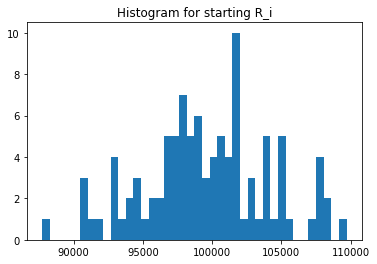

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([205026.15838291, 298949.55696897, 197940.55696897, 197933.55696897,
       290087.54670838, 192124.54670838, 299121.02504613, 198106.02504613,
       299694.92959212, 201638.92959212, 199009.52646098, 197106.02504613,
       196933.55696897, 203600.92959212, 201626.92959212, 311872.50560268,
       204790.10004113, 305773.10004113, 210918.50560268, 209918.50560268,
       204339.1181547 , 203790.10004113, 290881.78007047, 189833.78007047,
       210924.50560268, 305323.1181547 , 204338.1181547 , 203338.1181547 ,
       194086.54670838, 192113.54670838, 204791.10004113, 305672.93714272,
       209526.93714272, 203227.81539571, 199865.15747294, 197891.15747294,
       295923.15747294, 207551.93714272, 321307.93685308, 207559.93714272,
       220406.93685308, 301304.81539571, 203221.81539571, 197903.15747294,
       198998.52646098, 200972.52646098, 189818.48203475, 195076.18998545,
       194076.18998545, 297041.52646098, 296107.18998545, 198107.02504613,
       287763.48203475, 1

In [24]:
experiments.UNI_Si.unique()

array([10000., 15103., 15099., 14863., 14786., 14931., 15323., 14942.,
       14727., 14953., 14578., 14826., 14926., 15179., 15160., 15082.,
       14933., 15108., 15071., 15311., 14668., 15552., 14997., 15080.,
       15164., 14717., 15147., 15205., 14799., 15401., 14938., 15054.,
       14871., 14772., 14975., 14981., 15153., 15209., 14765., 15142.,
       15024., 15152., 15326., 14872., 15342., 14753., 15081., 14899.,
       14771., 15216., 14665., 15157., 15371., 14870., 15045., 15119.,
       15544., 14886., 15066., 15111., 14889., 14651., 14766., 14934.,
       14878., 15143., 14891., 14777., 14862., 14864., 15084., 15635.,
       14591., 14830., 15059., 15008., 15003., 14949., 14581., 14959.,
       14629., 15090., 15287., 14946., 14928., 15408., 15391., 15252.,
       15177., 15308., 14755., 15047., 15043., 15441., 15026., 14867.,
       15033., 15100., 14968., 15731., 15064., 14821., 14645., 15069.,
       15190., 15004., 14824., 15198., 14929., 15122., 15454., 15259.,
      

In [25]:
experiments.UNI_Qj.unique()

array([186343.73391167, 182913.876189  , 184514.876189  , ...,
       198635.09770342, 183773.12488772, 168321.49646524])

In [26]:
experiments.UNI_Rj.unique()

array([ 93171.86695584, 114837.9380945 , 113837.9380945 , ...,
       103254.54885171, 112364.06244386, 106270.74823262])

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([ 93171.86695584,  97515.57566217, 102395.9380945 ,  95807.31682737,
       104372.20448362,  97209.94026981,  94220.91542352, 100499.18764652,
        96493.42857807,  94830.22166713,  97793.52547021,  92544.11105846,
       109771.47281761, 100343.18845208, 107261.10799307,  93964.97662644,
        95557.59867715, 104011.33182204,  93234.8315986 , 104031.84945424,
       105960.22711168, 111566.92199068, 103335.12804697,  95170.9056478 ,
       103175.76886971, 102975.87383561,  95246.33352613,  92709.88486477,
       101075.54340927, 101495.06244386, 102392.89224575,  92281.73090249,
       101259.54885171, 101143.07354494, 106749.66679158, 103983.98850869,
       103632.18300399,  93614.80685037,  94006.2484466 ,  98889.59447385,
       100926.86210036, 102642.38695564, 101307.07140089, 101167.30410958,
       108052.64221304,  95856.94526681,  96161.77841487,  95509.68609682,
       101475.22332588,  94789.53200103, 102440.15248603, 101746.23127726,
       104148.80135547,  

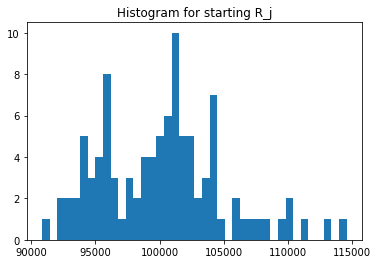

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([102513.07919145,  98466.77848448,  97043.27335419,  98553.01252306,
       101800.46479606, 100486.26323049, 104959.25280134, 101895.05002056,
       101669.05907735,  94410.89003523, 104763.46857136, 102597.90769785,
        99932.57873647, 109697.46842654,  95893.24101737,  97038.09499273,
        98878.1631456 ,  99076.57452013, 100338.00021993,  98376.04253656,
        90545.61599107,  93128.21875062,  96552.74514085, 107598.51912228,
        94621.8066266 , 100555.8056843 ,  98908.32856475, 104995.44809824,
        97316.44990982,  97634.06196207,  97724.53202172, 105286.79281704,
        94851.98731243, 104680.38172341,  91567.2063905 , 101731.84459587,
        99423.78601802, 101632.59194111, 103758.95504834,  97443.51230388,
       100988.54597121, 100859.98339642,  97523.95035638,  96040.57295324,
        96466.94784422, 105424.31550476,  98506.68343208,  92878.31799834,
       103103.66221462, 107664.3768275 ,  97387.58207516,  94081.93986744,
       104195.7937909 , 1

In [31]:
experiments.UNI_ji.unique()

array([ 93171.86695584, 102395.9380945 , 100499.18764652,  97515.57566217,
        95807.31682737,  97793.52547021, 104372.20448362,  97209.94026981,
        94220.91542352,  95170.9056478 ,  96493.42857807,  92709.88486477,
        94830.22166713, 100343.18845208, 109771.47281761,  92544.11105846,
        95557.59867715, 104011.33182204, 107261.10799307,  93964.97662644,
       114559.43301381,  93234.8315986 , 101075.54340927, 104031.84945424,
       105960.22711168, 111566.92199068, 103175.76886971, 103335.12804697,
       102975.87383561,  95246.33352613,  94006.2484466 , 101475.22332588,
       102394.70760902, 102392.89224575, 101495.06244386, 102642.38695564,
        92281.73090249, 101259.54885171, 101143.07354494, 102440.15248603,
        94034.8428942 , 106749.66679158, 103632.18300399,  98889.59447385,
       103983.98850869,  93614.80685037, 100926.86210036, 101307.07140089,
       101167.30410958,  94789.53200103,  95856.94526681, 108052.64221304,
        95509.68609682,  

In [32]:
experiments.UNI_Sij.unique()

array([9.55133498e+09, 1.00825982e+10, 9.75277014e+09, 9.61045375e+09,
       9.75322938e+09, 9.82690594e+09, 1.09548286e+10, 9.90521173e+09,
       9.57935182e+09, 8.98516991e+09, 1.01089863e+10, 9.51184021e+09,
       9.47662859e+09, 1.10073937e+10, 1.05263423e+10, 8.98030424e+09,
       9.44855983e+09, 1.03050865e+10, 1.07623651e+10, 9.24390254e+09,
       1.03728544e+10, 8.68279379e+09, 9.75912118e+09, 1.11936729e+10,
       1.00261481e+10, 1.12187017e+10, 1.02049428e+10, 1.08497181e+10,
       1.00212465e+10, 9.29928643e+09, 9.18671664e+09, 1.06840008e+10,
       9.71234151e+09, 1.07185270e+10, 9.29361933e+09, 1.04419994e+10,
       9.17499907e+09, 1.02912704e+10, 1.04944996e+10, 9.98212826e+09,
       9.49644205e+09, 1.07667696e+10, 1.01066199e+10, 9.49741331e+09,
       1.00310180e+10, 9.86927693e+09, 9.94197045e+09, 9.40923039e+09,
       1.04307196e+10, 1.02054559e+10, 9.33527612e+09, 1.01658022e+10,
       9.95170756e+09, 9.71706418e+09, 9.98071364e+09, 9.74610495e+09,
      

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


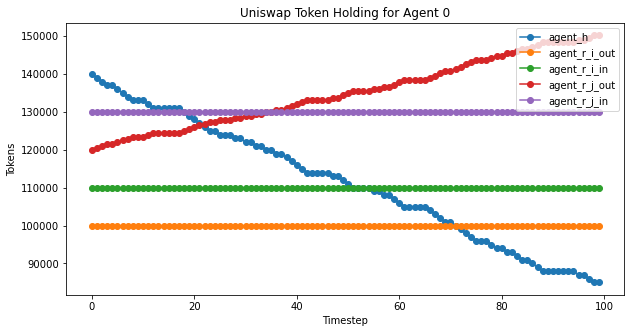

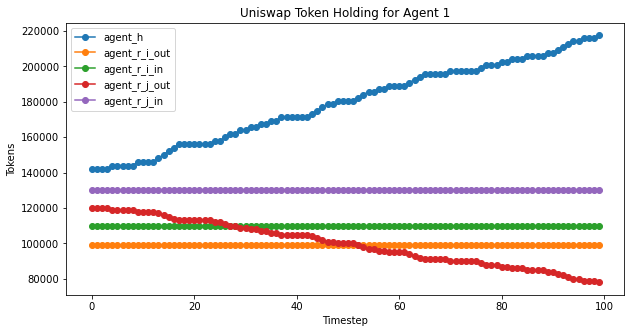

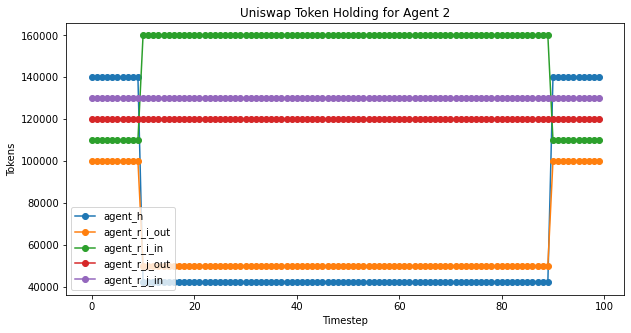

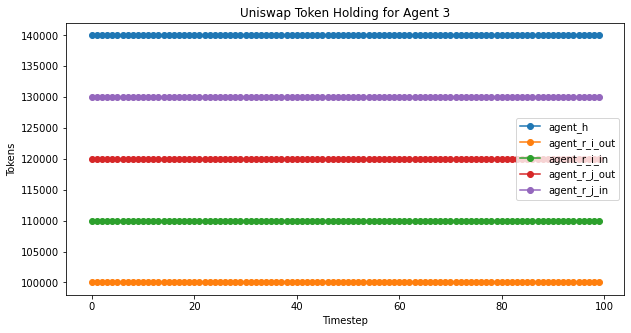

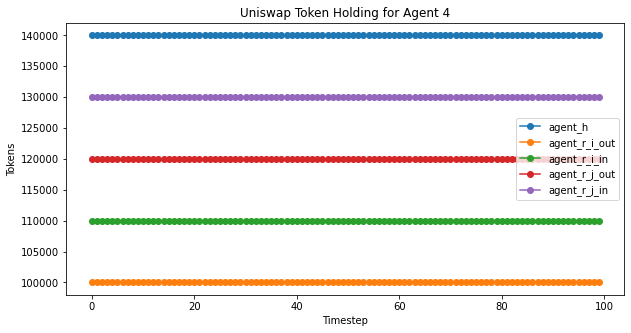

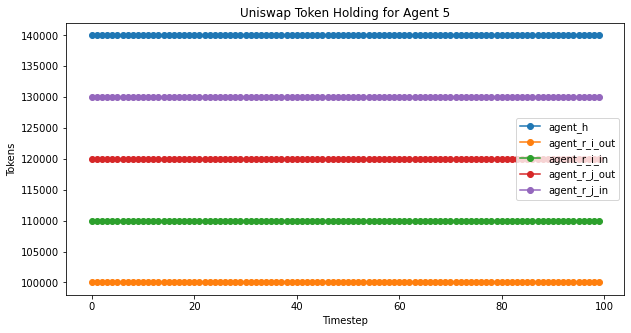

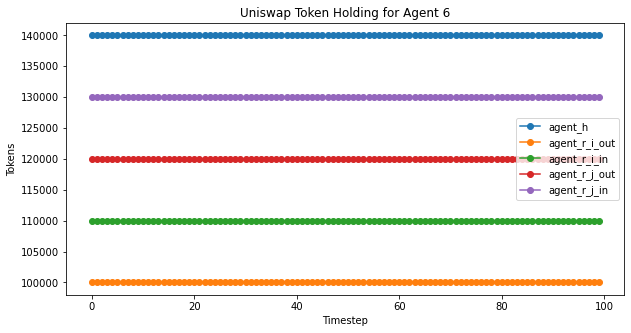

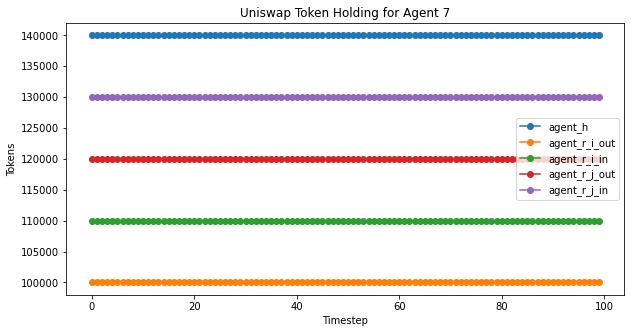

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


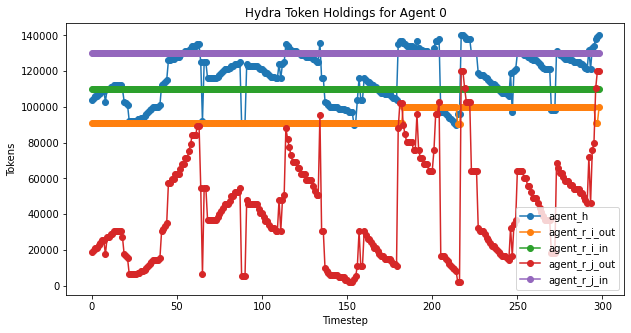

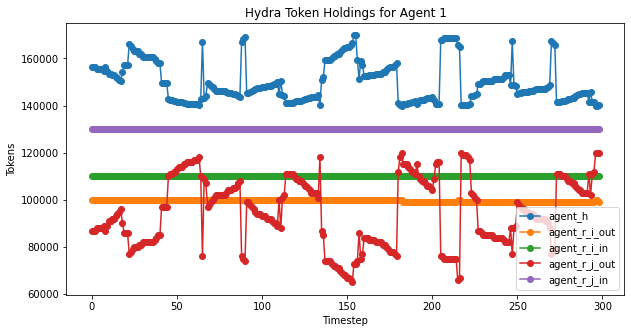

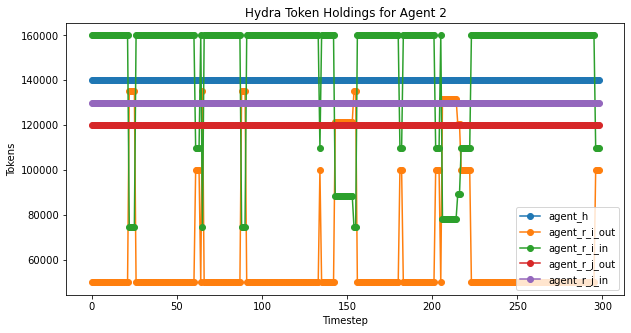

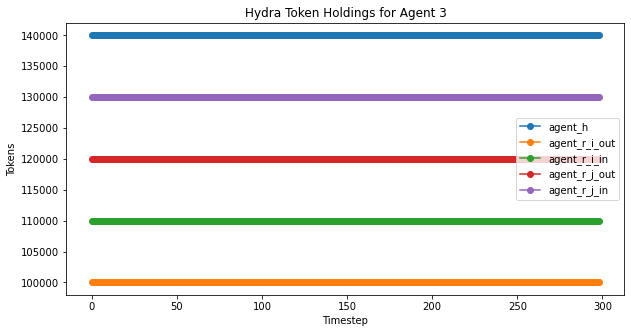

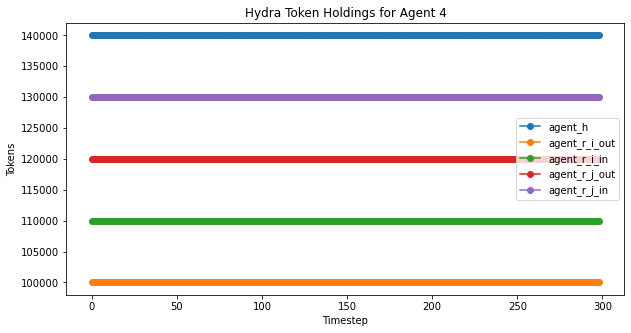

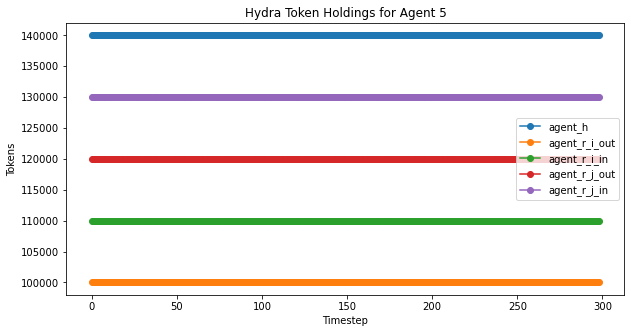

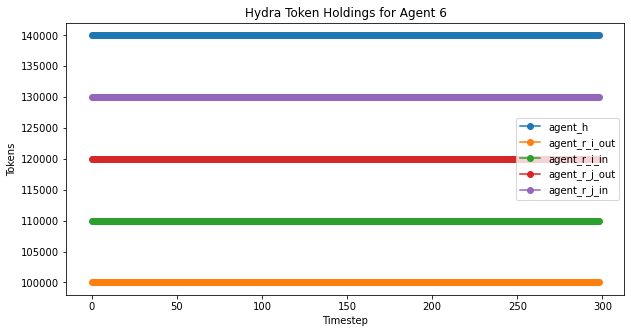

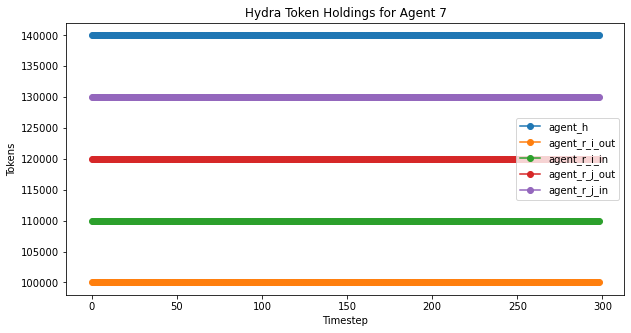

In [35]:
hydra_agent_plot(experiments,'Hydra Token Holdings for Agent ', 299)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

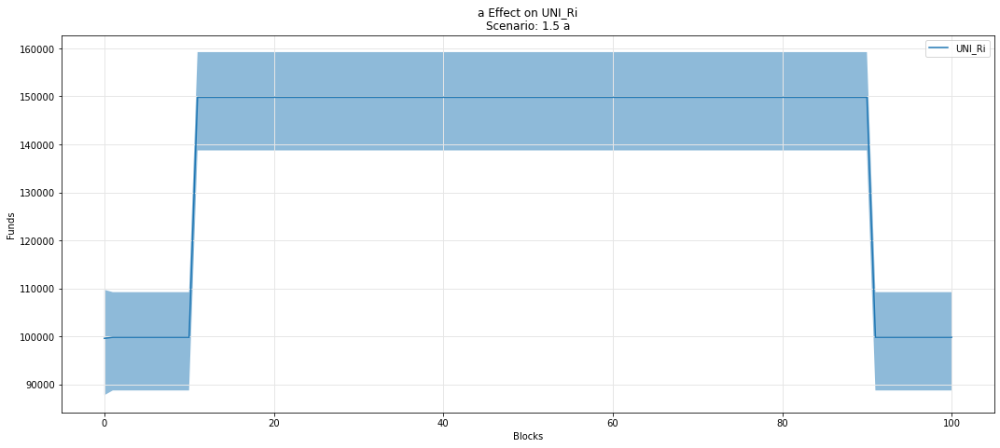

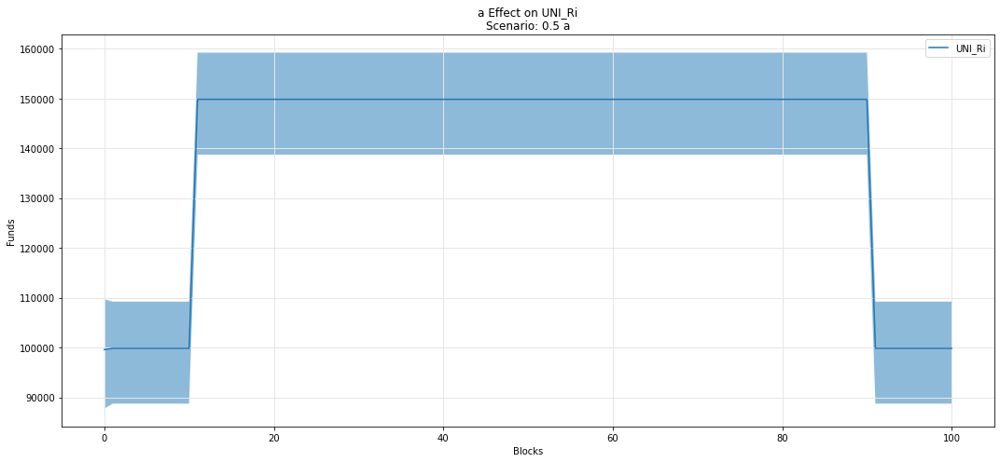

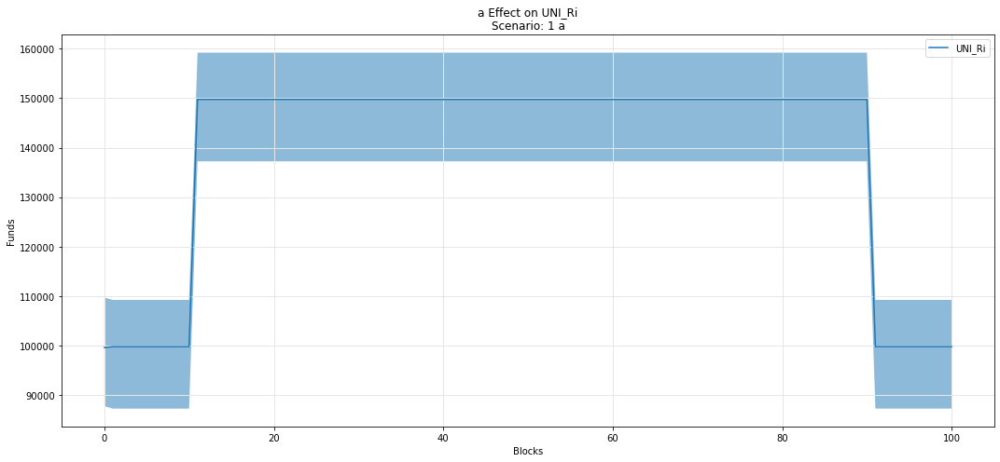

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

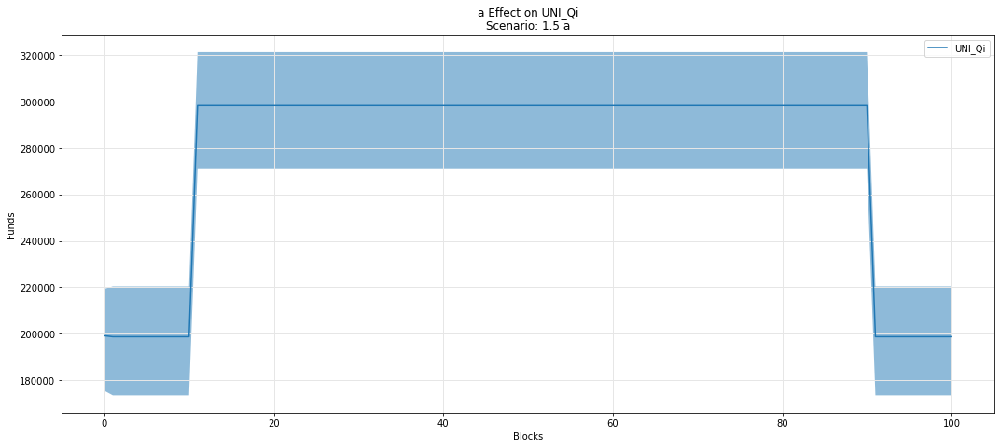

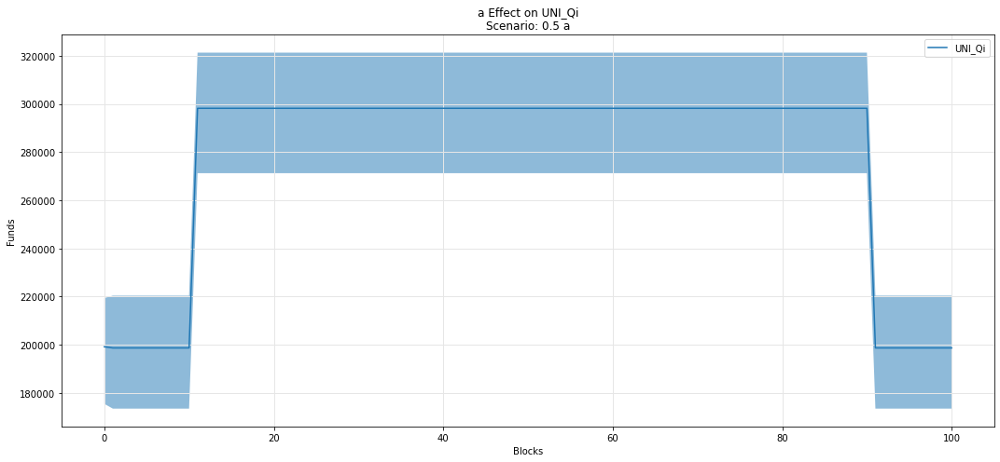

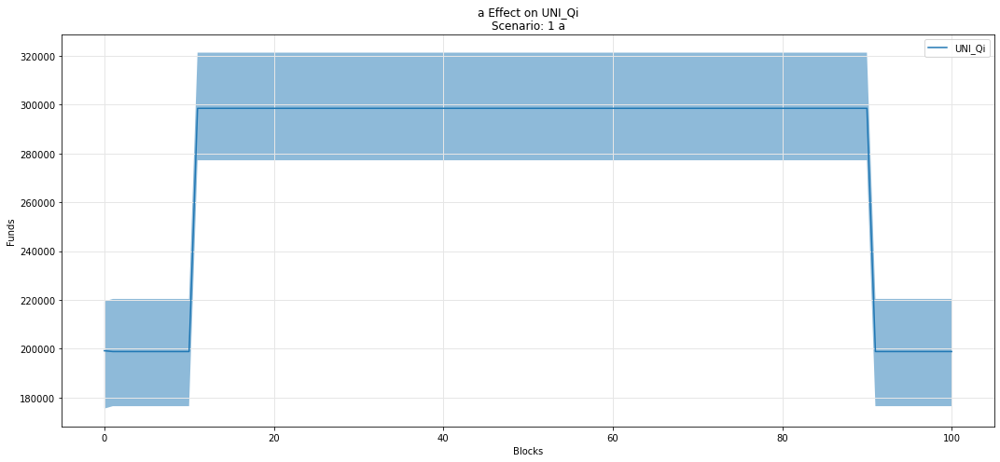

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

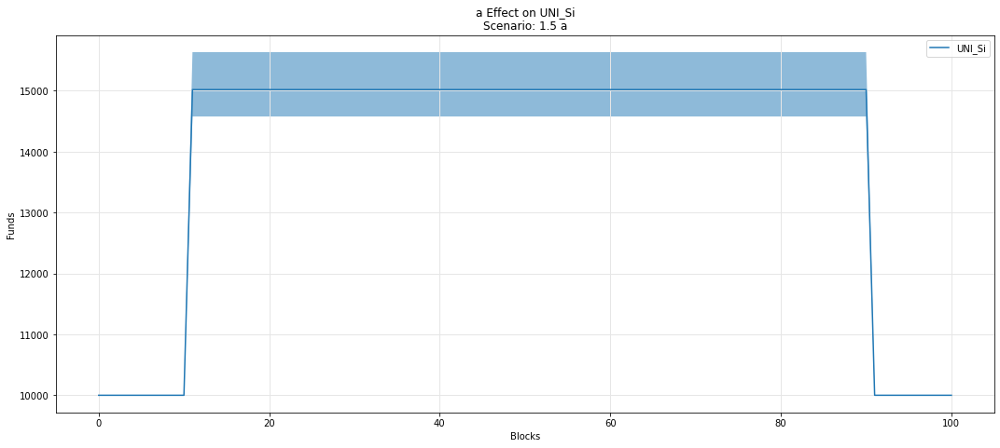

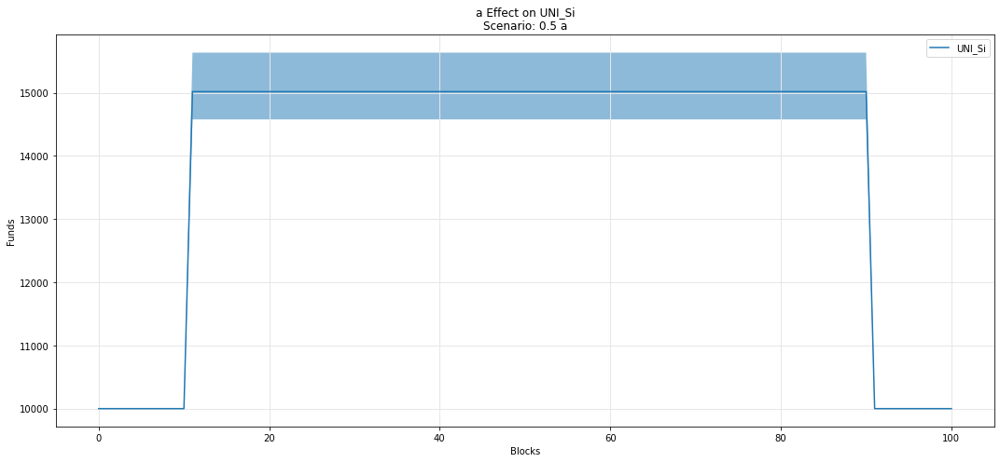

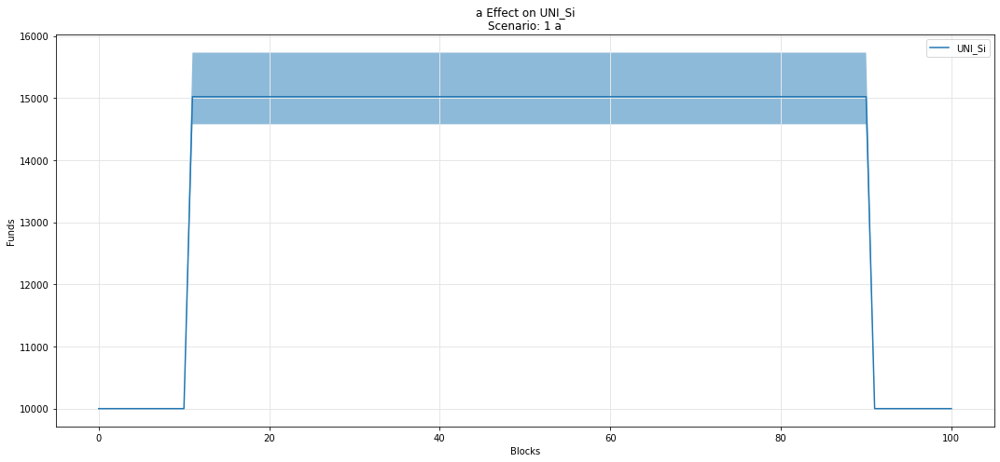

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

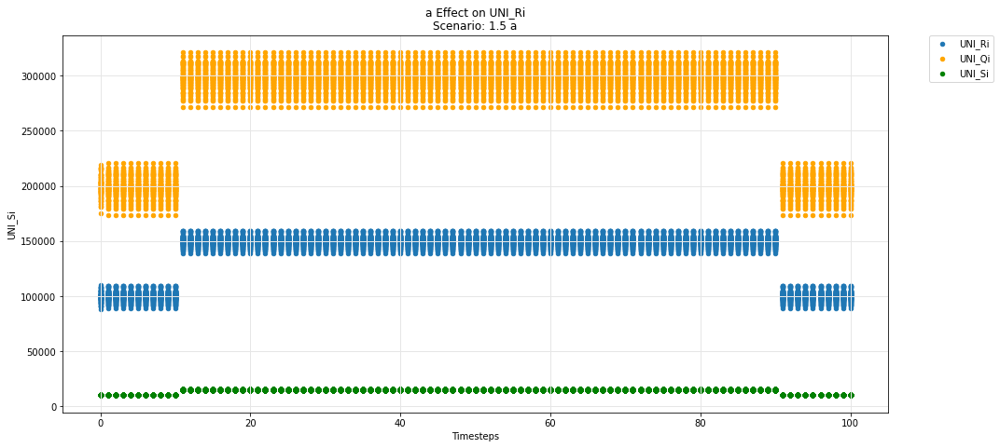

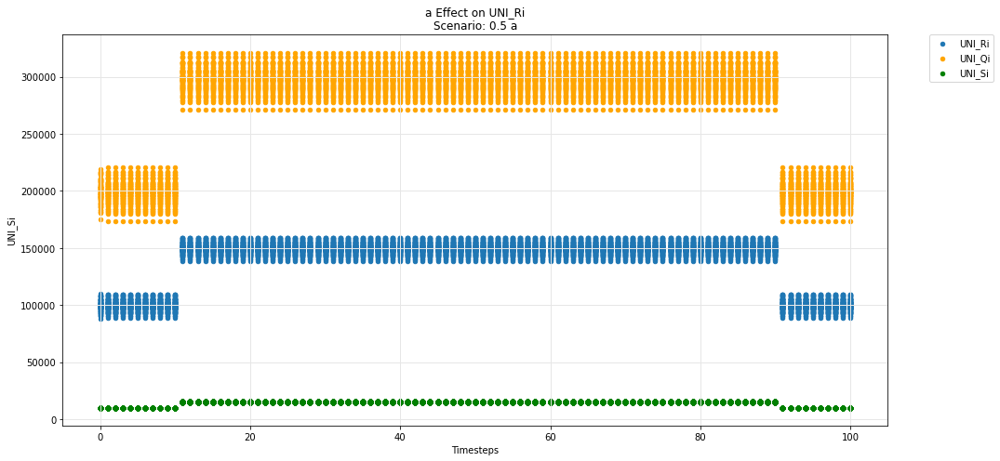

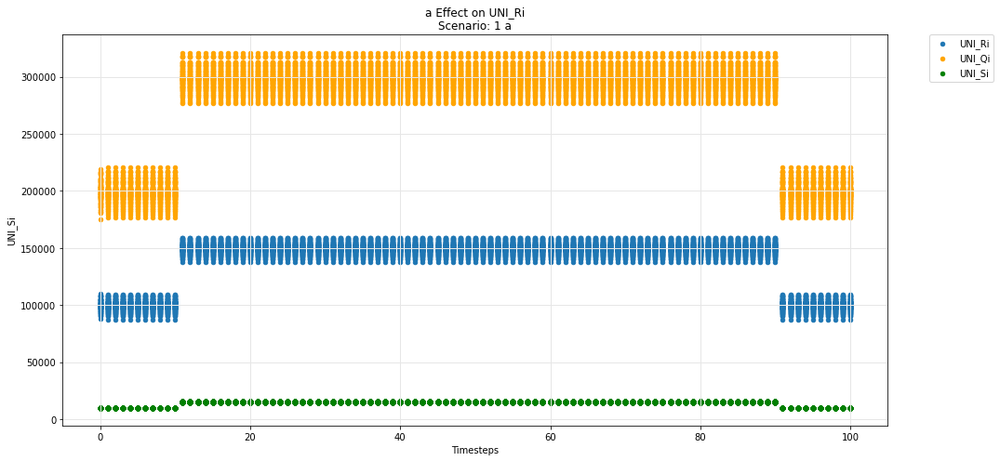

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

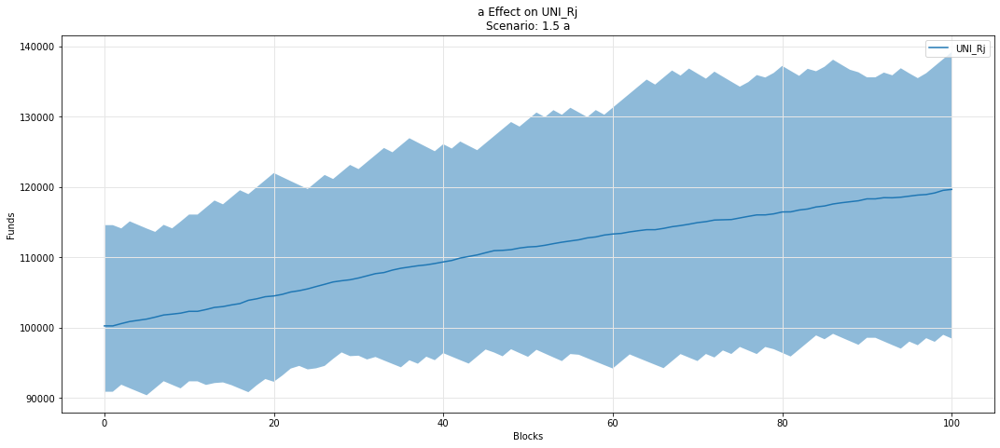

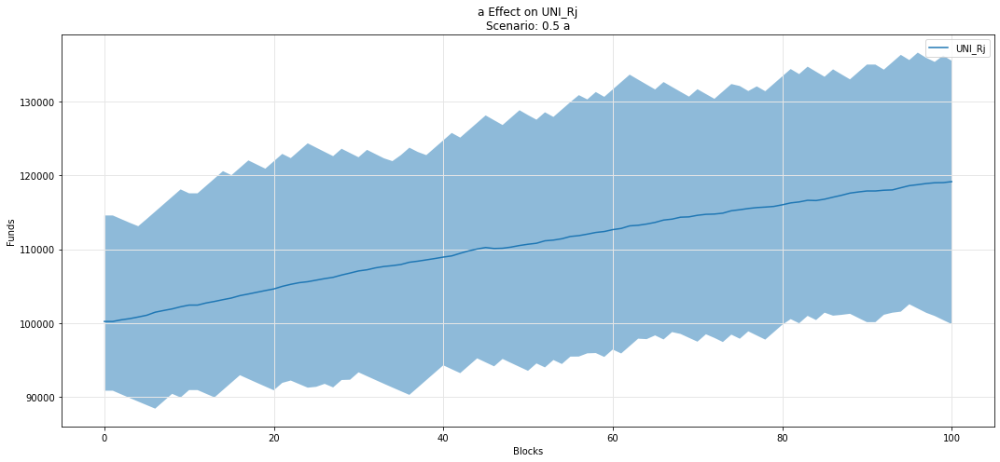

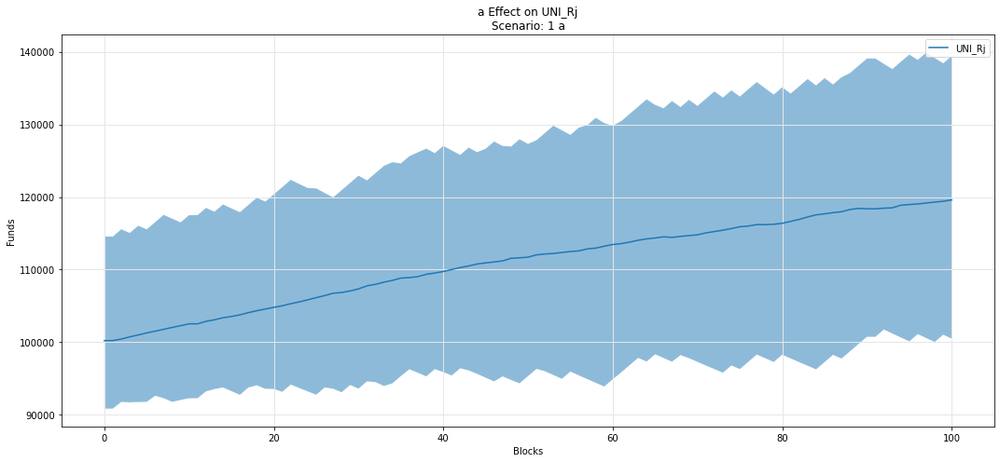

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

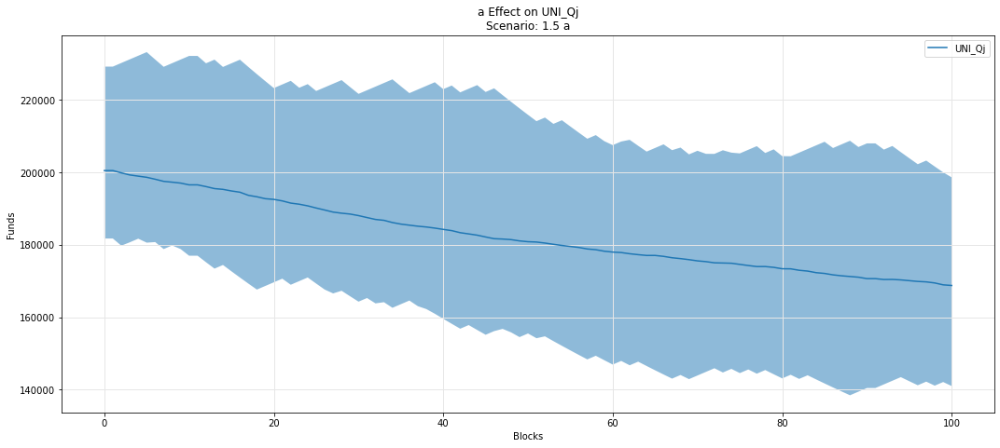

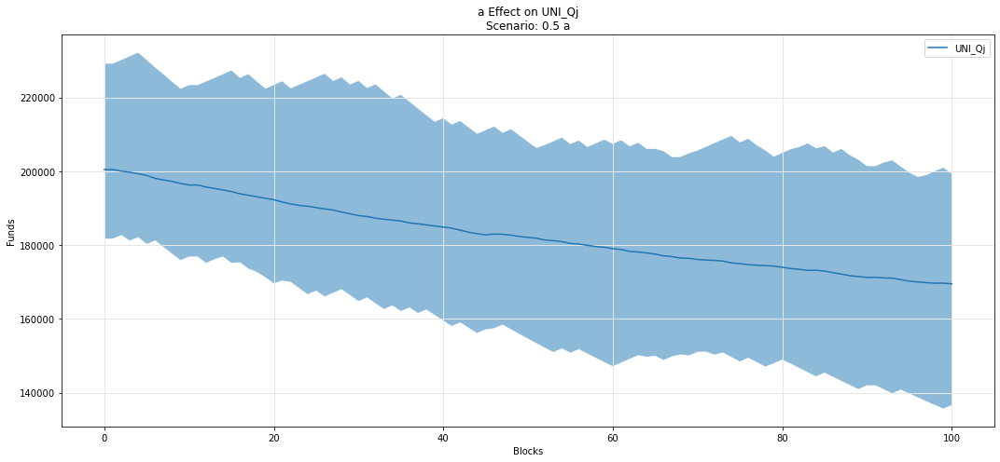

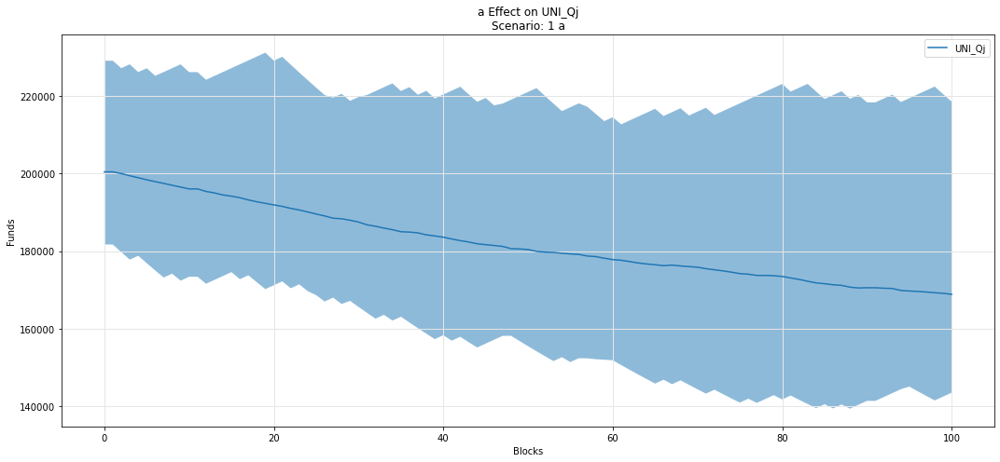

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

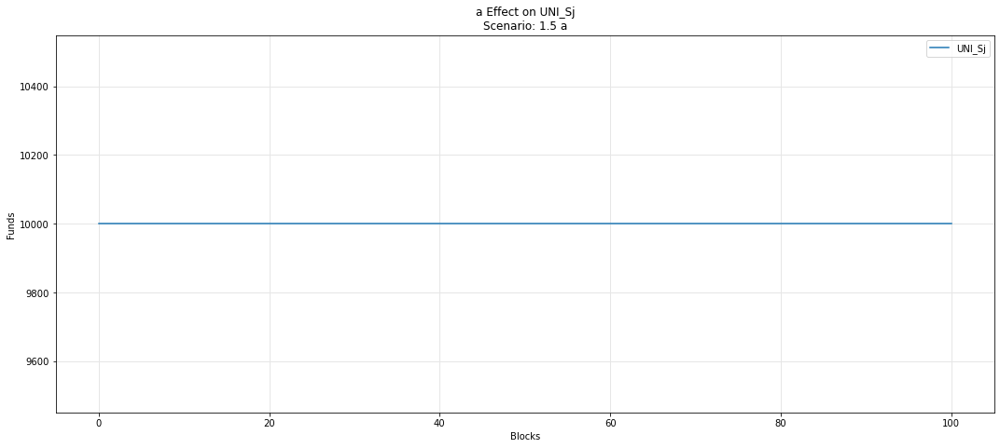

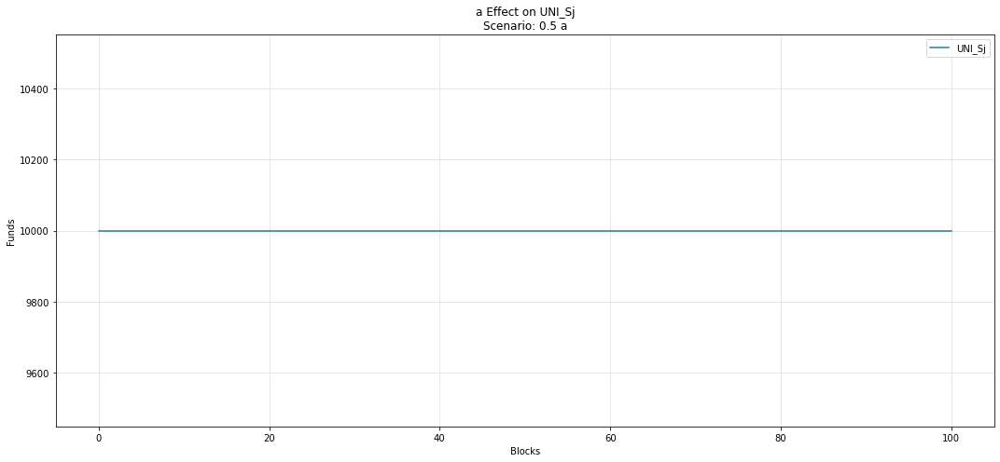

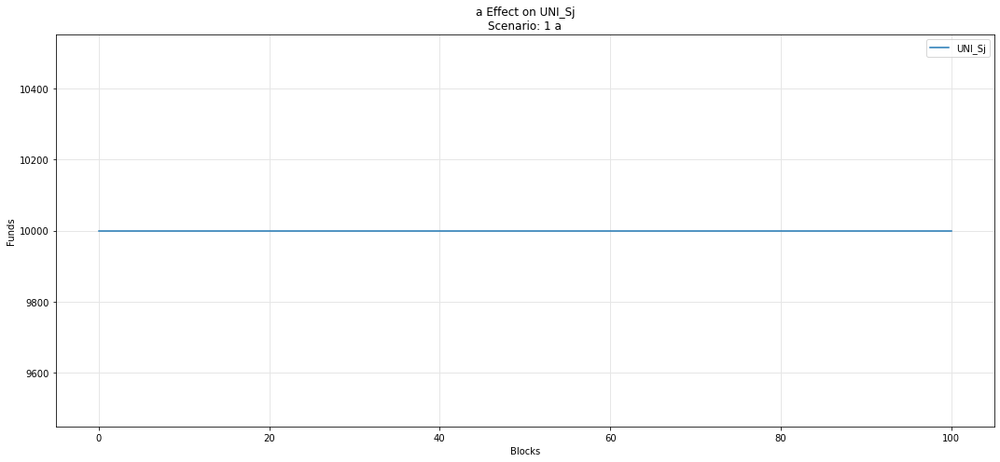

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

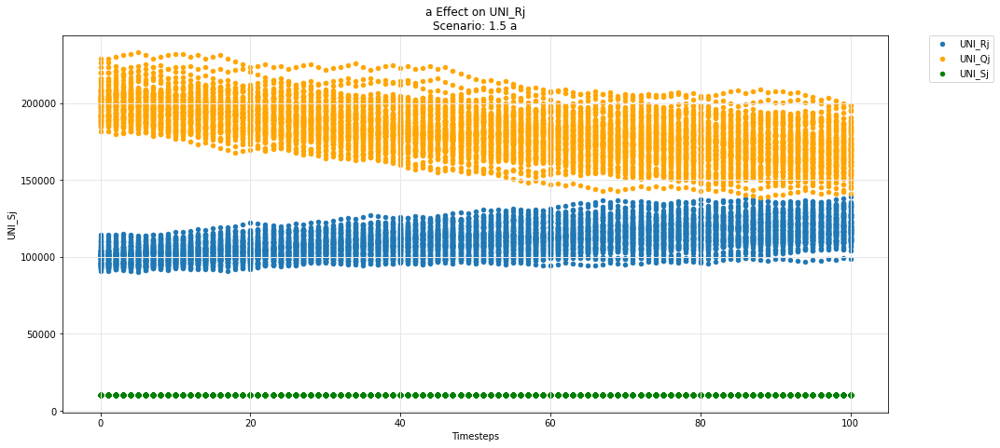

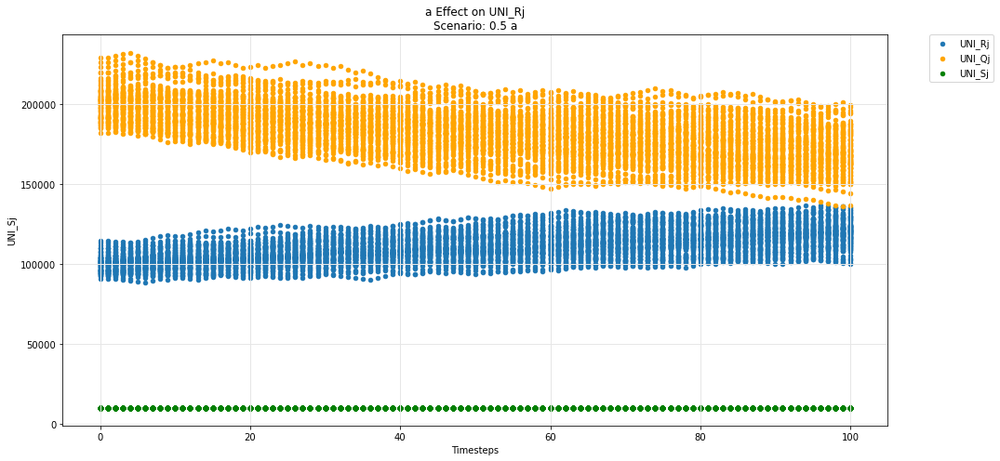

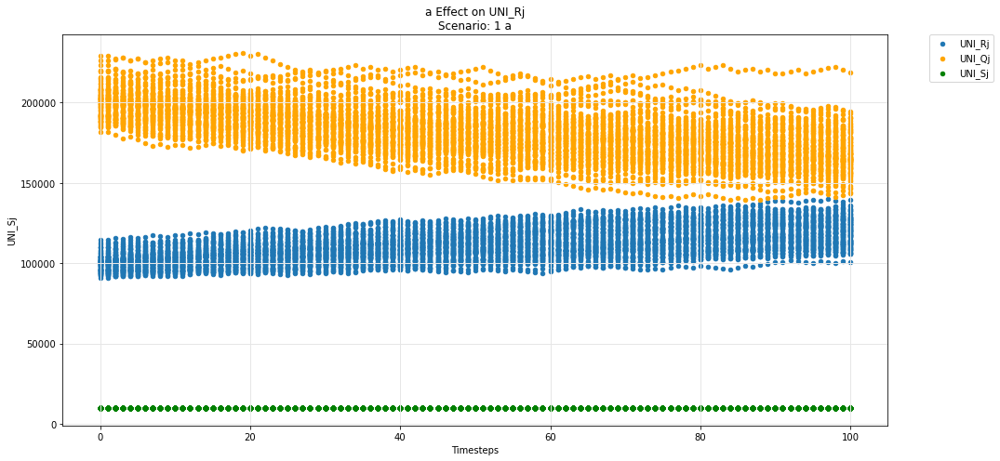

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

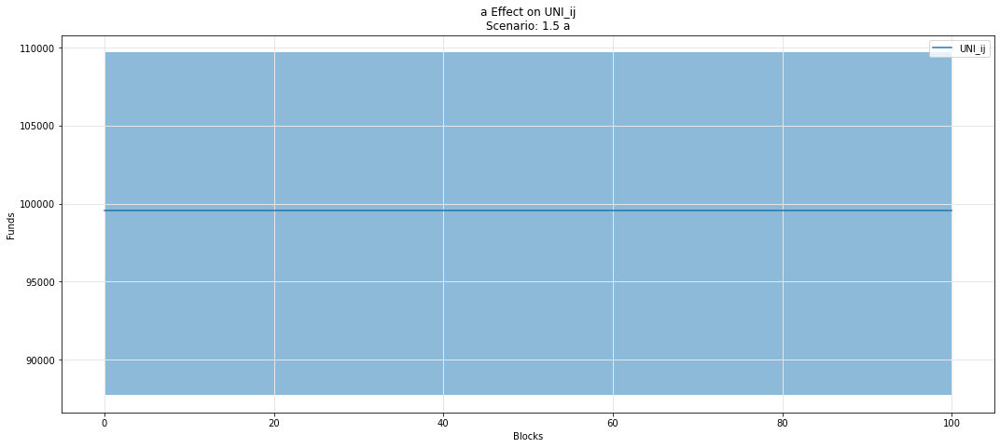

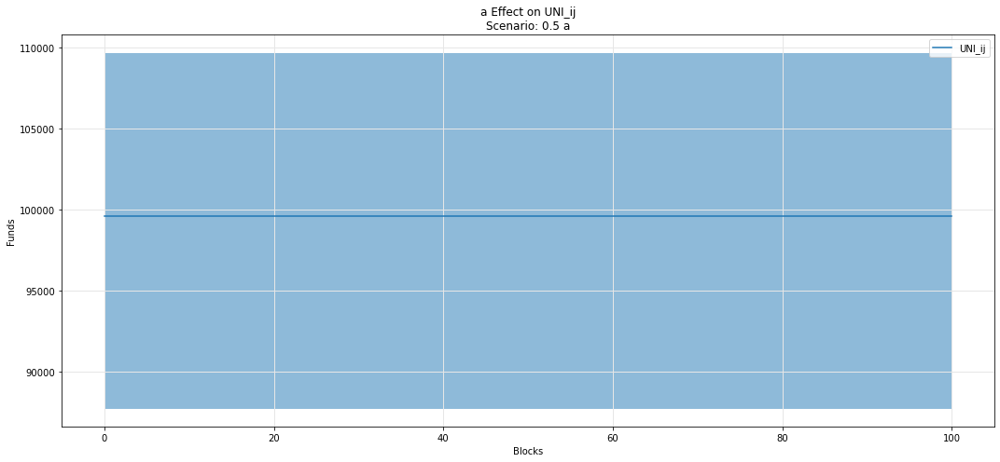

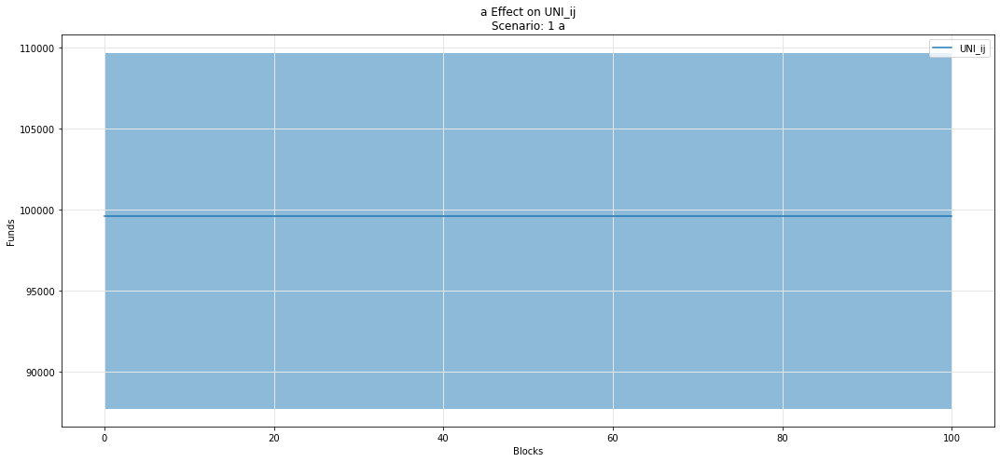

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

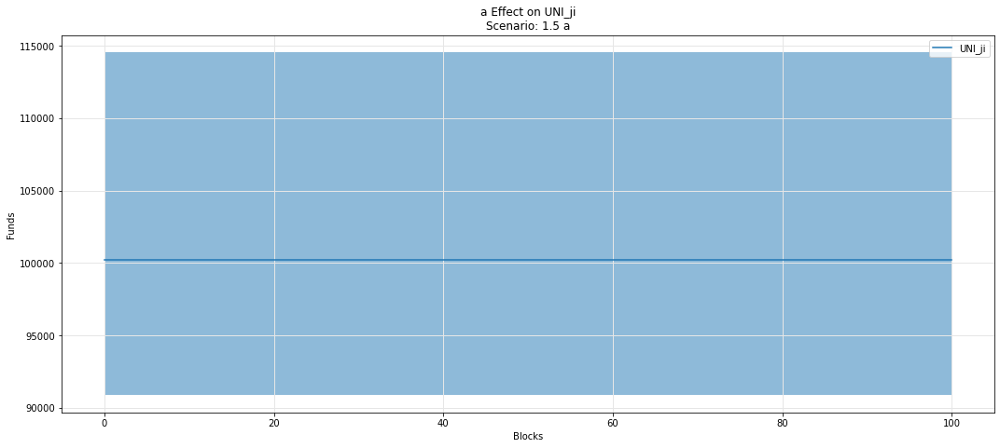

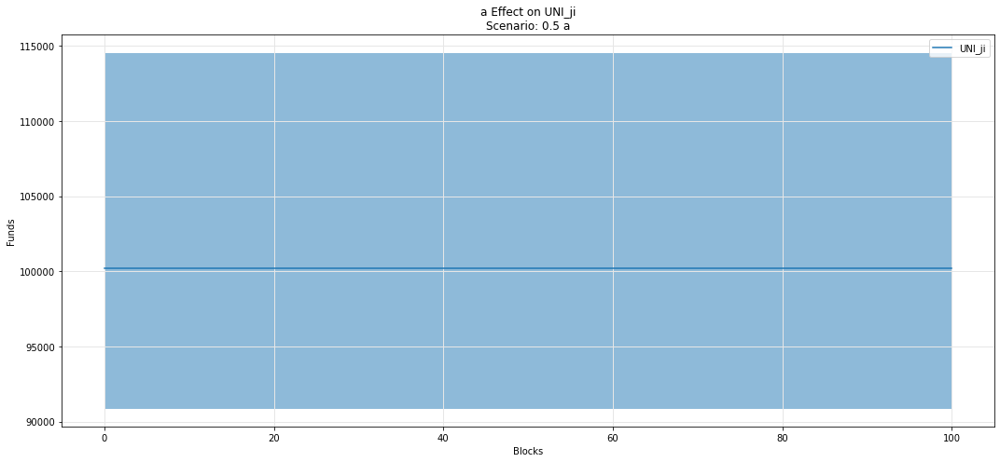

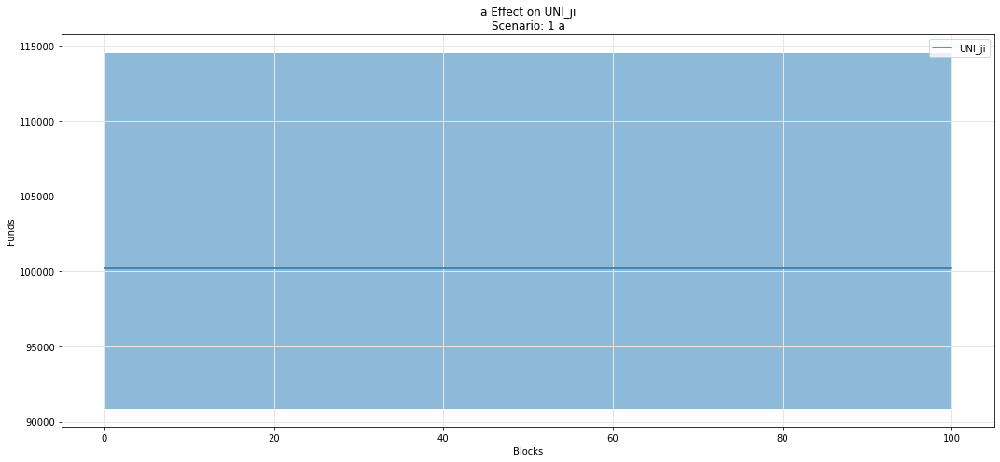

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

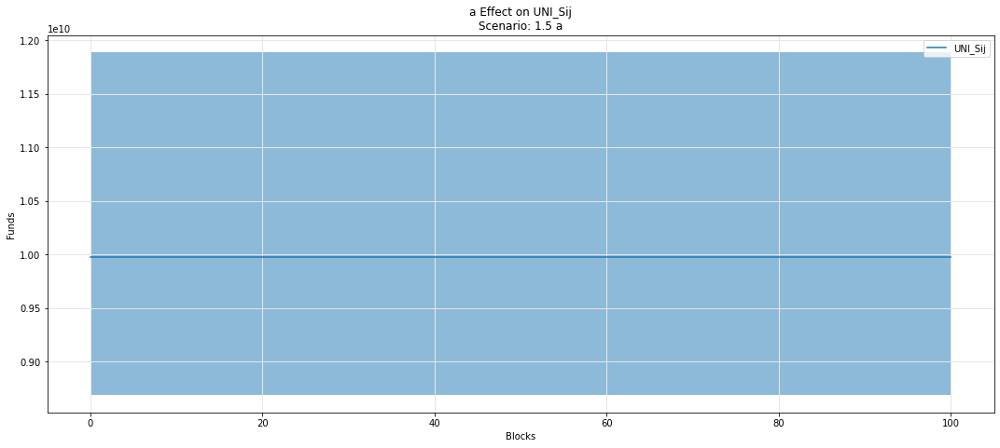

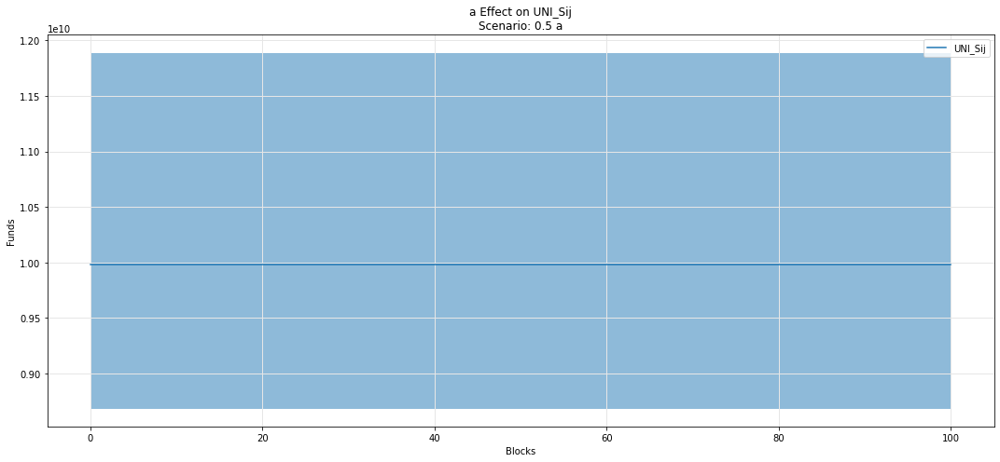

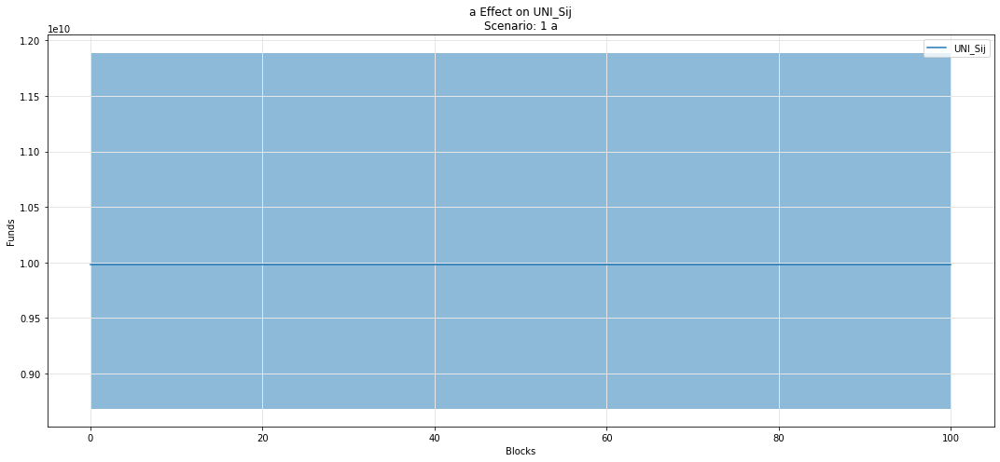

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

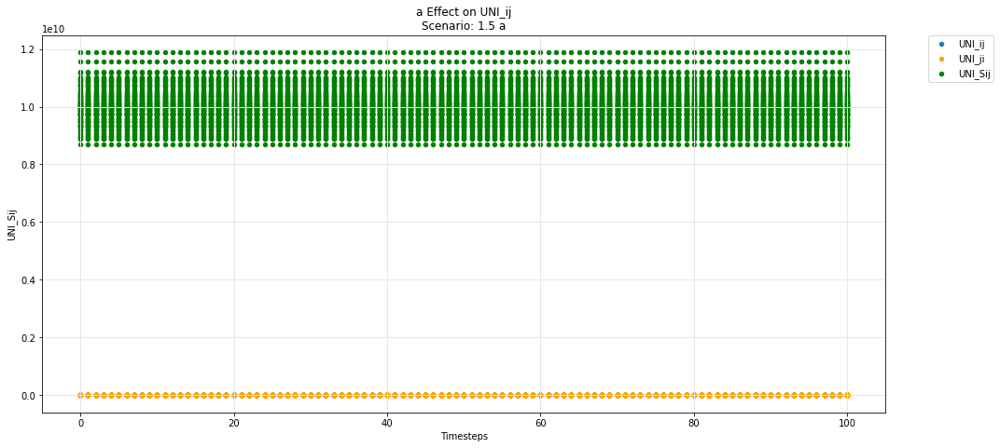

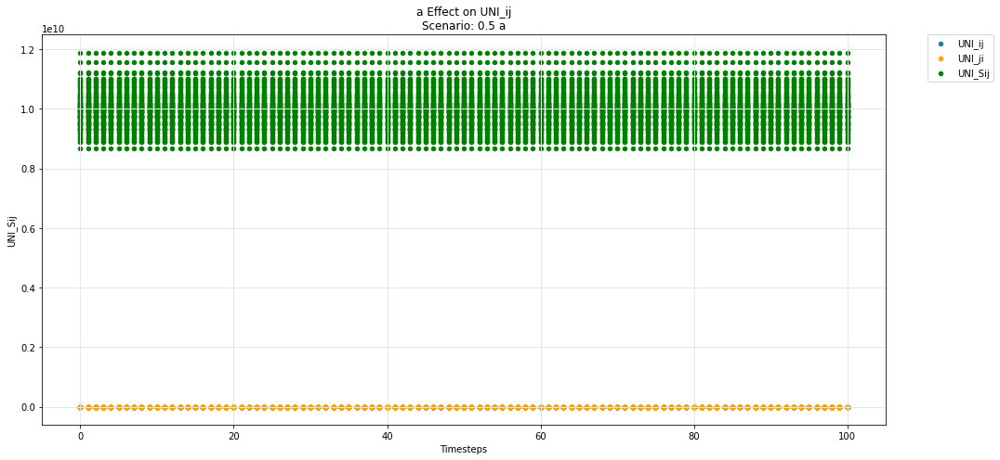

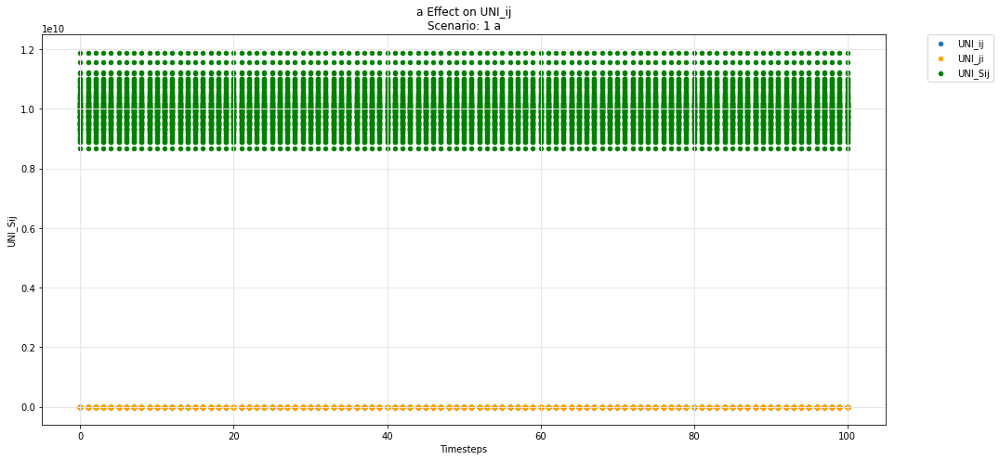

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

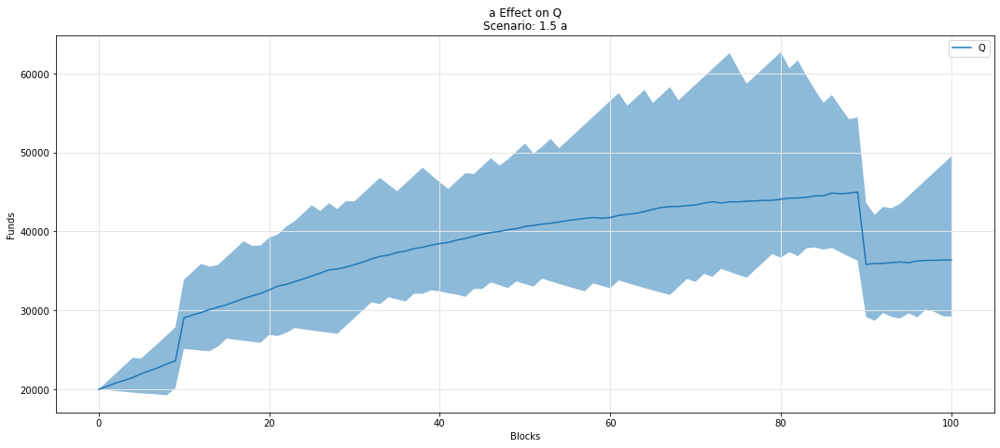

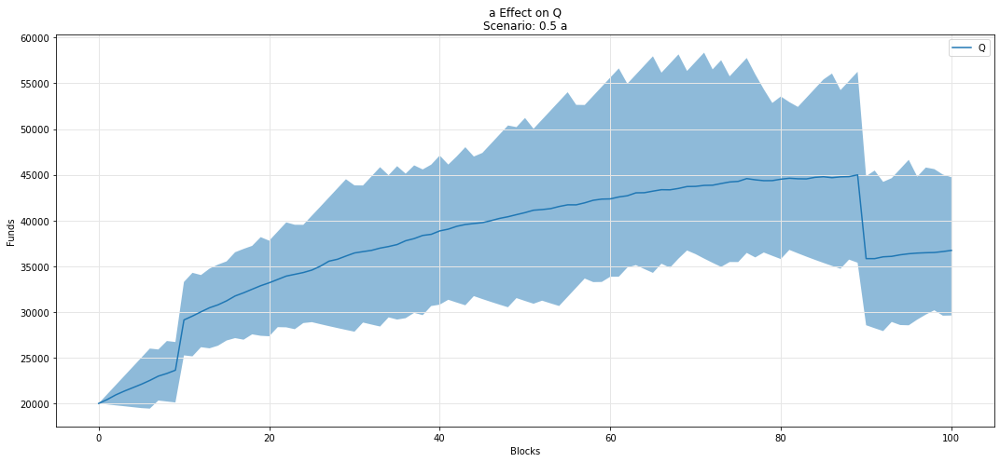

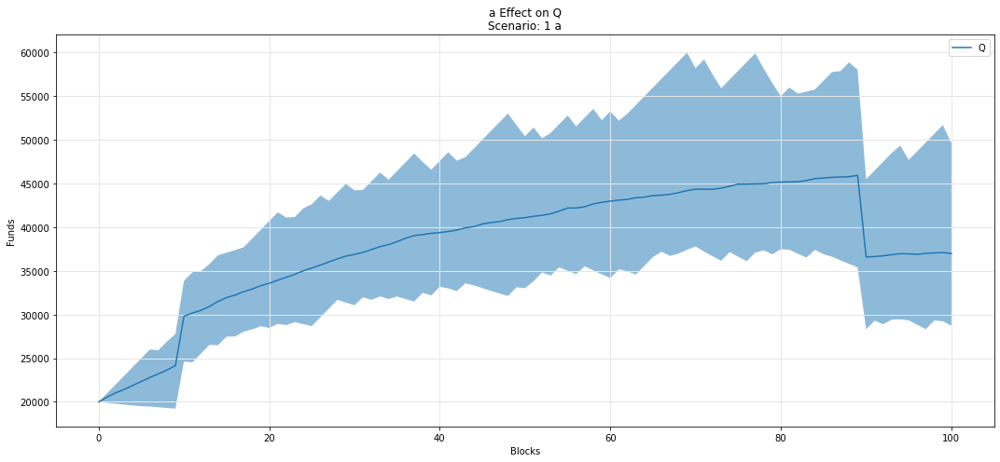

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

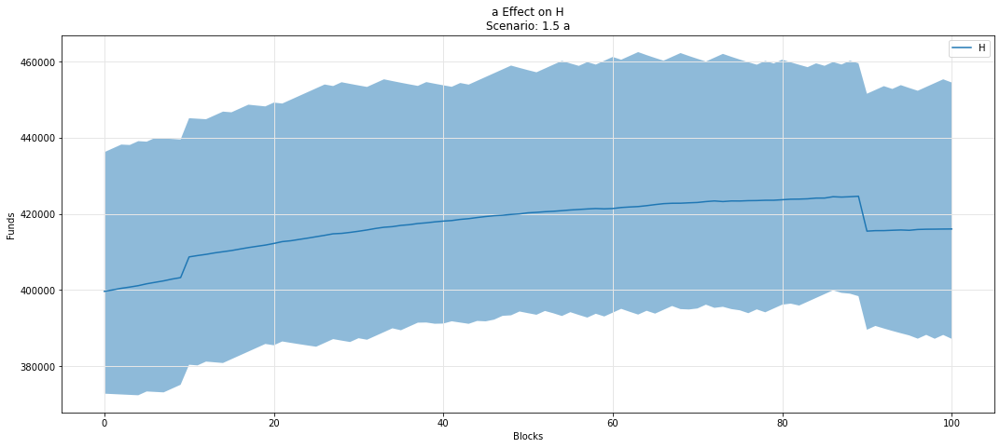

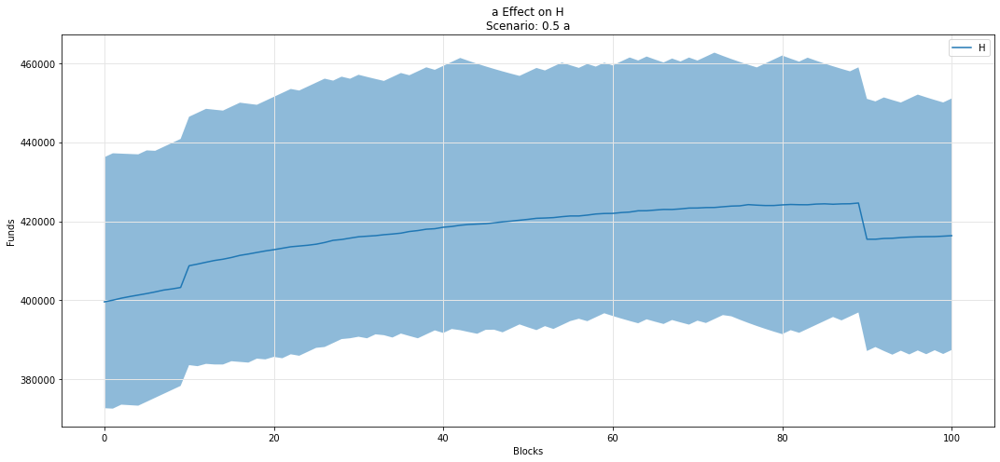

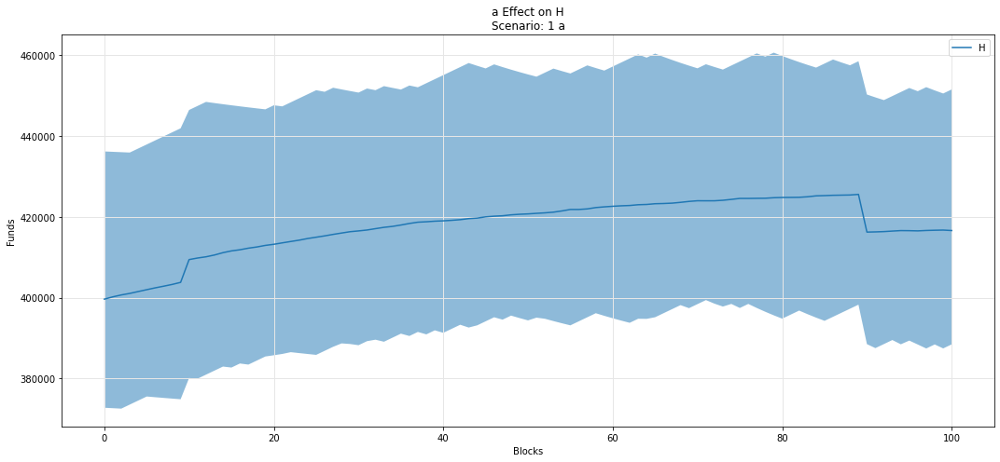

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

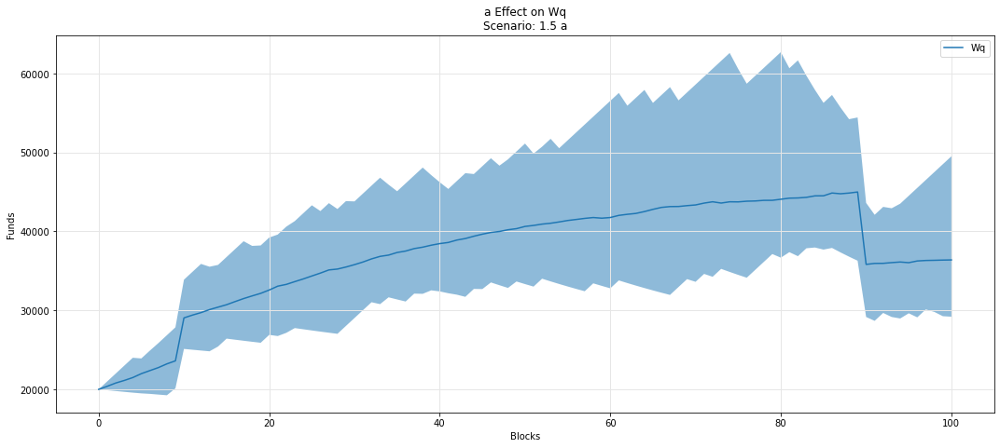

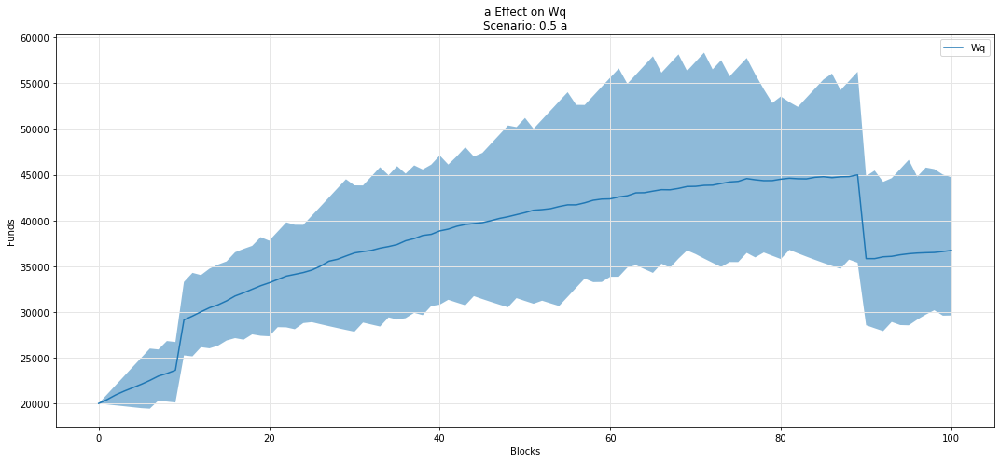

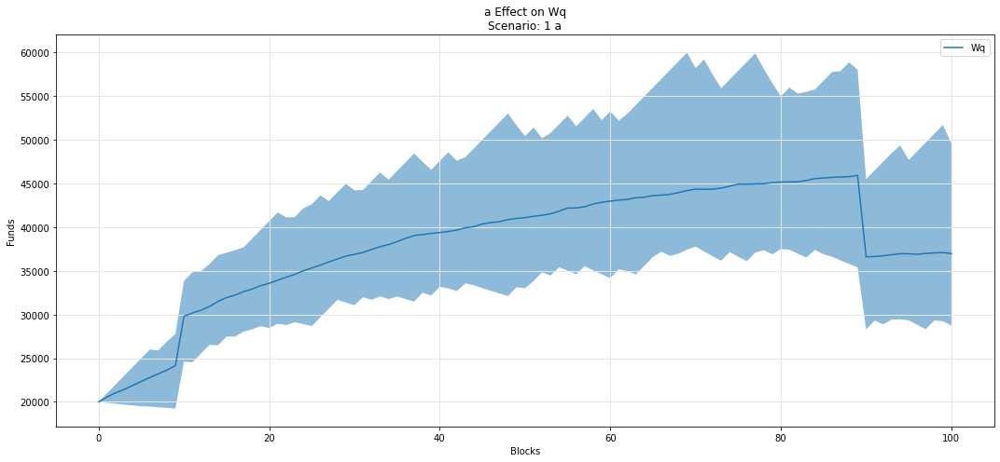

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

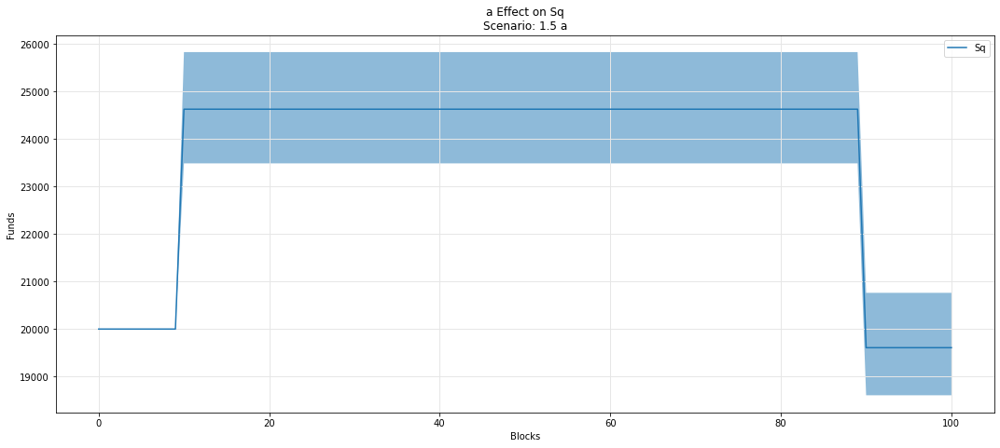

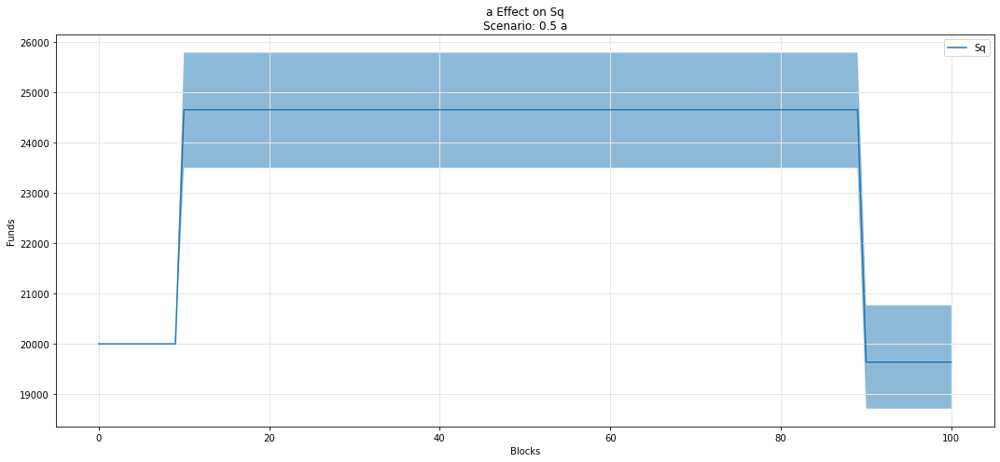

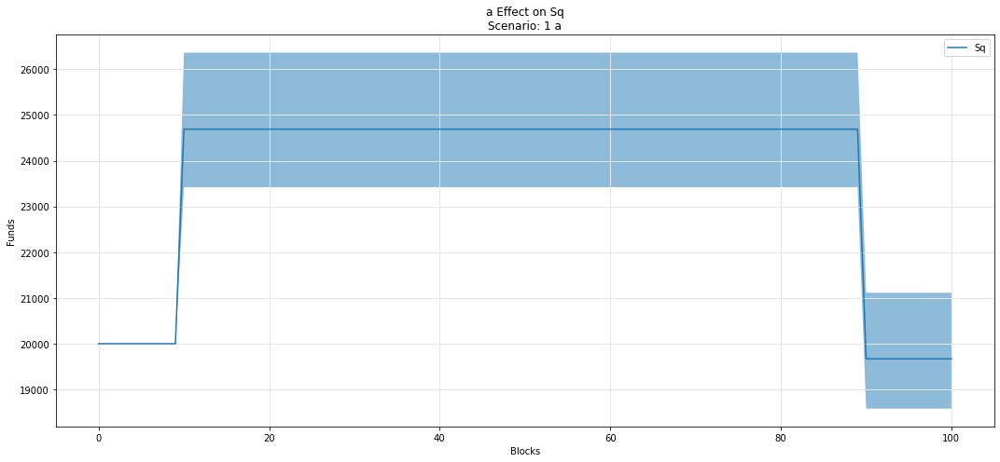

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

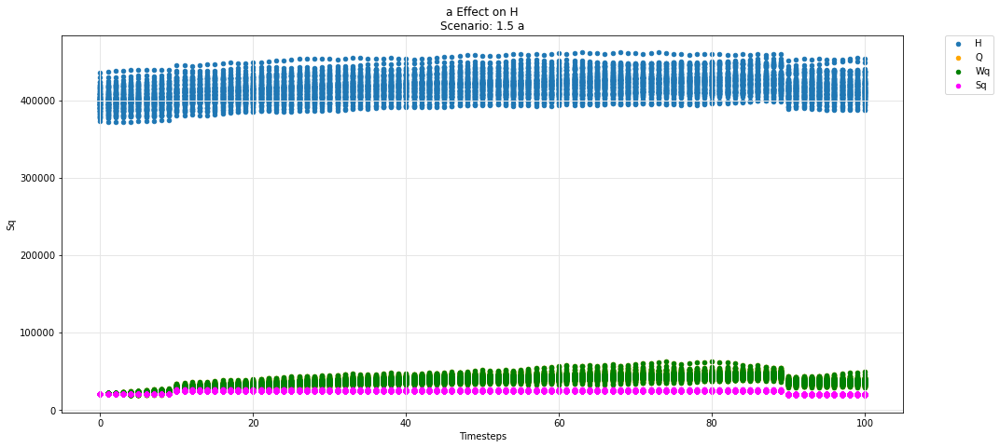

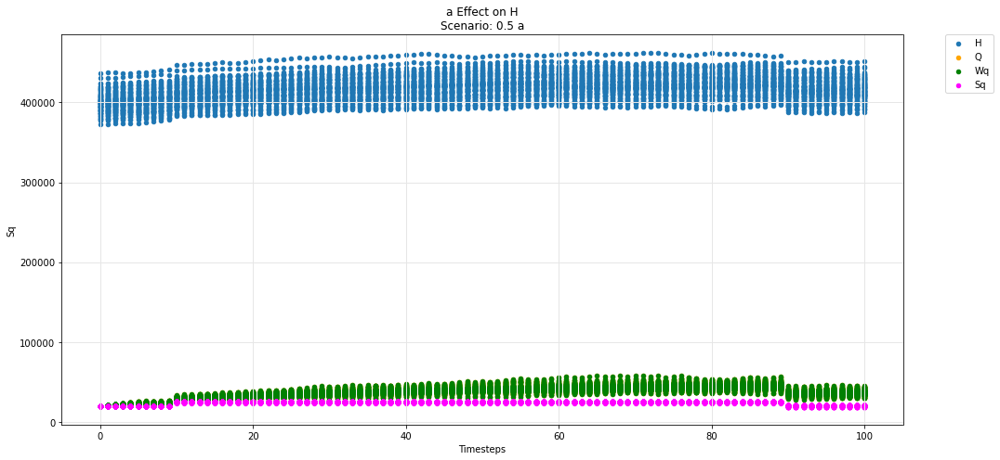

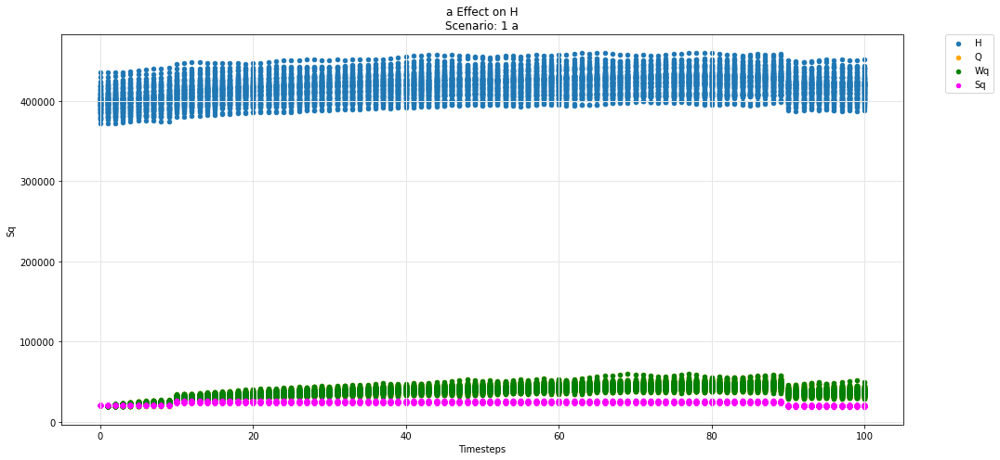

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

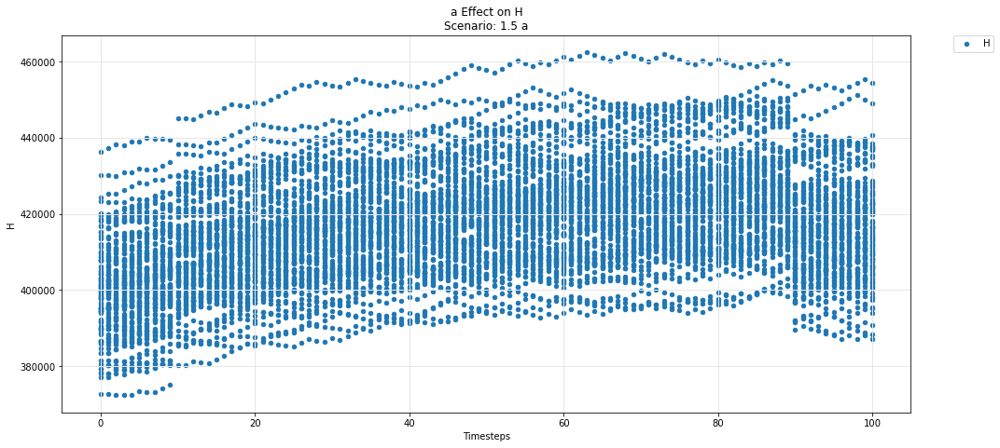

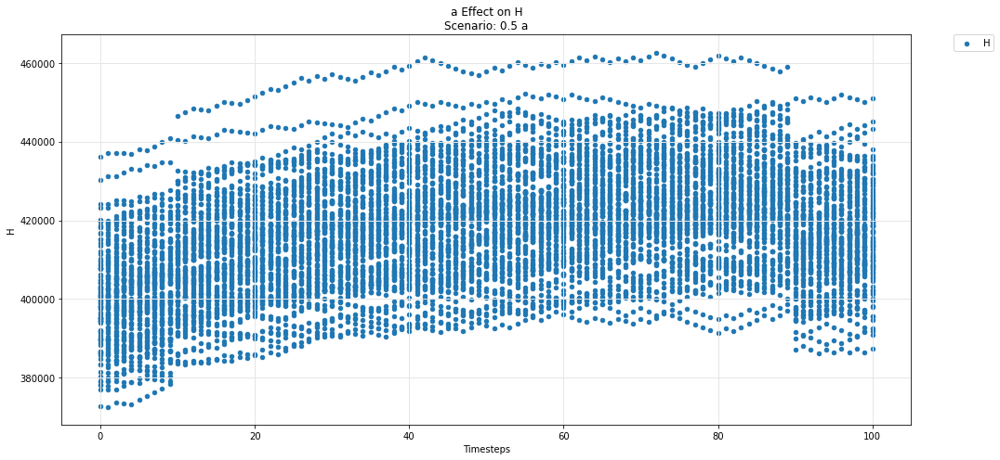

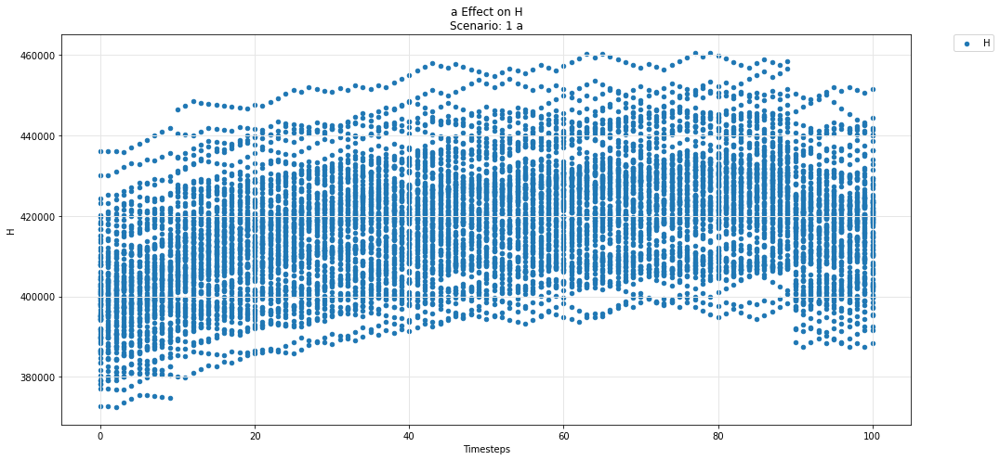

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

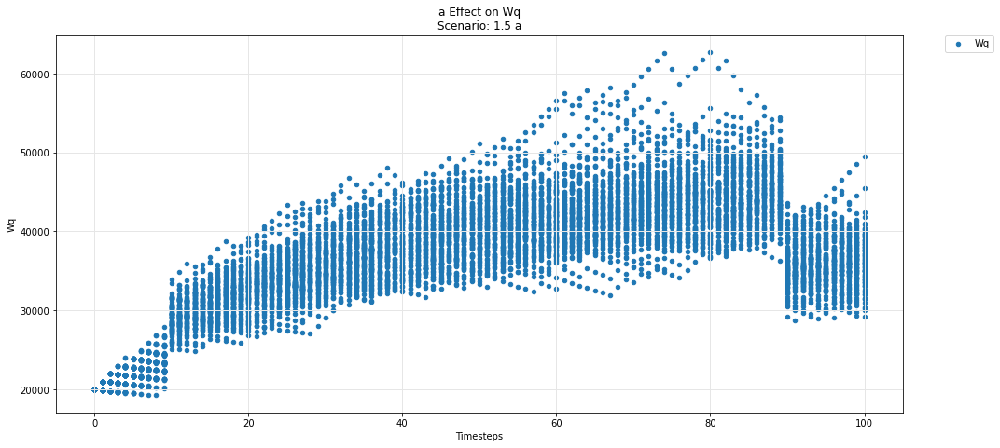

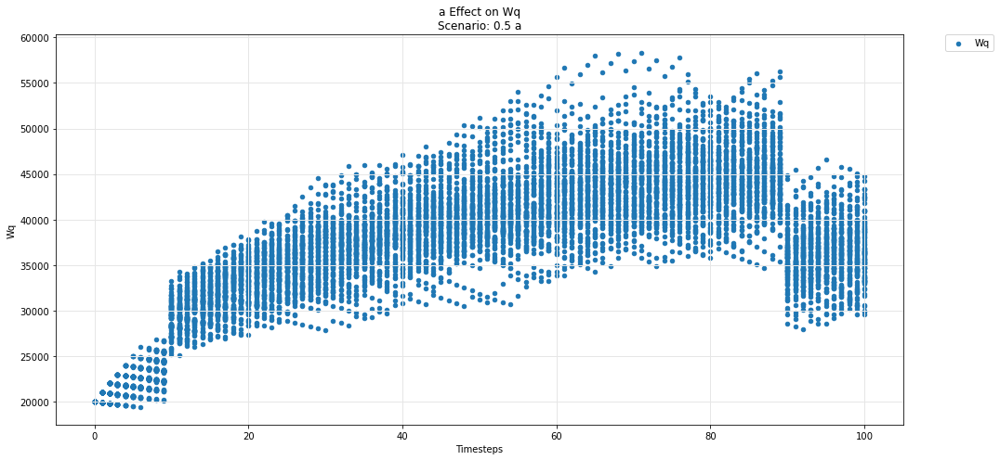

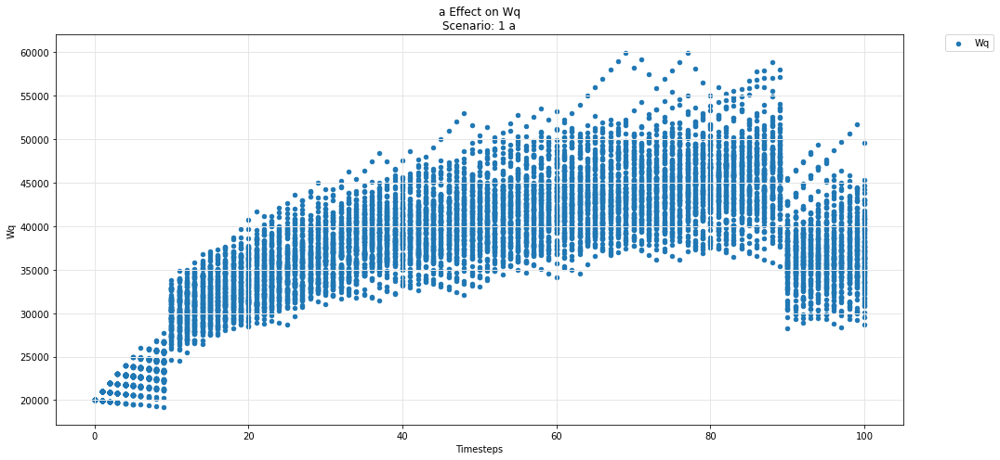

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

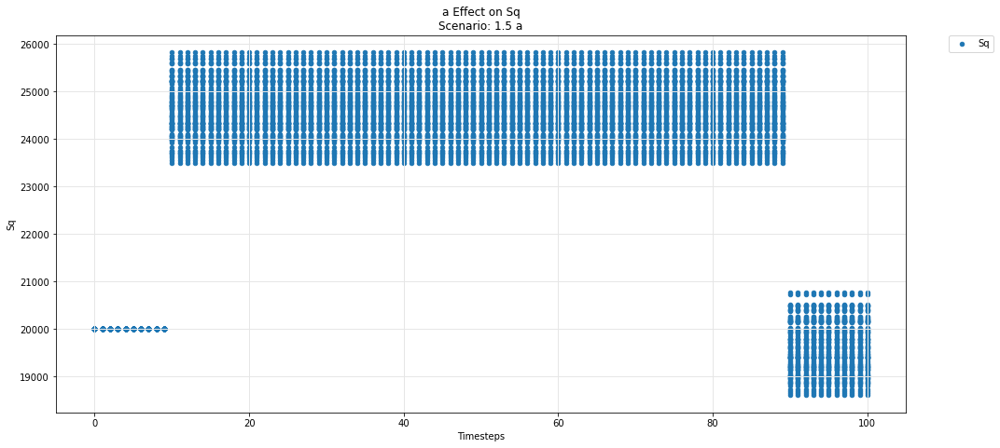

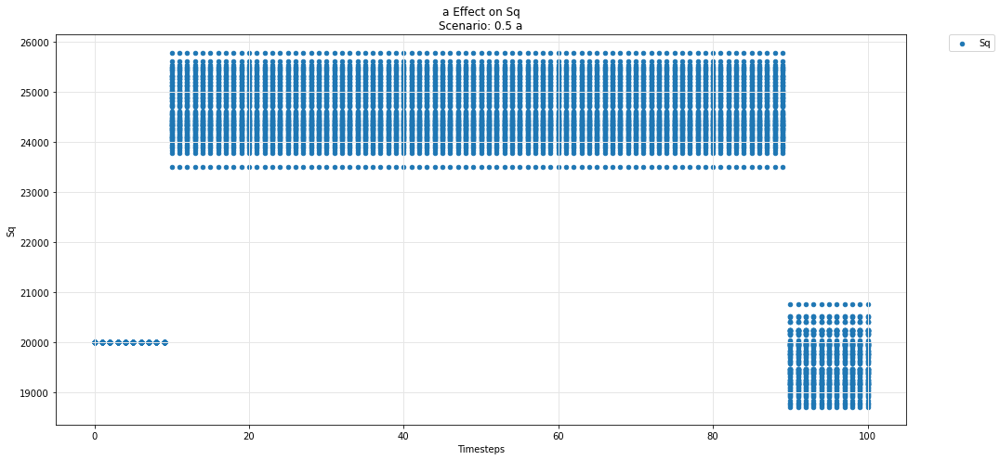

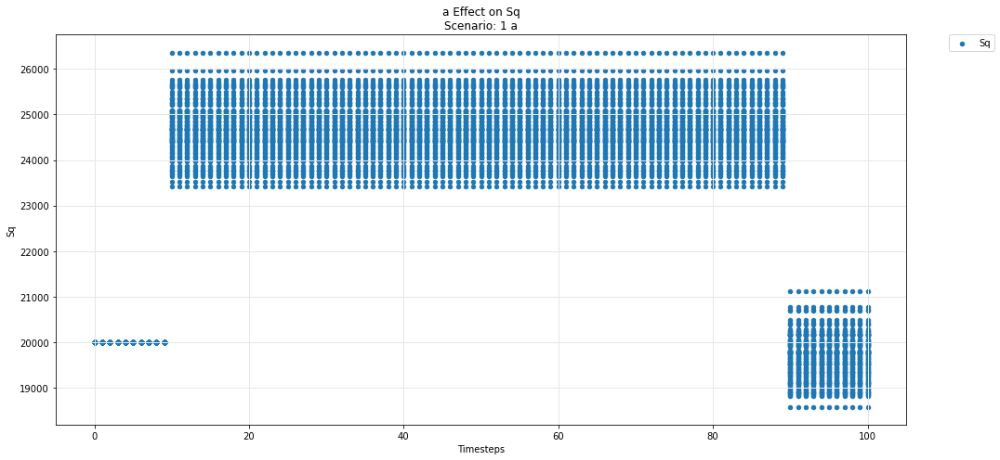

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

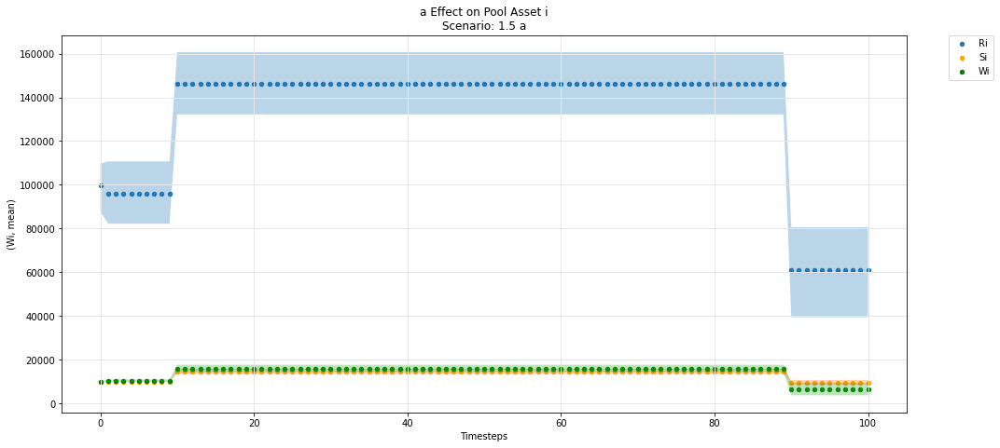

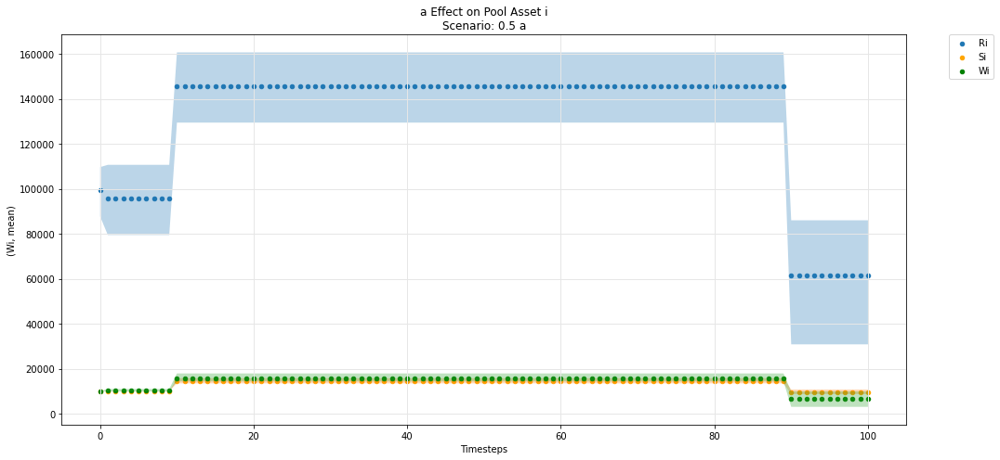

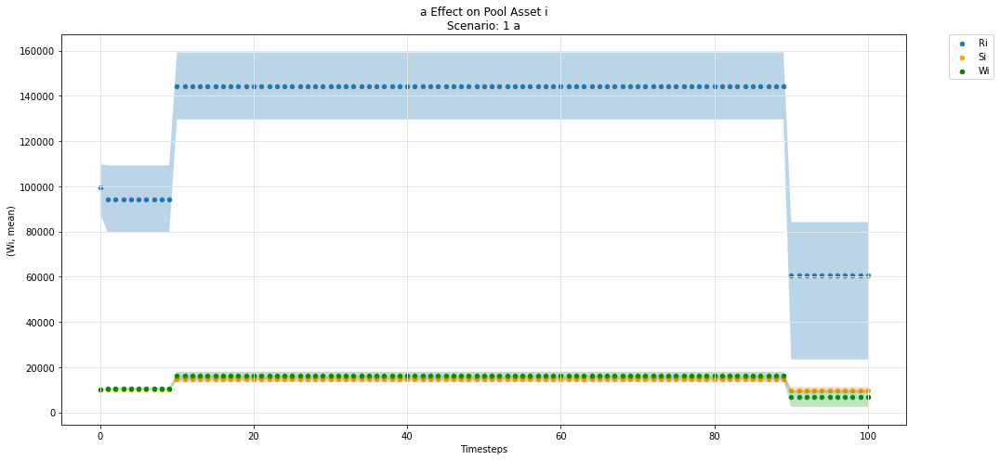

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

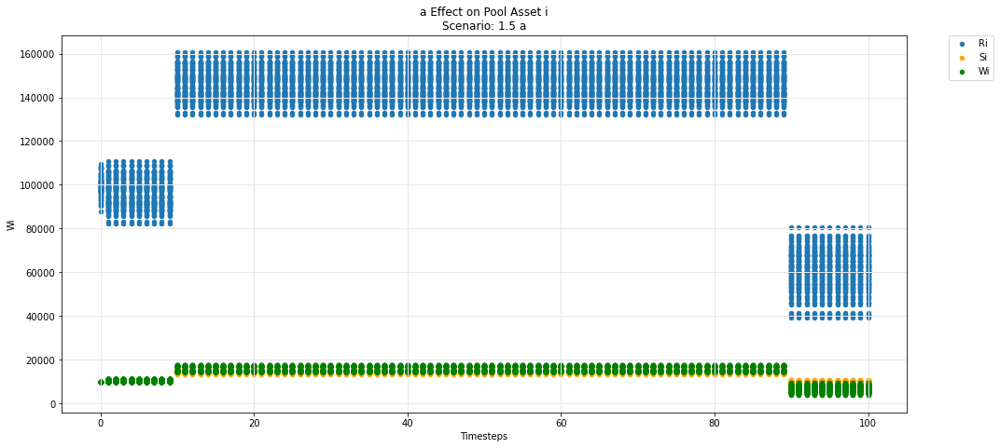

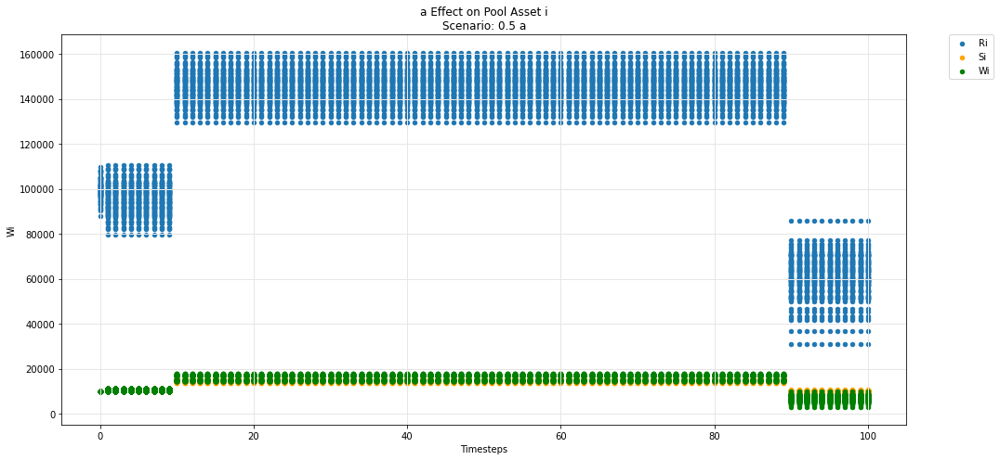

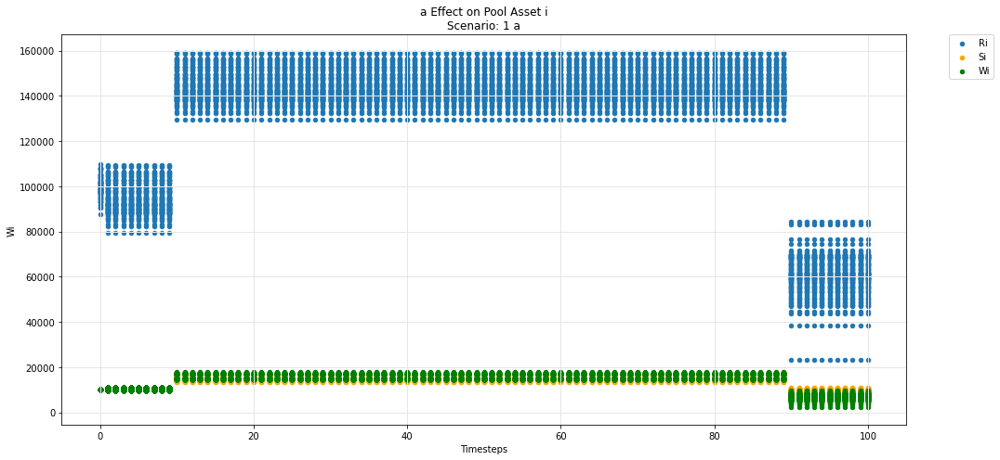

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

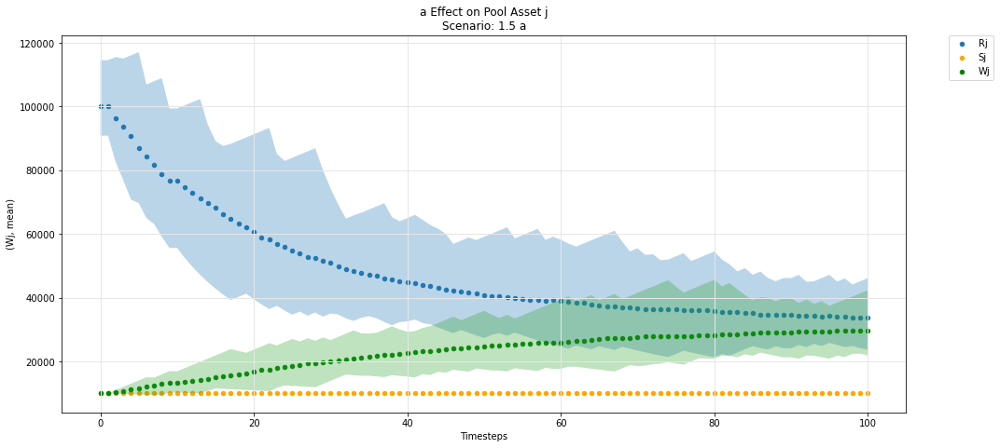

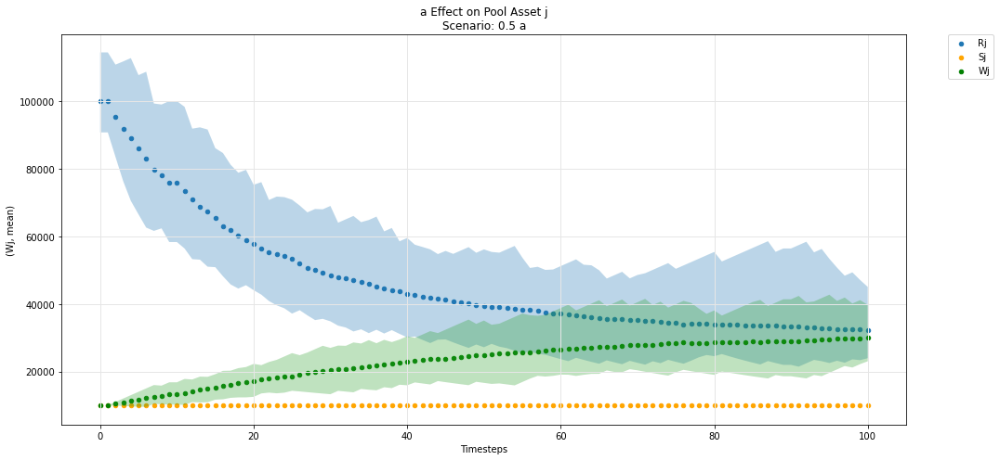

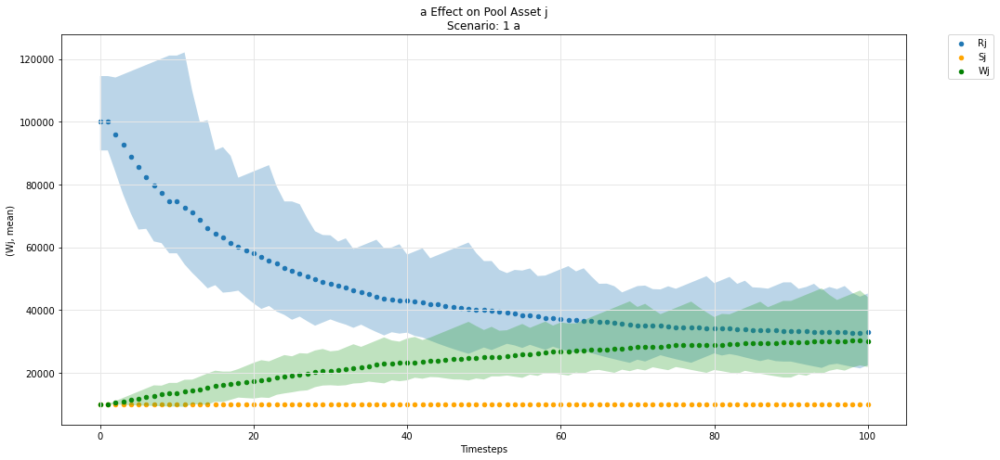

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

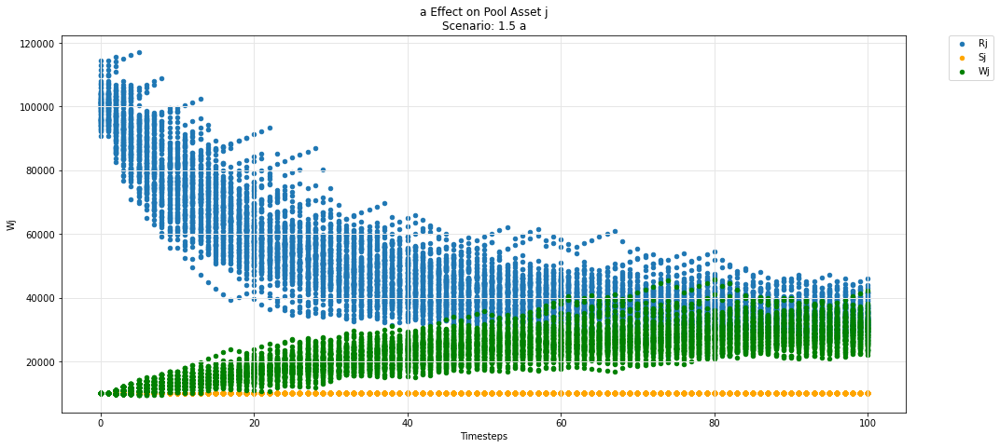

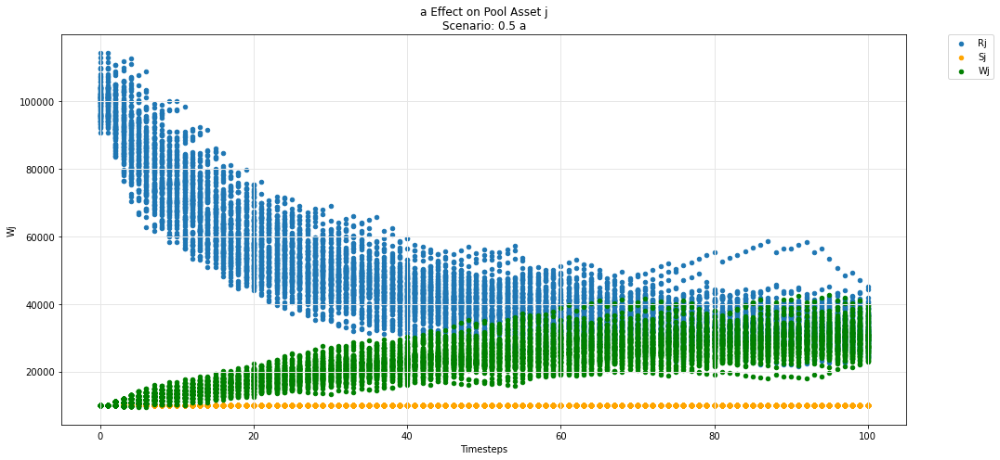

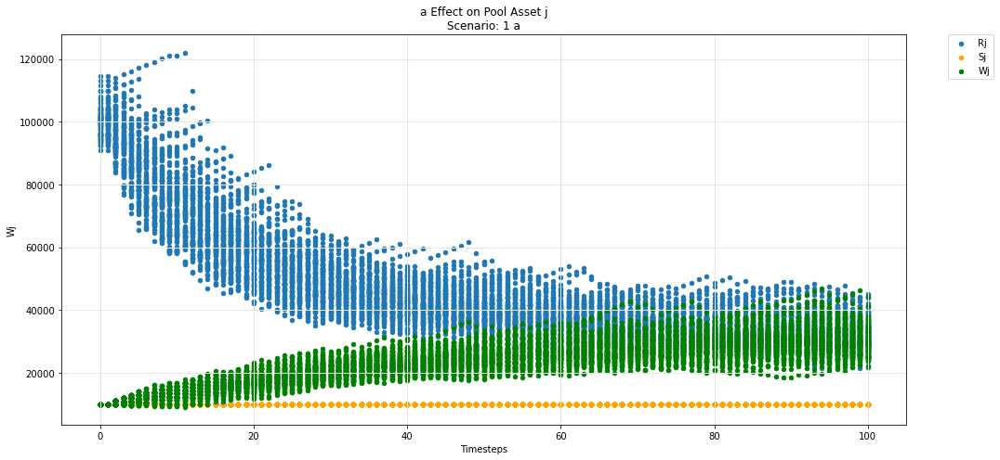

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

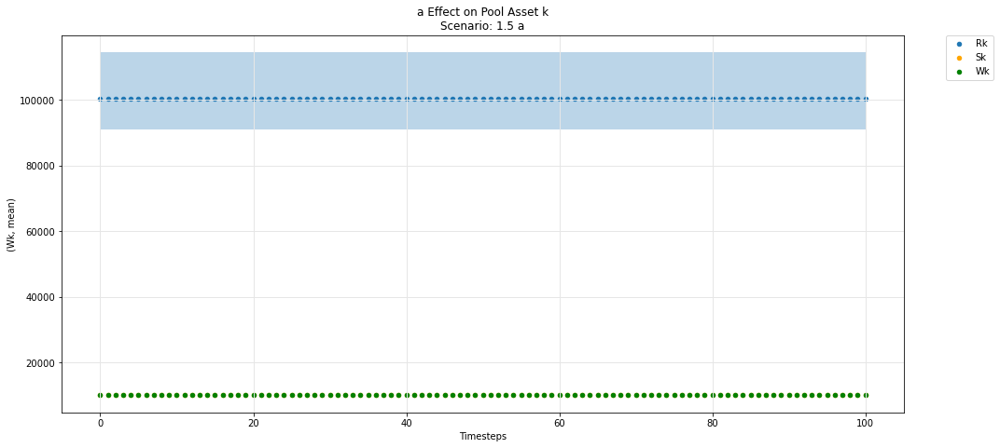

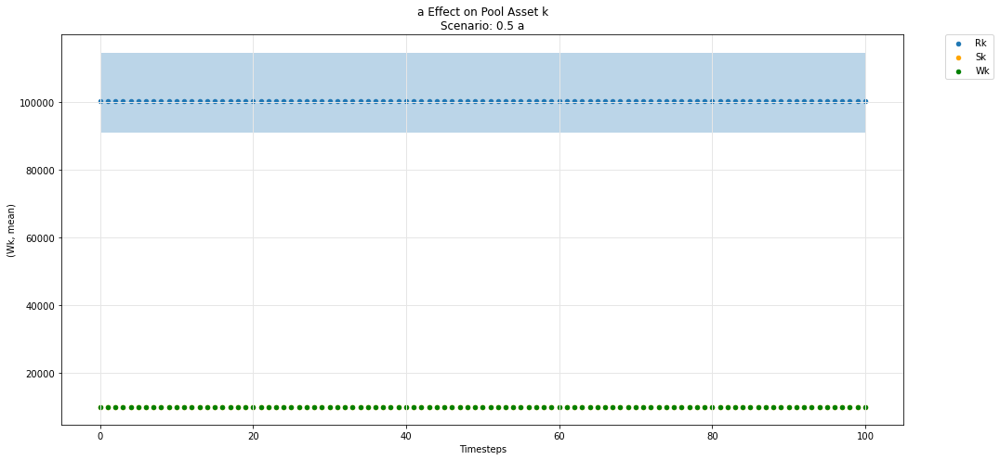

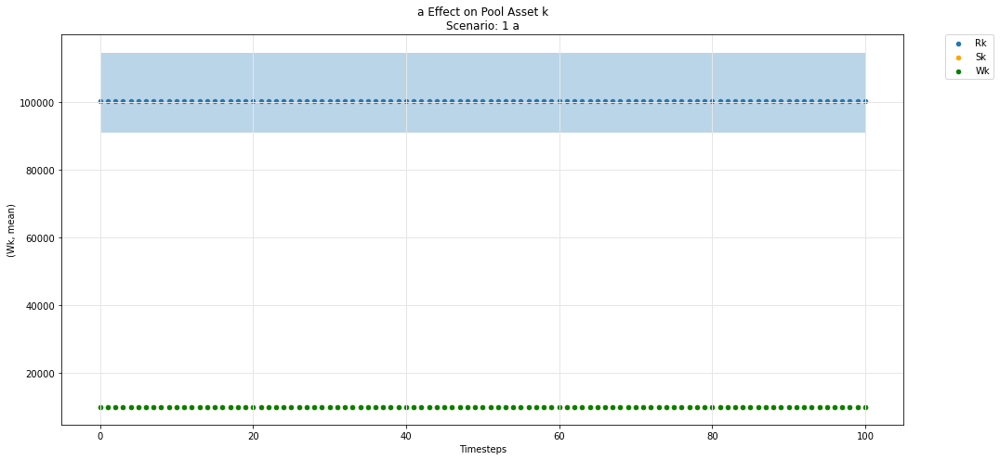

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

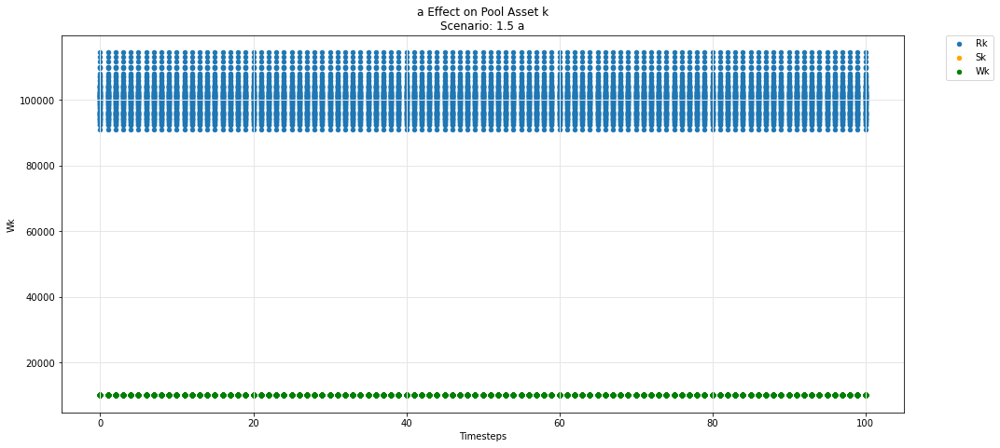

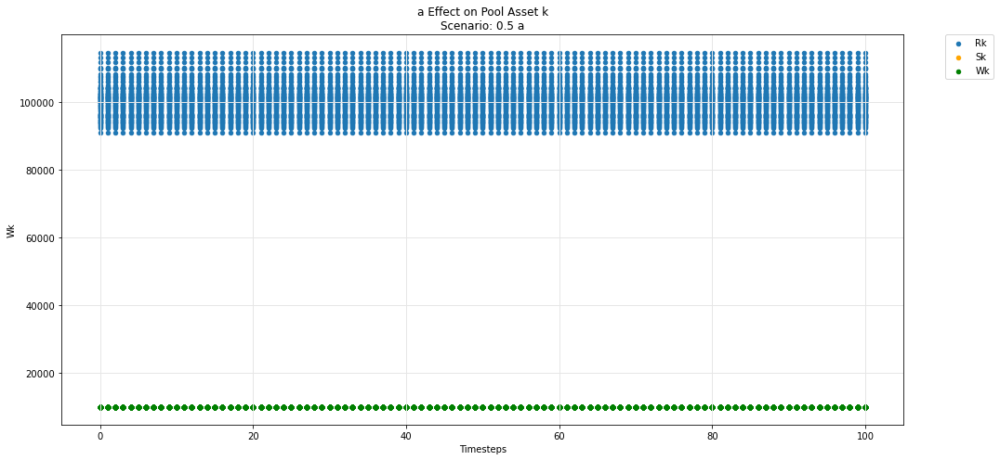

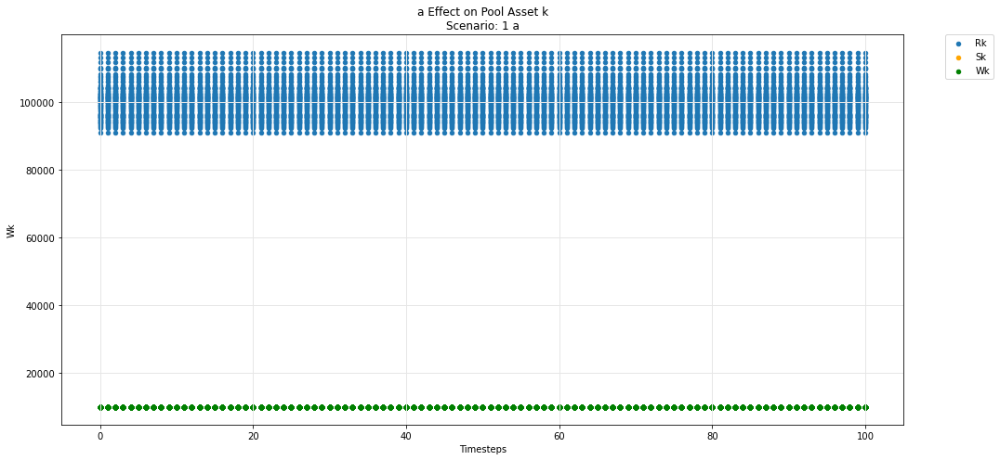

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

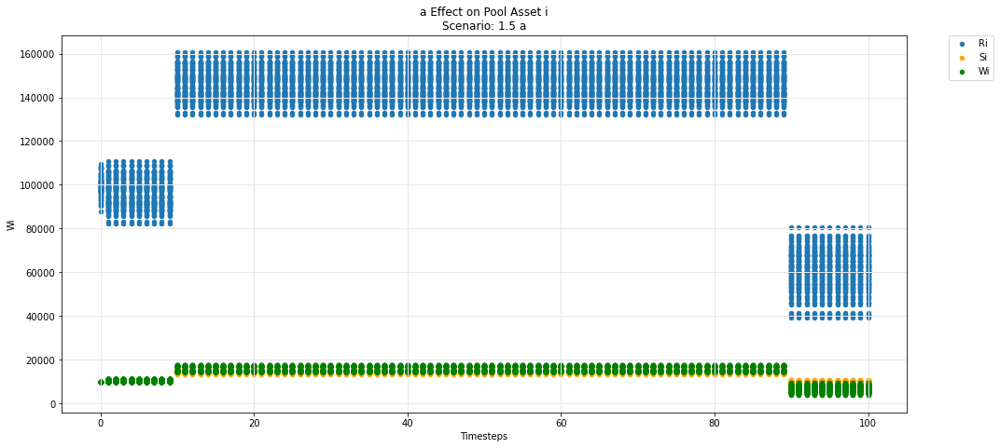

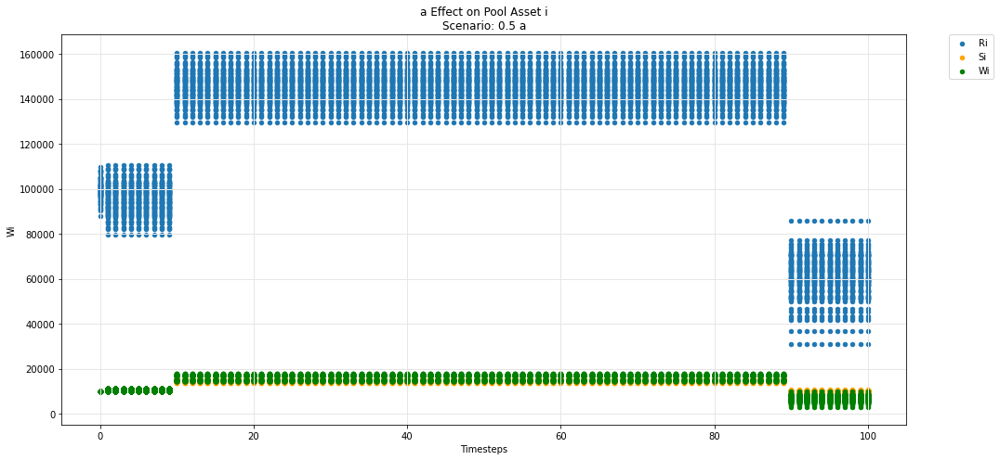

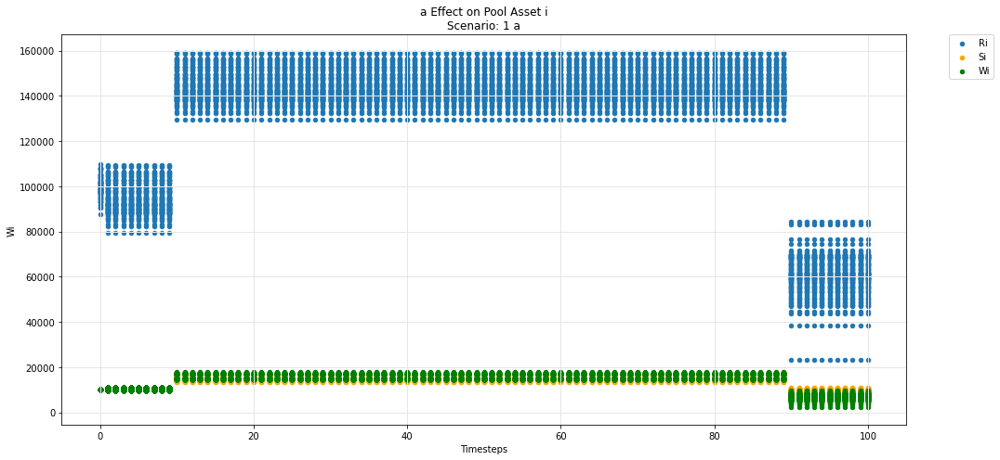

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

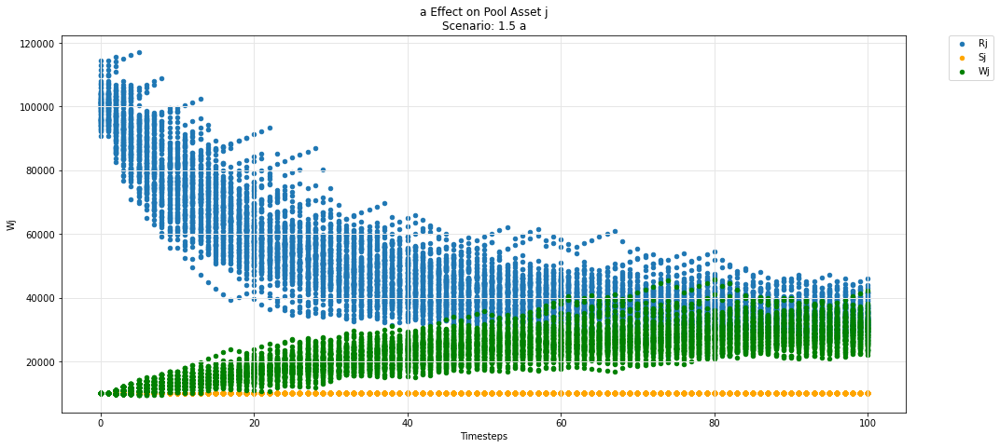

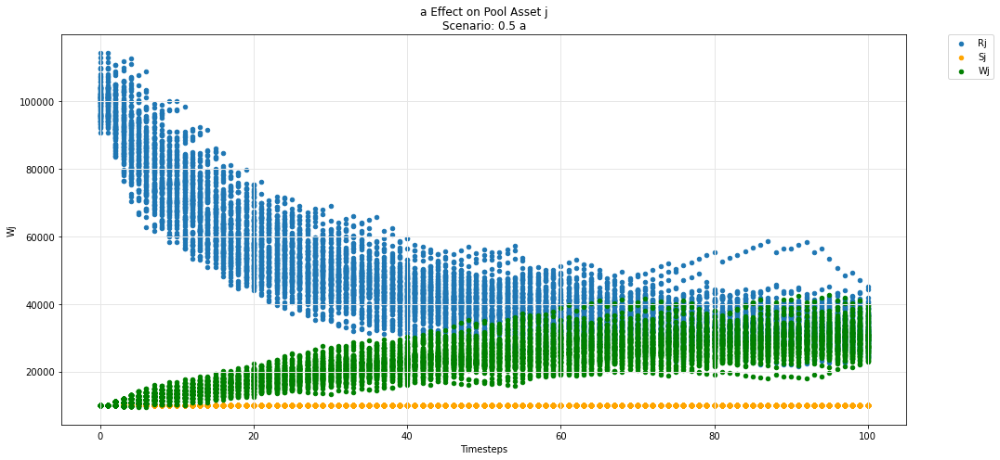

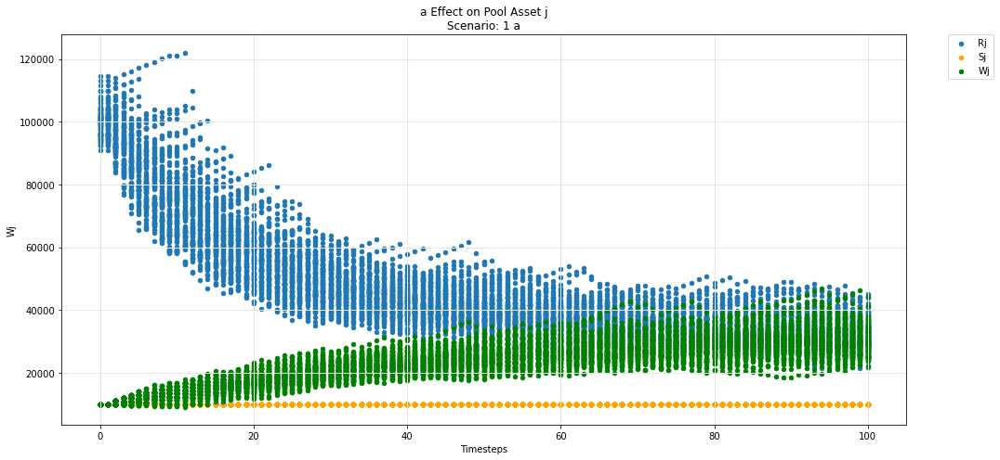

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

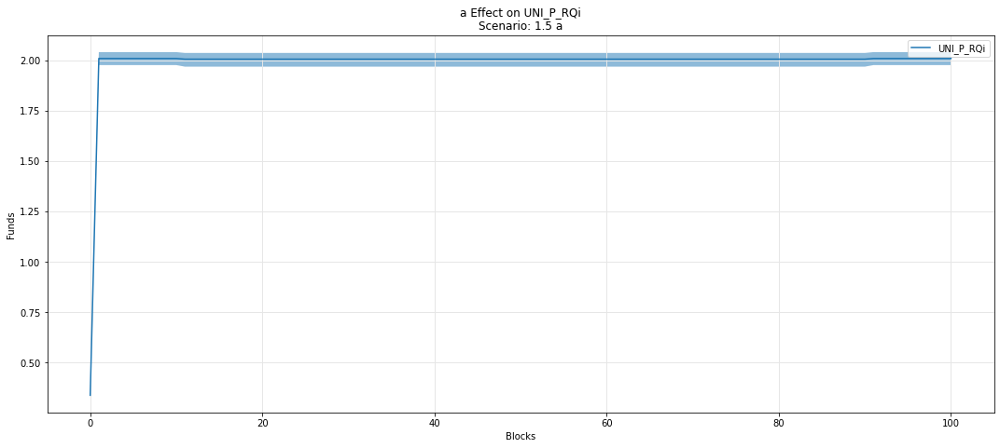

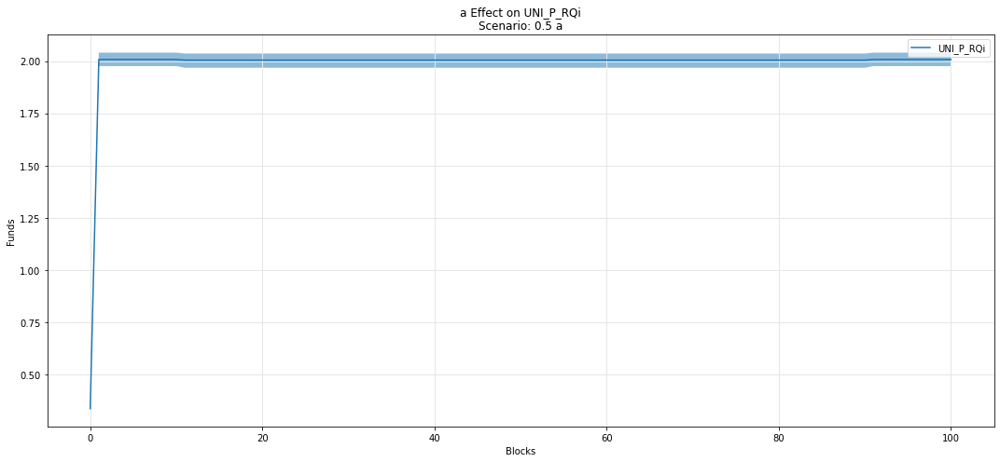

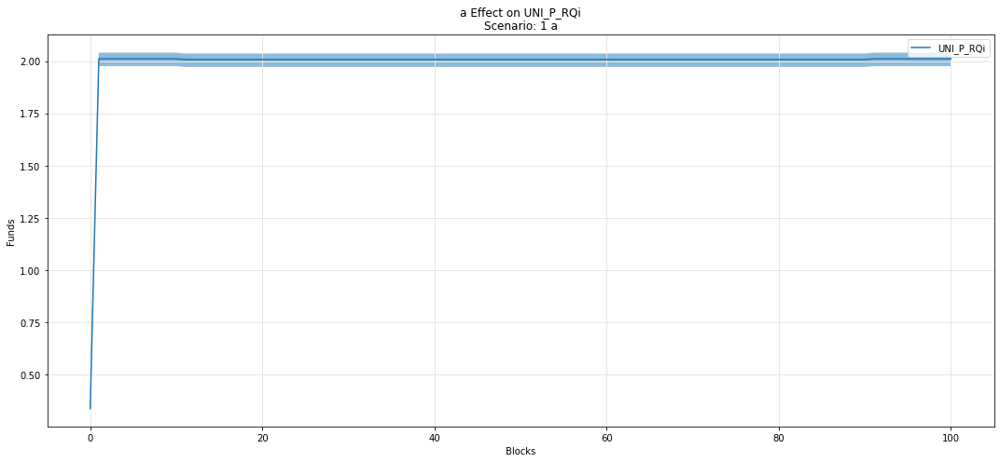

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

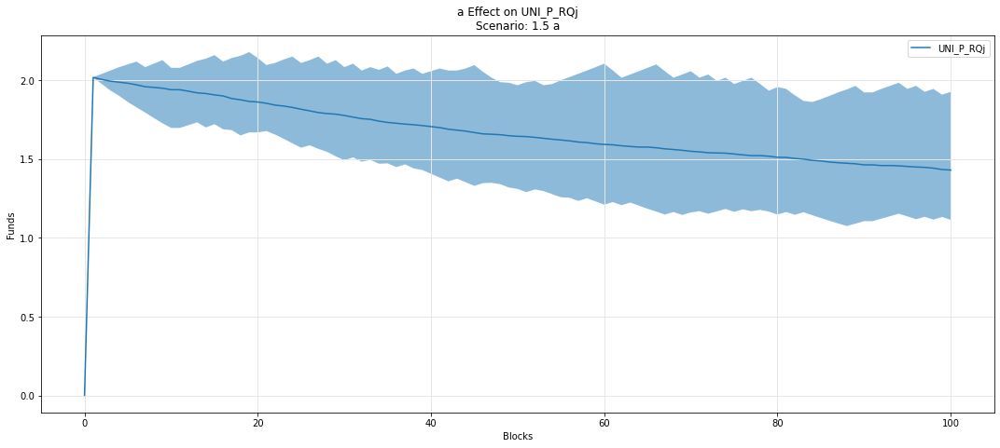

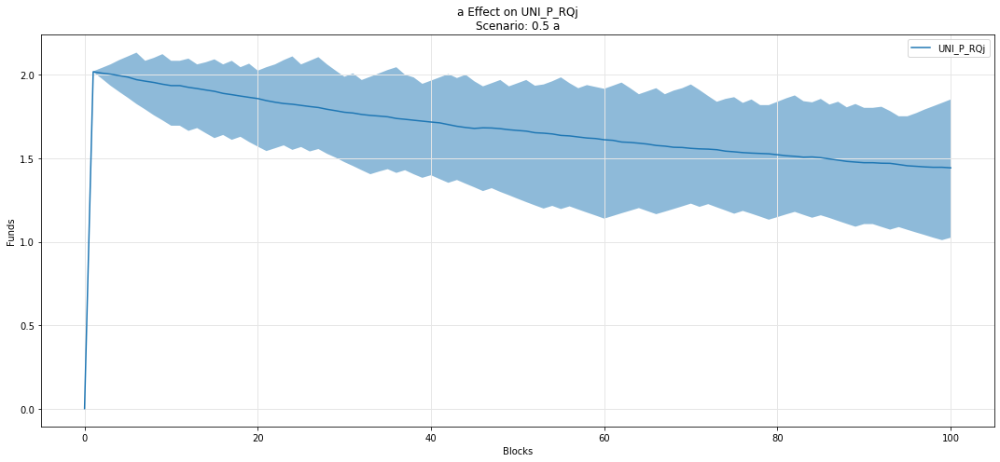

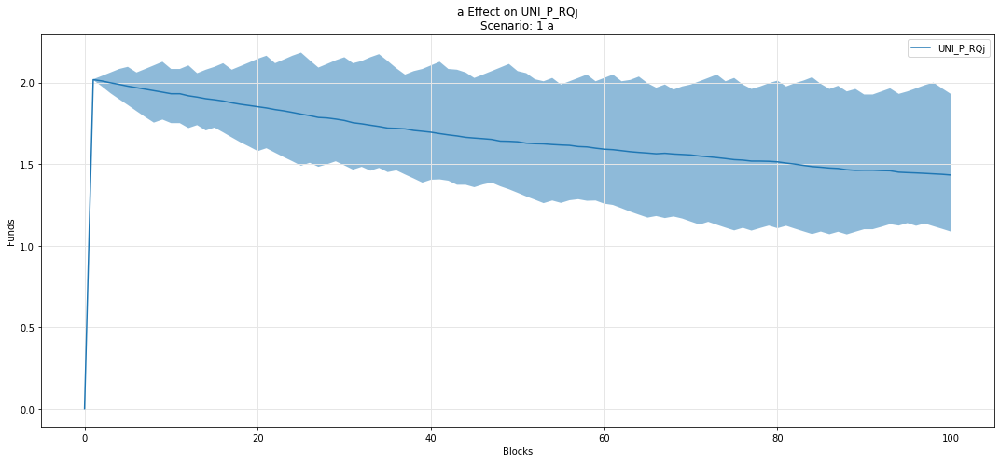

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

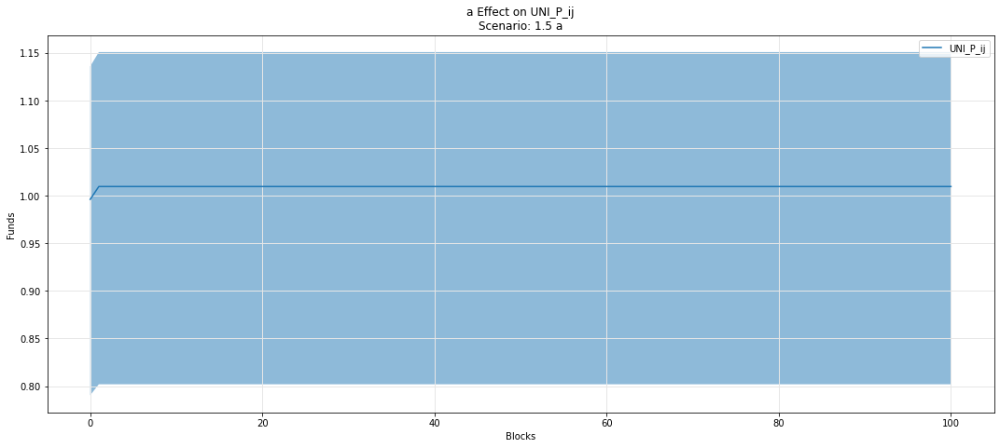

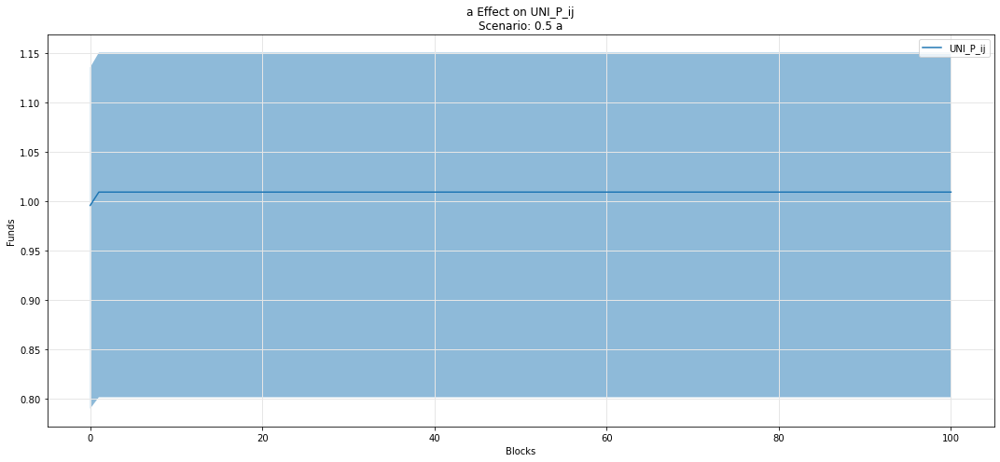

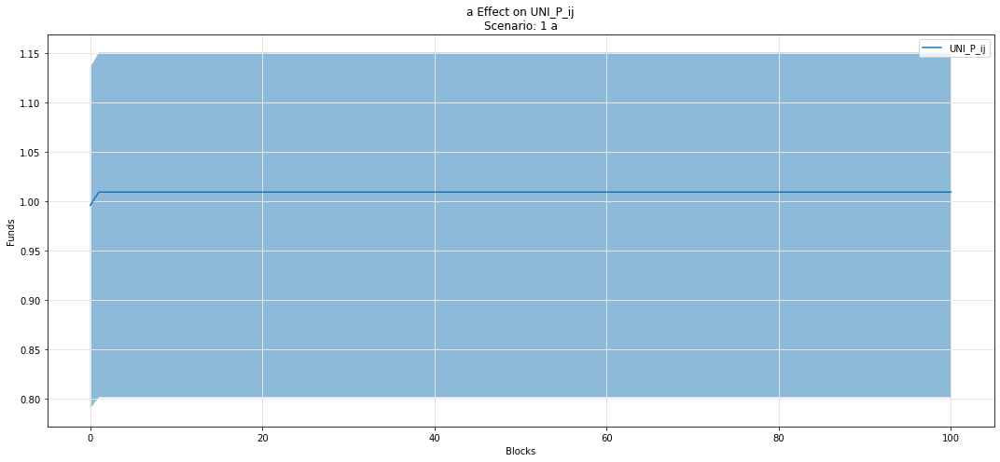

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

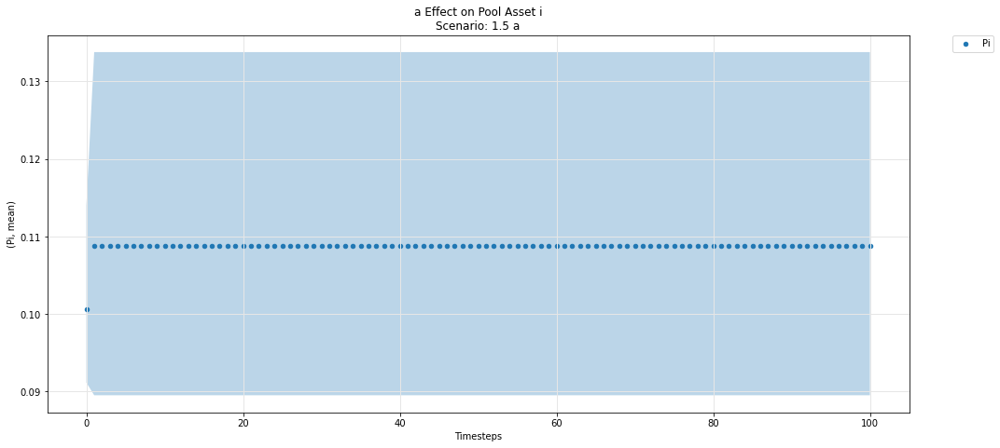

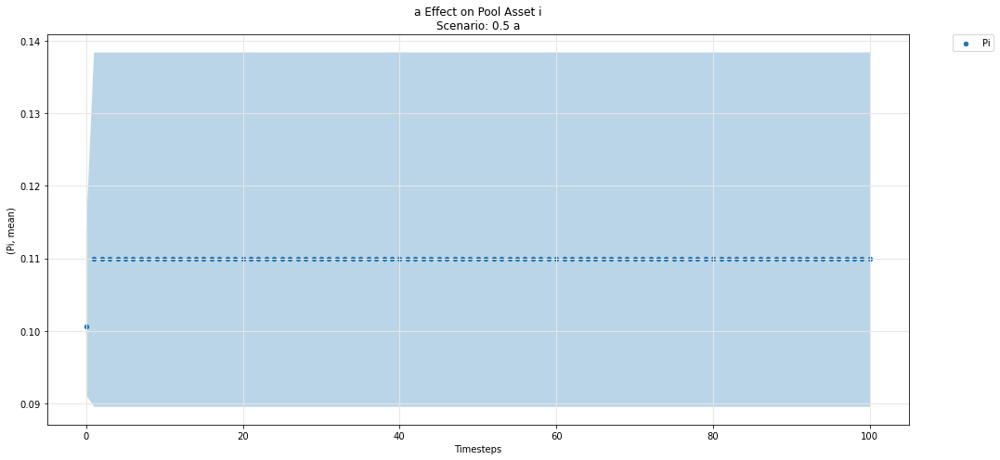

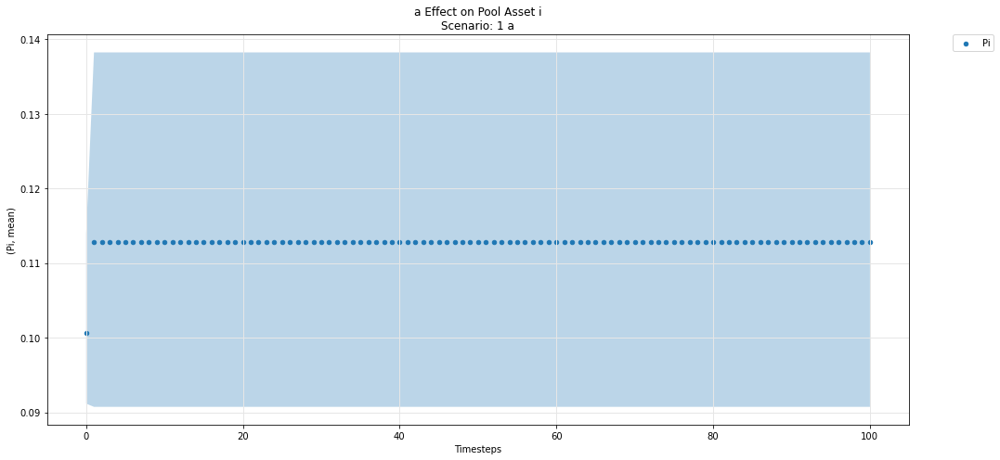

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

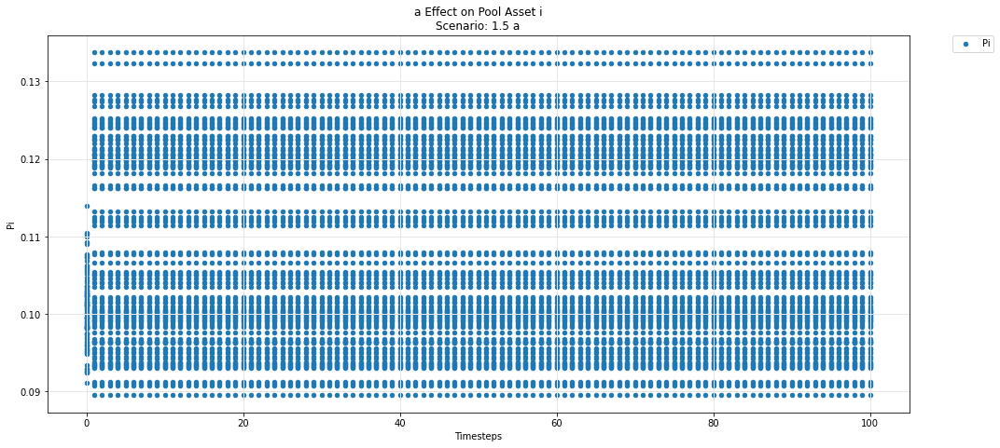

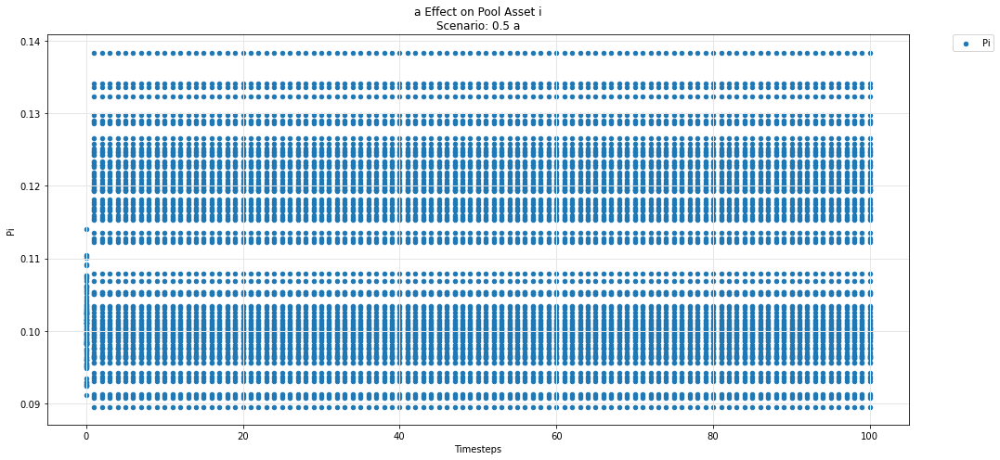

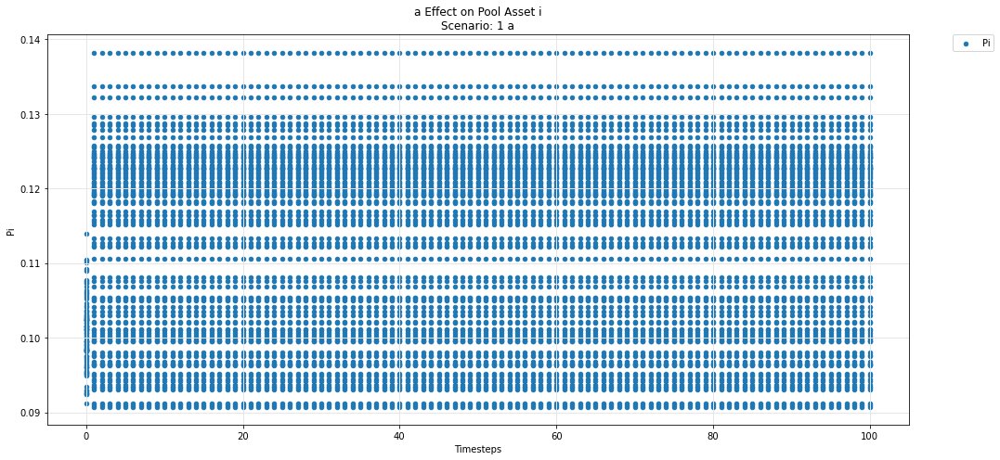

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

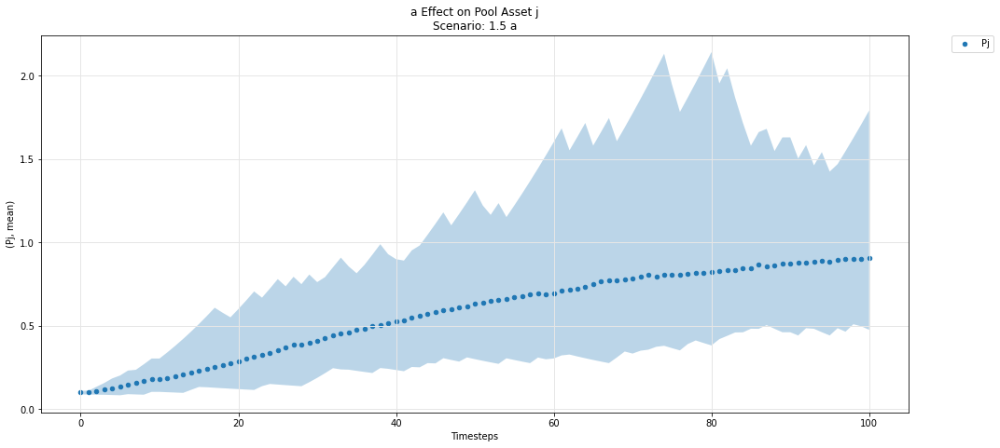

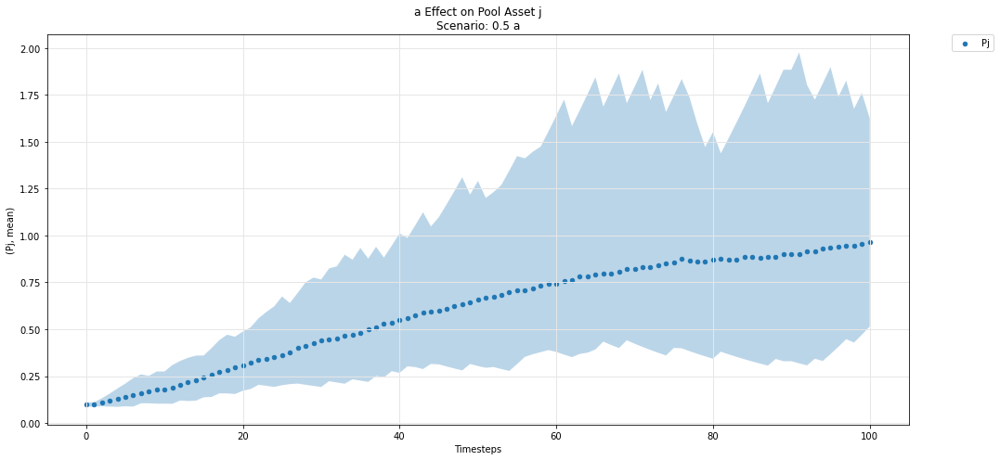

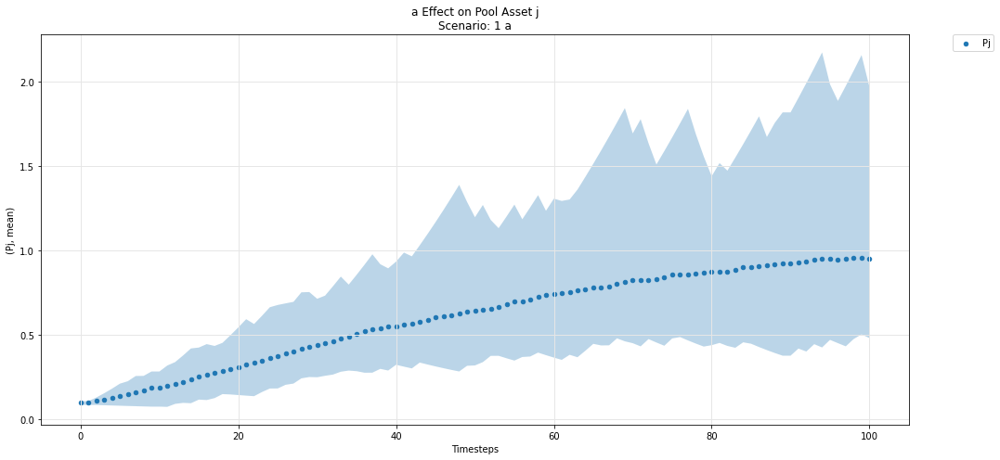

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

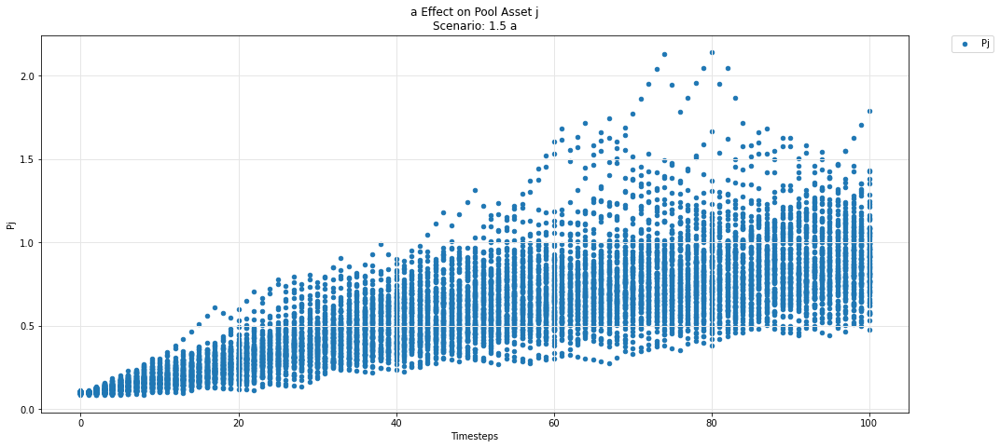

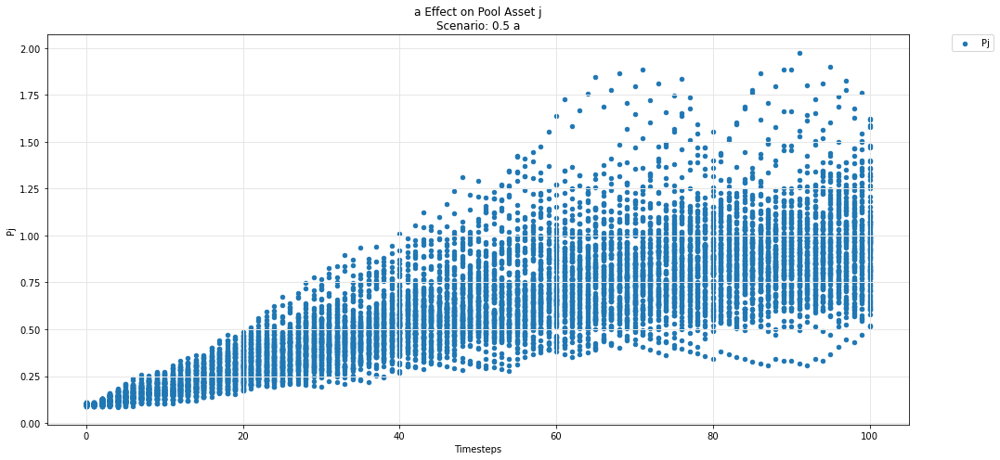

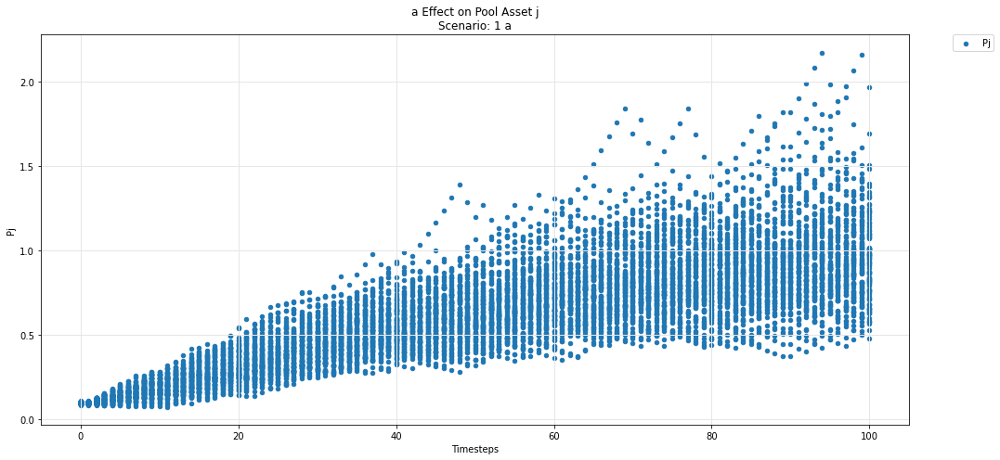

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

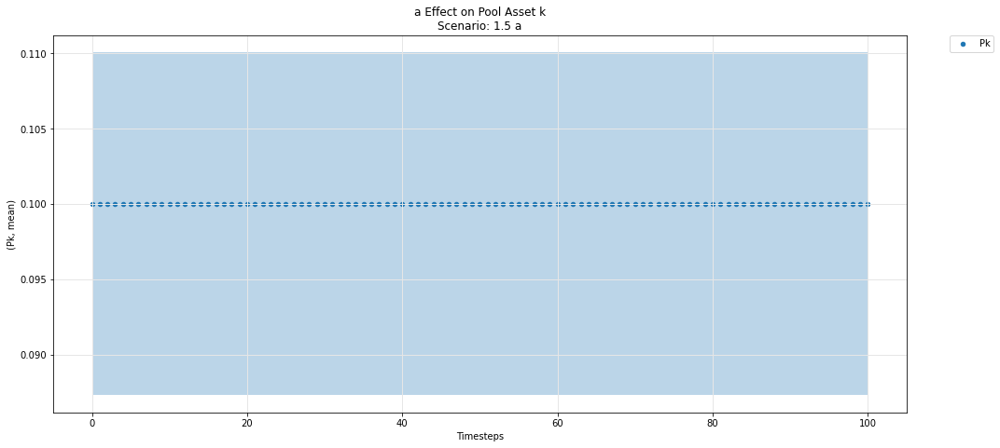

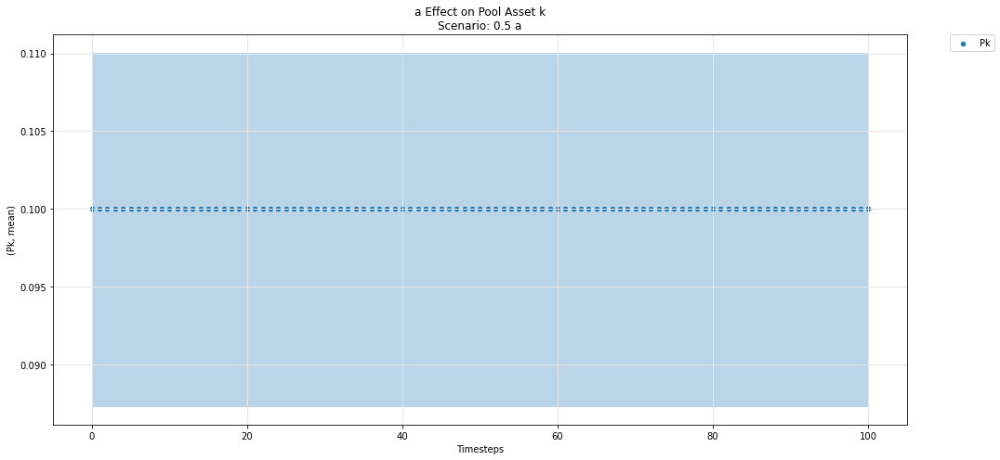

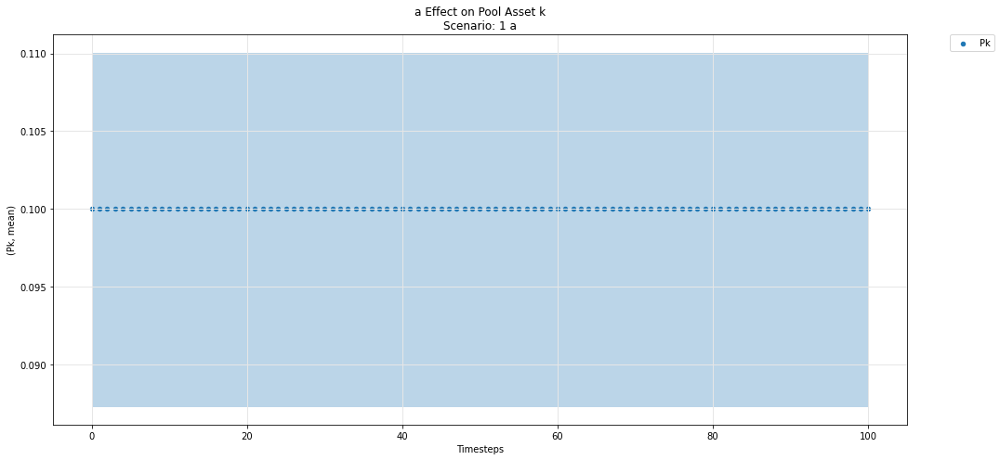

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

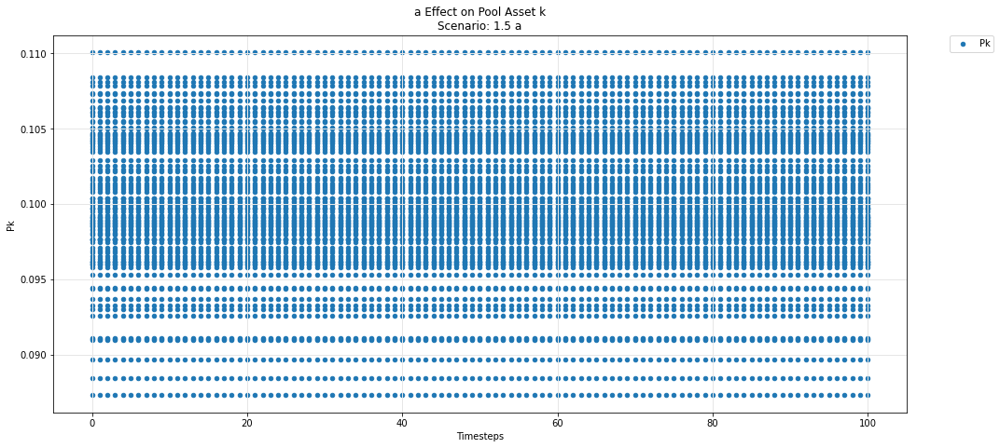

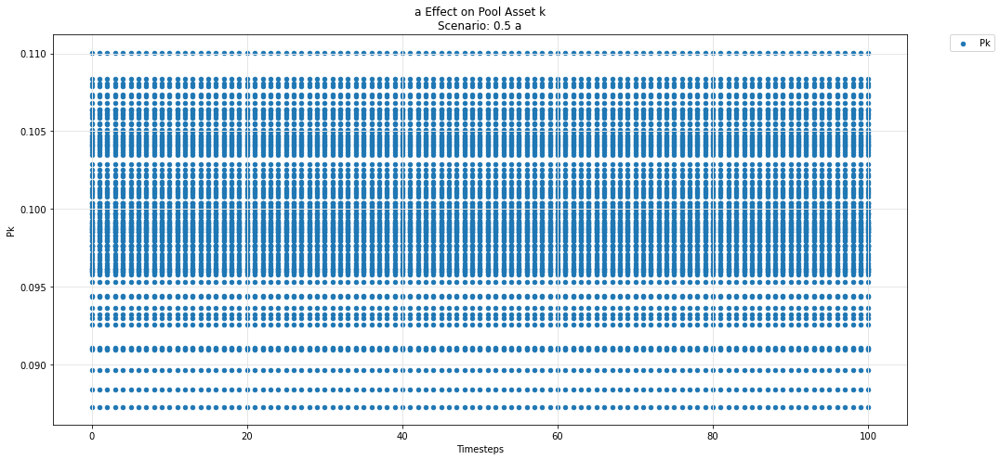

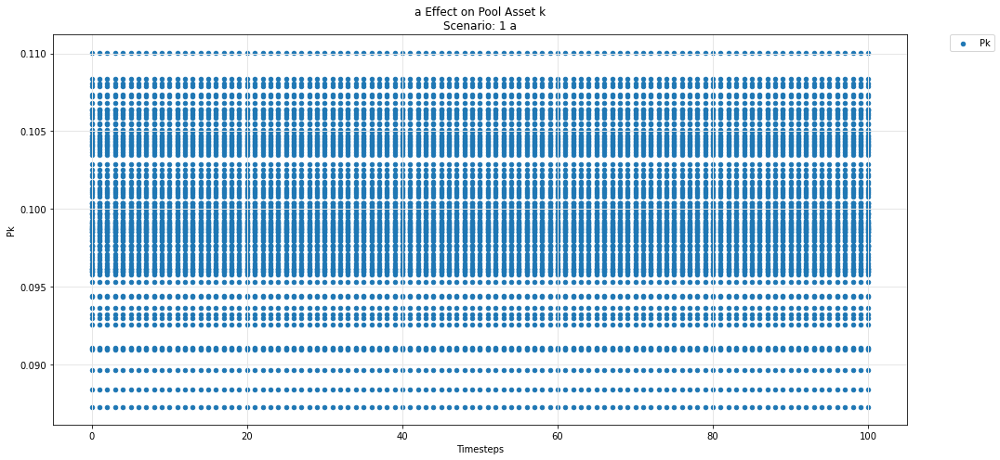

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')